In [1]:
import neutromeratio
import pickle
from neutromeratio.constants import kT
import pandas as pd
from simtk import unit
from neutromeratio.plotting import plot_correlation_analysis
import matplotlib.pyplot as plt
import numpy as np
from rdkit import Chem
from rdkit.Chem import AllChem

_ColormakerRegistry()

[utils.py:141 - _init_num_threads()] NumExpr defaulting to 8 threads.


In [3]:
def test():
    return (1,2 ), 3

In [5]:
a = test()

In [7]:
a[0]

(1, 2)

In [2]:
results = pickle.load(open('../data/results/combined_results_in_kT.pickle', 'rb'))
results.index

Index(['EXPERIMENT_solv', 'ANI1ccx_vacuum_alchemical_dG',
       'ANI1ccx_vacuum_minimum_dE', 'ANI1ccx_vacuum_single_conf_dG',
       'ANI1ccx_vacuum_mining_minima_dG', 'DFT_vac_minimum_dG',
       'DFT_solv_minimum_dG', 'DFT_vac_mining_minima_dG',
       'DFT_solv_mining_minima_dG'],
      dtype='object')

In [39]:
def _remove_hydrogens(m:Chem.Mol):

    """Removing all hydrogens from the molecule with a few exceptions""" 

    #########################################
    # search for important hydrogens
    #########################################
    keep_hydrogens = []
    print('search for patterns ...')
    # test for primary alcohol
    patt = Chem.MolFromSmarts('[OX2H]')   
    if m.HasSubstructMatch(patt):
        print('found primary alcohol')
        l = m.GetSubstructMatch(patt)
        keep_hydrogens.extend(l)

    # test for imine
    patt = Chem.MolFromSmarts('[CX3]=[NH]')
    if m.HasSubstructMatch(patt):
        print('found imine')
        l = m.GetSubstructMatch(patt)
        keep_hydrogens.extend(l)
        
    # test for primary amine
    patt = Chem.MolFromSmarts('[NX3;H2]')
    if m.HasSubstructMatch(patt):
        print('found primary amine')
        l = m.GetSubstructMatch(patt)
        keep_hydrogens.extend(l)

    # test for secondary amine
    patt = Chem.MolFromSmarts('[NX3H]')
    if m.HasSubstructMatch(patt):
        print('found secondary amine')
        l = m.GetSubstructMatch(patt)
        keep_hydrogens.extend(l)
        
        
        
    # test for cyanamide
    patt = Chem.MolFromSmarts('[NX3][CX2]#[NX1]')
    if m.HasSubstructMatch(patt):
        print('found cyanamide')
        l = m.GetSubstructMatch(patt)
        keep_hydrogens.extend(l)

    # test for thiol
    patt = Chem.MolFromSmarts('[#16X2H]')
    if m.HasSubstructMatch(patt):
        print('found thiol')
        l = m.GetSubstructMatch(patt)
        keep_hydrogens.extend(l)


    # unfortunatelly, RemoveHs() does not retain marked hydrogens
    # therefore, mutating important Hs to Li and then remutating them 
    # to Hs
    if keep_hydrogens:
        for idx in set(keep_hydrogens):
            atom = m.GetAtomWithIdx(idx)
            for neighbor in atom.GetNeighbors():
                if neighbor.GetSymbol() == 'H':
                    hydrogen = m.GetAtomWithIdx(neighbor.GetIdx())
                    hydrogen.SetAtomicNum(3)

        m = Chem.RemoveHs(m)
        for atom in m.GetAtoms():
            if atom.GetSymbol() == 'Li':
                hydrogen = m.GetAtomWithIdx(atom.GetIdx())
                #hydrogen.SetAtomicNum(1)
    else:
        m = Chem.RemoveHs(m)
    neutromeratio.display_mol(m)
    print(Chem.MolToPDBBlock(m))

#################
#################
search for patterns ...
found primary alcohol


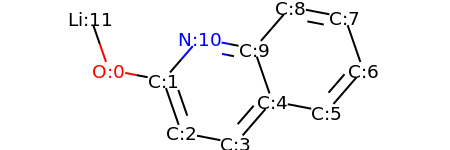

HETATM    1  O1  UNL     1      -3.437  -0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.964  -0.283   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.473  -1.701   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.000  -1.984   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.982  -0.850   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.455  -1.134   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.437   0.000   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.946   1.417   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       1.473   1.701   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       0.491   0.567   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1      -0.982   0.850   0.000  1.00  0.00           N  
HETATM   12 LI1  UNL     1      -3.928   1.417   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

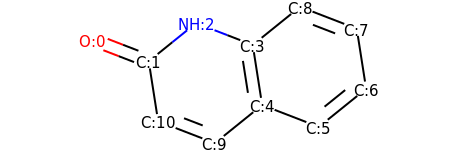

HETATM    1  O1  UNL     1      -3.711   0.800   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.312   0.259   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.144   1.201   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.255   0.661   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.487  -0.821   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.886  -1.361   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.054  -0.419   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.822   1.063   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.423   1.603   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -0.680  -1.763   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.080  -1.223   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6   10

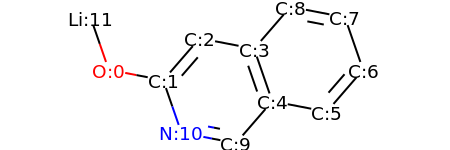

HETATM    1  O1  UNL     1      -3.437   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.964  -0.283   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.982   0.850   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.491   0.567   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.982  -0.850   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.455  -1.134   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.437  -0.000   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.946   1.417   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       1.473   1.701   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -0.000  -1.984   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1      -1.473  -1.701   0.000  1.00  0.00           N  
HETATM   12 LI1  UNL     1      -3.928   1.417   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

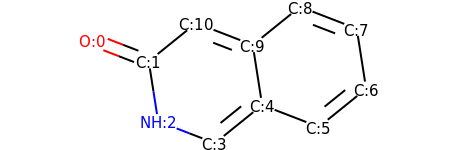

HETATM    1  O1  UNL     1      -3.711   0.800   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.312   0.259   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.080  -1.223   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.680  -1.763   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.487  -0.821   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.886  -1.361   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.054  -0.419   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.822   1.063   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.423   1.603   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.255   0.661   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -1.144   1.201   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4
CONECT    4    5    5
CONECT    5    6   10
CONE

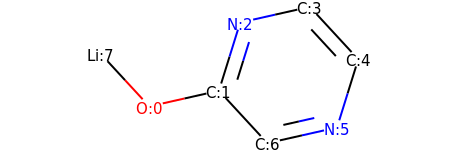

HETATM    1  O1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.159   1.129   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.305   1.459   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.322   0.357   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1       1.876  -1.075   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       0.413  -1.405   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


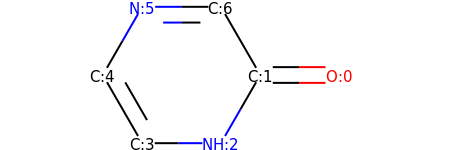

HETATM    1  O1  UNL     1       2.571   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.321  -1.299   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.179  -1.299   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.929   0.000   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -1.179   1.299   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found primary alcohol


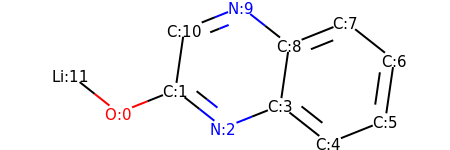

HETATM    1  O1  UNL     1      -3.295  -0.849   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.902  -0.293   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.724  -1.221   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.669  -0.665   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.847  -1.594   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       3.240  -1.038   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.456   0.446   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.278   1.375   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.884   0.819   0.000  1.00  0.00           C  
HETATM   10  N2  UNL     1      -0.294   1.748   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -1.687   1.192   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -4.473   0.080   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

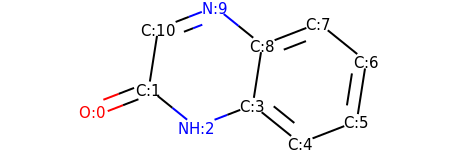

HETATM    1  O1  UNL     1      -3.711  -0.800   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.312  -0.259   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.144  -1.201   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.255  -0.661   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.423  -1.603   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.822  -1.063   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.054   0.419   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.886   1.361   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.487   0.821   0.000  1.00  0.00           C  
HETATM   10  N2  UNL     1      -0.680   1.763   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -2.080   1.223   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6
CONE

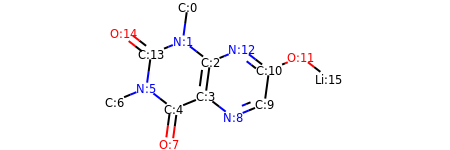

HETATM    1  C1  UNL     1      -0.825   2.997   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -1.025   1.510   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       0.162   0.593   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.039  -0.893   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.426  -1.463   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -2.613  -0.546   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1      -4.001  -1.116   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -1.627  -2.950   0.000  1.00  0.00           O  
HETATM    9  N3  UNL     1       1.148  -1.810   0.000  1.00  0.00           N  
HETATM   10  C6  UNL     1       2.536  -1.241   0.000  1.00  0.00           C  
HETATM   11  C7  UNL     1       2.737   0.246   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1       4.124   0.815   0.000  1.00  0.00           O  
HETATM   13  N4  UNL     1  

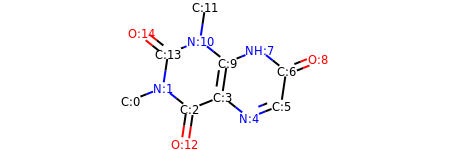

HETATM    1  C1  UNL     1      -3.661  -1.075   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -2.266  -0.524   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -1.091  -1.456   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.304  -0.904   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       1.479  -1.836   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       2.874  -1.285   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.094   0.199   0.000  1.00  0.00           C  
HETATM    8  N3  UNL     1       1.918   1.131   0.000  1.00  0.00           N  
HETATM    9  O1  UNL     1       4.488   0.751   0.000  1.00  0.00           O  
HETATM   10  C6  UNL     1       0.524   0.580   0.000  1.00  0.00           C  
HETATM   11  N4  UNL     1      -0.652   1.512   0.000  1.00  0.00           N  
HETATM   12  C7  UNL     1      -0.432   2.996   0.000  1.00  0.00           C  
HETATM   13  O2  UNL     1  

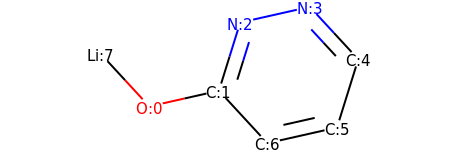

HETATM    1  O1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.159   1.129   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1       1.305   1.459   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       2.322   0.357   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.876  -1.075   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.413  -1.405   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


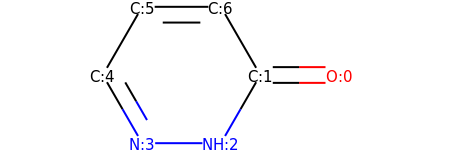

HETATM    1  O1  UNL     1       2.571   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.321  -1.299   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -1.179  -1.299   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -1.929   0.000   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1      -1.179   1.299   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found primary alcohol


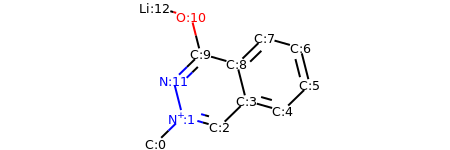

HETATM    1  C1  UNL     1      -2.728  -2.656   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -1.653  -1.610   0.000  1.00  0.00           N1+
HETATM    3  C2  UNL     1      -0.210  -2.017   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.865  -0.971   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.308  -1.378   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.383  -0.332   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.014   1.122   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.571   1.529   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       0.496   0.483   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -0.948   0.890   0.000  1.00  0.00           C  
HETATM   11  O1  UNL     1      -1.316   2.344   0.000  1.00  0.00           O  
HETATM   12  N2  UNL     1      -2.022  -0.156   0.000  1.00  0.00           N  
HETATM   13 LI1  UNL     1  

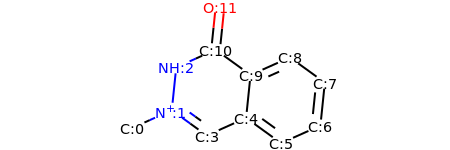

HETATM    1  C1  UNL     1      -3.612  -1.261   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -2.243  -0.648   0.000  1.00  0.00           N1+
HETATM    3  N2  UNL     1      -2.090   0.844   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.028  -1.528   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.341  -0.915   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.556  -1.794   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.925  -1.181   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.079   0.311   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.864   1.190   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.495   0.577   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -0.720   1.457   0.000  1.00  0.00           C  
HETATM   12  O1  UNL     1      -0.567   2.949   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2

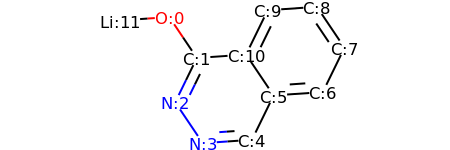

HETATM    1  O1  UNL     1      -2.170   1.477   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.332   0.233   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.990  -1.115   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -1.152  -2.359   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       0.344  -2.255   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.003  -0.907   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       2.499  -0.803   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.157   0.544   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.319   1.789   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       0.823   1.685   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       0.165   0.337   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -3.666   1.373   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

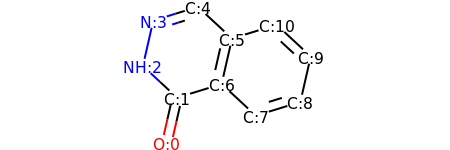

HETATM    1  O1  UNL     1      -1.758  -2.396   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.424  -0.934   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.524   0.086   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -2.191   1.549   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -0.757   1.991   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       0.343   0.971   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.009  -0.492   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       1.109  -1.512   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.542  -1.069   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       2.876   0.393   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       1.776   1.413   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT   

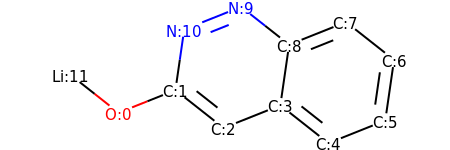

HETATM    1  O1  UNL     1      -3.295  -0.849   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.902  -0.293   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.724  -1.221   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.669  -0.665   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.847  -1.594   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.240  -1.038   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.456   0.446   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.278   1.375   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       0.884   0.819   0.000  1.00  0.00           C  
HETATM   10  N1  UNL     1      -0.294   1.748   0.000  1.00  0.00           N  
HETATM   11  N2  UNL     1      -1.687   1.192   0.000  1.00  0.00           N  
HETATM   12 LI1  UNL     1      -4.473   0.080   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

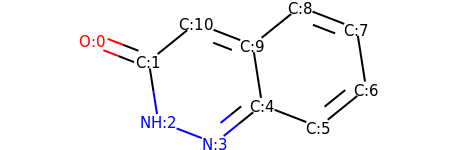

HETATM    1  O1  UNL     1      -3.711   0.800   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.312   0.259   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.080  -1.223   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.680  -1.763   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       0.487  -0.821   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.886  -1.361   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       3.054  -0.419   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       2.822   1.063   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       1.423   1.603   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       0.255   0.661   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1      -1.144   1.201   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4
CONECT    4    5    5
CONECT    5    6   10
CONE

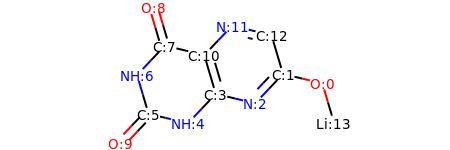

HETATM    1  O1  UNL     1       3.924  -0.178   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       2.465   0.172   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.433  -0.916   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.026  -0.566   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.058  -1.654   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -2.517  -1.304   0.000  1.00  0.00           C  
HETATM    7  N3  UNL     1      -2.943   0.134   0.000  1.00  0.00           N  
HETATM    8  C4  UNL     1      -1.910   1.222   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1      -2.336   2.660   0.000  1.00  0.00           O  
HETATM   10  O3  UNL     1      -3.549  -2.392   0.000  1.00  0.00           O  
HETATM   11  C5  UNL     1      -0.452   0.872   0.000  1.00  0.00           C  
HETATM   12  N4  UNL     1       0.581   1.960   0.000  1.00  0.00           N  
HETATM   13  C6  UNL     1  

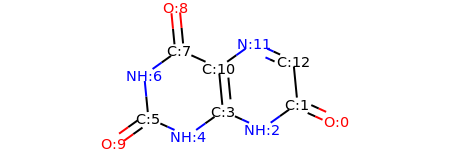

HETATM    1  O1  UNL     1       4.123  -1.107   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       2.758  -0.486   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.537  -1.358   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.172  -0.737   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.049  -1.609   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -2.414  -0.988   0.000  1.00  0.00           C  
HETATM    7  N3  UNL     1      -2.559   0.505   0.000  1.00  0.00           N  
HETATM    8  C4  UNL     1      -1.338   1.377   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1      -1.483   2.870   0.000  1.00  0.00           O  
HETATM   10  O3  UNL     1      -3.635  -1.860   0.000  1.00  0.00           O  
HETATM   11  C5  UNL     1       0.027   0.756   0.000  1.00  0.00           C  
HETATM   12  N4  UNL     1       1.248   1.628   0.000  1.00  0.00           N  
HETATM   13  C6  UNL     1  

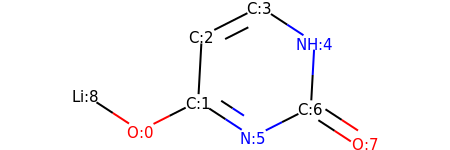

HETATM    1  O1  UNL     1      -2.221  -0.963   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.883  -0.285   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.801   1.213   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.538   1.890   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.794   1.070   0.000  1.00  0.00           N  
HETATM    6  N2  UNL     1       0.373  -1.106   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.711  -0.428   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1       2.967  -1.248   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.477  -0.142   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    6    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...


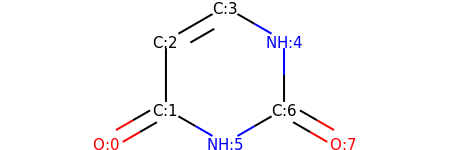

HETATM    1  O1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.299   1.125   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.000   1.875   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.299   1.125   0.000  1.00  0.00           N  
HETATM    6  N2  UNL     1      -0.000  -1.125   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1       2.598  -1.125   0.000  1.00  0.00           O  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


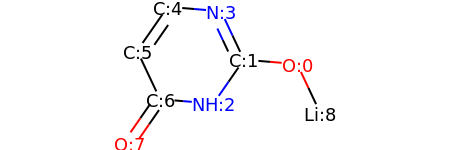

HETATM    1  O1  UNL     1       2.444   0.231   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.949   0.355   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.094  -0.877   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1       0.310   1.712   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -1.185   1.837   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1      -2.040   0.604   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1      -1.401  -0.752   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1      -2.256  -1.985   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1       3.084  -1.126   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    4    4
CONECT    3    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...


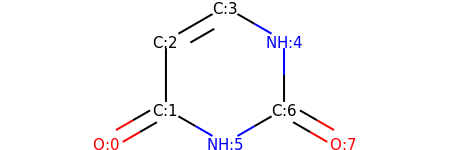

HETATM    1  O1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.299   1.125   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.000   1.875   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.299   1.125   0.000  1.00  0.00           N  
HETATM    6  N2  UNL     1      -0.000  -1.125   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1       2.598  -1.125   0.000  1.00  0.00           O  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


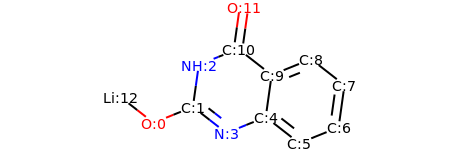

HETATM    1  O1  UNL     1      -3.284  -1.114   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.893  -0.551   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.685   0.935   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.711  -1.473   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       0.680  -0.911   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.862  -1.833   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       3.253  -1.271   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.461   0.215   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.278   1.138   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       0.888   0.575   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1      -0.295   1.498   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1      -0.087   2.983   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

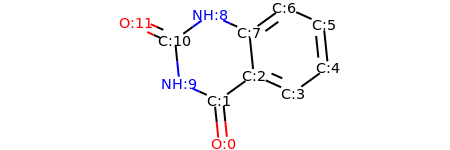

HETATM    1  O1  UNL     1      -0.567  -2.949   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.720  -1.457   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.495  -0.577   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.864  -1.190   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.079  -0.311   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.925   1.181   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.556   1.794   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.341   0.915   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -1.028   1.528   0.000  1.00  0.00           N  
HETATM   10  N2  UNL     1      -2.090  -0.844   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -2.243   0.648   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1      -3.612   1.261   0.000  1.00  0.00           O  
CONECT    1    2    2
CONECT

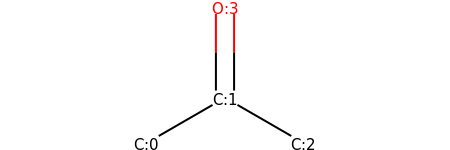

HETATM    1  C1  UNL     1      -1.299  -0.750   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       0.000   0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       1.299  -0.750   0.000  1.00  0.00           C  
HETATM    4  O1  UNL     1       0.000   1.500   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    4    4
END

search for patterns ...
found primary alcohol


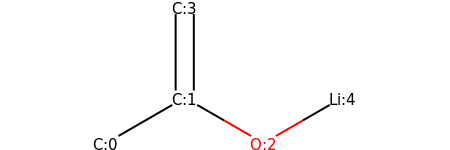

HETATM    1  C1  UNL     1      -1.819  -0.750   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.520   0.000   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       0.779  -0.750   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -0.520   1.500   0.000  1.00  0.00           C  
HETATM    5 LI1  UNL     1       2.078  -0.000   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    4    4
CONECT    3    5
END

#################
#################
search for patterns ...


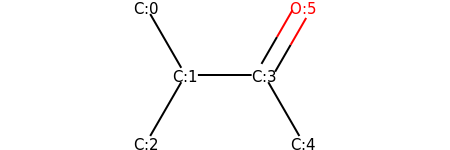

HETATM    1  C1  UNL     1      -1.500   1.299   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.750   0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -1.500  -1.299   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.750  -0.000   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       1.500  -1.299   0.000  1.00  0.00           C  
HETATM    6  O1  UNL     1       1.500   1.299   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    4
CONECT    4    5    6    6
END

search for patterns ...
found primary alcohol


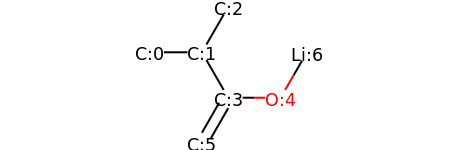

HETATM    1  C1  UNL     1      -2.250   0.557   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.750   0.557   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.000   1.856   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.000  -0.742   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1       1.500  -0.742   0.000  1.00  0.00           O  
HETATM    6  C5  UNL     1      -0.750  -2.041   0.000  1.00  0.00           C  
HETATM    7 LI1  UNL     1       2.250   0.557   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    4
CONECT    4    5    6    6
CONECT    5    7
END

#################
#################
search for patterns ...
found secondary amine


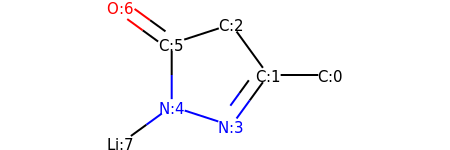

HETATM    1  C1  UNL     1       2.990  -0.000   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.490  -0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.609   1.214   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       0.609  -1.214   0.000  1.00  0.00           N  
HETATM    5  N2  UNL     1      -0.818  -0.750   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -0.818   0.750   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1      -2.031   1.632   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1      -2.031  -1.632   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    4    4
CONECT    3    6
CONECT    4    5
CONECT    5    6    8
CONECT    6    7    7
END

search for patterns ...
found primary alcohol


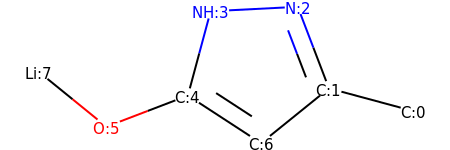

HETATM    1  C1  UNL     1       3.139  -0.502   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.691  -0.112   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.155   1.289   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.343   1.213   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -0.733  -0.236   0.000  1.00  0.00           C  
HETATM    6  O1  UNL     1      -2.134  -0.771   0.000  1.00  0.00           O  
HETATM    7  C4  UNL     1       0.524  -1.054   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.299   0.174   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5
CONECT    5    6    7    7
CONECT    6    8
END

#################
#################
search for patterns ...
found secondary amine


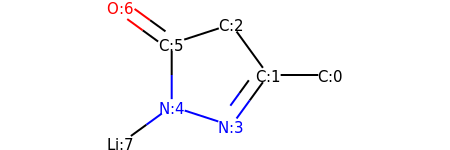

HETATM    1  C1  UNL     1       2.990  -0.000   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.490  -0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.609   1.214   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       0.609  -1.214   0.000  1.00  0.00           N  
HETATM    5  N2  UNL     1      -0.818  -0.750   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -0.818   0.750   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1      -2.031   1.632   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1      -2.031  -1.632   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    4    4
CONECT    3    6
CONECT    4    5
CONECT    5    6    8
CONECT    6    7    7
END

search for patterns ...


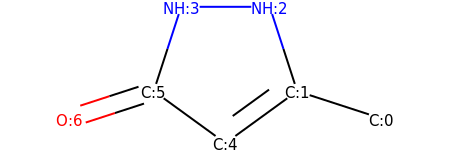

HETATM    1  C1  UNL     1       2.640  -0.613   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.214  -0.149   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.750   1.277   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.750   1.277   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -0.000  -1.031   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -1.214  -0.149   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1      -2.640  -0.613   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    5    5
CONECT    3    4
CONECT    4    6
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found primary alcohol


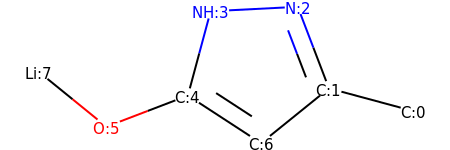

HETATM    1  C1  UNL     1       3.139  -0.502   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.691  -0.112   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.155   1.289   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.343   1.213   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -0.733  -0.236   0.000  1.00  0.00           C  
HETATM    6  O1  UNL     1      -2.134  -0.771   0.000  1.00  0.00           O  
HETATM    7  C4  UNL     1       0.524  -1.054   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.299   0.174   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5
CONECT    5    6    7    7
CONECT    6    8
END

search for patterns ...


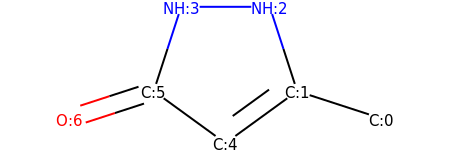

HETATM    1  C1  UNL     1       2.640  -0.613   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.214  -0.149   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.750   1.277   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.750   1.277   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -0.000  -1.031   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -1.214  -0.149   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1      -2.640  -0.613   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    5    5
CONECT    3    4
CONECT    4    6
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found primary alcohol


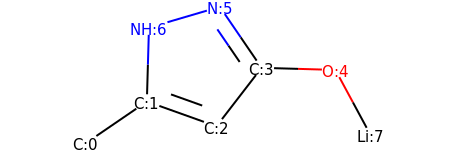

HETATM    1  C1  UNL     1      -2.788  -1.186   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.550  -0.339   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.137  -0.844   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.779   0.344   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1       2.279   0.301   0.000  1.00  0.00           O  
HETATM    6  N1  UNL     1      -0.067   1.582   0.000  1.00  0.00           N  
HETATM    7  N2  UNL     1      -1.507   1.160   0.000  1.00  0.00           N  
HETATM    8 LI1  UNL     1       2.991  -1.019   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    6    6
CONECT    5    8
CONECT    6    7
END

search for patterns ...


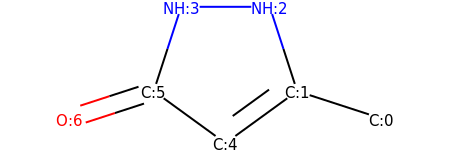

HETATM    1  C1  UNL     1       2.640  -0.613   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.214  -0.149   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.750   1.277   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.750   1.277   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -0.000  -1.031   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -1.214  -0.149   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1      -2.640  -0.613   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    5    5
CONECT    3    4
CONECT    4    6
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...


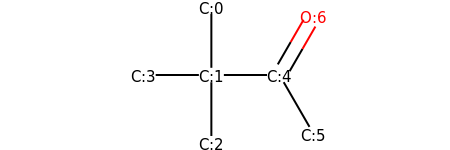

HETATM    1  C1  UNL     1      -0.643   1.500   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.643  -0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.643  -1.500   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -2.143  -0.000   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       0.857   0.000   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       1.607  -1.299   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1       1.607   1.299   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    4    5
CONECT    5    6    7    7
END

search for patterns ...
found primary alcohol


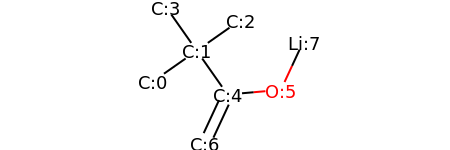

HETATM    1  C1  UNL     1      -1.924  -0.435   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.697   0.427   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.531   1.289   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -1.559   1.655   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       0.165  -0.800   0.000  1.00  0.00           C  
HETATM    6  O1  UNL     1       1.659  -0.668   0.000  1.00  0.00           O  
HETATM    7  C6  UNL     1      -0.467  -2.161   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1       2.291   0.693   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    4    5
CONECT    5    6    7    7
CONECT    6    8
END

#################
#################
search for patterns ...
found primary alcohol


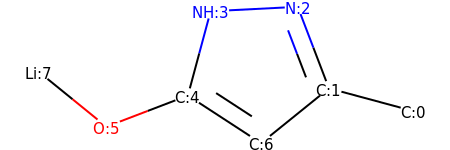

HETATM    1  C1  UNL     1       3.139  -0.502   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.691  -0.112   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.155   1.289   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.343   1.213   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -0.733  -0.236   0.000  1.00  0.00           C  
HETATM    6  O1  UNL     1      -2.134  -0.771   0.000  1.00  0.00           O  
HETATM    7  C4  UNL     1       0.524  -1.054   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.299   0.174   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5
CONECT    5    6    7    7
CONECT    6    8
END

search for patterns ...
found primary alcohol


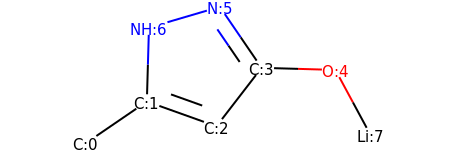

HETATM    1  C1  UNL     1      -2.788  -1.186   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.550  -0.339   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.137  -0.844   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.779   0.344   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1       2.279   0.301   0.000  1.00  0.00           O  
HETATM    6  N1  UNL     1      -0.067   1.582   0.000  1.00  0.00           N  
HETATM    7  N2  UNL     1      -1.507   1.160   0.000  1.00  0.00           N  
HETATM    8 LI1  UNL     1       2.991  -1.019   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    6    6
CONECT    5    8
CONECT    6    7
END

#################
#################
search for patterns ...
found primary alcohol


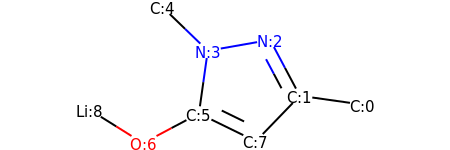

HETATM    1  C1  UNL     1       3.351  -0.358   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.866  -0.149   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.162   1.176   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.315   0.916   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -1.393   1.959   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -0.524  -0.569   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1      -1.849  -1.272   0.000  1.00  0.00           O  
HETATM    8  C5  UNL     1       0.823  -1.227   0.000  1.00  0.00           C  
HETATM    9 LI1  UNL     1      -3.121  -0.477   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    6
CONECT    6    7    8    8
CONECT    7    9
END

search for patterns ...


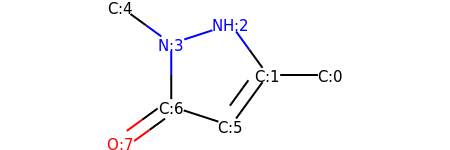

HETATM    1  C1  UNL     1       2.990  -0.000   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.490  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.609   1.214   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.818   0.750   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -2.031   1.632   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.609  -1.214   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -0.818  -0.750   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.031  -1.632   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...


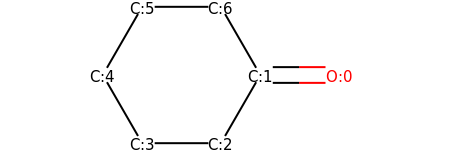

HETATM    1  O1  UNL     1       2.571   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.321  -1.299   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.179  -1.299   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.929   0.000   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.179   1.299   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4
CONECT    4    5
CONECT    5    6
CONECT    6    7
END

search for patterns ...
found primary alcohol


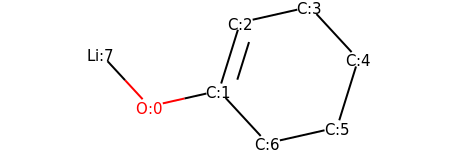

HETATM    1  O1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.159   1.129   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.305   1.459   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.322   0.357   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.876  -1.075   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.413  -1.405   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5
CONECT    5    6
CONECT    6    7
END

#################
#################
search for patterns ...
found primary alcohol


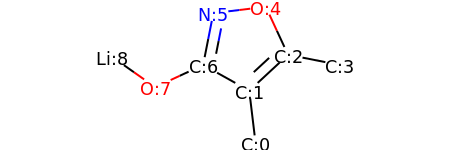

HETATM    1  C1  UNL     1       0.688  -2.227   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       0.509  -0.738   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       1.609   0.282   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       3.080  -0.008   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1       0.978   1.644   0.000  1.00  0.00           O  
HETATM    6  N1  UNL     1      -0.511   1.465   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1      -0.801  -0.007   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1      -2.162  -0.637   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.389   0.226   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    7
CONECT    3    4    5
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9
END

search for patterns ...


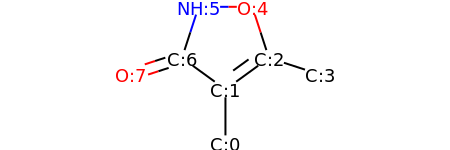

HETATM    1  C1  UNL     1       0.000  -2.215   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       0.000  -0.715   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       1.214   0.167   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       2.640  -0.296   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1       0.750   1.594   0.000  1.00  0.00           O  
HETATM    6  N1  UNL     1      -0.750   1.594   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1      -1.214   0.167   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1      -2.640  -0.296   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    3    7
CONECT    3    4    5
CONECT    5    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...


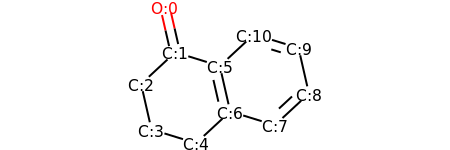

HETATM    1  O1  UNL     1      -1.758   2.396   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.424   0.934   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.524  -0.086   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -2.191  -1.549   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.757  -1.991   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       0.009   0.492   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.343  -0.971   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.776  -1.413   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.876  -0.393   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       2.542   1.069   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       1.109   1.512   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    7
CONECT    6   

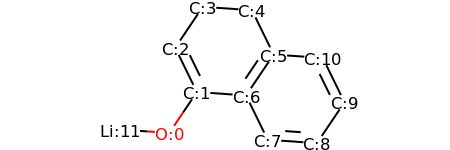

HETATM    1  O1  UNL     1      -2.170  -1.477   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.332  -0.233   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.990   1.115   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.152   2.359   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.344   2.255   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.003   0.907   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.165  -0.337   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.823  -1.685   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.319  -1.789   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       3.157  -0.544   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       2.499   0.803   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -3.666  -1.373   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

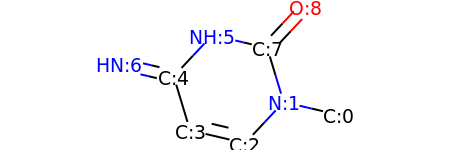

HETATM    1  C1  UNL     1       2.693  -0.926   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       1.233  -0.585   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       0.206  -1.679   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.254  -1.337   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.689   0.098   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -0.662   1.193   0.000  1.00  0.00           N  
HETATM    7  N3  UNL     1      -3.149   0.440   0.000  1.00  0.00           N  
HETATM    8  C5  UNL     1       0.798   0.851   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       1.824   1.945   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    8
CONECT    3    4    4
CONECT    4    5
CONECT    5    6    7    7
CONECT    6    8
CONECT    8    9    9
END

search for patterns ...
found primary amine


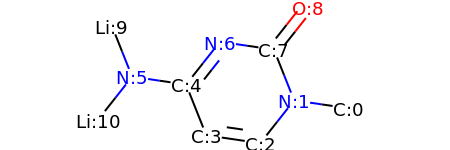

HETATM    1  C1  UNL     1       3.474  -0.746   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       1.990  -0.529   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       1.060  -1.706   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.424  -1.490   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.979  -0.096   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -2.463   0.121   0.000  1.00  0.00           N  
HETATM    7  N3  UNL     1      -0.049   1.081   0.000  1.00  0.00           N  
HETATM    8  C5  UNL     1       1.436   0.864   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       2.365   2.041   0.000  1.00  0.00           O  
HETATM   10 LI1  UNL     1      -3.017   1.515   0.000  1.00  0.00          LI  
HETATM   11 LI2  UNL     1      -3.393  -1.056   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    8
CONECT    3    4    4
CONECT    4    5
CONECT    5    6    7    7
CONE

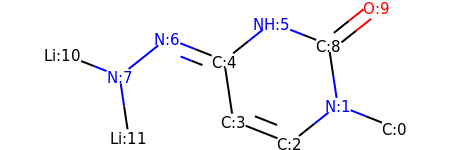

HETATM    1  C1  UNL     1       3.685  -1.217   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       2.289  -0.668   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       1.116  -1.602   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.280  -1.053   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.502   0.430   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1       0.671   1.365   0.000  1.00  0.00           N  
HETATM    7  N3  UNL     1      -1.898   0.979   0.000  1.00  0.00           N  
HETATM    8  N4  UNL     1      -3.072   0.045   0.000  1.00  0.00           N  
HETATM    9  C5  UNL     1       2.067   0.816   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1       3.240   1.750   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1      -4.468   0.594   0.000  1.00  0.00          LI  
HETATM   12 LI2  UNL     1      -2.849  -1.439   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

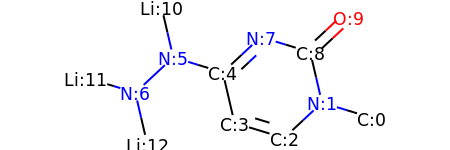

HETATM    1  C1  UNL     1       3.947  -1.098   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       2.513  -0.661   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       1.417  -1.685   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.018  -1.248   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.357   0.213   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -1.792   0.650   0.000  1.00  0.00           N  
HETATM    7  N3  UNL     1      -2.888  -0.374   0.000  1.00  0.00           N  
HETATM    8  N4  UNL     1       0.739   1.237   0.000  1.00  0.00           N  
HETATM    9  C5  UNL     1       2.174   0.800   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1       3.270   1.824   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1      -2.131   2.112   0.000  1.00  0.00          LI  
HETATM   12 LI2  UNL     1      -4.323   0.063   0.000  1.00  0.00          LI  
HETATM   13 LI3  UNL     1  

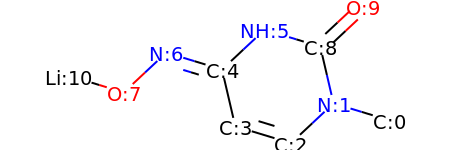

HETATM    1  C1  UNL     1       3.523  -1.069   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       2.088  -0.634   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       0.993  -1.659   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.442  -1.223   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.783   0.238   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1       0.312   1.263   0.000  1.00  0.00           N  
HETATM    7  N3  UNL     1      -2.218   0.673   0.000  1.00  0.00           N  
HETATM    8  O1  UNL     1      -3.313  -0.352   0.000  1.00  0.00           O  
HETATM    9  C5  UNL     1       1.747   0.827   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1       2.842   1.853   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1      -4.749   0.084   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    9
CONECT    3    4    4
CONECT    4    5
CONECT    5    6    7    7
CONE

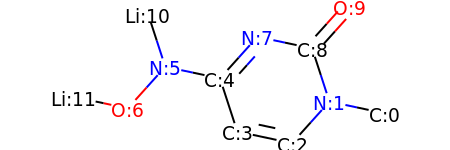

HETATM    1  C1  UNL     1       3.829  -0.923   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       2.362  -0.612   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       1.359  -1.727   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.109  -1.416   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.573   0.011   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -2.040   0.322   0.000  1.00  0.00           N  
HETATM    7  O1  UNL     1      -3.043  -0.793   0.000  1.00  0.00           O  
HETATM    8  N3  UNL     1       0.431   1.126   0.000  1.00  0.00           N  
HETATM    9  C5  UNL     1       1.898   0.815   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1       2.901   1.930   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1      -2.504   1.749   0.000  1.00  0.00          LI  
HETATM   12 LI2  UNL     1      -4.511  -0.482   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

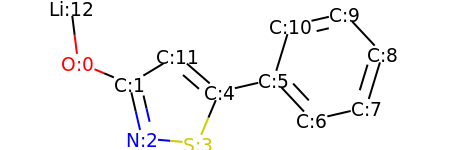

HETATM    1  O1  UNL     1      -4.071   0.356   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.690  -0.229   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.352  -1.690   0.000  1.00  0.00           N  
HETATM    4  S1  UNL     1      -0.857  -1.820   0.000  1.00  0.00           S  
HETATM    5  C2  UNL     1      -0.272  -0.439   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.189  -0.100   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       2.213  -1.196   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.674  -0.858   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       4.112   0.577   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.088   1.673   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       1.627   1.335   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1      -1.405   0.545   0.000  1.00  0.00           C  
HETATM   13 LI1  UNL     1  

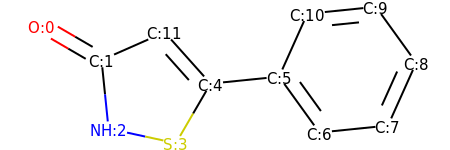

HETATM    1  O1  UNL     1      -4.326   1.063   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -3.030   0.309   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.878  -1.183   0.000  1.00  0.00           N  
HETATM    4  S1  UNL     1      -1.412  -1.500   0.000  1.00  0.00           S  
HETATM    5  C2  UNL     1      -0.658  -0.204   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       0.835  -0.052   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       1.712  -1.268   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.205  -1.117   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.819   0.252   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       2.942   1.468   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       1.449   1.316   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1      -1.658   0.915   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT

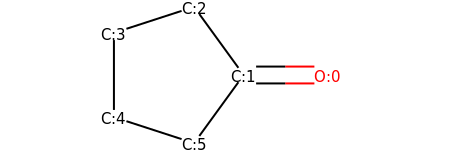

HETATM    1  O1  UNL     1       2.313  -0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.813  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.068   1.214   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.495   0.750   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.495  -0.750   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -0.068  -1.214   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6
END

search for patterns ...
found primary alcohol


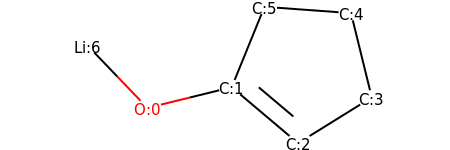

HETATM    1  O1  UNL     1      -1.777  -0.628   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.320  -0.270   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.826  -1.238   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.100  -0.447   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.742   1.010   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       0.246   1.119   0.000  1.00  0.00           C  
HETATM    7 LI1  UNL     1      -2.816   0.454   0.000  1.00  0.00          LI  
CONECT    1    2    7
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6
END

#################
#################
search for patterns ...


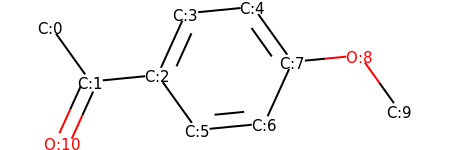

HETATM    1  C1  UNL     1      -3.530   1.080   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.658  -0.140   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -1.165   0.005   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.545   1.371   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       0.948   1.516   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -0.293  -1.215   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1       1.200  -1.070   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1       1.821   0.296   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       3.314   0.442   0.000  1.00  0.00           O  
HETATM   10  C9  UNL     1       4.186  -0.778   0.000  1.00  0.00           C  
HETATM   11  O2  UNL     1      -3.278  -1.506   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3   11   11
CONECT    3    4    4    6
CONECT    4    5
CONECT    5    8    8

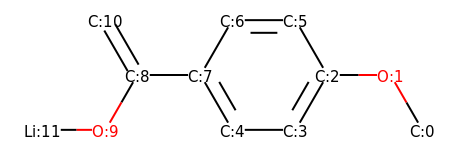

HETATM    1  C1  UNL     1       4.500  -1.083   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1       3.750   0.217   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1       2.250   0.217   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.500  -1.083   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.000  -1.083   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.500   1.516   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.000   1.516   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -0.750   0.217   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -2.250   0.217   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1      -3.000  -1.083   0.000  1.00  0.00           O  
HETATM   11  C9  UNL     1      -3.000   1.516   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -4.500  -1.083   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

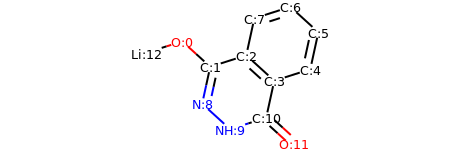

HETATM    1  O1  UNL     1      -2.611   1.160   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.501   0.150   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.072   0.606   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.037  -0.403   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.466   0.053   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.786   1.518   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.676   2.528   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.247   2.072   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -1.821  -1.315   0.000  1.00  0.00           N  
HETATM   10  N2  UNL     1      -0.712  -2.325   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1       0.717  -1.869   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1       1.827  -2.878   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

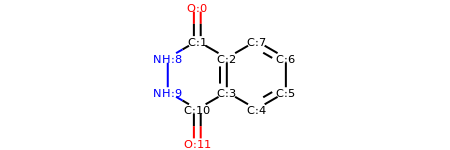

HETATM    1  O1  UNL     1      -1.083   3.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.083   1.500   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.217   0.750   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.217  -0.750   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.516  -1.500   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.815  -0.750   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.815   0.750   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.516   1.500   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -2.382   0.750   0.000  1.00  0.00           N  
HETATM   10  N2  UNL     1      -2.382  -0.750   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -1.083  -1.500   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1      -1.083  -3.000   0.000  1.00  0.00           O  
CONECT    1    2    2
CONECT

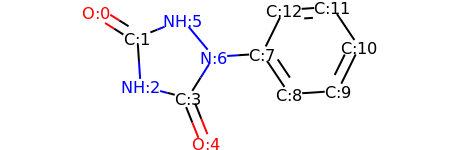

HETATM    1  O1  UNL     1      -4.217   1.433   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.948   0.634   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.848  -0.863   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.394  -1.231   0.000  1.00  0.00           C  
HETATM    5  O2  UNL     1      -0.837  -2.624   0.000  1.00  0.00           O  
HETATM    6  N2  UNL     1      -1.555   1.191   0.000  1.00  0.00           N  
HETATM    7  N3  UNL     1      -0.595   0.038   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1       0.902   0.138   0.000  1.00  0.00           C  
HETATM    9  C4  UNL     1       1.737  -1.109   0.000  1.00  0.00           C  
HETATM   10  C5  UNL     1       3.233  -1.009   0.000  1.00  0.00           C  
HETATM   11  C6  UNL     1       3.895   0.337   0.000  1.00  0.00           C  
HETATM   12  C7  UNL     1       3.061   1.583   0.000  1.00  0.00           C  
HETATM   13  C8  UNL     1  

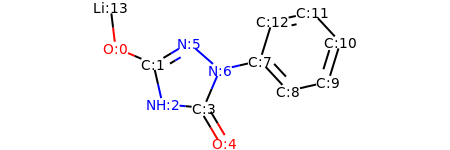

HETATM    1  O1  UNL     1      -4.063   0.591   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.684   0.002   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.350  -1.461   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.856  -1.595   0.000  1.00  0.00           C  
HETATM    5  O2  UNL     1      -0.087  -2.883   0.000  1.00  0.00           O  
HETATM    6  N2  UNL     1      -1.396   0.771   0.000  1.00  0.00           N  
HETATM    7  N3  UNL     1      -0.267  -0.216   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1       1.196   0.118   0.000  1.00  0.00           C  
HETATM    9  C4  UNL     1       2.216  -0.982   0.000  1.00  0.00           C  
HETATM   10  C5  UNL     1       3.678  -0.648   0.000  1.00  0.00           C  
HETATM   11  C6  UNL     1       4.120   0.785   0.000  1.00  0.00           C  
HETATM   12  C7  UNL     1       3.100   1.885   0.000  1.00  0.00           C  
HETATM   13  C8  UNL     1  

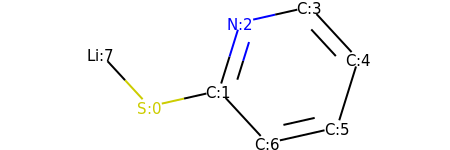

HETATM    1  S1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.159   1.129   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.305   1.459   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.322   0.357   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.876  -1.075   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.413  -1.405   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


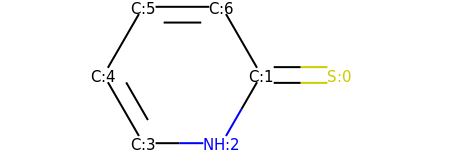

HETATM    1  S1  UNL     1       2.571   0.000   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.321  -1.299   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.179  -1.299   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.929   0.000   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -1.179   1.299   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...


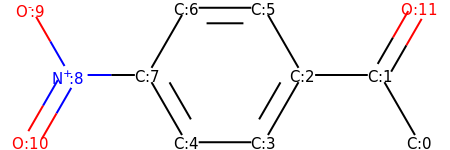

HETATM    1  C1  UNL     1       3.750  -1.299   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       3.000   0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       1.500  -0.000   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.750  -1.299   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -0.750  -1.299   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       0.750   1.299   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -0.750   1.299   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1      -1.500   0.000   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -3.000   0.000   0.000  1.00  0.00           N1+
HETATM   10  O1  UNL     1      -3.750   1.299   0.000  1.00  0.00           O1-
HETATM   11  O2  UNL     1      -3.750  -1.299   0.000  1.00  0.00           O  
HETATM   12  O3  UNL     1       3.750   1.299   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2

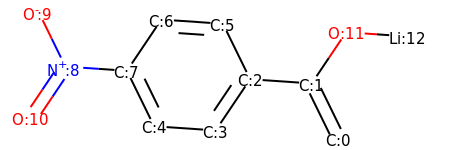

HETATM    1  C1  UNL     1       3.243  -1.625   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.583  -0.277   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       1.087  -0.175   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.250  -1.419   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -1.247  -1.317   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       0.427   1.173   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -1.069   1.275   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1      -1.906   0.031   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -3.403   0.133   0.000  1.00  0.00           N1+
HETATM   10  O1  UNL     1      -4.062   1.480   0.000  1.00  0.00           O1-
HETATM   11  O2  UNL     1      -4.240  -1.112   0.000  1.00  0.00           O  
HETATM   12  O3  UNL     1       3.420   0.967   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

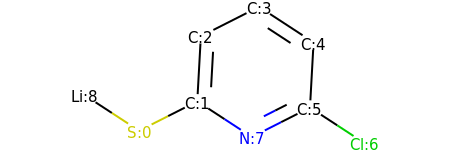

HETATM    1  S1  UNL     1      -2.221  -0.963   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -0.883  -0.285   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.801   1.213   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.538   1.890   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.794   1.070   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.711  -0.428   0.000  1.00  0.00           C  
HETATM    7 CL1  UNL     1       2.967  -1.248   0.000  1.00  0.00          CL  
HETATM    8  N1  UNL     1       0.373  -1.106   0.000  1.00  0.00           N  
HETATM    9 LI1  UNL     1      -3.477  -0.142   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    8    8
END

search for patterns ...


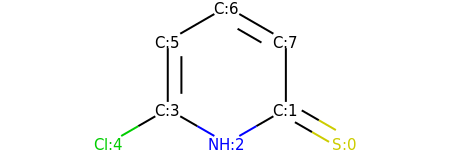

HETATM    1  S1  UNL     1       2.598  -1.125   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.000  -1.125   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    5 CL1  UNL     1      -2.598  -1.125   0.000  1.00  0.00          CL  
HETATM    6  C3  UNL     1      -1.299   1.125   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1      -0.000   1.875   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       1.299   1.125   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    8
CONECT    3    4
CONECT    4    5    6    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found thiol


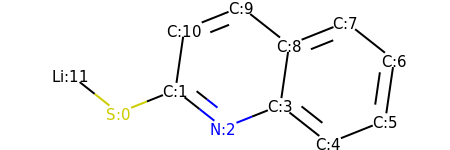

HETATM    1  S1  UNL     1      -3.295  -0.849   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -1.902  -0.293   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.724  -1.221   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.669  -0.665   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.847  -1.594   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       3.240  -1.038   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.456   0.446   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.278   1.375   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.884   0.819   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -0.294   1.748   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -1.687   1.192   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -4.473   0.080   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

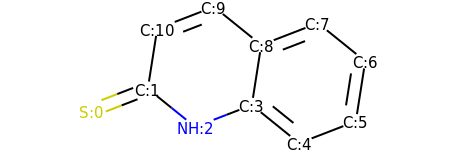

HETATM    1  S1  UNL     1      -3.711  -0.800   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -2.312  -0.259   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.144  -1.201   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.255  -0.661   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.423  -1.603   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.822  -1.063   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.054   0.419   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.886   1.361   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.487   0.821   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -0.680   1.763   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.080   1.223   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6
CONE

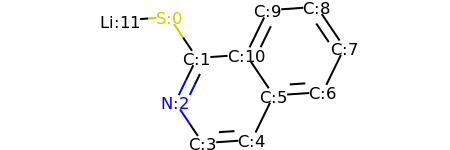

HETATM    1  S1  UNL     1      -2.170   1.477   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -1.332   0.233   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.990  -1.115   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.152  -2.359   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.344  -2.255   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.003  -0.907   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.499  -0.803   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.157   0.544   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.319   1.789   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.823   1.685   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       0.165   0.337   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -3.666   1.373   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

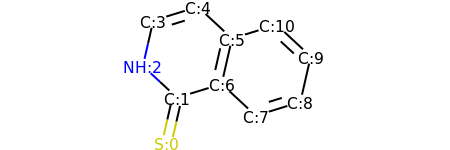

HETATM    1  S1  UNL     1      -1.758  -2.396   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -1.424  -0.934   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.524   0.086   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -2.191   1.549   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -0.757   1.991   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.343   0.971   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.009  -0.492   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.109  -1.512   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.542  -1.069   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       2.876   0.393   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.776   1.413   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT   

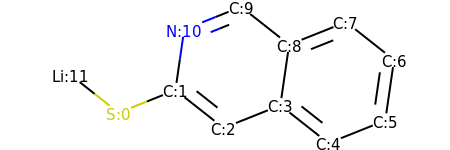

HETATM    1  S1  UNL     1      -3.295  -0.849   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -1.902  -0.293   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.724  -1.221   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.669  -0.665   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.847  -1.594   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.240  -1.038   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.456   0.446   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.278   1.375   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       0.884   0.819   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -0.294   1.748   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1      -1.687   1.192   0.000  1.00  0.00           N  
HETATM   12 LI1  UNL     1      -4.473   0.080   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

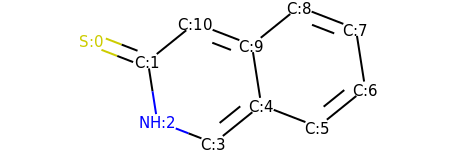

HETATM    1  S1  UNL     1      -3.711   0.800   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -2.312   0.259   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.080  -1.223   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.680  -1.763   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.487  -0.821   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.886  -1.361   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.054  -0.419   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.822   1.063   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.423   1.603   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.255   0.661   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -1.144   1.201   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4
CONECT    4    5    5
CONECT    5    6   10
CONE

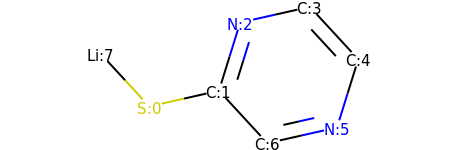

HETATM    1  S1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.159   1.129   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.305   1.459   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.322   0.357   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1       1.876  -1.075   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       0.413  -1.405   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


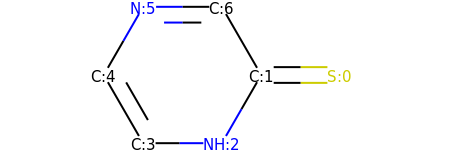

HETATM    1  S1  UNL     1       2.571   0.000   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.321  -1.299   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.179  -1.299   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.929   0.000   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -1.179   1.299   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found thiol


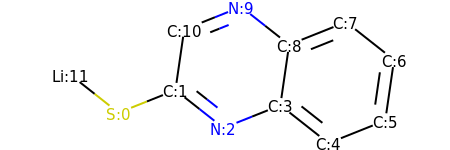

HETATM    1  S1  UNL     1      -3.295  -0.849   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -1.902  -0.293   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.724  -1.221   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.669  -0.665   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.847  -1.594   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       3.240  -1.038   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.456   0.446   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.278   1.375   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.884   0.819   0.000  1.00  0.00           C  
HETATM   10  N2  UNL     1      -0.294   1.748   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -1.687   1.192   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -4.473   0.080   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

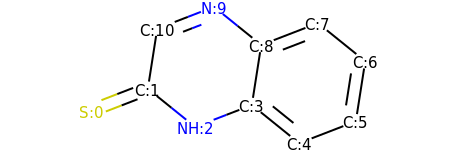

HETATM    1  S1  UNL     1      -3.711  -0.800   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -2.312  -0.259   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.144  -1.201   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.255  -0.661   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.423  -1.603   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.822  -1.063   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.054   0.419   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.886   1.361   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.487   0.821   0.000  1.00  0.00           C  
HETATM   10  N2  UNL     1      -0.680   1.763   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -2.080   1.223   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6
CONE

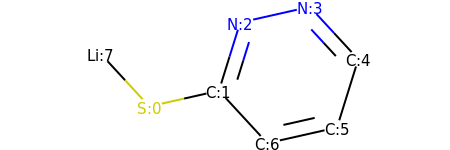

HETATM    1  S1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.159   1.129   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1       1.305   1.459   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       2.322   0.357   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.876  -1.075   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.413  -1.405   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


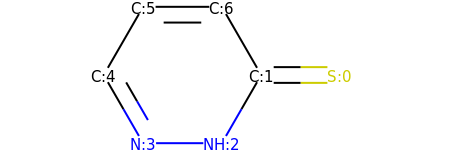

HETATM    1  S1  UNL     1       2.571   0.000   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.321  -1.299   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -1.179  -1.299   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -1.929   0.000   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1      -1.179   1.299   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...


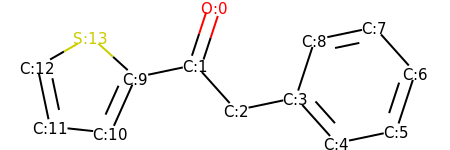

HETATM    1  O1  UNL     1      -0.354   1.822   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.822   0.397   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.179  -0.721   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.647  -0.413   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.648  -1.530   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       4.116  -1.223   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       4.583   0.203   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.582   1.320   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.114   1.012   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -2.290   0.089   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -2.904  -1.280   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -4.395  -1.119   0.000  1.00  0.00           C  
HETATM   13  C12 UNL     1  

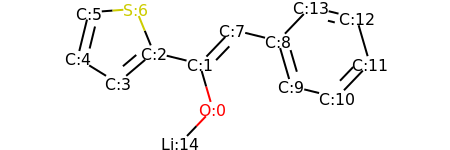

HETATM    1  O1  UNL     1      -0.318  -1.616   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.738  -0.176   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.195   0.181   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -3.340  -0.788   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -4.615   0.001   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -4.258   1.458   0.000  1.00  0.00           C  
HETATM    7  S1  UNL     1      -2.762   1.569   0.000  1.00  0.00           S  
HETATM    8  C6  UNL     1       0.300   0.907   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.757   0.551   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       2.176  -0.890   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       3.633  -1.246   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       4.671  -0.163   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

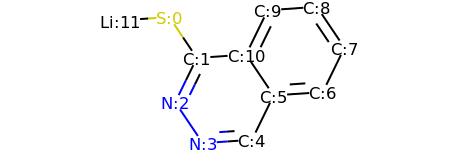

HETATM    1  S1  UNL     1      -2.170   1.477   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -1.332   0.233   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.990  -1.115   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -1.152  -2.359   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       0.344  -2.255   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.003  -0.907   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       2.499  -0.803   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.157   0.544   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.319   1.789   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       0.823   1.685   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       0.165   0.337   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -3.666   1.373   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

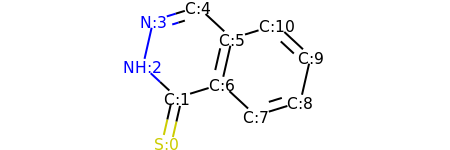

HETATM    1  S1  UNL     1      -1.758  -2.396   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -1.424  -0.934   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.524   0.086   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -2.191   1.549   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -0.757   1.991   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       0.343   0.971   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.009  -0.492   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       1.109  -1.512   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.542  -1.069   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       2.876   0.393   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       1.776   1.413   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT   

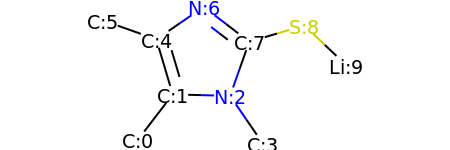

HETATM    1  C1  UNL     1      -2.057  -1.901   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.144  -0.711   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.355  -0.750   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       1.205  -1.985   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.571   0.727   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -2.985   1.228   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1      -0.335   1.577   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       0.856   0.665   0.000  1.00  0.00           C  
HETATM    9  S1  UNL     1       2.294   1.091   0.000  1.00  0.00           S  
HETATM   10 LI1  UNL     1       3.382   0.059   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    5    5
CONECT    3    4    8
CONECT    5    6    7
CONECT    7    8    8
CONECT    8    9
CONECT    9   10
END

search for patterns ...


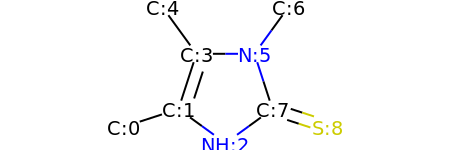

HETATM    1  C1  UNL     1      -2.640  -1.166   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.214  -0.703   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.000  -1.584   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.750   0.724   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.632   1.937   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1       0.750   0.724   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1       1.632   1.937   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.214  -0.703   0.000  1.00  0.00           C  
HETATM    9  S1  UNL     1       2.640  -1.166   0.000  1.00  0.00           S  
CONECT    1    2
CONECT    2    3    4    4
CONECT    3    8
CONECT    4    5    6
CONECT    6    7    8
CONECT    8    9    9
END

#################
#################
search for patterns ...
found thiol


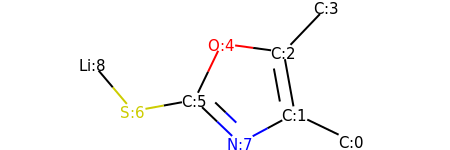

HETATM    1  C1  UNL     1       2.725  -1.311   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.373  -0.660   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       1.106   0.816   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       2.142   1.900   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1      -0.381   1.018   0.000  1.00  0.00           O  
HETATM    6  C5  UNL     1      -1.032  -0.334   0.000  1.00  0.00           C  
HETATM    7  S1  UNL     1      -2.508  -0.601   0.000  1.00  0.00           S  
HETATM    8  N1  UNL     1       0.052  -1.371   0.000  1.00  0.00           N  
HETATM    9 LI1  UNL     1      -3.477   0.543   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    8
CONECT    3    4    5
CONECT    5    6
CONECT    6    7    8    8
CONECT    7    9
END

search for patterns ...


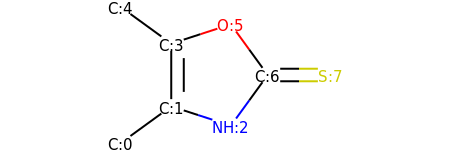

HETATM    1  C1  UNL     1      -2.031  -1.632   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.818  -0.750   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.609  -1.214   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.818   0.750   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -2.031   1.632   0.000  1.00  0.00           C  
HETATM    6  O1  UNL     1       0.609   1.214   0.000  1.00  0.00           O  
HETATM    7  C5  UNL     1       1.490  -0.000   0.000  1.00  0.00           C  
HETATM    8  S1  UNL     1       2.990   0.000   0.000  1.00  0.00           S  
CONECT    1    2
CONECT    2    3    4    4
CONECT    3    7
CONECT    4    5    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found thiol


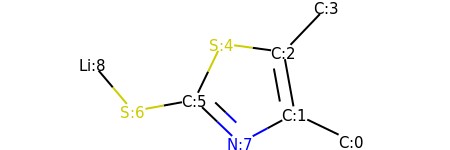

HETATM    1  C1  UNL     1       2.725  -1.311   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.373  -0.660   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       1.106   0.816   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       2.142   1.900   0.000  1.00  0.00           C  
HETATM    5  S1  UNL     1      -0.381   1.018   0.000  1.00  0.00           S  
HETATM    6  C5  UNL     1      -1.032  -0.334   0.000  1.00  0.00           C  
HETATM    7  S2  UNL     1      -2.508  -0.601   0.000  1.00  0.00           S  
HETATM    8  N1  UNL     1       0.052  -1.371   0.000  1.00  0.00           N  
HETATM    9 LI1  UNL     1      -3.477   0.543   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    8
CONECT    3    4    5
CONECT    5    6
CONECT    6    7    8    8
CONECT    7    9
END

search for patterns ...


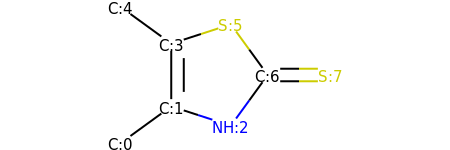

HETATM    1  C1  UNL     1      -2.031  -1.632   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.818  -0.750   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.609  -1.214   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.818   0.750   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -2.031   1.632   0.000  1.00  0.00           C  
HETATM    6  S1  UNL     1       0.609   1.214   0.000  1.00  0.00           S  
HETATM    7  C5  UNL     1       1.490  -0.000   0.000  1.00  0.00           C  
HETATM    8  S2  UNL     1       2.990   0.000   0.000  1.00  0.00           S  
CONECT    1    2
CONECT    2    3    4    4
CONECT    3    7
CONECT    4    5    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...


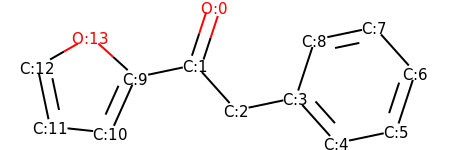

HETATM    1  O1  UNL     1      -0.354   1.822   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.822   0.397   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.179  -0.721   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.647  -0.413   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.648  -1.530   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       4.116  -1.223   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       4.583   0.203   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.582   1.320   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.114   1.012   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -2.290   0.089   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -2.904  -1.280   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -4.395  -1.119   0.000  1.00  0.00           C  
HETATM   13  C12 UNL     1  

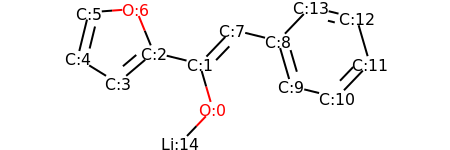

HETATM    1  O1  UNL     1      -0.318  -1.616   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.738  -0.176   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.195   0.181   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -3.340  -0.788   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -4.615   0.001   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -4.258   1.458   0.000  1.00  0.00           C  
HETATM    7  O2  UNL     1      -2.762   1.569   0.000  1.00  0.00           O  
HETATM    8  C6  UNL     1       0.300   0.907   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.757   0.551   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       2.176  -0.890   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       3.633  -1.246   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       4.671  -0.163   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

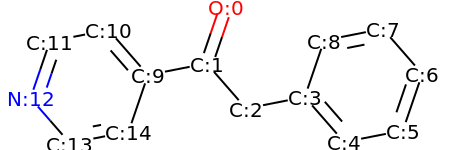

HETATM    1  O1  UNL     1      -0.007   1.852   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.493   0.433   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.494  -0.697   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.966  -0.408   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.952  -1.538   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       4.424  -1.248   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       4.909   0.171   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.923   1.301   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.451   1.012   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.965   0.143   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -2.951   1.273   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -4.423   0.984   0.000  1.00  0.00           C  
HETATM   13  N1  UNL     1  

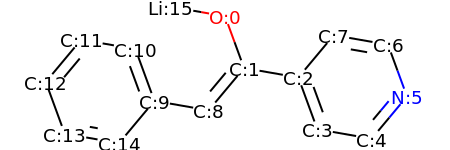

HETATM    1  O1  UNL     1       0.062   1.720   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.578   0.311   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.055   0.054   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.571  -1.355   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       4.049  -1.612   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       5.011  -0.461   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1       4.495   0.948   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.017   1.205   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -0.384  -0.840   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -1.862  -0.582   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.378   0.826   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -3.856   1.084   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

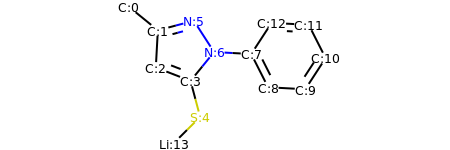

HETATM    1  C1  UNL     1      -3.856   2.184   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.692   1.238   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -2.773  -0.260   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -1.374  -0.800   0.000  1.00  0.00           C  
HETATM    5  S1  UNL     1      -0.989  -2.250   0.000  1.00  0.00           S  
HETATM    6  N1  UNL     1      -1.242   1.624   0.000  1.00  0.00           N  
HETATM    7  N2  UNL     1      -0.428   0.364   0.000  1.00  0.00           N  
HETATM    8  C5  UNL     1       1.070   0.283   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       1.748  -1.055   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.246  -1.137   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       4.065   0.120   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       3.387   1.458   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

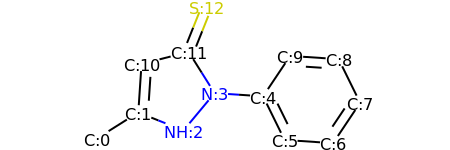

HETATM    1  C1  UNL     1      -4.217  -1.433   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.948  -0.634   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.555  -1.191   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.595  -0.038   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.902  -0.138   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.564  -1.484   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.061  -1.583   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.895  -0.337   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.233   1.009   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.737   1.109   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.848   0.863   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -1.394   1.231   0.000  1.00  0.00           C  
HETATM   13  S1  UNL     1  

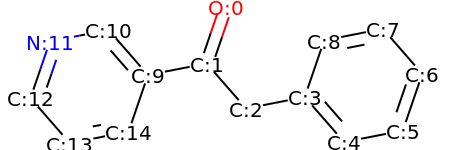

HETATM    1  O1  UNL     1      -0.007   1.852   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.493   0.433   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.494  -0.697   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.966  -0.408   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.952  -1.538   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       4.424  -1.248   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       4.909   0.171   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.923   1.301   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.451   1.012   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.965   0.143   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -2.951   1.273   0.000  1.00  0.00           C  
HETATM   12  N1  UNL     1      -4.423   0.984   0.000  1.00  0.00           N  
HETATM   13  C11 UNL     1  

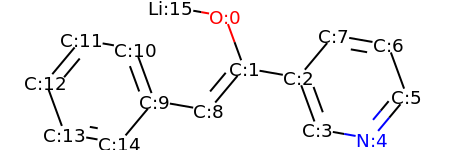

HETATM    1  O1  UNL     1       0.062   1.720   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.578   0.311   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.055   0.054   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.571  -1.355   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       4.049  -1.612   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       5.011  -0.461   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       4.495   0.948   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.017   1.205   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -0.384  -0.840   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -1.862  -0.582   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.378   0.826   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -3.856   1.084   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

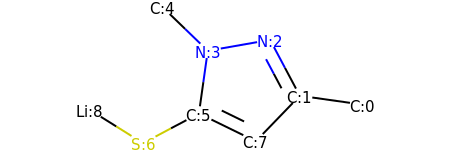

HETATM    1  C1  UNL     1       3.351  -0.358   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.866  -0.149   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.162   1.176   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.315   0.916   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -1.393   1.959   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -0.524  -0.569   0.000  1.00  0.00           C  
HETATM    7  S1  UNL     1      -1.849  -1.272   0.000  1.00  0.00           S  
HETATM    8  C5  UNL     1       0.823  -1.227   0.000  1.00  0.00           C  
HETATM    9 LI1  UNL     1      -3.121  -0.477   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    6
CONECT    6    7    8    8
CONECT    7    9
END

search for patterns ...


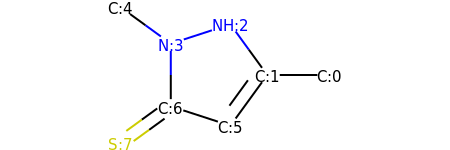

HETATM    1  C1  UNL     1       2.990  -0.000   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.490  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.609   1.214   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.818   0.750   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -2.031   1.632   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.609  -1.214   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -0.818  -0.750   0.000  1.00  0.00           C  
HETATM    8  S1  UNL     1      -2.031  -1.632   0.000  1.00  0.00           S  
CONECT    1    2
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found thiol


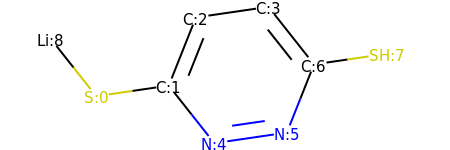

HETATM    1  S1  UNL     1      -2.535  -0.516   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -1.051  -0.299   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.497   1.094   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.987   1.311   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.121  -1.476   0.000  1.00  0.00           N  
HETATM    6  N2  UNL     1       1.363  -1.260   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.917   0.134   0.000  1.00  0.00           C  
HETATM    8  S2  UNL     1       3.402   0.351   0.000  1.00  0.00           S  
HETATM    9 LI1  UNL     1      -3.465   0.661   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    3    5
CONECT    3    4
CONECT    4    7    7
CONECT    5    6    6
CONECT    6    7
CONECT    7    8
END

search for patterns ...
found thiol


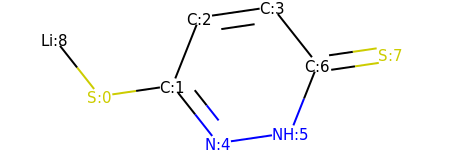

HETATM    1  S1  UNL     1      -2.535  -0.516   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -1.051  -0.299   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.497   1.094   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.987   1.311   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.121  -1.476   0.000  1.00  0.00           N  
HETATM    6  N2  UNL     1       1.363  -1.260   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.917   0.134   0.000  1.00  0.00           C  
HETATM    8  S2  UNL     1       3.402   0.351   0.000  1.00  0.00           S  
HETATM    9 LI1  UNL     1      -3.465   0.661   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    5    5
CONECT    3    4    4
CONECT    4    7
CONECT    5    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...


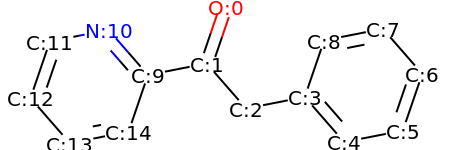

HETATM    1  O1  UNL     1      -0.007   1.852   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.493   0.433   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.494  -0.697   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.966  -0.408   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.952  -1.538   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       4.424  -1.248   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       4.909   0.171   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.923   1.301   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.451   1.012   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.965   0.143   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1      -2.951   1.273   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1      -4.423   0.984   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

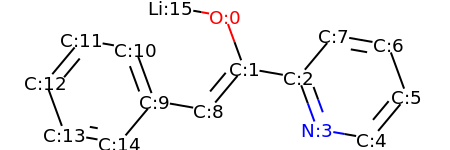

HETATM    1  O1  UNL     1       0.062   1.720   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.578   0.311   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.055   0.054   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       2.571  -1.355   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       4.049  -1.612   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       5.011  -0.461   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       4.495   0.948   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.017   1.205   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -0.384  -0.840   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -1.862  -0.582   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.378   0.826   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -3.856   1.084   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

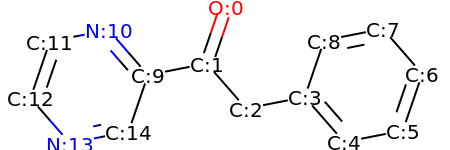

HETATM    1  O1  UNL     1      -0.007   1.852   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.493   0.433   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.494  -0.697   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.966  -0.408   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.952  -1.538   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       4.424  -1.248   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       4.909   0.171   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.923   1.301   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.451   1.012   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.965   0.143   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1      -2.951   1.273   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1      -4.423   0.984   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

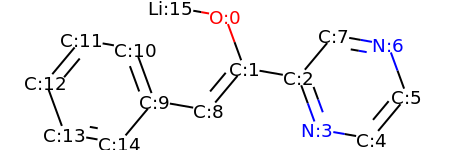

HETATM    1  O1  UNL     1       0.062   1.720   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.578   0.311   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.055   0.054   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       2.571  -1.355   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       4.049  -1.612   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       5.011  -0.461   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1       4.495   0.948   0.000  1.00  0.00           N  
HETATM    8  C5  UNL     1       3.017   1.205   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1      -0.384  -0.840   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1      -1.862  -0.582   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1      -2.378   0.826   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1      -3.856   1.084   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

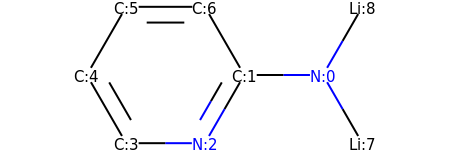

HETATM    1  N1  UNL     1       1.833   0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.333  -0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.417  -1.299   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.917  -1.299   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -2.667   0.000   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -1.917   1.299   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -0.417   1.299   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1       2.583  -1.299   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1       2.583   1.299   0.000  1.00  0.00          LI  
CONECT    1    2    8    9
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


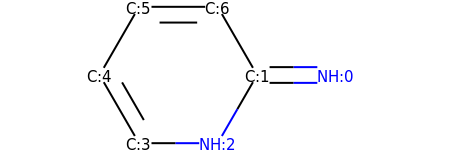

HETATM    1  N1  UNL     1       2.571   0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       0.321  -1.299   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.179  -1.299   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.929   0.000   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -1.179   1.299   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found secondary amine


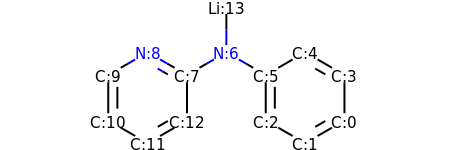

HETATM    1  C1  UNL     1       3.897  -1.071   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.598  -1.821   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       1.299  -1.071   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       3.897   0.429   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       2.598   1.179   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       1.299   0.429   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1       0.000   1.179   0.000  1.00  0.00           N  
HETATM    8  C7  UNL     1      -1.299   0.429   0.000  1.00  0.00           C  
HETATM    9  N2  UNL     1      -2.598   1.179   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -3.897   0.429   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -3.897  -1.071   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -2.598  -1.821   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

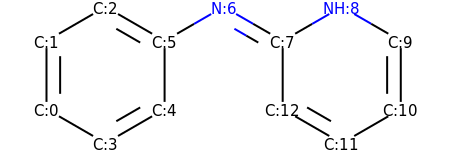

HETATM    1  C1  UNL     1      -3.897  -0.865   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -3.897   0.635   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -2.598   1.385   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -2.598  -1.615   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -1.299  -0.865   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -1.299   0.635   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1      -0.000   1.385   0.000  1.00  0.00           N  
HETATM    8  C7  UNL     1       1.299   0.635   0.000  1.00  0.00           C  
HETATM    9  N2  UNL     1       2.598   1.385   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1       3.897   0.635   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       3.897  -0.865   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       2.598  -1.615   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

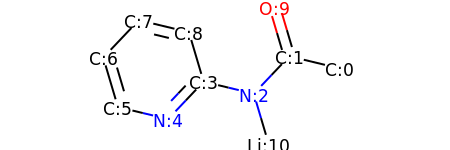

HETATM    1  C1  UNL     1       3.668   0.091   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.209   0.441   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.177  -0.647   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.282  -0.297   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.314  -1.385   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -2.773  -1.035   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -3.199   0.403   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -2.166   1.492   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -0.708   1.141   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1       1.783   1.879   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1       1.603  -2.085   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4   11
CONECT    4    5    5    9
CONECT    5    6

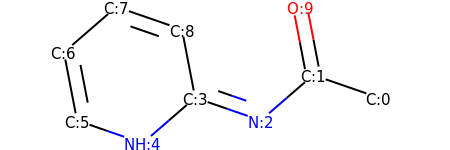

HETATM    1  C1  UNL     1       3.799  -0.491   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.381  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.247  -0.982   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.170  -0.491   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.304  -1.473   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -2.721  -0.982   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -3.005   0.491   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -1.871   1.473   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -0.454   0.982   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1       2.098   1.473   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4    4
CONECT    4    5    9
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9    9
END

#################
#

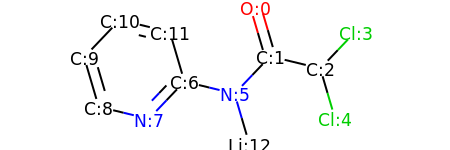

HETATM    1  O1  UNL     1       1.111   1.890   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.534   0.451   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.992   0.098   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1       4.027   1.183   0.000  1.00  0.00          CL  
HETATM    5 CL2  UNL     1       3.415  -1.342   0.000  1.00  0.00          CL  
HETATM    6  N1  UNL     1       0.499  -0.635   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1      -0.959  -0.282   0.000  1.00  0.00           C  
HETATM    8  N2  UNL     1      -1.994  -1.368   0.000  1.00  0.00           N  
HETATM    9  C4  UNL     1      -3.451  -1.014   0.000  1.00  0.00           C  
HETATM   10  C5  UNL     1      -3.874   0.425   0.000  1.00  0.00           C  
HETATM   11  C6  UNL     1      -2.839   1.511   0.000  1.00  0.00           C  
HETATM   12  C7  UNL     1      -1.382   1.157   0.000  1.00  0.00           C  
HETATM   13 LI1  UNL     1  

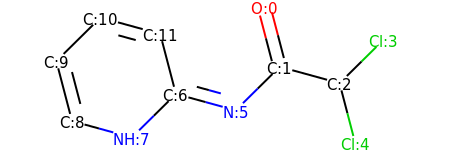

HETATM    1  O1  UNL     1       1.239   1.680   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.618   0.229   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       3.065  -0.168   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1       4.132   0.886   0.000  1.00  0.00          CL  
HETATM    5 CL2  UNL     1       3.444  -1.619   0.000  1.00  0.00          CL  
HETATM    6  N1  UNL     1       0.551  -0.825   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1      -0.895  -0.428   0.000  1.00  0.00           C  
HETATM    8  N2  UNL     1      -1.962  -1.482   0.000  1.00  0.00           N  
HETATM    9  C4  UNL     1      -3.409  -1.085   0.000  1.00  0.00           C  
HETATM   10  C5  UNL     1      -3.788   0.366   0.000  1.00  0.00           C  
HETATM   11  C6  UNL     1      -2.721   1.421   0.000  1.00  0.00           C  
HETATM   12  C7  UNL     1      -1.275   1.023   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT

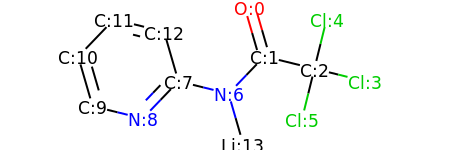

HETATM    1  O1  UNL     1       0.904   1.880   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.322   0.439   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.778   0.080   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1       4.235  -0.278   0.000  1.00  0.00          CL  
HETATM    5 CL2  UNL     1       3.137   1.537   0.000  1.00  0.00          CL  
HETATM    6 CL3  UNL     1       2.420  -1.376   0.000  1.00  0.00          CL  
HETATM    7  N1  UNL     1       0.283  -0.643   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1      -1.173  -0.284   0.000  1.00  0.00           C  
HETATM    9  N2  UNL     1      -2.212  -1.366   0.000  1.00  0.00           N  
HETATM   10  C4  UNL     1      -3.669  -1.008   0.000  1.00  0.00           C  
HETATM   11  C5  UNL     1      -4.086   0.433   0.000  1.00  0.00           C  
HETATM   12  C6  UNL     1      -3.048   1.515   0.000  1.00  0.00           C  
HETATM   13  C7  UNL     1  

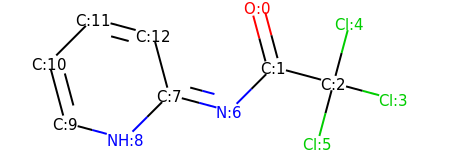

HETATM    1  O1  UNL     1       0.993   1.700   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.381   0.251   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.830  -0.138   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1       4.279  -0.526   0.000  1.00  0.00          CL  
HETATM    5 CL2  UNL     1       3.218   1.311   0.000  1.00  0.00          CL  
HETATM    6 CL3  UNL     1       2.442  -1.586   0.000  1.00  0.00          CL  
HETATM    7  N1  UNL     1       0.320  -0.810   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1      -1.128  -0.422   0.000  1.00  0.00           C  
HETATM    9  N2  UNL     1      -2.189  -1.482   0.000  1.00  0.00           N  
HETATM   10  C4  UNL     1      -3.638  -1.094   0.000  1.00  0.00           C  
HETATM   11  C5  UNL     1      -4.026   0.355   0.000  1.00  0.00           C  
HETATM   12  C6  UNL     1      -2.966   1.415   0.000  1.00  0.00           C  
HETATM   13  C7  UNL     1  

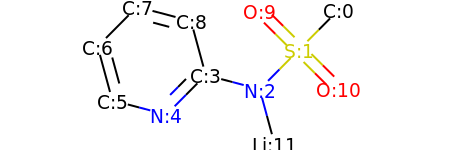

HETATM    1  C1  UNL     1       3.091   1.423   0.000  1.00  0.00           C  
HETATM    2  S1  UNL     1       2.034   0.358   0.000  1.00  0.00           S  
HETATM    3  N1  UNL     1       0.977  -0.706   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.473  -0.323   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.530  -1.387   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -2.980  -1.004   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1      -3.374   0.443   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1      -2.317   1.508   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1      -0.867   1.125   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1       0.970   1.415   0.000  1.00  0.00           O  
HETATM   11  O2  UNL     1       3.098  -0.698   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1       1.371  -2.153   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

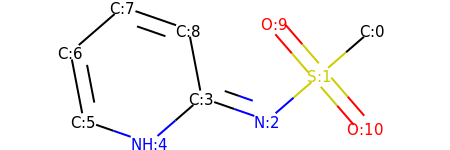

HETATM    1  C1  UNL     1       3.299   0.982   0.000  1.00  0.00           C  
HETATM    2  S1  UNL     1       2.165   0.000   0.000  1.00  0.00           S  
HETATM    3  N1  UNL     1       1.031  -0.982   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.387  -0.491   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.520  -1.473   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -2.938  -0.982   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1      -3.221   0.491   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1      -2.087   1.473   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1      -0.670   0.982   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1       1.183   1.134   0.000  1.00  0.00           O  
HETATM   11  O2  UNL     1       3.147  -1.134   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3   10   10   11
CONECT    2   11
CONECT    3    4    4
CONECT    4    5    9

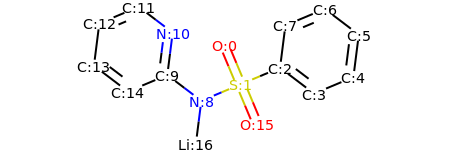

HETATM    1  O1  UNL     1      -0.052   0.693   0.000  1.00  0.00           O  
HETATM    2  S1  UNL     1       0.529  -0.690   0.000  1.00  0.00           S  
HETATM    3  C1  UNL     1       1.912  -0.109   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1       3.106  -1.016   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       4.489  -0.435   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       4.678   1.053   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.483   1.960   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.100   1.379   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -0.854  -1.270   0.000  1.00  0.00           N  
HETATM   10  C7  UNL     1      -2.049  -0.363   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -1.860   1.125   0.000  1.00  0.00           N  
HETATM   12  C8  UNL     1      -3.055   2.032   0.000  1.00  0.00           C  
HETATM   13  C9  UNL     1  

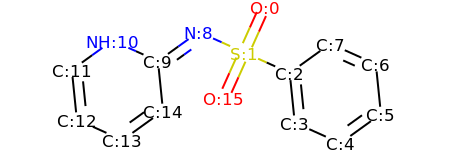

HETATM    1  O1  UNL     1       1.101   2.218   0.000  1.00  0.00           O  
HETATM    2  S1  UNL     1       0.485   0.850   0.000  1.00  0.00           S  
HETATM    3  C1  UNL     1       1.853   0.234   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1       2.004  -1.258   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       3.372  -1.873   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       4.589  -0.997   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       4.438   0.496   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.070   1.111   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -0.883   1.466   0.000  1.00  0.00           N  
HETATM   10  C7  UNL     1      -2.100   0.589   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -3.468   1.204   0.000  1.00  0.00           N  
HETATM   12  C8  UNL     1      -4.685   0.327   0.000  1.00  0.00           C  
HETATM   13  C9  UNL     1  

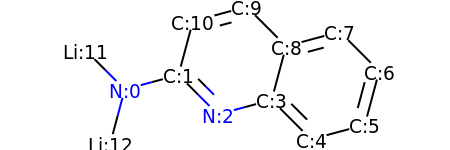

HETATM    1  N1  UNL     1      -3.083  -0.309   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.634   0.079   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.573  -0.981   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.876  -0.593   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.936  -1.654   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       3.385  -1.265   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.773   0.183   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.713   1.244   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.264   0.856   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.203   1.917   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -1.246   1.528   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -4.143   0.752   0.000  1.00  0.00          LI  
HETATM   13 LI2  UNL     1  

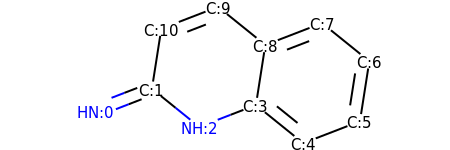

HETATM    1  N1  UNL     1      -3.711  -0.800   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -2.312  -0.259   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -1.144  -1.201   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.255  -0.661   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.423  -1.603   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.822  -1.063   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.054   0.419   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.886   1.361   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.487   0.821   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -0.680   1.763   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.080   1.223   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6
CONE

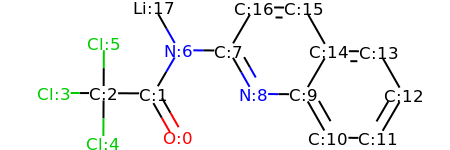

HETATM    1  O1  UNL     1      -1.635  -1.795   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.378  -0.492   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -3.878  -0.484   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1      -5.378  -0.476   0.000  1.00  0.00          CL  
HETATM    5 CL2  UNL     1      -3.886  -1.984   0.000  1.00  0.00          CL  
HETATM    6 CL3  UNL     1      -3.870   1.016   0.000  1.00  0.00          CL  
HETATM    7  N1  UNL     1      -1.621   0.803   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1      -0.121   0.795   0.000  1.00  0.00           C  
HETATM    9  N2  UNL     1       0.622  -0.509   0.000  1.00  0.00           N  
HETATM   10  C4  UNL     1       2.122  -0.517   0.000  1.00  0.00           C  
HETATM   11  C5  UNL     1       2.865  -1.820   0.000  1.00  0.00           C  
HETATM   12  C6  UNL     1       4.365  -1.828   0.000  1.00  0.00           C  
HETATM   13  C7  UNL     1  

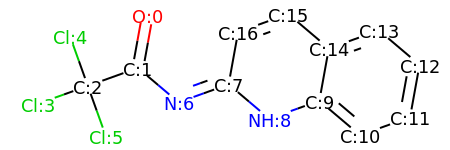

HETATM    1  O1  UNL     1      -2.487   1.706   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.754   0.230   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -4.166  -0.277   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1      -5.578  -0.783   0.000  1.00  0.00          CL  
HETATM    5 CL2  UNL     1      -4.672   1.135   0.000  1.00  0.00          CL  
HETATM    6 CL3  UNL     1      -3.660  -1.689   0.000  1.00  0.00          CL  
HETATM    7  N1  UNL     1      -1.609  -0.740   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1      -0.198  -0.233   0.000  1.00  0.00           C  
HETATM    9  N2  UNL     1       0.947  -1.203   0.000  1.00  0.00           N  
HETATM   10  C4  UNL     1       2.359  -0.696   0.000  1.00  0.00           C  
HETATM   11  C5  UNL     1       3.503  -1.666   0.000  1.00  0.00           C  
HETATM   12  C6  UNL     1       4.915  -1.159   0.000  1.00  0.00           C  
HETATM   13  C7  UNL     1  

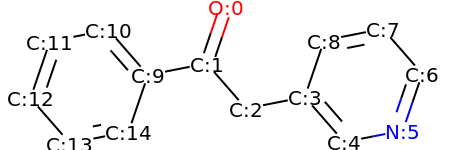

HETATM    1  O1  UNL     1      -0.007   1.852   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.493   0.433   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.494  -0.697   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.966  -0.408   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.952  -1.538   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       4.424  -1.248   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1       4.909   0.171   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.923   1.301   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.451   1.012   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -1.965   0.143   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.951   1.273   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -4.423   0.984   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

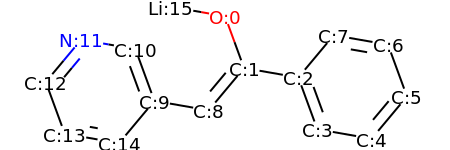

HETATM    1  O1  UNL     1       0.062   1.720   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.578   0.311   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.055   0.054   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.571  -1.355   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       4.049  -1.612   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       5.011  -0.461   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       4.495   0.948   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.017   1.205   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -0.384  -0.840   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.862  -0.582   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -2.378   0.826   0.000  1.00  0.00           C  
HETATM   12  N1  UNL     1      -3.856   1.084   0.000  1.00  0.00           N  
HETATM   13  C11 UNL     1  

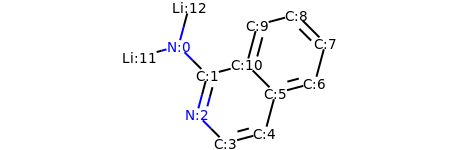

HETATM    1  N1  UNL     1      -2.257   0.844   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.196  -0.217   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -1.584  -1.666   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.524  -2.727   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.925  -2.338   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.313  -0.889   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.762  -0.501   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.151   0.948   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.090   2.008   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.641   1.620   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       0.253   0.171   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -3.706   0.455   0.000  1.00  0.00          LI  
HETATM   13 LI2  UNL     1  

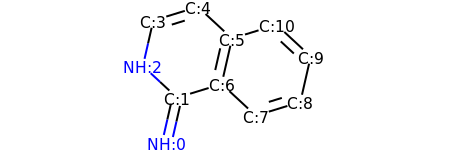

HETATM    1  N1  UNL     1      -1.758  -2.396   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.424  -0.934   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -2.524   0.086   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -2.191   1.549   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -0.757   1.991   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.343   0.971   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.009  -0.492   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.109  -1.512   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.542  -1.069   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       2.876   0.393   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.776   1.413   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT   

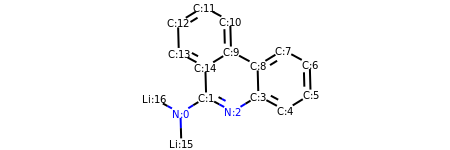

HETATM    1  N1  UNL     1      -2.394  -1.919   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.116  -1.134   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       0.203  -1.848   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.481  -1.063   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.800  -1.777   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       4.079  -0.992   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       4.038   0.508   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.719   1.222   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.440   0.437   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.121   1.151   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       0.080   2.650   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -1.239   3.364   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

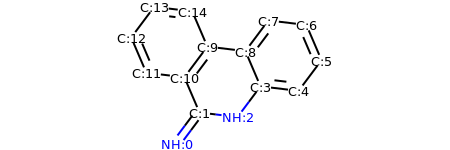

HETATM    1  N1  UNL     1      -1.780  -3.102   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.881  -1.901   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       0.608  -2.079   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.507  -0.877   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.996  -1.055   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       3.895   0.146   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.304   1.525   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.814   1.702   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.916   0.501   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -0.574   0.679   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -1.472  -0.522   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -2.962  -0.345   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

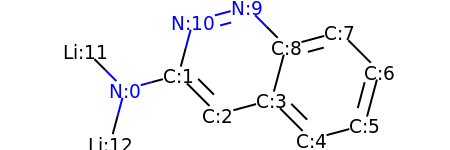

HETATM    1  N1  UNL     1      -3.083  -0.309   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.634   0.079   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.573  -0.981   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.876  -0.593   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.936  -1.654   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.385  -1.265   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.773   0.183   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.713   1.244   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       1.264   0.856   0.000  1.00  0.00           C  
HETATM   10  N2  UNL     1       0.203   1.917   0.000  1.00  0.00           N  
HETATM   11  N3  UNL     1      -1.246   1.528   0.000  1.00  0.00           N  
HETATM   12 LI1  UNL     1      -4.143   0.752   0.000  1.00  0.00          LI  
HETATM   13 LI2  UNL     1  

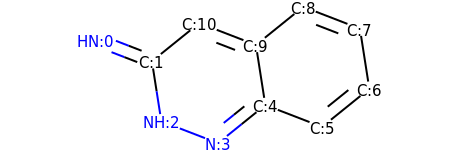

HETATM    1  N1  UNL     1      -3.711   0.800   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -2.312   0.259   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -2.080  -1.223   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1      -0.680  -1.763   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       0.487  -0.821   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.886  -1.361   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       3.054  -0.419   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       2.822   1.063   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       1.423   1.603   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       0.255   0.661   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1      -1.144   1.201   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4
CONECT    4    5    5
CONECT    5    6   10
CONE

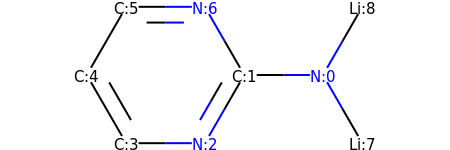

HETATM    1  N1  UNL     1       1.833   0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.333  -0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.417  -1.299   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.917  -1.299   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -2.667   0.000   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -1.917   1.299   0.000  1.00  0.00           C  
HETATM    7  N3  UNL     1      -0.417   1.299   0.000  1.00  0.00           N  
HETATM    8 LI1  UNL     1       2.583  -1.299   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1       2.583   1.299   0.000  1.00  0.00          LI  
CONECT    1    2    8    9
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


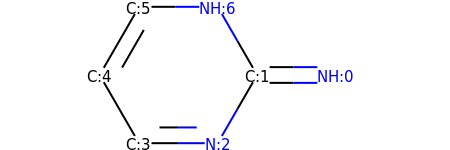

HETATM    1  N1  UNL     1       2.571   0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       0.321  -1.299   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.179  -1.299   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.929   0.000   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -1.179   1.299   0.000  1.00  0.00           C  
HETATM    7  N3  UNL     1       0.321   1.299   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4    4
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
END

#################
#################
search for patterns ...
found primary amine


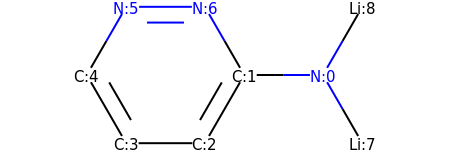

HETATM    1  N1  UNL     1       1.833   0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.333  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.417  -1.299   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.917  -1.299   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -2.667   0.000   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -1.917   1.299   0.000  1.00  0.00           N  
HETATM    7  N3  UNL     1      -0.417   1.299   0.000  1.00  0.00           N  
HETATM    8 LI1  UNL     1       2.583  -1.299   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1       2.583   1.299   0.000  1.00  0.00          LI  
CONECT    1    2    8    9
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


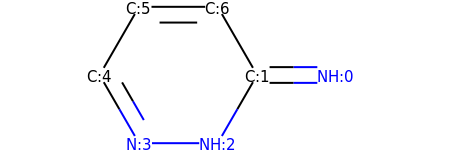

HETATM    1  N1  UNL     1       2.571   0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       0.321  -1.299   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1      -1.179  -1.299   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -1.929   0.000   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1      -1.179   1.299   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found primary amine


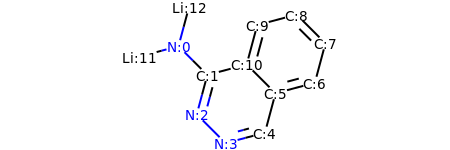

HETATM    1  N1  UNL     1      -2.257   0.844   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.196  -0.217   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -1.584  -1.666   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1      -0.524  -2.727   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       0.925  -2.338   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.313  -0.889   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       2.762  -0.501   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.151   0.948   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.090   2.008   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       0.641   1.620   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       0.253   0.171   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -3.706   0.455   0.000  1.00  0.00          LI  
HETATM   13 LI2  UNL     1  

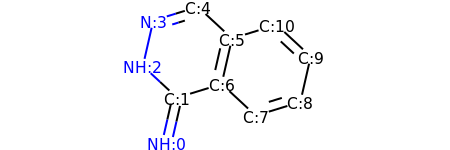

HETATM    1  N1  UNL     1      -1.758  -2.396   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.424  -0.934   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -2.524   0.086   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1      -2.191   1.549   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -0.757   1.991   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       0.343   0.971   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.009  -0.492   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       1.109  -1.512   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.542  -1.069   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       2.876   0.393   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       1.776   1.413   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT   

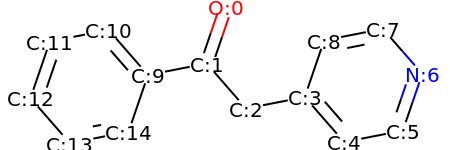

HETATM    1  O1  UNL     1      -0.007   1.852   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.493   0.433   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.494  -0.697   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.966  -0.408   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.952  -1.538   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       4.424  -1.248   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1       4.909   0.171   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       3.923   1.301   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.451   1.012   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -1.965   0.143   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.951   1.273   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -4.423   0.984   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

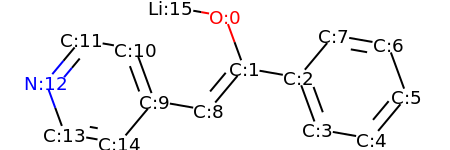

HETATM    1  O1  UNL     1       0.062   1.720   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.578   0.311   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.055   0.054   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.571  -1.355   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       4.049  -1.612   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       5.011  -0.461   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       4.495   0.948   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.017   1.205   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -0.384  -0.840   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.862  -0.582   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -2.378   0.826   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -3.856   1.084   0.000  1.00  0.00           C  
HETATM   13  N1  UNL     1  

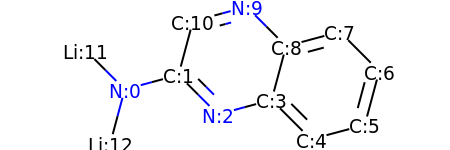

HETATM    1  N1  UNL     1      -3.083  -0.309   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.634   0.079   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.573  -0.981   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.876  -0.593   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.936  -1.654   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       3.385  -1.265   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.773   0.183   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.713   1.244   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.264   0.856   0.000  1.00  0.00           C  
HETATM   10  N3  UNL     1       0.203   1.917   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -1.246   1.528   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -4.143   0.752   0.000  1.00  0.00          LI  
HETATM   13 LI2  UNL     1  

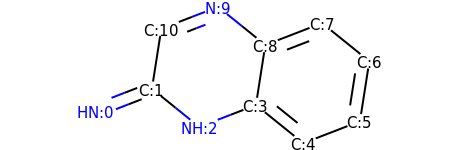

HETATM    1  N1  UNL     1      -3.711  -0.800   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -2.312  -0.259   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -1.144  -1.201   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.255  -0.661   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.423  -1.603   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.822  -1.063   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.054   0.419   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.886   1.361   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.487   0.821   0.000  1.00  0.00           C  
HETATM   10  N3  UNL     1      -0.680   1.763   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -2.080   1.223   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6
CONE

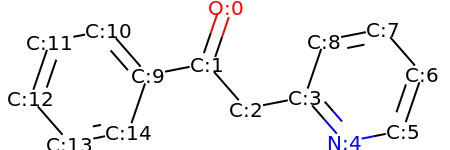

HETATM    1  O1  UNL     1      -0.007   1.852   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.493   0.433   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.494  -0.697   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.966  -0.408   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       2.952  -1.538   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       4.424  -1.248   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       4.909   0.171   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.923   1.301   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.451   1.012   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -1.965   0.143   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.951   1.273   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -4.423   0.984   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

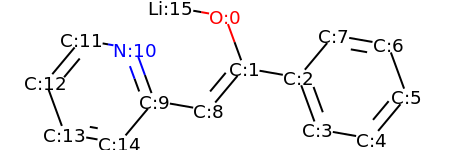

HETATM    1  O1  UNL     1       0.062   1.720   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.578   0.311   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.055   0.054   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.571  -1.355   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       4.049  -1.612   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       5.011  -0.461   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       4.495   0.948   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.017   1.205   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -0.384  -0.840   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.862  -0.582   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1      -2.378   0.826   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1      -3.856   1.084   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

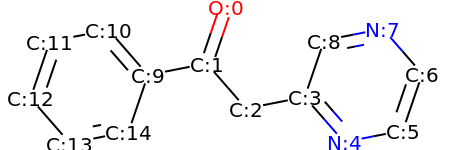

HETATM    1  O1  UNL     1      -0.007   1.852   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.493   0.433   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.494  -0.697   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.966  -0.408   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       2.952  -1.538   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       4.424  -1.248   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       4.909   0.171   0.000  1.00  0.00           C  
HETATM    8  N2  UNL     1       3.923   1.301   0.000  1.00  0.00           N  
HETATM    9  C6  UNL     1       2.451   1.012   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1      -1.965   0.143   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1      -2.951   1.273   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1      -4.423   0.984   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

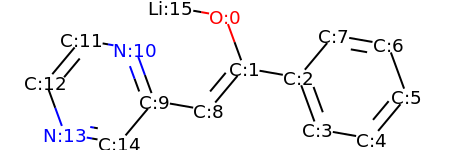

HETATM    1  O1  UNL     1       0.062   1.720   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.578   0.311   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.055   0.054   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.571  -1.355   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       4.049  -1.612   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       5.011  -0.461   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       4.495   0.948   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.017   1.205   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -0.384  -0.840   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.862  -0.582   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1      -2.378   0.826   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1      -3.856   1.084   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

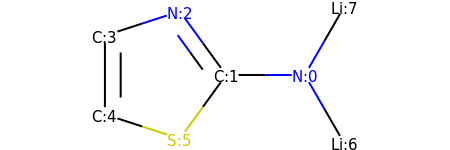

HETATM    1  N1  UNL     1       1.547  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.047  -0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.834   1.214   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -2.261   0.750   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -2.261  -0.750   0.000  1.00  0.00           C  
HETATM    6  S1  UNL     1      -0.834  -1.214   0.000  1.00  0.00           S  
HETATM    7 LI1  UNL     1       2.297  -1.299   0.000  1.00  0.00          LI  
HETATM    8 LI2  UNL     1       2.297   1.299   0.000  1.00  0.00          LI  
CONECT    1    2    7    8
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
END

search for patterns ...


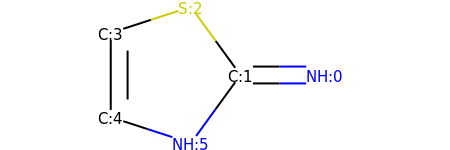

HETATM    1  N1  UNL     1       2.313  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.813  -0.000   0.000  1.00  0.00           C  
HETATM    3  S1  UNL     1      -0.068   1.214   0.000  1.00  0.00           S  
HETATM    4  C2  UNL     1      -1.495   0.750   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.495  -0.750   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -0.068  -1.214   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
END

#################
#################
search for patterns ...
found secondary amine


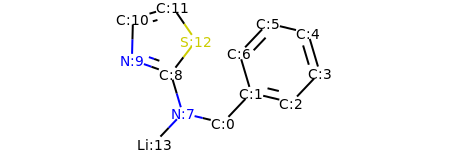

HETATM    1  C1  UNL     1       0.200  -1.981   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.232  -0.892   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       2.691  -1.242   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       3.723  -0.153   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       3.297   1.285   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       1.838   1.634   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1       0.806   0.546   0.000  1.00  0.00           C  
HETATM    8  N1  UNL     1      -1.258  -1.631   0.000  1.00  0.00           N  
HETATM    9  C8  UNL     1      -1.685  -0.193   0.000  1.00  0.00           C  
HETATM   10  N2  UNL     1      -3.099   0.307   0.000  1.00  0.00           N  
HETATM   11  C9  UNL     1      -3.060   1.807   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -1.622   2.233   0.000  1.00  0.00           C  
HETATM   13  S1  UNL     1  

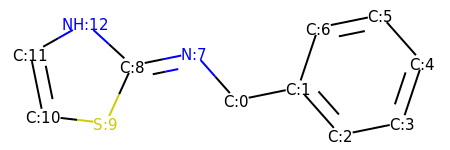

HETATM    1  C1  UNL     1       0.148  -0.582   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.618  -0.282   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       2.612  -1.405   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       4.082  -1.106   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       4.558   0.317   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       3.564   1.440   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1       2.094   1.140   0.000  1.00  0.00           C  
HETATM    8  N1  UNL     1      -0.846   0.542   0.000  1.00  0.00           N  
HETATM    9  C8  UNL     1      -2.316   0.242   0.000  1.00  0.00           C  
HETATM   10  S1  UNL     1      -2.937  -1.123   0.000  1.00  0.00           S  
HETATM   11  C9  UNL     1      -4.428  -0.954   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -4.727   0.516   0.000  1.00  0.00           C  
HETATM   13  N2  UNL     1  

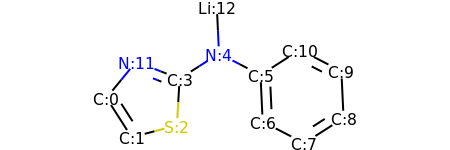

HETATM    1  C1  UNL     1      -3.937  -0.326   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -3.128  -1.589   0.000  1.00  0.00           C  
HETATM    3  S1  UNL     1      -1.676  -1.210   0.000  1.00  0.00           S  
HETATM    4  C3  UNL     1      -1.588   0.288   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.325   1.097   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.007   0.408   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.076  -1.091   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.408  -1.780   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.671  -0.971   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.602   0.528   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       2.270   1.217   0.000  1.00  0.00           C  
HETATM   12  N2  UNL     1      -2.985   0.834   0.000  1.00  0.00           N  
HETATM   13 LI1  UNL     1  

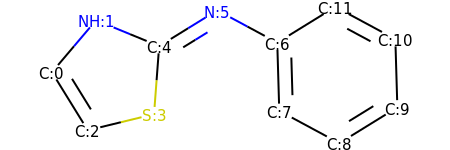

HETATM    1  C1  UNL     1      -3.971  -0.043   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -3.000   1.100   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -3.183  -1.320   0.000  1.00  0.00           C  
HETATM    4  S1  UNL     1      -1.725  -0.965   0.000  1.00  0.00           S  
HETATM    5  C3  UNL     1      -1.613   0.531   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -0.336   1.319   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       0.984   0.608   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       1.028  -0.892   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.349  -1.603   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.625  -0.815   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       3.581   0.684   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       2.261   1.396   0.000  1.00  0.00           C  
CONECT    1    2    3    3
C

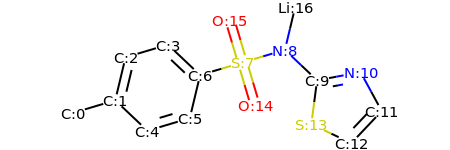

HETATM    1  C1  UNL     1      -5.603  -1.008   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -4.166  -0.581   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -3.817   0.878   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -2.379   1.306   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -3.076  -1.612   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -1.639  -1.184   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -1.290   0.274   0.000  1.00  0.00           C  
HETATM    8  S1  UNL     1       0.148   0.702   0.000  1.00  0.00           S  
HETATM    9  N1  UNL     1       1.586   1.129   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1       2.675   0.098   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1       4.149   0.373   0.000  1.00  0.00           N  
HETATM   12  C9  UNL     1       4.866  -0.945   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

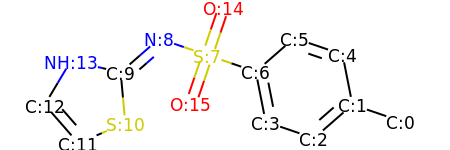

HETATM    1  C1  UNL     1       5.444  -1.065   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       4.025  -0.580   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       2.895  -1.567   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       1.476  -1.083   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       3.735   0.892   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       2.315   1.376   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1       1.186   0.389   0.000  1.00  0.00           C  
HETATM    8  S1  UNL     1      -0.234   0.874   0.000  1.00  0.00           S  
HETATM    9  N1  UNL     1      -1.654   1.358   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -2.783   0.371   0.000  1.00  0.00           C  
HETATM   11  S2  UNL     1      -2.648  -1.123   0.000  1.00  0.00           S  
HETATM   12  C9  UNL     1      -4.028  -1.713   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

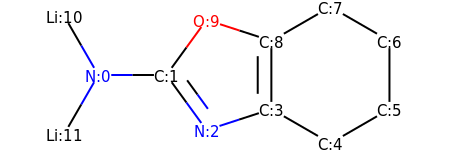

HETATM    1  N1  UNL     1      -2.951  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.451   0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.569  -1.214   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.858  -0.750   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.157  -1.500   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       3.456  -0.750   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.456   0.750   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.157   1.500   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.858   0.750   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1      -0.569   1.214   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1      -3.701   1.299   0.000  1.00  0.00          LI  
HETATM   12 LI2  UNL     1      -3.701  -1.299   0.000  1.00  0.00          LI  
CONECT    1    2   11   12
C

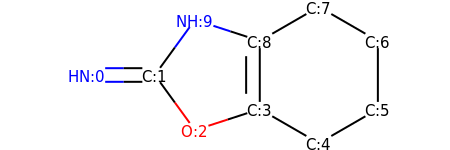

HETATM    1  N1  UNL     1      -3.691  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -2.191  -0.000   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -1.309  -1.214   0.000  1.00  0.00           O  
HETATM    4  C2  UNL     1       0.118  -0.750   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.417  -1.500   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.716  -0.750   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.716   0.750   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.417   1.500   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.118   0.750   0.000  1.00  0.00           C  
HETATM   10  N2  UNL     1      -1.309   1.214   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3   10
CONECT    3    4
CONECT    4    5    9    9
CONECT    5    6
CONECT    6    7
CONECT    7    8
CONECT    8    9
CONECT    9   10
END

############

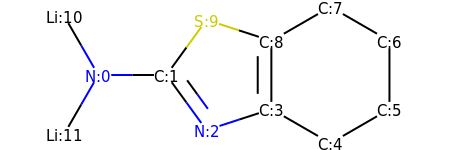

HETATM    1  N1  UNL     1      -2.951  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.451   0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.569  -1.214   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.858  -0.750   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.157  -1.500   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       3.456  -0.750   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.456   0.750   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.157   1.500   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.858   0.750   0.000  1.00  0.00           C  
HETATM   10  S1  UNL     1      -0.569   1.214   0.000  1.00  0.00           S  
HETATM   11 LI1  UNL     1      -3.701   1.299   0.000  1.00  0.00          LI  
HETATM   12 LI2  UNL     1      -3.701  -1.299   0.000  1.00  0.00          LI  
CONECT    1    2   11   12
C

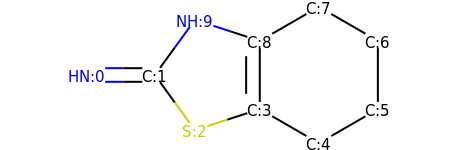

HETATM    1  N1  UNL     1      -3.691  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -2.191  -0.000   0.000  1.00  0.00           C  
HETATM    3  S1  UNL     1      -1.309  -1.214   0.000  1.00  0.00           S  
HETATM    4  C2  UNL     1       0.118  -0.750   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.417  -1.500   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.716  -0.750   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.716   0.750   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.417   1.500   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.118   0.750   0.000  1.00  0.00           C  
HETATM   10  N2  UNL     1      -1.309   1.214   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3   10
CONECT    3    4
CONECT    4    5    9    9
CONECT    5    6
CONECT    6    7
CONECT    7    8
CONECT    8    9
CONECT    9   10
END

############

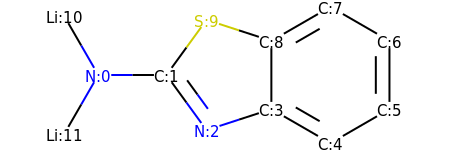

HETATM    1  N1  UNL     1      -2.951  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.451   0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.569  -1.214   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.858  -0.750   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.157  -1.500   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       3.456  -0.750   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.456   0.750   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.157   1.500   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.858   0.750   0.000  1.00  0.00           C  
HETATM   10  S1  UNL     1      -0.569   1.214   0.000  1.00  0.00           S  
HETATM   11 LI1  UNL     1      -3.701   1.299   0.000  1.00  0.00          LI  
HETATM   12 LI2  UNL     1      -3.701  -1.299   0.000  1.00  0.00          LI  
CONECT    1    2   11   12
C

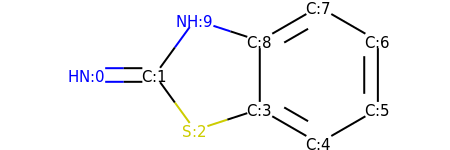

HETATM    1  N1  UNL     1      -3.691  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -2.191  -0.000   0.000  1.00  0.00           C  
HETATM    3  S1  UNL     1      -1.309  -1.214   0.000  1.00  0.00           S  
HETATM    4  C2  UNL     1       0.118  -0.750   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.417  -1.500   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.716  -0.750   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.716   0.750   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.417   1.500   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.118   0.750   0.000  1.00  0.00           C  
HETATM   10  N2  UNL     1      -1.309   1.214   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3   10
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9    9
CONECT    9   10
END

##

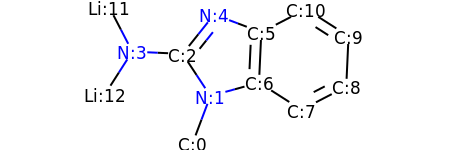

HETATM    1  C1  UNL     1      -1.063  -2.391   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -0.535  -0.987   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -1.360   0.265   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -2.859   0.334   0.000  1.00  0.00           N  
HETATM    5  N3  UNL     1      -0.424   1.437   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       0.980   0.909   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.911  -0.589   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       2.175  -1.398   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.507  -0.708   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.575   0.791   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       2.311   1.599   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -3.549   1.666   0.000  1.00  0.00          LI  
HETATM   13 LI2  UNL     1  

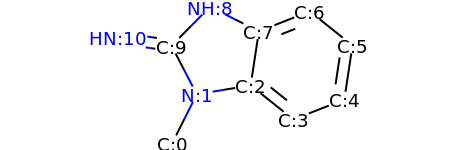

HETATM    1  C1  UNL     1      -1.952  -2.132   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -1.281  -0.791   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       0.199  -0.546   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.371  -1.482   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.768  -0.935   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.993   0.548   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.820   1.484   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.424   0.937   0.000  1.00  0.00           C  
HETATM    9  N2  UNL     1      -0.917   1.609   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -1.971   0.541   0.000  1.00  0.00           C  
HETATM   11  N3  UNL     1      -3.454   0.766   0.000  1.00  0.00           N  
CONECT    1    2
CONECT    2    3   10
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6    6
CONE

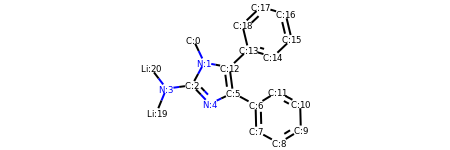

HETATM    1  C1  UNL     1      -2.634   2.189   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -1.988   0.836   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -2.704  -0.483   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -4.191  -0.678   0.000  1.00  0.00           N  
HETATM    5  N3  UNL     1      -1.672  -1.571   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -0.318  -0.925   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       1.001  -1.641   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       1.040  -3.140   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.358  -3.856   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.637  -3.072   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       3.598  -1.573   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       2.280  -0.857   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

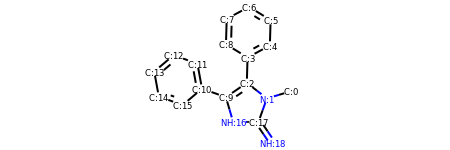

HETATM    1  C1  UNL     1       3.674  -0.943   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       2.234  -1.365   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       1.047  -0.449   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.090   1.050   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.410   1.762   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.454   3.262   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.177   4.049   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -0.143   3.337   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -0.187   1.838   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -0.192  -1.295   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -1.604  -0.791   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -1.874   0.685   0.000  1.00  0.00           C  
HETATM   13  C12 UNL     1  

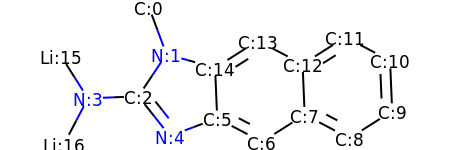

HETATM    1  C1  UNL     1      -2.344   2.390   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -1.822   0.984   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -2.653  -0.265   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -4.151  -0.327   0.000  1.00  0.00           N  
HETATM    5  N3  UNL     1      -1.722  -1.441   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -0.315  -0.919   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       1.013  -1.615   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       2.280  -0.812   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.609  -1.507   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       4.876  -0.704   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       4.814   0.794   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       3.485   1.490   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

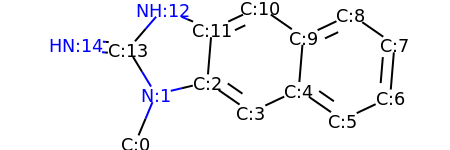

HETATM    1  C1  UNL     1      -3.092  -2.216   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -2.512  -0.833   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -1.052  -0.489   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.181  -1.344   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.537  -0.703   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.770  -1.558   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       4.126  -0.918   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       4.250   0.577   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       3.018   1.432   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       1.661   0.791   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       0.428   1.646   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -0.928   1.006   0.000  1.00  0.00           C  
HETATM   13  N2  UNL     1  

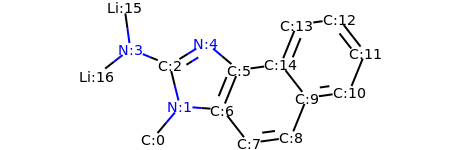

HETATM    1  C1  UNL     1      -2.910  -2.213   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -1.943  -1.067   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -2.302   0.390   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -3.692   0.955   0.000  1.00  0.00           N  
HETATM    5  N3  UNL     1      -1.028   1.182   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       0.119   0.215   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1      -0.447  -1.175   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       0.474  -2.359   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       1.960  -2.154   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       2.525  -0.764   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       4.011  -0.559   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       4.576   0.830   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

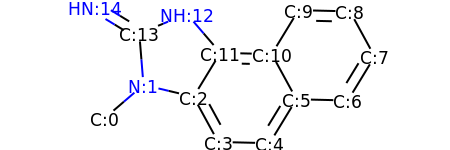

HETATM    1  C1  UNL     1      -3.778  -1.461   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -2.640  -0.484   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -1.180  -0.831   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.462  -2.148   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.038  -2.184   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.819  -0.903   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.318  -0.939   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       4.099   0.342   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       3.381   1.659   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       1.881   1.694   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       1.100   0.414   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -0.399   0.450   0.000  1.00  0.00           C  
HETATM   13  N2  UNL     1  

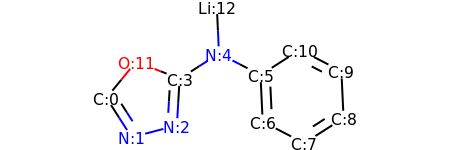

HETATM    1  C1  UNL     1      -3.937  -0.326   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -3.128  -1.589   0.000  1.00  0.00           N  
HETATM    3  N2  UNL     1      -1.676  -1.210   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.588   0.288   0.000  1.00  0.00           C  
HETATM    5  N3  UNL     1      -0.325   1.097   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       1.007   0.408   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       1.076  -1.091   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       2.408  -1.780   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.671  -0.971   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.602   0.528   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       2.270   1.217   0.000  1.00  0.00           C  
HETATM   12  O1  UNL     1      -2.985   0.834   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

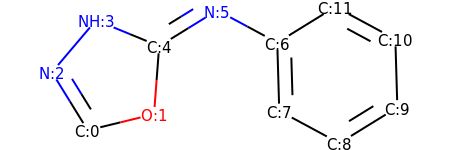

HETATM    1  C1  UNL     1      -3.183  -1.320   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -1.725  -0.965   0.000  1.00  0.00           O  
HETATM    3  N1  UNL     1      -3.971  -0.043   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -3.000   1.100   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -1.613   0.531   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -0.336   1.319   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1       0.984   0.608   0.000  1.00  0.00           C  
HETATM    8  C4  UNL     1       1.028  -0.892   0.000  1.00  0.00           C  
HETATM    9  C5  UNL     1       2.349  -1.603   0.000  1.00  0.00           C  
HETATM   10  C6  UNL     1       3.625  -0.815   0.000  1.00  0.00           C  
HETATM   11  C7  UNL     1       3.581   0.684   0.000  1.00  0.00           C  
HETATM   12  C8  UNL     1       2.261   1.396   0.000  1.00  0.00           C  
CONECT    1    2    3    3
C

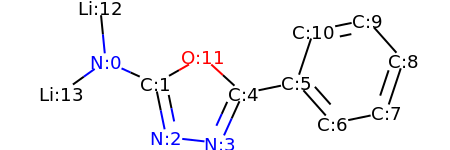

HETATM    1  N1  UNL     1      -3.684   0.487   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -2.318  -0.132   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -2.016  -1.601   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1      -0.525  -1.768   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       0.094  -0.402   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.563  -0.100   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       2.560  -1.221   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       4.029  -0.919   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       4.502   0.504   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.506   1.626   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       2.037   1.324   0.000  1.00  0.00           C  
HETATM   12  O1  UNL     1      -1.014   0.609   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

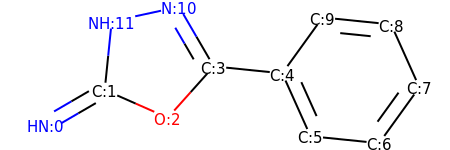

HETATM    1  N1  UNL     1      -4.326  -1.063   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -3.030  -0.309   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -1.658  -0.915   0.000  1.00  0.00           O  
HETATM    4  C2  UNL     1      -0.658   0.204   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.835   0.052   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.449  -1.316   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.942  -1.468   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.819  -0.252   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.205   1.117   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.712   1.268   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -1.412   1.500   0.000  1.00  0.00           N  
HETATM   12  N3  UNL     1      -2.878   1.183   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT

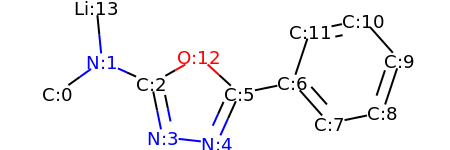

HETATM    1  C1  UNL     1      -4.903  -0.386   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -3.684   0.487   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -2.318  -0.132   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -2.016  -1.601   0.000  1.00  0.00           N  
HETATM    5  N3  UNL     1      -0.525  -1.768   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       0.094  -0.402   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       1.563  -0.100   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       2.560  -1.221   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       4.029  -0.919   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       4.502   0.504   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       3.506   1.626   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       2.037   1.324   0.000  1.00  0.00           C  
HETATM   13  O1  UNL     1  

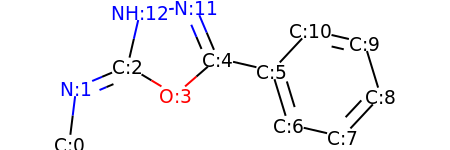

HETATM    1  C1  UNL     1      -4.255  -1.845   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -4.071  -0.356   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -2.690   0.229   0.000  1.00  0.00           C  
HETATM    4  O1  UNL     1      -1.405  -0.545   0.000  1.00  0.00           O  
HETATM    5  C3  UNL     1      -0.272   0.439   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.189   0.100   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.627  -1.335   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.088  -1.673   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       4.112  -0.577   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.674   0.858   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       2.213   1.196   0.000  1.00  0.00           C  
HETATM   12  N2  UNL     1      -0.857   1.820   0.000  1.00  0.00           N  
HETATM   13  N3  UNL     1  

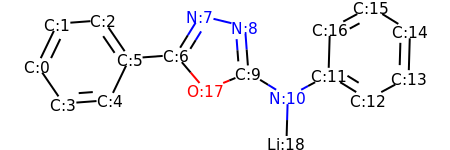

HETATM    1  C1  UNL     1      -6.239  -0.089   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -5.589   1.263   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -4.093   1.376   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -5.394  -1.328   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -3.898  -1.215   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -3.248   0.137   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -1.752   0.249   0.000  1.00  0.00           C  
HETATM    8  N1  UNL     1      -0.964   1.526   0.000  1.00  0.00           N  
HETATM    9  N2  UNL     1       0.493   1.171   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1       0.606  -0.325   0.000  1.00  0.00           C  
HETATM   11  N3  UNL     1       1.882  -1.113   0.000  1.00  0.00           N  
HETATM   12  C9  UNL     1       3.203  -0.402   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

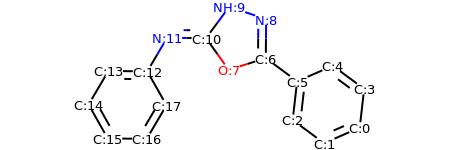

HETATM    1  C1  UNL     1       5.084  -1.736   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       3.709  -2.334   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       2.503  -1.442   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       5.254  -0.246   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       4.048   0.647   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       2.673   0.049   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1       1.467   0.941   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       0.036   0.490   0.000  1.00  0.00           O  
HETATM    9  N1  UNL     1       1.480   2.441   0.000  1.00  0.00           N  
HETATM   10  N2  UNL     1       0.058   2.917   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -0.834   1.711   0.000  1.00  0.00           C  
HETATM   12  N3  UNL     1      -2.334   1.724   0.000  1.00  0.00           N  
HETATM   13  C9  UNL     1  

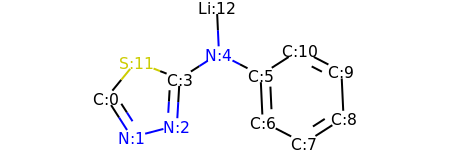

HETATM    1  C1  UNL     1      -3.937  -0.326   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -3.128  -1.589   0.000  1.00  0.00           N  
HETATM    3  N2  UNL     1      -1.676  -1.210   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.588   0.288   0.000  1.00  0.00           C  
HETATM    5  N3  UNL     1      -0.325   1.097   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       1.007   0.408   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       1.076  -1.091   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       2.408  -1.780   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.671  -0.971   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.602   0.528   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       2.270   1.217   0.000  1.00  0.00           C  
HETATM   12  S1  UNL     1      -2.985   0.834   0.000  1.00  0.00           S  
HETATM   13 LI1  UNL     1  

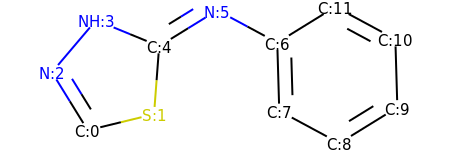

HETATM    1  C1  UNL     1      -3.183  -1.320   0.000  1.00  0.00           C  
HETATM    2  S1  UNL     1      -1.725  -0.965   0.000  1.00  0.00           S  
HETATM    3  N1  UNL     1      -3.971  -0.043   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -3.000   1.100   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -1.613   0.531   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -0.336   1.319   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1       0.984   0.608   0.000  1.00  0.00           C  
HETATM    8  C4  UNL     1       1.028  -0.892   0.000  1.00  0.00           C  
HETATM    9  C5  UNL     1       2.349  -1.603   0.000  1.00  0.00           C  
HETATM   10  C6  UNL     1       3.625  -0.815   0.000  1.00  0.00           C  
HETATM   11  C7  UNL     1       3.581   0.684   0.000  1.00  0.00           C  
HETATM   12  C8  UNL     1       2.261   1.396   0.000  1.00  0.00           C  
CONECT    1    2    3    3
C

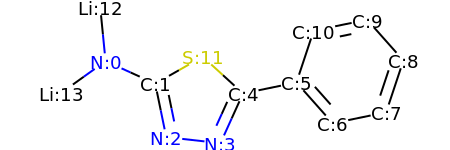

HETATM    1  N1  UNL     1      -3.684   0.487   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -2.318  -0.132   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -2.016  -1.601   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1      -0.525  -1.768   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       0.094  -0.402   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.563  -0.100   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       2.560  -1.221   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       4.029  -0.919   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       4.502   0.504   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.506   1.626   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       2.037   1.324   0.000  1.00  0.00           C  
HETATM   12  S1  UNL     1      -1.014   0.609   0.000  1.00  0.00           S  
HETATM   13 LI1  UNL     1  

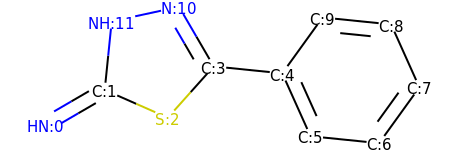

HETATM    1  N1  UNL     1      -4.326  -1.063   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -3.030  -0.309   0.000  1.00  0.00           C  
HETATM    3  S1  UNL     1      -1.658  -0.915   0.000  1.00  0.00           S  
HETATM    4  C2  UNL     1      -0.658   0.204   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.835   0.052   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.449  -1.316   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.942  -1.468   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.819  -0.252   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.205   1.117   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.712   1.268   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -1.412   1.500   0.000  1.00  0.00           N  
HETATM   12  N3  UNL     1      -2.878   1.183   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT

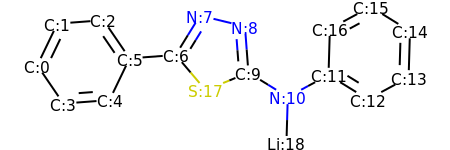

HETATM    1  C1  UNL     1      -6.239  -0.089   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -5.589   1.263   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -4.093   1.376   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -5.394  -1.328   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -3.898  -1.215   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -3.248   0.137   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -1.752   0.249   0.000  1.00  0.00           C  
HETATM    8  N1  UNL     1      -0.964   1.526   0.000  1.00  0.00           N  
HETATM    9  N2  UNL     1       0.493   1.171   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1       0.606  -0.325   0.000  1.00  0.00           C  
HETATM   11  N3  UNL     1       1.882  -1.113   0.000  1.00  0.00           N  
HETATM   12  C9  UNL     1       3.203  -0.402   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

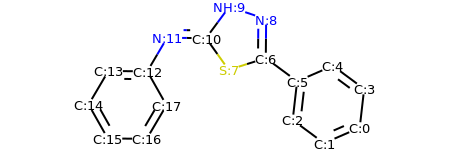

HETATM    1  C1  UNL     1       5.084  -1.736   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       3.709  -2.334   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       2.503  -1.442   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       5.254  -0.246   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       4.048   0.647   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       2.673   0.049   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1       1.467   0.941   0.000  1.00  0.00           C  
HETATM    8  S1  UNL     1       0.036   0.490   0.000  1.00  0.00           S  
HETATM    9  N1  UNL     1       1.480   2.441   0.000  1.00  0.00           N  
HETATM   10  N2  UNL     1       0.058   2.917   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -0.834   1.711   0.000  1.00  0.00           C  
HETATM   12  N3  UNL     1      -2.334   1.724   0.000  1.00  0.00           N  
HETATM   13  C9  UNL     1  

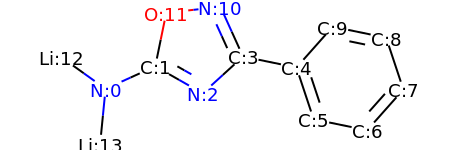

HETATM    1  N1  UNL     1      -3.684  -0.487   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -2.318   0.132   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -1.014  -0.609   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.094   0.402   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.563   0.100   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.037  -1.324   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.506  -1.626   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       4.502  -0.504   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       4.029   0.919   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       2.560   1.221   0.000  1.00  0.00           C  
HETATM   11  N3  UNL     1      -0.525   1.768   0.000  1.00  0.00           N  
HETATM   12  O1  UNL     1      -2.016   1.601   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

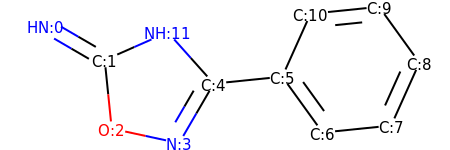

HETATM    1  N1  UNL     1      -4.326   1.063   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -3.030   0.309   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -2.878  -1.183   0.000  1.00  0.00           O  
HETATM    4  N2  UNL     1      -1.412  -1.500   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -0.658  -0.204   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       0.835  -0.052   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       1.712  -1.268   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.205  -1.117   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.819   0.252   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       2.942   1.468   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       1.449   1.316   0.000  1.00  0.00           C  
HETATM   12  N3  UNL     1      -1.658   0.915   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT

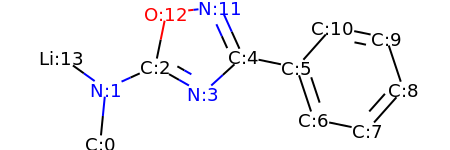

HETATM    1  C1  UNL     1      -3.831  -1.980   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -3.684  -0.487   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -2.318   0.132   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -1.014  -0.609   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.094   0.402   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.563   0.100   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.037  -1.324   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.506  -1.626   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       4.502  -0.504   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       4.029   0.919   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       2.560   1.221   0.000  1.00  0.00           C  
HETATM   12  N3  UNL     1      -0.525   1.768   0.000  1.00  0.00           N  
HETATM   13  O1  UNL     1  

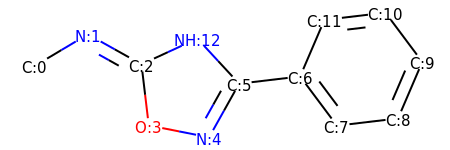

HETATM    1  C1  UNL     1      -5.199   0.205   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -3.911   0.973   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -2.601   0.240   0.000  1.00  0.00           C  
HETATM    4  O1  UNL     1      -2.424  -1.249   0.000  1.00  0.00           O  
HETATM    5  N2  UNL     1      -0.953  -1.541   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -0.221  -0.232   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       1.269  -0.055   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       2.167  -1.256   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.656  -1.079   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       4.248   0.299   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       3.350   1.501   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       1.860   1.324   0.000  1.00  0.00           C  
HETATM   13  N3  UNL     1  

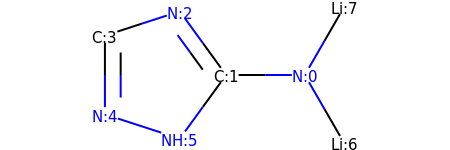

HETATM    1  N1  UNL     1       1.547  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.047  -0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.834   1.214   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -2.261   0.750   0.000  1.00  0.00           C  
HETATM    5  N3  UNL     1      -2.261  -0.750   0.000  1.00  0.00           N  
HETATM    6  N4  UNL     1      -0.834  -1.214   0.000  1.00  0.00           N  
HETATM    7 LI1  UNL     1       2.297  -1.299   0.000  1.00  0.00          LI  
HETATM    8 LI2  UNL     1       2.297   1.299   0.000  1.00  0.00          LI  
CONECT    1    2    7    8
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
END

search for patterns ...


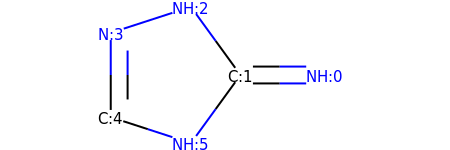

HETATM    1  N1  UNL     1       2.313  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.813  -0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.068   1.214   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1      -1.495   0.750   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -1.495  -0.750   0.000  1.00  0.00           C  
HETATM    6  N4  UNL     1      -0.068  -1.214   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
END

#################
#################
search for patterns ...
found primary amine


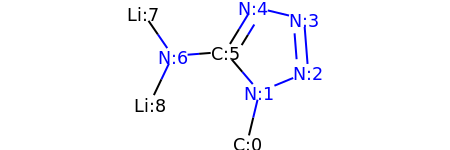

HETATM    1  C1  UNL     1       0.512  -2.314   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       0.862  -0.856   0.000  1.00  0.00           N  
HETATM    3  N2  UNL     1       2.248  -0.282   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1       2.131   1.213   0.000  1.00  0.00           N  
HETATM    5  N4  UNL     1       0.673   1.564   0.000  1.00  0.00           N  
HETATM    6  C2  UNL     1      -0.111   0.286   0.000  1.00  0.00           C  
HETATM    7  N5  UNL     1      -1.607   0.169   0.000  1.00  0.00           N  
HETATM    8 LI1  UNL     1      -2.456   1.405   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1      -2.253  -1.185   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    9
END

search for patterns ...


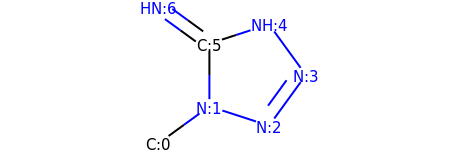

HETATM    1  C1  UNL     1      -1.604  -1.632   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -0.391  -0.750   0.000  1.00  0.00           N  
HETATM    3  N2  UNL     1       1.036  -1.214   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1       1.918   0.000   0.000  1.00  0.00           N  
HETATM    5  N4  UNL     1       1.036   1.214   0.000  1.00  0.00           N  
HETATM    6  C2  UNL     1      -0.391   0.750   0.000  1.00  0.00           C  
HETATM    7  N5  UNL     1      -1.604   1.632   0.000  1.00  0.00           N  
CONECT    1    2
CONECT    2    3    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found secondary amine


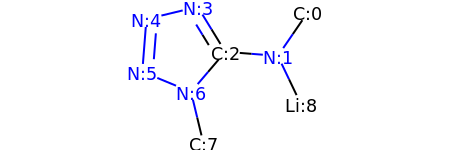

HETATM    1  C1  UNL     1       2.456   1.405   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       1.607   0.169   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       0.111   0.286   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -0.673   1.564   0.000  1.00  0.00           N  
HETATM    5  N3  UNL     1      -2.131   1.213   0.000  1.00  0.00           N  
HETATM    6  N4  UNL     1      -2.248  -0.282   0.000  1.00  0.00           N  
HETATM    7  N5  UNL     1      -0.862  -0.856   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1      -0.512  -2.314   0.000  1.00  0.00           C  
HETATM    9 LI1  UNL     1       2.253  -1.185   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    9
CONECT    3    4    4    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8
END

search for patterns ...


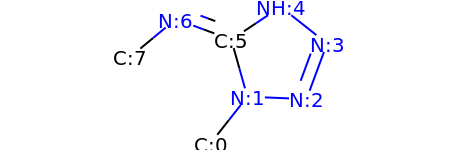

HETATM    1  C1  UNL     1      -0.710  -2.027   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       0.219  -0.850   0.000  1.00  0.00           N  
HETATM    3  N2  UNL     1       1.718  -0.910   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1       2.239   0.497   0.000  1.00  0.00           N  
HETATM    5  N4  UNL     1       1.061   1.426   0.000  1.00  0.00           N  
HETATM    6  C2  UNL     1      -0.187   0.594   0.000  1.00  0.00           C  
HETATM    7  N5  UNL     1      -1.593   1.114   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1      -2.747   0.156   0.000  1.00  0.00           C  
CONECT    1    2
CONECT    2    3    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
END

#################
#################
search for patterns ...
found imine
found secondary amine


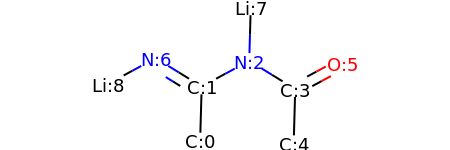

HETATM    1  C1  UNL     1      -0.913  -1.641   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.870  -0.142   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.449   0.571   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       1.727  -0.216   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.684  -1.715   0.000  1.00  0.00           C  
HETATM    6  O1  UNL     1       3.046   0.497   0.000  1.00  0.00           O  
HETATM    7  N2  UNL     1      -2.148   0.645   0.000  1.00  0.00           N  
HETATM    8 LI1  UNL     1       0.492   2.070   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1      -3.467  -0.068   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    7    7
CONECT    3    4    8
CONECT    4    5    6    6
CONECT    7    9
END

search for patterns ...
found primary amine


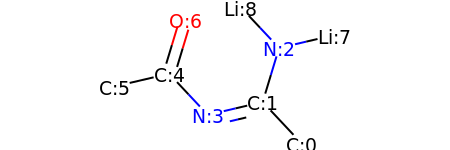

HETATM    1  C1  UNL     1       1.824  -1.945   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       0.798  -0.851   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.233   0.585   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.662  -1.193   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -1.689  -0.098   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -3.149  -0.440   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1      -1.254   1.337   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1       2.693   0.926   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1       0.206   1.679   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    4    4
CONECT    3    8    9
CONECT    4    5
CONECT    5    6    7    7
END

#################
#################
search for patterns ...
found imine
found primary amine
found secondary amine


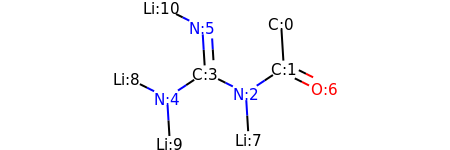

HETATM    1  C1  UNL     1       2.022   1.763   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.113   0.266   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.862  -0.562   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.480   0.107   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.731  -0.720   0.000  1.00  0.00           N  
HETATM    6  N3  UNL     1      -0.571   1.605   0.000  1.00  0.00           N  
HETATM    7  O1  UNL     1       3.456  -0.404   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1       0.954  -2.059   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1      -3.073  -0.051   0.000  1.00  0.00          LI  
HETATM   10 LI3  UNL     1      -1.639  -2.218   0.000  1.00  0.00          LI  
HETATM   11 LI4  UNL     1      -1.913   2.274   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    7    7
CONECT    3    4    8
CONECT    4    5    6    6
CONECT    5    9

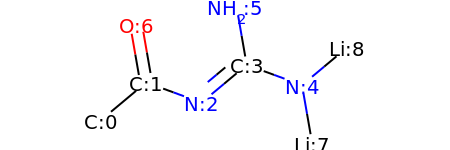

HETATM    1  C1  UNL     1      -3.170  -1.145   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.019  -0.183   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.611  -0.699   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       0.540   0.263   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       1.949  -0.253   0.000  1.00  0.00           N  
HETATM    6  N3  UNL     1       0.283   1.741   0.000  1.00  0.00           N  
HETATM    7  O1  UNL     1      -2.277   1.295   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1       2.206  -1.730   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1       3.100   0.709   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    7    7
CONECT    3    4    4
CONECT    4    5    6
CONECT    5    8    9
END

#################
#################
search for patterns ...
found secondary amine


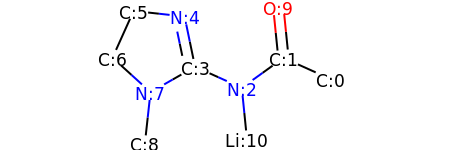

HETATM    1  C1  UNL     1       3.537  -0.294   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.169   0.322   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.952  -0.554   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.416   0.062   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -0.721   1.531   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -2.212   1.694   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -2.829   0.327   0.000  1.00  0.00           C  
HETATM    8  N3  UNL     1      -1.718  -0.682   0.000  1.00  0.00           N  
HETATM    9  C6  UNL     1      -1.882  -2.173   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1       2.019   1.815   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1       1.102  -2.047   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4   11
CONECT    4    5    5    8
CONECT    5    6

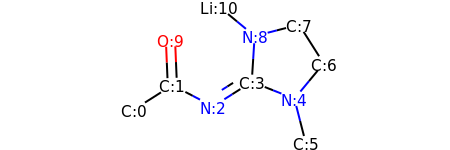

HETATM    1  C1  UNL     1      -3.472  -1.224   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.206  -0.421   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.877  -1.116   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       0.390  -0.312   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       1.785  -0.864   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       2.158  -2.317   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.741   0.291   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.937   1.558   0.000  1.00  0.00           C  
HETATM    9  N3  UNL     1       0.484   1.185   0.000  1.00  0.00           N  
HETATM   10  O1  UNL     1      -2.268   1.078   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1      -0.671   2.141   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4    4
CONECT    4    5    9
CONECT    5    6    7

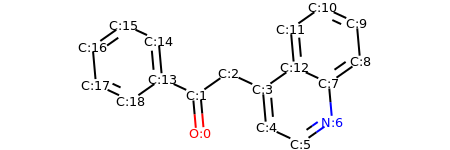

HETATM    1  O1  UNL     1      -1.446  -2.268   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.579  -0.774   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.351   0.088   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.009  -0.545   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.142  -2.039   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.502  -2.671   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1       3.729  -1.810   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       3.597  -0.315   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       4.825   0.546   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       4.693   2.040   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       3.332   2.673   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       2.105   1.811   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

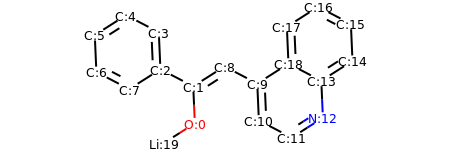

HETATM    1  O1  UNL     1      -1.406  -2.051   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.471  -0.552   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.802   0.141   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -2.867   1.639   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -4.198   2.332   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -5.463   1.526   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -5.397   0.027   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -4.067  -0.665   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -0.206   0.254   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       1.124  -0.439   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       1.190  -1.937   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1       2.520  -2.630   0.000  1.00  0.00           C  
HETATM   13  N1  UNL     1  

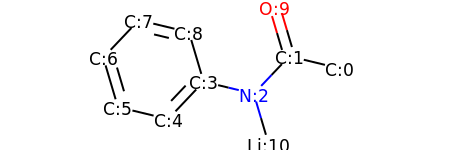

HETATM    1  C1  UNL     1       3.668   0.091   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.209   0.441   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.177  -0.647   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.282  -0.297   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.314  -1.385   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -2.773  -1.035   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -3.199   0.403   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -2.166   1.492   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -0.708   1.141   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1       1.783   1.879   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1       1.603  -2.085   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4   11
CONECT    4    5    5    9
CONECT    5    6

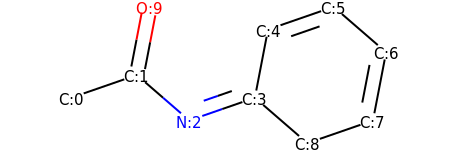

HETATM    1  C1  UNL     1      -3.799  -0.491   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.381   0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.247  -0.982   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       0.170  -0.491   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.454   0.982   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.871   1.473   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.005   0.491   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.721  -0.982   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       1.304  -1.473   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1      -2.098   1.473   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4    4
CONECT    4    5    9
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
END

#################
#

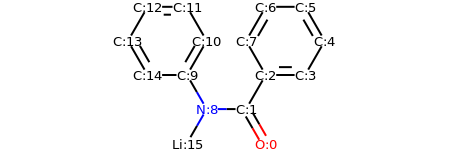

HETATM    1  O1  UNL     1       1.500  -3.085   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.750  -1.786   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.500  -0.487   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       3.000  -0.487   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.750   0.812   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.000   2.111   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.500   2.111   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.750   0.812   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -0.750  -1.786   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -1.500  -0.487   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -0.750   0.812   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -1.500   2.111   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

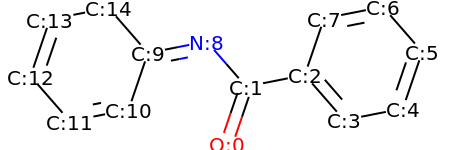

HETATM    1  O1  UNL     1       0.007  -1.852   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.493  -0.433   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.965  -0.143   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.951  -1.273   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       4.423  -0.984   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       4.908   0.436   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.922   1.565   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.450   1.276   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -0.494   0.697   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -1.966   0.408   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.451  -1.012   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -3.923  -1.301   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

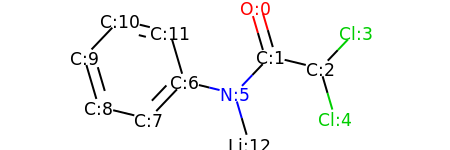

HETATM    1  O1  UNL     1       1.111   1.890   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.534   0.451   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.992   0.098   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1       4.027   1.183   0.000  1.00  0.00          CL  
HETATM    5 CL2  UNL     1       3.415  -1.342   0.000  1.00  0.00          CL  
HETATM    6  N1  UNL     1       0.499  -0.635   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1      -0.959  -0.282   0.000  1.00  0.00           C  
HETATM    8  C4  UNL     1      -1.994  -1.368   0.000  1.00  0.00           C  
HETATM    9  C5  UNL     1      -3.451  -1.014   0.000  1.00  0.00           C  
HETATM   10  C6  UNL     1      -3.874   0.425   0.000  1.00  0.00           C  
HETATM   11  C7  UNL     1      -2.839   1.511   0.000  1.00  0.00           C  
HETATM   12  C8  UNL     1      -1.382   1.157   0.000  1.00  0.00           C  
HETATM   13 LI1  UNL     1  

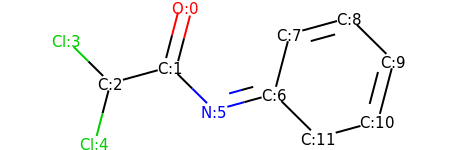

HETATM    1  O1  UNL     1      -1.239   1.680   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.618   0.229   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -3.065  -0.168   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1      -4.132   0.886   0.000  1.00  0.00          CL  
HETATM    5 CL2  UNL     1      -3.444  -1.619   0.000  1.00  0.00          CL  
HETATM    6  N1  UNL     1      -0.551  -0.825   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1       0.895  -0.428   0.000  1.00  0.00           C  
HETATM    8  C4  UNL     1       1.275   1.023   0.000  1.00  0.00           C  
HETATM    9  C5  UNL     1       2.721   1.421   0.000  1.00  0.00           C  
HETATM   10  C6  UNL     1       3.788   0.366   0.000  1.00  0.00           C  
HETATM   11  C7  UNL     1       3.409  -1.085   0.000  1.00  0.00           C  
HETATM   12  C8  UNL     1       1.962  -1.482   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT

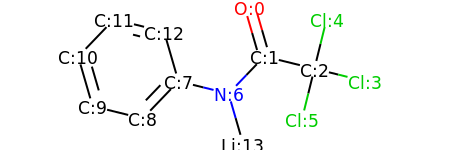

HETATM    1  O1  UNL     1       0.904   1.880   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.322   0.439   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.778   0.080   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1       4.235  -0.278   0.000  1.00  0.00          CL  
HETATM    5 CL2  UNL     1       3.137   1.537   0.000  1.00  0.00          CL  
HETATM    6 CL3  UNL     1       2.420  -1.376   0.000  1.00  0.00          CL  
HETATM    7  N1  UNL     1       0.283  -0.643   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1      -1.173  -0.284   0.000  1.00  0.00           C  
HETATM    9  C4  UNL     1      -2.212  -1.366   0.000  1.00  0.00           C  
HETATM   10  C5  UNL     1      -3.669  -1.008   0.000  1.00  0.00           C  
HETATM   11  C6  UNL     1      -4.086   0.433   0.000  1.00  0.00           C  
HETATM   12  C7  UNL     1      -3.048   1.515   0.000  1.00  0.00           C  
HETATM   13  C8  UNL     1  

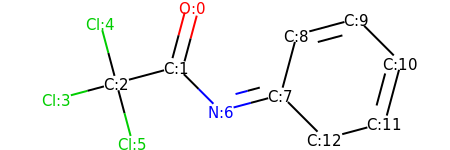

HETATM    1  O1  UNL     1      -0.993   1.700   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.381   0.251   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.830  -0.138   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1      -4.279  -0.526   0.000  1.00  0.00          CL  
HETATM    5 CL2  UNL     1      -3.218   1.311   0.000  1.00  0.00          CL  
HETATM    6 CL3  UNL     1      -2.442  -1.586   0.000  1.00  0.00          CL  
HETATM    7  N1  UNL     1      -0.320  -0.810   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1       1.128  -0.422   0.000  1.00  0.00           C  
HETATM    9  C4  UNL     1       1.517   1.027   0.000  1.00  0.00           C  
HETATM   10  C5  UNL     1       2.966   1.415   0.000  1.00  0.00           C  
HETATM   11  C6  UNL     1       4.026   0.355   0.000  1.00  0.00           C  
HETATM   12  C7  UNL     1       3.638  -1.094   0.000  1.00  0.00           C  
HETATM   13  C8  UNL     1  

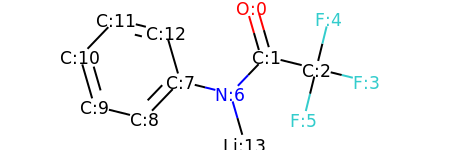

HETATM    1  O1  UNL     1       0.904   1.880   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.322   0.439   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.778   0.080   0.000  1.00  0.00           C  
HETATM    4  F1  UNL     1       4.235  -0.278   0.000  1.00  0.00           F  
HETATM    5  F2  UNL     1       3.137   1.537   0.000  1.00  0.00           F  
HETATM    6  F3  UNL     1       2.420  -1.376   0.000  1.00  0.00           F  
HETATM    7  N1  UNL     1       0.283  -0.643   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1      -1.173  -0.284   0.000  1.00  0.00           C  
HETATM    9  C4  UNL     1      -2.212  -1.366   0.000  1.00  0.00           C  
HETATM   10  C5  UNL     1      -3.669  -1.008   0.000  1.00  0.00           C  
HETATM   11  C6  UNL     1      -4.086   0.433   0.000  1.00  0.00           C  
HETATM   12  C7  UNL     1      -3.048   1.515   0.000  1.00  0.00           C  
HETATM   13  C8  UNL     1  

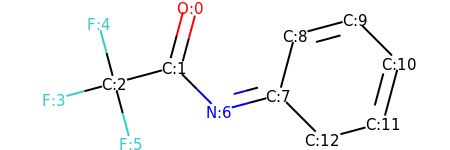

HETATM    1  O1  UNL     1      -0.993   1.700   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.381   0.251   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.830  -0.138   0.000  1.00  0.00           C  
HETATM    4  F1  UNL     1      -4.279  -0.526   0.000  1.00  0.00           F  
HETATM    5  F2  UNL     1      -3.218   1.311   0.000  1.00  0.00           F  
HETATM    6  F3  UNL     1      -2.442  -1.586   0.000  1.00  0.00           F  
HETATM    7  N1  UNL     1      -0.320  -0.810   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1       1.128  -0.422   0.000  1.00  0.00           C  
HETATM    9  C4  UNL     1       1.517   1.027   0.000  1.00  0.00           C  
HETATM   10  C5  UNL     1       2.966   1.415   0.000  1.00  0.00           C  
HETATM   11  C6  UNL     1       4.026   0.355   0.000  1.00  0.00           C  
HETATM   12  C7  UNL     1       3.638  -1.094   0.000  1.00  0.00           C  
HETATM   13  C8  UNL     1  

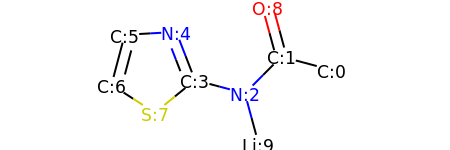

HETATM    1  C1  UNL     1       3.387   0.045   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.937   0.428   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.880  -0.636   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.570  -0.252   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.113   1.146   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -2.610   1.063   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -2.994  -0.387   0.000  1.00  0.00           C  
HETATM    8  S1  UNL     1      -1.733  -1.200   0.000  1.00  0.00           S  
HETATM    9  O1  UNL     1       1.544   1.876   0.000  1.00  0.00           O  
HETATM   10 LI1  UNL     1       1.273  -2.083   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    9    9
CONECT    3    4   10
CONECT    4    5    5    8
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
END

search for patterns ...


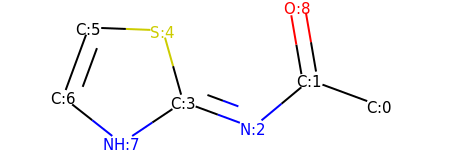

HETATM    1  C1  UNL     1       3.495  -0.519   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.088   0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.935  -0.960   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.473  -0.441   0.000  1.00  0.00           C  
HETATM    5  S1  UNL     1      -0.881   1.002   0.000  1.00  0.00           S  
HETATM    6  C4  UNL     1      -2.379   1.061   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -2.898  -0.347   0.000  1.00  0.00           C  
HETATM    8  N2  UNL     1      -1.720  -1.275   0.000  1.00  0.00           N  
HETATM    9  O1  UNL     1       1.833   1.478   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    9    9
CONECT    3    4    4
CONECT    4    5    8
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
END

#################
#################
search for patterns ...
found secondary amine


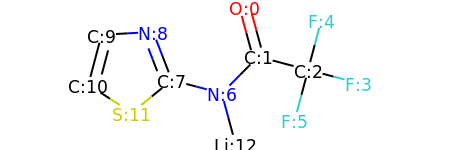

HETATM    1  O1  UNL     1       0.651   1.895   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.044   0.448   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.494   0.064   0.000  1.00  0.00           C  
HETATM    4  F1  UNL     1       3.944  -0.320   0.000  1.00  0.00           F  
HETATM    5  F2  UNL     1       2.877   1.514   0.000  1.00  0.00           F  
HETATM    6  F3  UNL     1       2.110  -1.386   0.000  1.00  0.00           F  
HETATM    7  N1  UNL     1      -0.013  -0.617   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1      -1.464  -0.233   0.000  1.00  0.00           C  
HETATM    9  N2  UNL     1      -2.006   1.166   0.000  1.00  0.00           N  
HETATM   10  C4  UNL     1      -3.503   1.082   0.000  1.00  0.00           C  
HETATM   11  C5  UNL     1      -3.887  -0.368   0.000  1.00  0.00           C  
HETATM   12  S1  UNL     1      -2.626  -1.181   0.000  1.00  0.00           S  
HETATM   13 LI1  UNL     1  

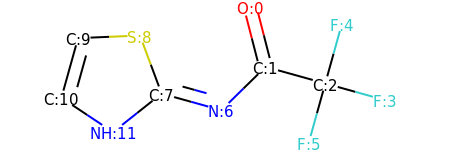

HETATM    1  O1  UNL     1       0.705   1.714   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.079   0.261   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.524  -0.141   0.000  1.00  0.00           C  
HETATM    4  F1  UNL     1       3.969  -0.544   0.000  1.00  0.00           F  
HETATM    5  F2  UNL     1       2.926   1.304   0.000  1.00  0.00           F  
HETATM    6  F3  UNL     1       2.121  -1.586   0.000  1.00  0.00           F  
HETATM    7  N1  UNL     1       0.008  -0.789   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1      -1.437  -0.386   0.000  1.00  0.00           C  
HETATM    9  S1  UNL     1      -1.961   1.020   0.000  1.00  0.00           S  
HETATM   10  C4  UNL     1      -3.459   0.956   0.000  1.00  0.00           C  
HETATM   11  C5  UNL     1      -3.862  -0.489   0.000  1.00  0.00           C  
HETATM   12  N2  UNL     1      -2.612  -1.318   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT

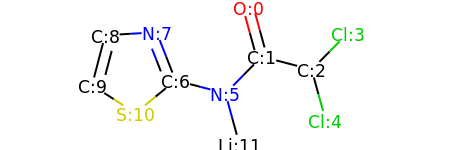

HETATM    1  O1  UNL     1       0.852   1.903   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.250   0.457   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.701   0.078   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1       3.755   1.146   0.000  1.00  0.00          CL  
HETATM    5 CL2  UNL     1       3.099  -1.368   0.000  1.00  0.00          CL  
HETATM    6  N1  UNL     1       0.196  -0.611   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1      -1.255  -0.232   0.000  1.00  0.00           C  
HETATM    8  N2  UNL     1      -1.802   1.165   0.000  1.00  0.00           N  
HETATM    9  C4  UNL     1      -3.299   1.077   0.000  1.00  0.00           C  
HETATM   10  C5  UNL     1      -3.678  -0.375   0.000  1.00  0.00           C  
HETATM   11  S1  UNL     1      -2.415  -1.183   0.000  1.00  0.00           S  
HETATM   12 LI1  UNL     1       0.594  -2.057   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT

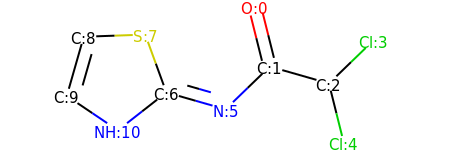

HETATM    1  O1  UNL     1       0.946   1.695   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.310   0.240   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.752  -0.173   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1       3.830   0.870   0.000  1.00  0.00          CL  
HETATM    5 CL2  UNL     1       3.116  -1.628   0.000  1.00  0.00          CL  
HETATM    6  N1  UNL     1       0.232  -0.803   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1      -1.210  -0.391   0.000  1.00  0.00           C  
HETATM    8  S1  UNL     1      -1.725   1.018   0.000  1.00  0.00           S  
HETATM    9  C4  UNL     1      -3.224   0.965   0.000  1.00  0.00           C  
HETATM   10  C5  UNL     1      -3.636  -0.477   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -2.392  -1.315   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    5
CONECT    6    7    7
CONECT    7    8   11

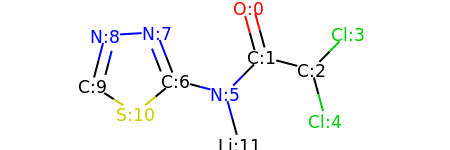

HETATM    1  O1  UNL     1       0.852   1.903   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.250   0.457   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.701   0.078   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1       3.755   1.146   0.000  1.00  0.00          CL  
HETATM    5 CL2  UNL     1       3.099  -1.368   0.000  1.00  0.00          CL  
HETATM    6  N1  UNL     1       0.196  -0.611   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1      -1.255  -0.232   0.000  1.00  0.00           C  
HETATM    8  N2  UNL     1      -1.802   1.165   0.000  1.00  0.00           N  
HETATM    9  N3  UNL     1      -3.299   1.077   0.000  1.00  0.00           N  
HETATM   10  C4  UNL     1      -3.678  -0.375   0.000  1.00  0.00           C  
HETATM   11  S1  UNL     1      -2.415  -1.183   0.000  1.00  0.00           S  
HETATM   12 LI1  UNL     1       0.594  -2.057   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT

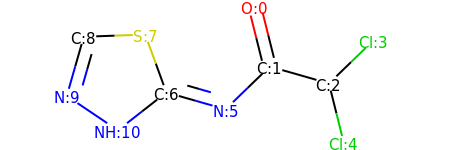

HETATM    1  O1  UNL     1       0.946   1.695   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.310   0.240   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.752  -0.173   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1       3.830   0.870   0.000  1.00  0.00          CL  
HETATM    5 CL2  UNL     1       3.116  -1.628   0.000  1.00  0.00          CL  
HETATM    6  N1  UNL     1       0.232  -0.803   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1      -1.210  -0.391   0.000  1.00  0.00           C  
HETATM    8  S1  UNL     1      -1.725   1.018   0.000  1.00  0.00           S  
HETATM    9  C4  UNL     1      -3.224   0.965   0.000  1.00  0.00           C  
HETATM   10  N2  UNL     1      -3.636  -0.477   0.000  1.00  0.00           N  
HETATM   11  N3  UNL     1      -2.392  -1.315   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    5
CONECT    6    7    7
CONECT    7    8   11

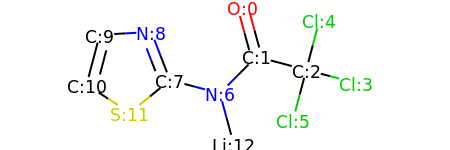

HETATM    1  O1  UNL     1       0.651   1.895   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.044   0.448   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.494   0.064   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1       3.944  -0.320   0.000  1.00  0.00          CL  
HETATM    5 CL2  UNL     1       2.877   1.514   0.000  1.00  0.00          CL  
HETATM    6 CL3  UNL     1       2.110  -1.386   0.000  1.00  0.00          CL  
HETATM    7  N1  UNL     1      -0.013  -0.617   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1      -1.464  -0.233   0.000  1.00  0.00           C  
HETATM    9  N2  UNL     1      -2.006   1.166   0.000  1.00  0.00           N  
HETATM   10  C4  UNL     1      -3.503   1.082   0.000  1.00  0.00           C  
HETATM   11  C5  UNL     1      -3.887  -0.368   0.000  1.00  0.00           C  
HETATM   12  S1  UNL     1      -2.626  -1.181   0.000  1.00  0.00           S  
HETATM   13 LI1  UNL     1  

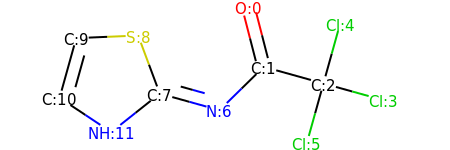

HETATM    1  O1  UNL     1       0.705   1.714   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.079   0.261   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.524  -0.141   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1       3.969  -0.544   0.000  1.00  0.00          CL  
HETATM    5 CL2  UNL     1       2.926   1.304   0.000  1.00  0.00          CL  
HETATM    6 CL3  UNL     1       2.121  -1.586   0.000  1.00  0.00          CL  
HETATM    7  N1  UNL     1       0.008  -0.789   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1      -1.437  -0.386   0.000  1.00  0.00           C  
HETATM    9  S1  UNL     1      -1.961   1.020   0.000  1.00  0.00           S  
HETATM   10  C4  UNL     1      -3.459   0.956   0.000  1.00  0.00           C  
HETATM   11  C5  UNL     1      -3.862  -0.489   0.000  1.00  0.00           C  
HETATM   12  N2  UNL     1      -2.612  -1.318   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT

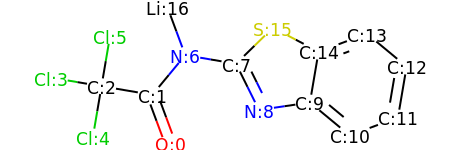

HETATM    1  O1  UNL     1      -1.803  -1.864   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.325  -0.458   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -3.803  -0.206   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1      -5.282   0.045   0.000  1.00  0.00          CL  
HETATM    5 CL2  UNL     1      -4.055  -1.685   0.000  1.00  0.00          CL  
HETATM    6 CL3  UNL     1      -3.552   1.272   0.000  1.00  0.00          CL  
HETATM    7  N1  UNL     1      -1.368   0.697   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1       0.111   0.446   0.000  1.00  0.00           C  
HETATM    9  N2  UNL     1       0.777  -0.898   0.000  1.00  0.00           N  
HETATM   10  C4  UNL     1       2.261  -0.680   0.000  1.00  0.00           C  
HETATM   11  C5  UNL     1       3.416  -1.637   0.000  1.00  0.00           C  
HETATM   12  C6  UNL     1       4.823  -1.115   0.000  1.00  0.00           C  
HETATM   13  C7  UNL     1  

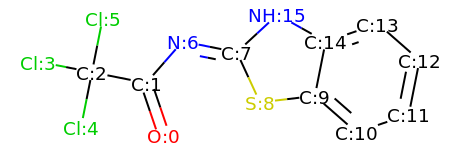

HETATM    1  O1  UNL     1      -1.968  -1.679   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.451  -0.259   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -3.922   0.033   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1      -5.393   0.325   0.000  1.00  0.00          CL  
HETATM    5 CL2  UNL     1      -4.214  -1.438   0.000  1.00  0.00          CL  
HETATM    6 CL3  UNL     1      -3.630   1.505   0.000  1.00  0.00          CL  
HETATM    7  N1  UNL     1      -1.462   0.870   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1       0.009   0.578   0.000  1.00  0.00           C  
HETATM    9  S1  UNL     1       0.638  -0.784   0.000  1.00  0.00           S  
HETATM   10  C4  UNL     1       2.127  -0.607   0.000  1.00  0.00           C  
HETATM   11  C5  UNL     1       3.255  -1.596   0.000  1.00  0.00           C  
HETATM   12  C6  UNL     1       4.676  -1.113   0.000  1.00  0.00           C  
HETATM   13  C7  UNL     1  

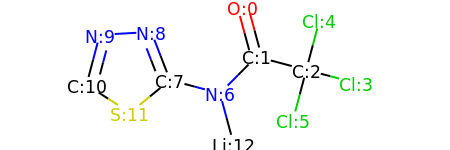

HETATM    1  O1  UNL     1       0.651   1.895   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.044   0.448   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.494   0.064   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1       3.944  -0.320   0.000  1.00  0.00          CL  
HETATM    5 CL2  UNL     1       2.877   1.514   0.000  1.00  0.00          CL  
HETATM    6 CL3  UNL     1       2.110  -1.386   0.000  1.00  0.00          CL  
HETATM    7  N1  UNL     1      -0.013  -0.617   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1      -1.464  -0.233   0.000  1.00  0.00           C  
HETATM    9  N2  UNL     1      -2.006   1.166   0.000  1.00  0.00           N  
HETATM   10  N3  UNL     1      -3.503   1.082   0.000  1.00  0.00           N  
HETATM   11  C4  UNL     1      -3.887  -0.368   0.000  1.00  0.00           C  
HETATM   12  S1  UNL     1      -2.626  -1.181   0.000  1.00  0.00           S  
HETATM   13 LI1  UNL     1  

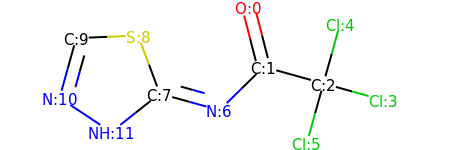

HETATM    1  O1  UNL     1       0.705   1.714   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.079   0.261   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.524  -0.141   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1       3.969  -0.544   0.000  1.00  0.00          CL  
HETATM    5 CL2  UNL     1       2.926   1.304   0.000  1.00  0.00          CL  
HETATM    6 CL3  UNL     1       2.121  -1.586   0.000  1.00  0.00          CL  
HETATM    7  N1  UNL     1       0.008  -0.789   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1      -1.437  -0.386   0.000  1.00  0.00           C  
HETATM    9  S1  UNL     1      -1.961   1.020   0.000  1.00  0.00           S  
HETATM   10  C4  UNL     1      -3.459   0.956   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -3.862  -0.489   0.000  1.00  0.00           N  
HETATM   12  N3  UNL     1      -2.612  -1.318   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT

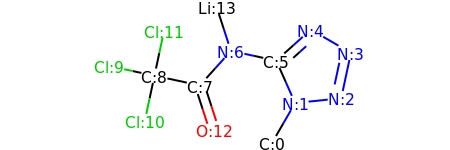

HETATM    1  C1  UNL     1       1.215  -2.197   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       1.966  -0.899   0.000  1.00  0.00           N  
HETATM    3  N2  UNL     1       3.458  -0.743   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1       3.771   0.724   0.000  1.00  0.00           N  
HETATM    5  N4  UNL     1       2.473   1.475   0.000  1.00  0.00           N  
HETATM    6  C2  UNL     1       1.357   0.472   0.000  1.00  0.00           C  
HETATM    7  N5  UNL     1      -0.110   0.786   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1      -1.114  -0.328   0.000  1.00  0.00           C  
HETATM    9  C4  UNL     1      -2.581  -0.015   0.000  1.00  0.00           C  
HETATM   10 CL1  UNL     1      -4.048   0.298   0.000  1.00  0.00          CL  
HETATM   11 CL2  UNL     1      -2.895  -1.482   0.000  1.00  0.00          CL  
HETATM   12 CL3  UNL     1      -2.268   1.452   0.000  1.00  0.00          CL  
HETATM   13  O1  UNL     1  

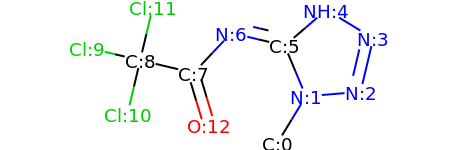

HETATM    1  C1  UNL     1       1.125  -2.052   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       1.905  -0.771   0.000  1.00  0.00           N  
HETATM    3  N2  UNL     1       3.400  -0.649   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1       3.746   0.810   0.000  1.00  0.00           N  
HETATM    5  N4  UNL     1       2.465   1.590   0.000  1.00  0.00           N  
HETATM    6  C2  UNL     1       1.327   0.613   0.000  1.00  0.00           C  
HETATM    7  N5  UNL     1      -0.132   0.959   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1      -1.162  -0.132   0.000  1.00  0.00           C  
HETATM    9  C4  UNL     1      -2.621   0.214   0.000  1.00  0.00           C  
HETATM   10 CL1  UNL     1      -4.081   0.560   0.000  1.00  0.00          CL  
HETATM   11 CL2  UNL     1      -2.967  -1.246   0.000  1.00  0.00          CL  
HETATM   12 CL3  UNL     1      -2.275   1.673   0.000  1.00  0.00          CL  
HETATM   13  O1  UNL     1  

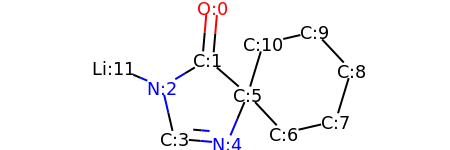

HETATM    1  O1  UNL     1      -0.817   2.155   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.946   0.661   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.230  -0.114   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.891  -1.575   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -0.396  -1.703   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       0.188  -0.322   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       1.212  -1.417   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       2.673  -1.078   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.110   0.358   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       2.085   1.453   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       0.624   1.113   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -3.612   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT

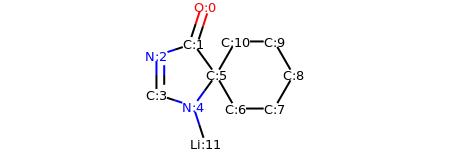

HETATM    1  O1  UNL     1      -0.567   2.640   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.030   1.214   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.457   0.750   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -2.457  -0.750   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.030  -1.214   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -0.149  -0.000   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.601  -1.299   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       2.101  -1.299   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.851   0.000   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       2.101   1.299   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       0.601   1.299   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -0.567  -2.640   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT

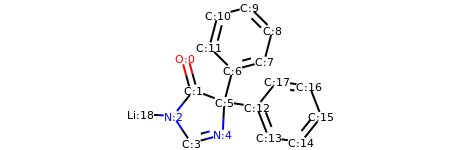

HETATM    1  O1  UNL     1      -2.399   1.314   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.003  -0.133   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.940  -1.303   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -2.117  -2.557   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -0.670  -2.161   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -0.599  -0.663   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1      -0.219   0.788   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       1.228   1.184   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       1.608   2.635   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       0.542   3.690   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1      -0.905   3.294   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1      -1.285   1.843   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

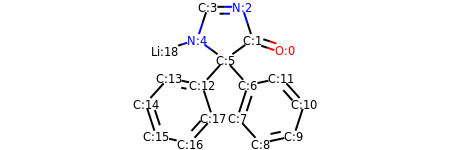

HETATM    1  O1  UNL     1       2.640   1.446   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.214   1.910   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.750   3.337   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.750   3.337   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.214   1.910   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       0.000   1.028   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       1.004  -0.086   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       0.540  -1.513   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       1.544  -2.628   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.011  -2.316   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       3.475  -0.889   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       2.471   0.225   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

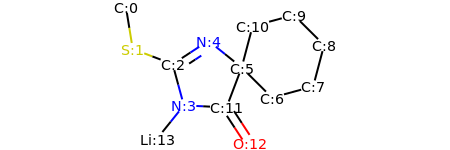

HETATM    1  C1  UNL     1      -3.491   2.252   0.000  1.00  0.00           C  
HETATM    2  S1  UNL     1      -3.252   0.772   0.000  1.00  0.00           S  
HETATM    3  C2  UNL     1      -1.849   0.239   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.456  -1.209   0.000  1.00  0.00           N  
HETATM    5  N2  UNL     1      -0.594   1.060   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       0.575   0.120   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       1.639  -0.937   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.087  -0.543   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.470   0.907   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       2.405   1.964   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       0.958   1.571   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       0.042  -1.282   0.000  1.00  0.00           C  
HETATM   13  O1  UNL     1  

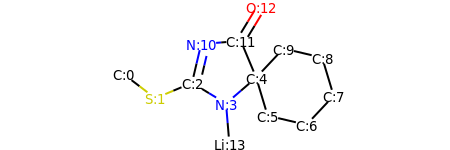

HETATM    1  C1  UNL     1      -4.492   0.203   0.000  1.00  0.00           C  
HETATM    2  S1  UNL     1      -3.298  -0.705   0.000  1.00  0.00           S  
HETATM    3  C2  UNL     1      -1.914  -0.125   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -0.632  -0.903   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.504   0.076   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.937  -1.361   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.397  -1.704   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.424  -0.612   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.992   0.824   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.532   1.168   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -1.570   1.335   0.000  1.00  0.00           N  
HETATM   12  C9  UNL     1      -0.076   1.459   0.000  1.00  0.00           C  
HETATM   13  O1  UNL     1  

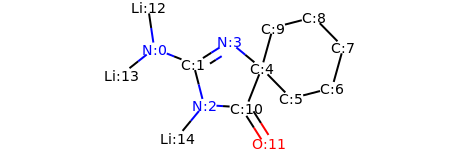

HETATM    1  N1  UNL     1      -2.947   0.823   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.552   0.272   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -1.178  -1.181   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1      -0.286   1.076   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       0.871   0.120   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.921  -0.951   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       3.373  -0.577   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.776   0.868   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.726   1.939   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       1.273   1.565   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       0.319  -1.274   0.000  1.00  0.00           C  
HETATM   12  O1  UNL     1       1.124  -2.541   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

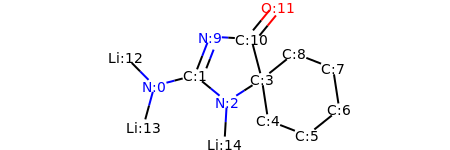

HETATM    1  N1  UNL     1      -3.113  -0.123   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.662   0.257   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.502  -0.693   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.761   0.117   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.987  -1.366   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.385  -1.912   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.556  -0.974   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.329   0.509   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.932   1.054   0.000  1.00  0.00           C  
HETATM   10  N3  UNL     1      -1.117   1.654   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1       0.381   1.568   0.000  1.00  0.00           C  
HETATM   12  O1  UNL     1       1.331   2.728   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

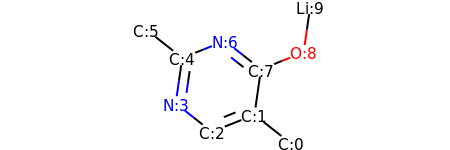

HETATM    1  C1  UNL     1       1.779  -2.227   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       0.600  -1.299   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.793  -1.856   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.971  -0.928   0.000  1.00  0.00           N  
HETATM    5  C4  UNL     1      -1.757   0.557   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -2.936   1.485   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1      -0.364   1.113   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       0.814   0.186   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       2.207   0.742   0.000  1.00  0.00           O  
HETATM   10 LI1  UNL     1       2.421   2.227   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6    7
CONECT    7    8    8
CONECT    8    9
CONECT    9   10
END

search for patterns ...


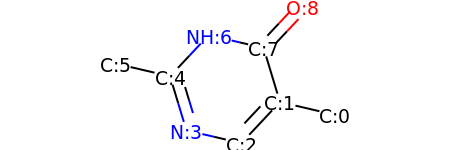

HETATM    1  C1  UNL     1       2.693  -0.926   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.233  -0.585   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.206  -1.679   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.254  -1.337   0.000  1.00  0.00           N  
HETATM    5  C4  UNL     1      -1.689   0.098   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -3.149   0.440   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1      -0.662   1.193   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       0.798   0.851   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       1.824   1.945   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6    7
CONECT    7    8
CONECT    8    9    9
END

#################
#################
search for patterns ...
found primary alcohol


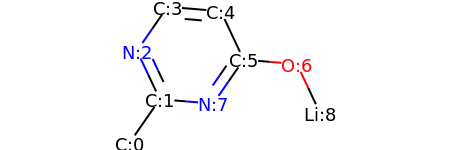

HETATM    1  C1  UNL     1      -2.256  -1.985   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.401  -0.752   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.040   0.604   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -1.185   1.837   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.310   1.712   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       0.949   0.355   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1       2.444   0.231   0.000  1.00  0.00           O  
HETATM    8  N2  UNL     1       0.094  -0.877   0.000  1.00  0.00           N  
HETATM    9 LI1  UNL     1       3.084  -1.126   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    8    8
CONECT    7    9
END

search for patterns ...


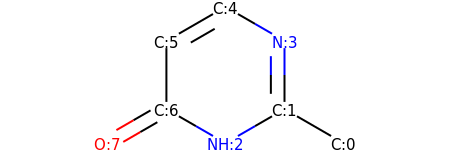

HETATM    1  C1  UNL     1       2.598  -1.125   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.000  -1.125   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1       1.299   1.125   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.000   1.875   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -1.299   1.125   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    4    4
CONECT    3    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


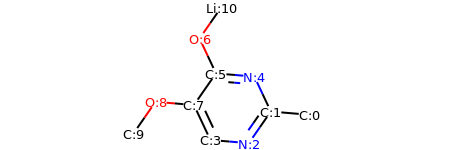

HETATM    1  C1  UNL     1       3.493  -0.769   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.999  -0.643   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.142  -1.874   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.353  -1.748   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       1.360   0.715   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -0.134   0.841   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1      -0.773   2.198   0.000  1.00  0.00           O  
HETATM    8  C5  UNL     1      -0.991  -0.391   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1      -2.486  -0.265   0.000  1.00  0.00           O  
HETATM   10  C6  UNL     1      -3.342  -1.496   0.000  1.00  0.00           C  
HETATM   11 LI1  UNL     1       0.084   3.430   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    5
CONECT    3    4
CONECT    4    8    8
CONECT    5    6    6
CONE

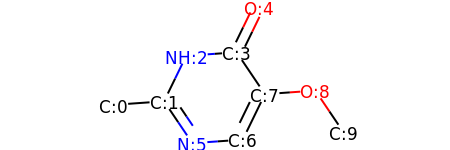

HETATM    1  C1  UNL     1      -3.507  -0.378   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.011  -0.273   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.354   1.076   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       0.142   1.182   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1       0.798   2.531   0.000  1.00  0.00           O  
HETATM    6  N2  UNL     1      -1.171  -1.515   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       0.325  -1.409   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       0.982  -0.061   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1       2.478   0.045   0.000  1.00  0.00           O  
HETATM   10  C6  UNL     1       3.318  -1.198   0.000  1.00  0.00           C  
CONECT    1    2
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5    5    8
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
CONECT    9   10
END

#################
######

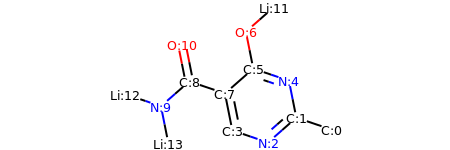

HETATM    1  C1  UNL     1       3.999  -1.551   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.579  -1.070   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.452  -2.059   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       0.031  -1.578   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       2.285   0.401   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       0.865   0.883   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1       0.571   2.354   0.000  1.00  0.00           O  
HETATM    8  C5  UNL     1      -0.263  -0.107   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1      -1.683   0.374   0.000  1.00  0.00           C  
HETATM   10  N3  UNL     1      -2.810  -0.615   0.000  1.00  0.00           N  
HETATM   11  O2  UNL     1      -1.977   1.845   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1       1.698   3.343   0.000  1.00  0.00          LI  
HETATM   13 LI2  UNL     1  

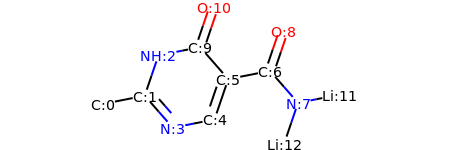

HETATM    1  C1  UNL     1      -4.264  -0.743   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.792  -0.451   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.309   0.969   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -1.804  -1.580   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -0.333  -1.288   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.150   0.132   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.622   0.423   0.000  1.00  0.00           C  
HETATM    8  N3  UNL     1       2.610  -0.705   0.000  1.00  0.00           N  
HETATM    9  O1  UNL     1       2.105   1.843   0.000  1.00  0.00           O  
HETATM   10  C6  UNL     1      -0.838   1.260   0.000  1.00  0.00           C  
HETATM   11  O2  UNL     1      -0.355   2.680   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1       4.081  -0.414   0.000  1.00  0.00          LI  
HETATM   13 LI2  UNL     1  

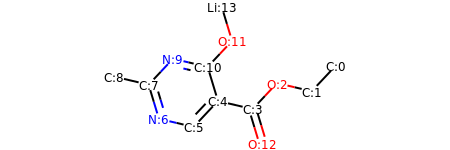

HETATM    1  C1  UNL     1       4.805   0.779   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       3.778  -0.314   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       2.318   0.028   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       1.291  -1.065   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.169  -0.723   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.196  -1.816   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1      -2.657  -1.474   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1      -3.090  -0.038   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -4.551   0.305   0.000  1.00  0.00           C  
HETATM   10  N2  UNL     1      -2.063   1.056   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -0.603   0.713   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1       0.424   1.807   0.000  1.00  0.00           O  
HETATM   13  O3  UNL     1  

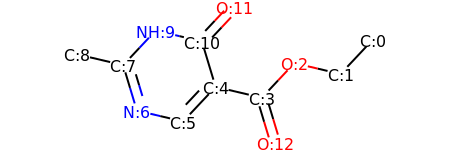

HETATM    1  C1  UNL     1       4.805   1.026   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       3.777  -0.067   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       2.317   0.277   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       1.290  -0.816   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.170  -0.473   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.198  -1.566   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1      -2.658  -1.223   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1      -3.091   0.213   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -4.551   0.556   0.000  1.00  0.00           C  
HETATM   10  N2  UNL     1      -2.064   1.306   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -0.603   0.963   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1       0.424   2.056   0.000  1.00  0.00           O  
HETATM   13  O3  UNL     1  

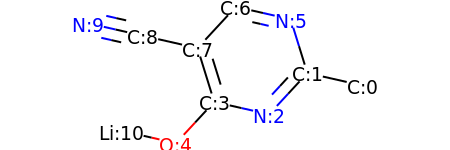

HETATM    1  C1  UNL     1       3.828  -0.384   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.365  -0.052   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.346  -1.153   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.116  -0.821   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1      -1.135  -1.922   0.000  1.00  0.00           O  
HETATM    6  N2  UNL     1       1.921   1.380   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       0.459   1.712   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1      -0.560   0.612   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1      -2.023   0.944   0.000  1.00  0.00           C  
HETATM   10  N3  UNL     1      -3.486   1.276   0.000  1.00  0.00           N  
HETATM   11 LI1  UNL     1      -2.598  -1.590   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5    8    8
CONECT    5   11
CONE

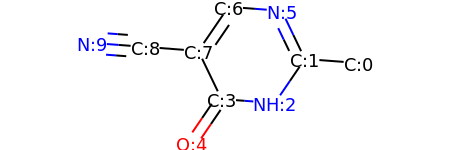

HETATM    1  C1  UNL     1       3.609  -0.012   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.114   0.101   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.268  -1.138   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.228  -1.025   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1      -1.073  -2.264   0.000  1.00  0.00           O  
HETATM    6  N2  UNL     1       1.463   1.453   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1      -0.032   1.566   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1      -0.878   0.327   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1      -2.374   0.440   0.000  1.00  0.00           C  
HETATM   10  N3  UNL     1      -3.869   0.552   0.000  1.00  0.00           N  
CONECT    1    2
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5    5    8
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
CONECT    9   10   10   10
END

##############

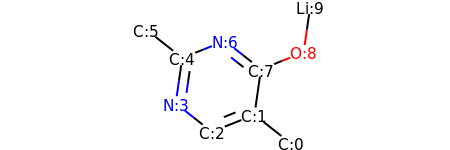

HETATM    1  C1  UNL     1       1.779  -2.227   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       0.600  -1.299   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.793  -1.856   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.971  -0.928   0.000  1.00  0.00           N  
HETATM    5  C4  UNL     1      -1.757   0.557   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -2.936   1.485   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1      -0.364   1.113   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       0.814   0.186   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       2.207   0.742   0.000  1.00  0.00           O  
HETATM   10 LI1  UNL     1       2.421   2.227   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6    7
CONECT    7    8    8
CONECT    8    9
CONECT    9   10
END

search for patterns ...


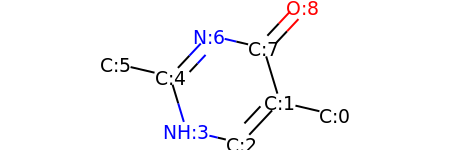

HETATM    1  C1  UNL     1       2.693  -0.926   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.233  -0.585   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.206  -1.679   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.254  -1.337   0.000  1.00  0.00           N  
HETATM    5  C4  UNL     1      -1.689   0.098   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -3.149   0.440   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1      -0.662   1.193   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       0.798   0.851   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       1.824   1.945   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5
CONECT    5    6    7    7
CONECT    7    8
CONECT    8    9    9
END

#################
#################
search for patterns ...
found primary alcohol


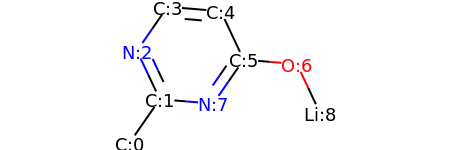

HETATM    1  C1  UNL     1      -2.256  -1.985   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.401  -0.752   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.040   0.604   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -1.185   1.837   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.310   1.712   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       0.949   0.355   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1       2.444   0.231   0.000  1.00  0.00           O  
HETATM    8  N2  UNL     1       0.094  -0.877   0.000  1.00  0.00           N  
HETATM    9 LI1  UNL     1       3.084  -1.126   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    8    8
CONECT    7    9
END

search for patterns ...


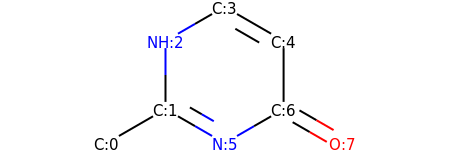

HETATM    1  C1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.299   1.125   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       0.000   1.875   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.299   1.125   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -0.000  -1.125   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.598  -1.125   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


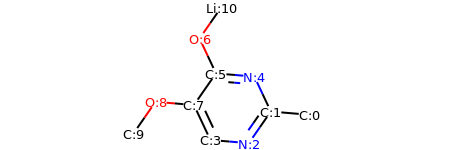

HETATM    1  C1  UNL     1       3.493  -0.769   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.999  -0.643   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.142  -1.874   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.353  -1.748   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       1.360   0.715   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -0.134   0.841   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1      -0.773   2.198   0.000  1.00  0.00           O  
HETATM    8  C5  UNL     1      -0.991  -0.391   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1      -2.486  -0.265   0.000  1.00  0.00           O  
HETATM   10  C6  UNL     1      -3.342  -1.496   0.000  1.00  0.00           C  
HETATM   11 LI1  UNL     1       0.084   3.430   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    5
CONECT    3    4
CONECT    4    8    8
CONECT    5    6    6
CONE

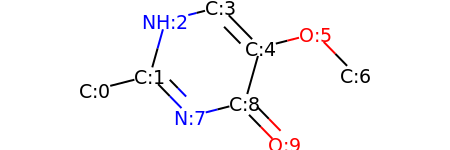

HETATM    1  C1  UNL     1      -3.512  -0.494   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.058  -0.123   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.653   1.321   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.199   1.692   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.848   0.619   0.000  1.00  0.00           C  
HETATM    6  O1  UNL     1       2.302   0.989   0.000  1.00  0.00           O  
HETATM    7  C5  UNL     1       3.350  -0.084   0.000  1.00  0.00           C  
HETATM    8  N2  UNL     1      -1.011  -1.196   0.000  1.00  0.00           N  
HETATM    9  C6  UNL     1       0.443  -0.825   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1       1.491  -1.899   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    8    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6    9
CONECT    6    7
CONECT    8    9
CONECT    9   10   10
END

#################
######

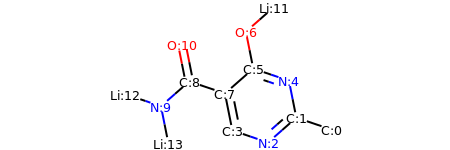

HETATM    1  C1  UNL     1       3.999  -1.551   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.579  -1.070   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.452  -2.059   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       0.031  -1.578   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       2.285   0.401   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       0.865   0.883   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1       0.571   2.354   0.000  1.00  0.00           O  
HETATM    8  C5  UNL     1      -0.263  -0.107   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1      -1.683   0.374   0.000  1.00  0.00           C  
HETATM   10  N3  UNL     1      -2.810  -0.615   0.000  1.00  0.00           N  
HETATM   11  O2  UNL     1      -1.977   1.845   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1       1.698   3.343   0.000  1.00  0.00          LI  
HETATM   13 LI2  UNL     1  

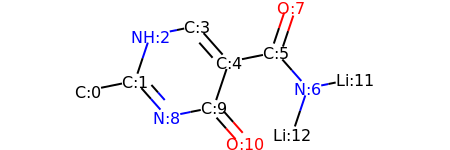

HETATM    1  C1  UNL     1      -4.340  -0.371   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.870  -0.073   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.393   1.350   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.923   1.648   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.070   0.524   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.540   0.822   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1       2.534  -0.301   0.000  1.00  0.00           N  
HETATM    8  O1  UNL     1       2.017   2.245   0.000  1.00  0.00           O  
HETATM    9  N3  UNL     1      -1.876  -1.197   0.000  1.00  0.00           N  
HETATM   10  C6  UNL     1      -0.406  -0.898   0.000  1.00  0.00           C  
HETATM   11  O2  UNL     1       0.587  -2.022   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1       4.004  -0.003   0.000  1.00  0.00          LI  
HETATM   13 LI2  UNL     1  

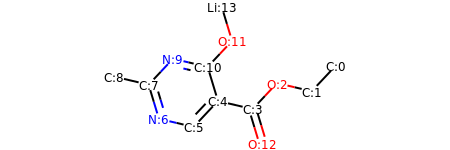

HETATM    1  C1  UNL     1       4.805   0.779   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       3.778  -0.314   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       2.318   0.028   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       1.291  -1.065   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.169  -0.723   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.196  -1.816   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1      -2.657  -1.474   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1      -3.090  -0.038   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -4.551   0.305   0.000  1.00  0.00           C  
HETATM   10  N2  UNL     1      -2.063   1.056   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -0.603   0.713   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1       0.424   1.807   0.000  1.00  0.00           O  
HETATM   13  O3  UNL     1  

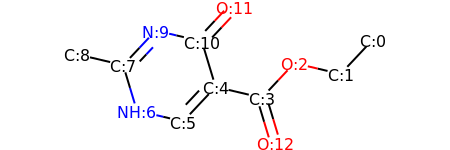

HETATM    1  C1  UNL     1       4.805   1.026   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       3.777  -0.067   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       2.317   0.277   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       1.290  -0.816   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.170  -0.473   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.198  -1.566   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1      -2.658  -1.223   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1      -3.091   0.213   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -4.551   0.556   0.000  1.00  0.00           C  
HETATM   10  N2  UNL     1      -2.064   1.306   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -0.603   0.963   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1       0.424   2.056   0.000  1.00  0.00           O  
HETATM   13  O3  UNL     1  

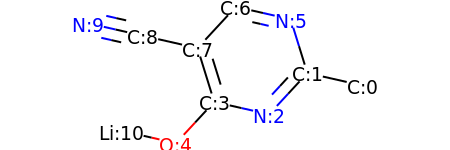

HETATM    1  C1  UNL     1       3.828  -0.384   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.365  -0.052   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.346  -1.153   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.116  -0.821   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1      -1.135  -1.922   0.000  1.00  0.00           O  
HETATM    6  N2  UNL     1       1.921   1.380   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       0.459   1.712   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1      -0.560   0.612   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1      -2.023   0.944   0.000  1.00  0.00           C  
HETATM   10  N3  UNL     1      -3.486   1.276   0.000  1.00  0.00           N  
HETATM   11 LI1  UNL     1      -2.598  -1.590   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5    8    8
CONECT    5   11
CONE

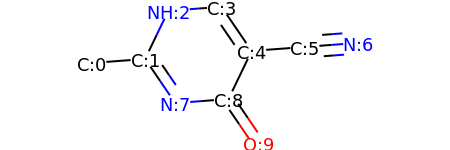

HETATM    1  C1  UNL     1      -3.609  -0.012   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.114   0.101   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.463   1.453   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       0.032   1.566   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.878   0.327   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.374   0.440   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1       3.869   0.552   0.000  1.00  0.00           N  
HETATM    8  N3  UNL     1      -1.268  -1.138   0.000  1.00  0.00           N  
HETATM    9  C6  UNL     1       0.228  -1.025   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1       1.073  -2.264   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    8    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6    9
CONECT    6    7    7    7
CONECT    8    9
CONECT    9   10   10
END

##############

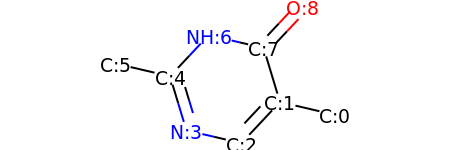

HETATM    1  C1  UNL     1       2.693  -0.926   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.233  -0.585   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.206  -1.679   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.254  -1.337   0.000  1.00  0.00           N  
HETATM    5  C4  UNL     1      -1.689   0.098   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -3.149   0.440   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1      -0.662   1.193   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       0.798   0.851   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       1.824   1.945   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6    7
CONECT    7    8
CONECT    8    9    9
END

search for patterns ...


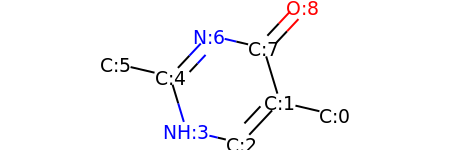

HETATM    1  C1  UNL     1       2.693  -0.926   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.233  -0.585   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.206  -1.679   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.254  -1.337   0.000  1.00  0.00           N  
HETATM    5  C4  UNL     1      -1.689   0.098   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -3.149   0.440   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1      -0.662   1.193   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       0.798   0.851   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       1.824   1.945   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5
CONECT    5    6    7    7
CONECT    7    8
CONECT    8    9    9
END

#################
#################
search for patterns ...


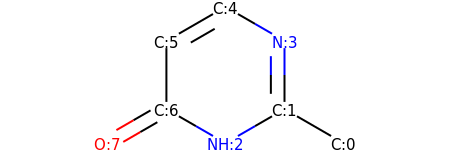

HETATM    1  C1  UNL     1       2.598  -1.125   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.000  -1.125   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1       1.299   1.125   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.000   1.875   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -1.299   1.125   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    4    4
CONECT    3    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...


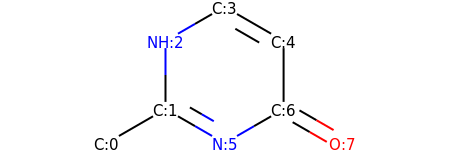

HETATM    1  C1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.299   1.125   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       0.000   1.875   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.299   1.125   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -0.000  -1.125   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.598  -1.125   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...


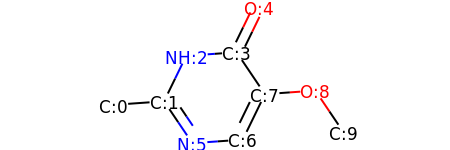

HETATM    1  C1  UNL     1      -3.507  -0.378   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.011  -0.273   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.354   1.076   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       0.142   1.182   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1       0.798   2.531   0.000  1.00  0.00           O  
HETATM    6  N2  UNL     1      -1.171  -1.515   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       0.325  -1.409   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       0.982  -0.061   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1       2.478   0.045   0.000  1.00  0.00           O  
HETATM   10  C6  UNL     1       3.318  -1.198   0.000  1.00  0.00           C  
CONECT    1    2
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5    5    8
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
CONECT    9   10
END

search for patterns ...


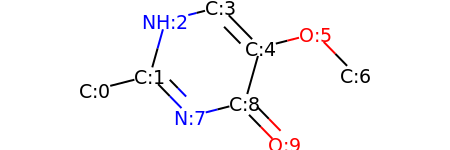

HETATM    1  C1  UNL     1      -3.512  -0.494   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.058  -0.123   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.653   1.321   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.199   1.692   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.848   0.619   0.000  1.00  0.00           C  
HETATM    6  O1  UNL     1       2.302   0.989   0.000  1.00  0.00           O  
HETATM    7  C5  UNL     1       3.350  -0.084   0.000  1.00  0.00           C  
HETATM    8  N2  UNL     1      -1.011  -1.196   0.000  1.00  0.00           N  
HETATM    9  C6  UNL     1       0.443  -0.825   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1       1.491  -1.899   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    8    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6    9
CONECT    6    7
CONECT    8    9
CONECT    9   10   10
END

#################
######

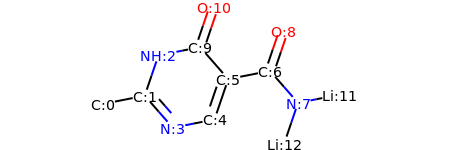

HETATM    1  C1  UNL     1      -4.264  -0.743   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.792  -0.451   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.309   0.969   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -1.804  -1.580   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -0.333  -1.288   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.150   0.132   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.622   0.423   0.000  1.00  0.00           C  
HETATM    8  N3  UNL     1       2.610  -0.705   0.000  1.00  0.00           N  
HETATM    9  O1  UNL     1       2.105   1.843   0.000  1.00  0.00           O  
HETATM   10  C6  UNL     1      -0.838   1.260   0.000  1.00  0.00           C  
HETATM   11  O2  UNL     1      -0.355   2.680   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1       4.081  -0.414   0.000  1.00  0.00          LI  
HETATM   13 LI2  UNL     1  

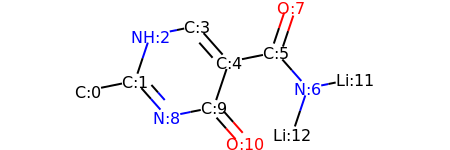

HETATM    1  C1  UNL     1      -4.340  -0.371   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.870  -0.073   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.393   1.350   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.923   1.648   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.070   0.524   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.540   0.822   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1       2.534  -0.301   0.000  1.00  0.00           N  
HETATM    8  O1  UNL     1       2.017   2.245   0.000  1.00  0.00           O  
HETATM    9  N3  UNL     1      -1.876  -1.197   0.000  1.00  0.00           N  
HETATM   10  C6  UNL     1      -0.406  -0.898   0.000  1.00  0.00           C  
HETATM   11  O2  UNL     1       0.587  -2.022   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1       4.004  -0.003   0.000  1.00  0.00          LI  
HETATM   13 LI2  UNL     1  

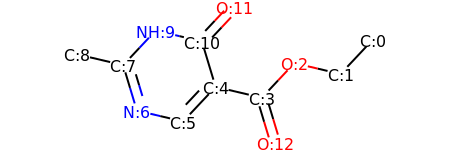

HETATM    1  C1  UNL     1       4.805   1.026   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       3.777  -0.067   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       2.317   0.277   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       1.290  -0.816   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.170  -0.473   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.198  -1.566   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1      -2.658  -1.223   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1      -3.091   0.213   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -4.551   0.556   0.000  1.00  0.00           C  
HETATM   10  N2  UNL     1      -2.064   1.306   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -0.603   0.963   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1       0.424   2.056   0.000  1.00  0.00           O  
HETATM   13  O3  UNL     1  

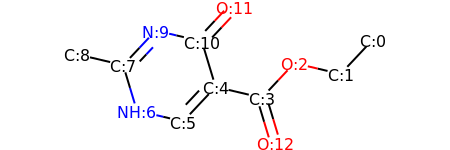

HETATM    1  C1  UNL     1       4.805   1.026   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       3.777  -0.067   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       2.317   0.277   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       1.290  -0.816   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.170  -0.473   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.198  -1.566   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1      -2.658  -1.223   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1      -3.091   0.213   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -4.551   0.556   0.000  1.00  0.00           C  
HETATM   10  N2  UNL     1      -2.064   1.306   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -0.603   0.963   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1       0.424   2.056   0.000  1.00  0.00           O  
HETATM   13  O3  UNL     1  

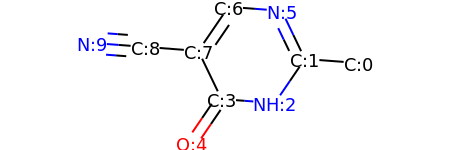

HETATM    1  C1  UNL     1       3.609  -0.012   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.114   0.101   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.268  -1.138   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.228  -1.025   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1      -1.073  -2.264   0.000  1.00  0.00           O  
HETATM    6  N2  UNL     1       1.463   1.453   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1      -0.032   1.566   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1      -0.878   0.327   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1      -2.374   0.440   0.000  1.00  0.00           C  
HETATM   10  N3  UNL     1      -3.869   0.552   0.000  1.00  0.00           N  
CONECT    1    2
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5    5    8
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
CONECT    9   10   10   10
END

search for pat

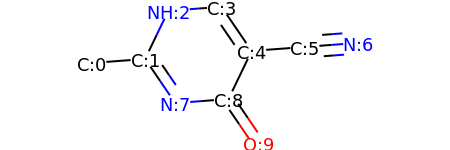

HETATM    1  C1  UNL     1      -3.609  -0.012   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.114   0.101   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.463   1.453   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       0.032   1.566   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.878   0.327   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.374   0.440   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1       3.869   0.552   0.000  1.00  0.00           N  
HETATM    8  N3  UNL     1      -1.268  -1.138   0.000  1.00  0.00           N  
HETATM    9  C6  UNL     1       0.228  -1.025   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1       1.073  -2.264   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    8    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6    9
CONECT    6    7    7    7
CONECT    8    9
CONECT    9   10   10
END

##############

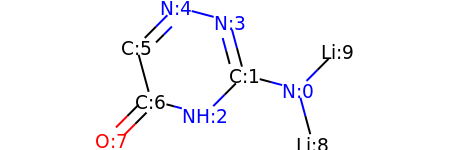

HETATM    1  N1  UNL     1       2.096  -0.288   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.647   0.097   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.412  -0.966   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1       0.255   1.545   0.000  1.00  0.00           N  
HETATM    5  N4  UNL     1      -1.195   1.930   0.000  1.00  0.00           N  
HETATM    6  C2  UNL     1      -2.253   0.867   0.000  1.00  0.00           C  
HETATM    7  C3  UNL     1      -1.861  -0.581   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.920  -1.644   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1       2.488  -1.736   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1       3.155   0.775   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    4    4
CONECT    3    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...
found primar

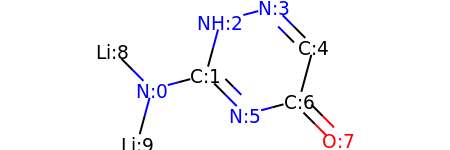

HETATM    1  N1  UNL     1      -2.096  -0.288   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.647   0.097   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.255   1.545   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1       1.195   1.930   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       2.253   0.867   0.000  1.00  0.00           C  
HETATM    6  N4  UNL     1       0.412  -0.966   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1       1.861  -0.581   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.920  -1.644   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.155   0.775   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1      -2.488  -1.736   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################


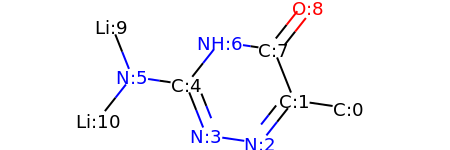

HETATM    1  C1  UNL     1       3.474  -0.746   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.990  -0.529   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.060  -1.706   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.424  -1.490   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -0.979  -0.096   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -2.463   0.121   0.000  1.00  0.00           N  
HETATM    7  N4  UNL     1      -0.049   1.081   0.000  1.00  0.00           N  
HETATM    8  C4  UNL     1       1.436   0.864   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       2.365   2.041   0.000  1.00  0.00           O  
HETATM   10 LI1  UNL     1      -3.017   1.515   0.000  1.00  0.00          LI  
HETATM   11 LI2  UNL     1      -3.393  -1.056   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6    7
CONE

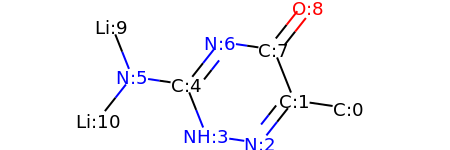

HETATM    1  C1  UNL     1       3.474  -0.746   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.990  -0.529   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.060  -1.706   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.424  -1.490   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -0.979  -0.096   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -2.463   0.121   0.000  1.00  0.00           N  
HETATM    7  N4  UNL     1      -0.049   1.081   0.000  1.00  0.00           N  
HETATM    8  C4  UNL     1       1.436   0.864   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       2.365   2.041   0.000  1.00  0.00           O  
HETATM   10 LI1  UNL     1      -3.017   1.515   0.000  1.00  0.00          LI  
HETATM   11 LI2  UNL     1      -3.393  -1.056   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5
CONECT    5    6    7    7
CONE

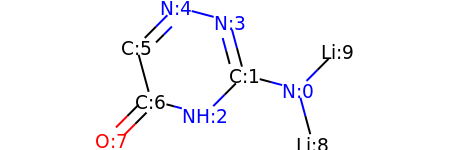

HETATM    1  N1  UNL     1       2.096  -0.288   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.647   0.097   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.412  -0.966   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1       0.255   1.545   0.000  1.00  0.00           N  
HETATM    5  N4  UNL     1      -1.195   1.930   0.000  1.00  0.00           N  
HETATM    6  C2  UNL     1      -2.253   0.867   0.000  1.00  0.00           C  
HETATM    7  C3  UNL     1      -1.861  -0.581   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.920  -1.644   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1       2.488  -1.736   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1       3.155   0.775   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    4    4
CONECT    3    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...


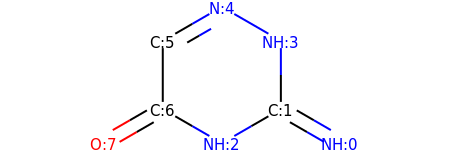

HETATM    1  N1  UNL     1       2.598  -1.125   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.000  -1.125   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1       1.299   1.125   0.000  1.00  0.00           N  
HETATM    5  N4  UNL     1       0.000   1.875   0.000  1.00  0.00           N  
HETATM    6  C2  UNL     1      -1.299   1.125   0.000  1.00  0.00           C  
HETATM    7  C3  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           O  
CONECT    1    2    2
CONECT    2    3    4
CONECT    3    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary amine


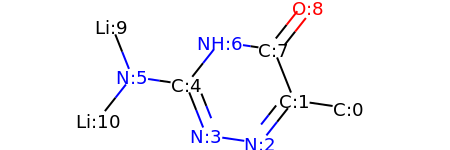

HETATM    1  C1  UNL     1       3.474  -0.746   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.990  -0.529   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.060  -1.706   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.424  -1.490   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -0.979  -0.096   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -2.463   0.121   0.000  1.00  0.00           N  
HETATM    7  N4  UNL     1      -0.049   1.081   0.000  1.00  0.00           N  
HETATM    8  C4  UNL     1       1.436   0.864   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       2.365   2.041   0.000  1.00  0.00           O  
HETATM   10 LI1  UNL     1      -3.017   1.515   0.000  1.00  0.00          LI  
HETATM   11 LI2  UNL     1      -3.393  -1.056   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6    7
CONE

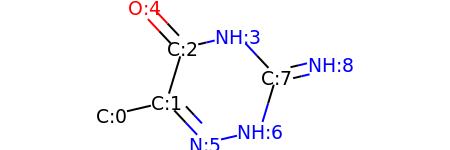

HETATM    1  C1  UNL     1      -2.693  -0.926   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.233  -0.585   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.798   0.851   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       0.662   1.193   0.000  1.00  0.00           N  
HETATM    5  O1  UNL     1      -1.824   1.945   0.000  1.00  0.00           O  
HETATM    6  N2  UNL     1      -0.206  -1.679   0.000  1.00  0.00           N  
HETATM    7  N3  UNL     1       1.254  -1.337   0.000  1.00  0.00           N  
HETATM    8  C4  UNL     1       1.689   0.098   0.000  1.00  0.00           C  
HETATM    9  N4  UNL     1       3.149   0.440   0.000  1.00  0.00           N  
CONECT    1    2
CONECT    2    3    6    6
CONECT    3    4    5    5
CONECT    4    8
CONECT    6    7
CONECT    7    8
CONECT    8    9    9
END

#################
#################
search for patterns ...
found secondary amine


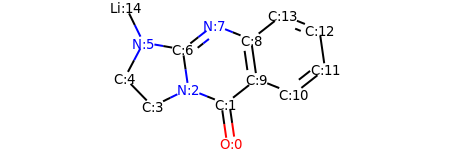

HETATM    1  O1  UNL     1       0.374  -2.953   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.161  -1.468   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.232  -0.910   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -2.578  -1.572   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -3.623  -0.496   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -2.923   0.831   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1      -1.445   0.575   0.000  1.00  0.00           C  
HETATM    8  N3  UNL     1      -0.265   1.502   0.000  1.00  0.00           N  
HETATM    9  C5  UNL     1       1.127   0.944   0.000  1.00  0.00           C  
HETATM   10  C6  UNL     1       1.340  -0.541   0.000  1.00  0.00           C  
HETATM   11  C7  UNL     1       2.732  -1.099   0.000  1.00  0.00           C  
HETATM   12  C8  UNL     1       3.912  -0.172   0.000  1.00  0.00           C  
HETATM   13  C9  UNL     1  

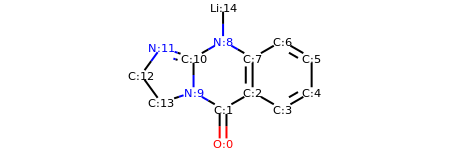

HETATM    1  O1  UNL     1      -0.262  -3.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.262  -1.500   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.037  -0.750   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.336  -1.500   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.635  -0.750   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.635   0.750   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.336   1.500   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.037   0.750   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -0.262   1.500   0.000  1.00  0.00           N  
HETATM   10  N2  UNL     1      -1.561  -0.750   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -1.561   0.750   0.000  1.00  0.00           C  
HETATM   12  N3  UNL     1      -2.988   1.214   0.000  1.00  0.00           N  
HETATM   13  C9  UNL     1  

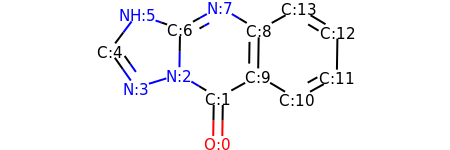

HETATM    1  O1  UNL     1      -0.324  -2.781   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.301  -1.281   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.588  -0.511   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -3.022  -0.952   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -3.884   0.275   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -2.984   1.475   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1      -1.565   0.989   0.000  1.00  0.00           C  
HETATM    8  N4  UNL     1      -0.254   1.718   0.000  1.00  0.00           N  
HETATM    9  C4  UNL     1       1.033   0.948   0.000  1.00  0.00           C  
HETATM   10  C5  UNL     1       1.010  -0.552   0.000  1.00  0.00           C  
HETATM   11  C6  UNL     1       2.297  -1.322   0.000  1.00  0.00           C  
HETATM   12  C7  UNL     1       3.607  -0.592   0.000  1.00  0.00           C  
HETATM   13  C8  UNL     1  

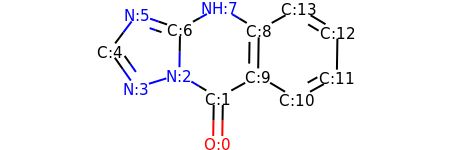

HETATM    1  O1  UNL     1      -0.324  -2.781   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.301  -1.281   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.588  -0.511   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -3.022  -0.952   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -3.884   0.275   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -2.984   1.475   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1      -1.565   0.989   0.000  1.00  0.00           C  
HETATM    8  N4  UNL     1      -0.254   1.718   0.000  1.00  0.00           N  
HETATM    9  C4  UNL     1       1.033   0.948   0.000  1.00  0.00           C  
HETATM   10  C5  UNL     1       1.010  -0.552   0.000  1.00  0.00           C  
HETATM   11  C6  UNL     1       2.297  -1.322   0.000  1.00  0.00           C  
HETATM   12  C7  UNL     1       3.607  -0.592   0.000  1.00  0.00           C  
HETATM   13  C8  UNL     1  

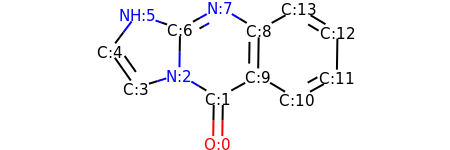

HETATM    1  O1  UNL     1      -0.324  -2.781   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.301  -1.281   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.588  -0.511   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -3.022  -0.952   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -3.884   0.275   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -2.984   1.475   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1      -1.565   0.989   0.000  1.00  0.00           C  
HETATM    8  N3  UNL     1      -0.254   1.718   0.000  1.00  0.00           N  
HETATM    9  C5  UNL     1       1.033   0.948   0.000  1.00  0.00           C  
HETATM   10  C6  UNL     1       1.010  -0.552   0.000  1.00  0.00           C  
HETATM   11  C7  UNL     1       2.297  -1.322   0.000  1.00  0.00           C  
HETATM   12  C8  UNL     1       3.607  -0.592   0.000  1.00  0.00           C  
HETATM   13  C9  UNL     1  

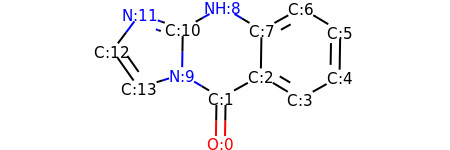

HETATM    1  O1  UNL     1      -0.324  -2.781   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.301  -1.281   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.010  -0.552   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.297  -1.322   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.607  -0.592   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.631   0.907   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.344   1.678   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.033   0.948   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -0.254   1.718   0.000  1.00  0.00           N  
HETATM   10  N2  UNL     1      -1.588  -0.511   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -1.565   0.989   0.000  1.00  0.00           C  
HETATM   12  N3  UNL     1      -2.984   1.475   0.000  1.00  0.00           N  
HETATM   13  C9  UNL     1  

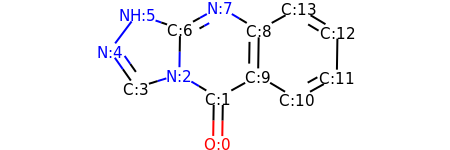

HETATM    1  O1  UNL     1      -0.324  -2.781   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.301  -1.281   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.588  -0.511   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -3.022  -0.952   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -3.884   0.275   0.000  1.00  0.00           N  
HETATM    6  N3  UNL     1      -2.984   1.475   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1      -1.565   0.989   0.000  1.00  0.00           C  
HETATM    8  N4  UNL     1      -0.254   1.718   0.000  1.00  0.00           N  
HETATM    9  C4  UNL     1       1.033   0.948   0.000  1.00  0.00           C  
HETATM   10  C5  UNL     1       1.010  -0.552   0.000  1.00  0.00           C  
HETATM   11  C6  UNL     1       2.297  -1.322   0.000  1.00  0.00           C  
HETATM   12  C7  UNL     1       3.607  -0.592   0.000  1.00  0.00           C  
HETATM   13  C8  UNL     1  

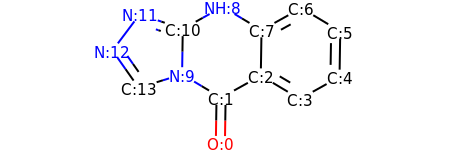

HETATM    1  O1  UNL     1      -0.324  -2.781   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.301  -1.281   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.010  -0.552   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.297  -1.322   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.607  -0.592   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.631   0.907   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.344   1.678   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.033   0.948   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -0.254   1.718   0.000  1.00  0.00           N  
HETATM   10  N2  UNL     1      -1.588  -0.511   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -1.565   0.989   0.000  1.00  0.00           C  
HETATM   12  N3  UNL     1      -2.984   1.475   0.000  1.00  0.00           N  
HETATM   13  N4  UNL     1  

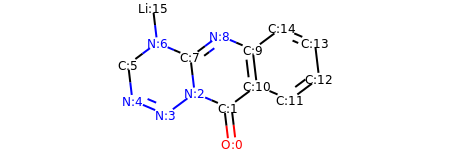

HETATM    1  O1  UNL     1       0.514  -2.960   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.338  -1.470   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.040  -0.879   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -2.242  -1.776   0.000  1.00  0.00           N  
HETATM    5  N3  UNL     1      -3.620  -1.184   0.000  1.00  0.00           N  
HETATM    6  C2  UNL     1      -3.797   0.305   0.000  1.00  0.00           C  
HETATM    7  N4  UNL     1      -2.595   1.203   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1      -1.217   0.611   0.000  1.00  0.00           C  
HETATM    9  N5  UNL     1      -0.015   1.509   0.000  1.00  0.00           N  
HETATM   10  C4  UNL     1       1.363   0.917   0.000  1.00  0.00           C  
HETATM   11  C5  UNL     1       1.540  -0.573   0.000  1.00  0.00           C  
HETATM   12  C6  UNL     1       2.918  -1.165   0.000  1.00  0.00           C  
HETATM   13  C7  UNL     1  

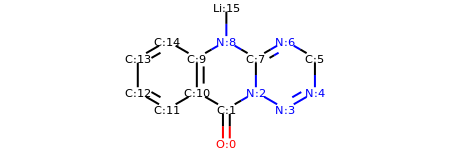

HETATM    1  O1  UNL     1      -0.000  -3.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.000  -1.500   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.299  -0.750   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1       2.598  -1.500   0.000  1.00  0.00           N  
HETATM    5  N3  UNL     1       3.897  -0.750   0.000  1.00  0.00           N  
HETATM    6  C2  UNL     1       3.897   0.750   0.000  1.00  0.00           C  
HETATM    7  N4  UNL     1       2.598   1.500   0.000  1.00  0.00           N  
HETATM    8  C3  UNL     1       1.299   0.750   0.000  1.00  0.00           C  
HETATM    9  N5  UNL     1       0.000   1.500   0.000  1.00  0.00           N  
HETATM   10  C4  UNL     1      -1.299   0.750   0.000  1.00  0.00           C  
HETATM   11  C5  UNL     1      -1.299  -0.750   0.000  1.00  0.00           C  
HETATM   12  C6  UNL     1      -2.598  -1.500   0.000  1.00  0.00           C  
HETATM   13  C7  UNL     1  

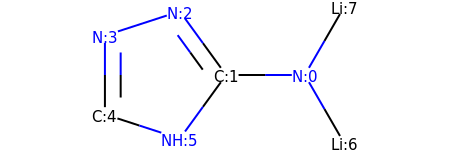

HETATM    1  N1  UNL     1       1.547  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.047  -0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.834   1.214   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1      -2.261   0.750   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -2.261  -0.750   0.000  1.00  0.00           C  
HETATM    6  N4  UNL     1      -0.834  -1.214   0.000  1.00  0.00           N  
HETATM    7 LI1  UNL     1       2.297  -1.299   0.000  1.00  0.00          LI  
HETATM    8 LI2  UNL     1       2.297   1.299   0.000  1.00  0.00          LI  
CONECT    1    2    7    8
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
END

search for patterns ...


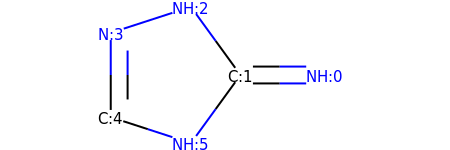

HETATM    1  N1  UNL     1       2.313  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.813  -0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.068   1.214   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1      -1.495   0.750   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -1.495  -0.750   0.000  1.00  0.00           C  
HETATM    6  N4  UNL     1      -0.068  -1.214   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
END

#################
#################
search for patterns ...
found primary amine


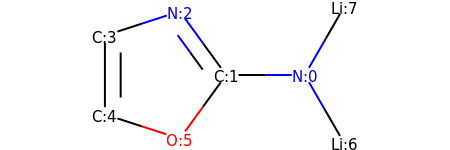

HETATM    1  N1  UNL     1       1.547  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.047  -0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.834   1.214   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -2.261   0.750   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -2.261  -0.750   0.000  1.00  0.00           C  
HETATM    6  O1  UNL     1      -0.834  -1.214   0.000  1.00  0.00           O  
HETATM    7 LI1  UNL     1       2.297  -1.299   0.000  1.00  0.00          LI  
HETATM    8 LI2  UNL     1       2.297   1.299   0.000  1.00  0.00          LI  
CONECT    1    2    7    8
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
END

search for patterns ...


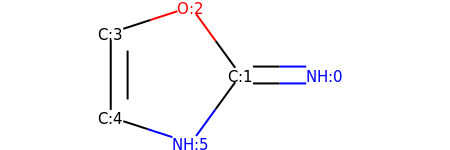

HETATM    1  N1  UNL     1       2.313  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.813  -0.000   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -0.068   1.214   0.000  1.00  0.00           O  
HETATM    4  C2  UNL     1      -1.495   0.750   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.495  -0.750   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -0.068  -1.214   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
END

#################
#################
search for patterns ...
found primary amine


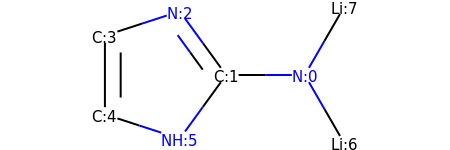

HETATM    1  N1  UNL     1       1.547  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.047  -0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.834   1.214   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -2.261   0.750   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -2.261  -0.750   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -0.834  -1.214   0.000  1.00  0.00           N  
HETATM    7 LI1  UNL     1       2.297  -1.299   0.000  1.00  0.00          LI  
HETATM    8 LI2  UNL     1       2.297   1.299   0.000  1.00  0.00          LI  
CONECT    1    2    7    8
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
END

search for patterns ...


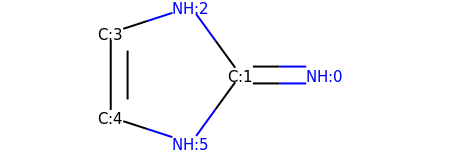

HETATM    1  N1  UNL     1       2.313  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.813  -0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.068   1.214   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.495   0.750   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.495  -0.750   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -0.068  -1.214   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
END

#################
#################
search for patterns ...


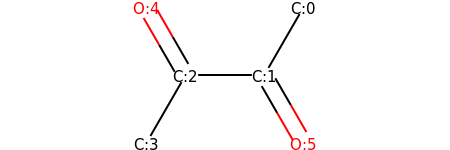

HETATM    1  C1  UNL     1       1.500   1.299   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       0.750   0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.750  -0.000   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -1.500  -1.299   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1      -1.500   1.299   0.000  1.00  0.00           O  
HETATM    6  O2  UNL     1       1.500  -1.299   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    6    6
CONECT    3    4    5    5
END

search for patterns ...
found primary alcohol


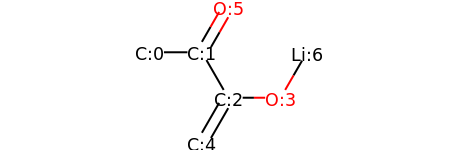

HETATM    1  C1  UNL     1      -2.250   0.557   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.750   0.557   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.000  -0.742   0.000  1.00  0.00           C  
HETATM    4  O1  UNL     1       1.500  -0.742   0.000  1.00  0.00           O  
HETATM    5  C4  UNL     1      -0.750  -2.041   0.000  1.00  0.00           C  
HETATM    6  O2  UNL     1       0.000   1.856   0.000  1.00  0.00           O  
HETATM    7 LI1  UNL     1       2.250   0.557   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    6    6
CONECT    3    4    5    5
CONECT    4    7
END

#################
#################
search for patterns ...
found primary alcohol


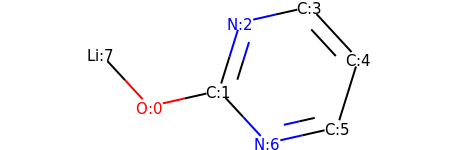

HETATM    1  O1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.159   1.129   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.305   1.459   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.322   0.357   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.876  -1.075   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1       0.413  -1.405   0.000  1.00  0.00           N  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


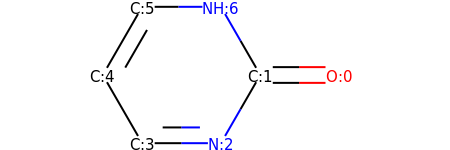

HETATM    1  O1  UNL     1       2.571   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.321  -1.299   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.179  -1.299   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.929   0.000   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -1.179   1.299   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1       0.321   1.299   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4    4
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
END

#################
#################
search for patterns ...
found primary amine


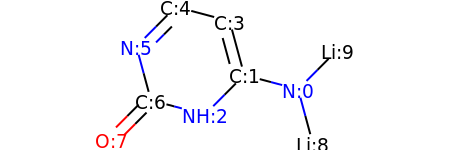

HETATM    1  N1  UNL     1       2.096  -0.288   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.647   0.097   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.412  -0.966   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.255   1.545   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.195   1.930   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -2.253   0.867   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1      -1.861  -0.581   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.920  -1.644   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1       2.488  -1.736   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1       3.155   0.775   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    4    4
CONECT    3    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...
found primar

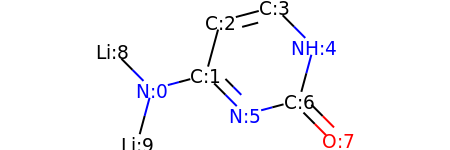

HETATM    1  N1  UNL     1      -2.096  -0.288   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.647   0.097   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.255   1.545   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.195   1.930   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       2.253   0.867   0.000  1.00  0.00           N  
HETATM    6  N3  UNL     1       0.412  -0.966   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.861  -0.581   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.920  -1.644   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.155   0.775   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1      -2.488  -1.736   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    6    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################


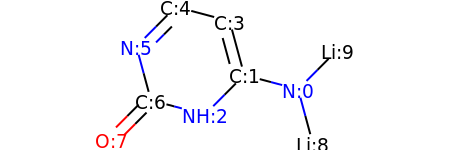

HETATM    1  N1  UNL     1       2.096  -0.288   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.647   0.097   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.412  -0.966   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.255   1.545   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.195   1.930   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -2.253   0.867   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1      -1.861  -0.581   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.920  -1.644   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1       2.488  -1.736   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1       3.155   0.775   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    4    4
CONECT    3    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...


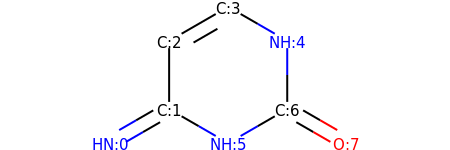

HETATM    1  N1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.299   1.125   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.000   1.875   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       1.299   1.125   0.000  1.00  0.00           N  
HETATM    6  N3  UNL     1      -0.000  -1.125   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.598  -1.125   0.000  1.00  0.00           O  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary amine


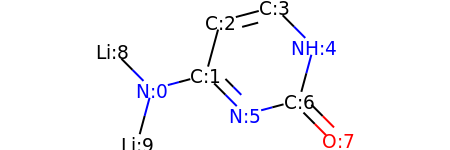

HETATM    1  N1  UNL     1      -2.096  -0.288   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.647   0.097   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.255   1.545   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.195   1.930   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       2.253   0.867   0.000  1.00  0.00           N  
HETATM    6  N3  UNL     1       0.412  -0.966   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.861  -0.581   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.920  -1.644   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.155   0.775   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1      -2.488  -1.736   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    6    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...


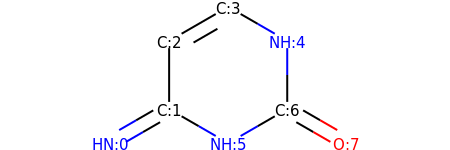

HETATM    1  N1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.299   1.125   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.000   1.875   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       1.299   1.125   0.000  1.00  0.00           N  
HETATM    6  N3  UNL     1      -0.000  -1.125   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.598  -1.125   0.000  1.00  0.00           O  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary amine
found secondary amine


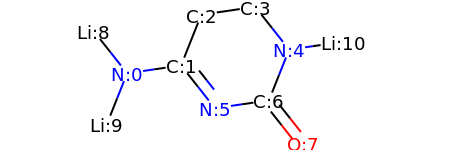

HETATM    1  N1  UNL     1      -2.463  -0.121   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.979   0.096   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.424   1.490   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.060   1.706   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       1.990   0.529   0.000  1.00  0.00           N  
HETATM    6  N3  UNL     1      -0.049  -1.081   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.436  -0.864   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.365  -2.041   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.393   1.056   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1      -3.017  -1.515   0.000  1.00  0.00          LI  
HETATM   11 LI3  UNL     1       3.474   0.746   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5
CONECT    5    7   11

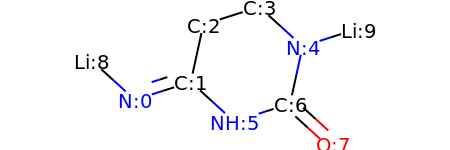

HETATM    1  N1  UNL     1      -2.683  -0.719   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.254  -0.263   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.934   1.202   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.495   1.658   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       1.604   0.648   0.000  1.00  0.00           N  
HETATM    6  N3  UNL     1      -0.145  -1.273   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.284  -0.818   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.393  -1.828   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.792   0.291   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1       3.033   1.103   0.000  1.00  0.00          LI  
CONECT    1    2    2    9
CONECT    2    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    7   10
CONECT    6    7
CONECT    7    8    8
END

#################
#################
searc

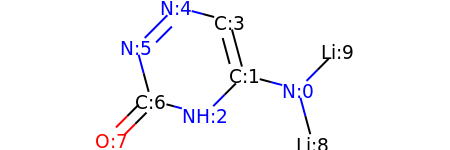

HETATM    1  N1  UNL     1       2.096  -0.288   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.647   0.097   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.412  -0.966   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.255   1.545   0.000  1.00  0.00           C  
HETATM    5  N3  UNL     1      -1.195   1.930   0.000  1.00  0.00           N  
HETATM    6  N4  UNL     1      -2.253   0.867   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1      -1.861  -0.581   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.920  -1.644   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1       2.488  -1.736   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1       3.155   0.775   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    4    4
CONECT    3    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...
found primar

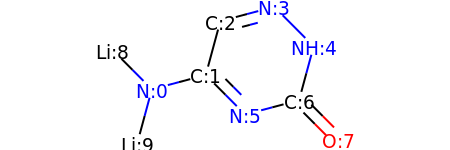

HETATM    1  N1  UNL     1      -2.096  -0.288   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.647   0.097   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.255   1.545   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1       1.195   1.930   0.000  1.00  0.00           N  
HETATM    5  N3  UNL     1       2.253   0.867   0.000  1.00  0.00           N  
HETATM    6  N4  UNL     1       0.412  -0.966   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1       1.861  -0.581   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.920  -1.644   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.155   0.775   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1      -2.488  -1.736   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    6    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################


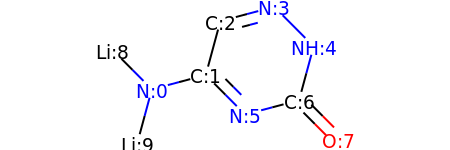

HETATM    1  N1  UNL     1      -2.096  -0.288   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.647   0.097   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.255   1.545   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1       1.195   1.930   0.000  1.00  0.00           N  
HETATM    5  N3  UNL     1       2.253   0.867   0.000  1.00  0.00           N  
HETATM    6  N4  UNL     1       0.412  -0.966   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1       1.861  -0.581   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.920  -1.644   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.155   0.775   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1      -2.488  -1.736   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    6    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...


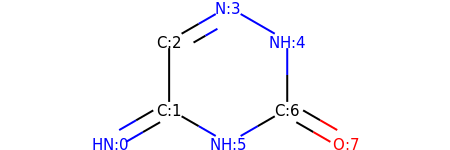

HETATM    1  N1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.299   1.125   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1       0.000   1.875   0.000  1.00  0.00           N  
HETATM    5  N3  UNL     1       1.299   1.125   0.000  1.00  0.00           N  
HETATM    6  N4  UNL     1      -0.000  -1.125   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.598  -1.125   0.000  1.00  0.00           O  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found secondary amine


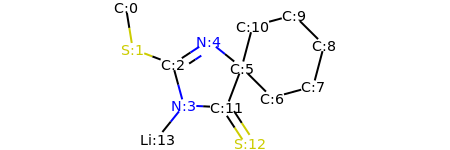

HETATM    1  C1  UNL     1      -3.491   2.252   0.000  1.00  0.00           C  
HETATM    2  S1  UNL     1      -3.252   0.772   0.000  1.00  0.00           S  
HETATM    3  C2  UNL     1      -1.849   0.239   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.456  -1.209   0.000  1.00  0.00           N  
HETATM    5  N2  UNL     1      -0.594   1.060   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       0.575   0.120   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       1.639  -0.937   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.087  -0.543   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.470   0.907   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       2.405   1.964   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       0.958   1.571   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       0.042  -1.282   0.000  1.00  0.00           C  
HETATM   13  S2  UNL     1  

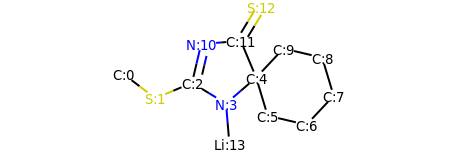

HETATM    1  C1  UNL     1      -4.492   0.203   0.000  1.00  0.00           C  
HETATM    2  S1  UNL     1      -3.298  -0.705   0.000  1.00  0.00           S  
HETATM    3  C2  UNL     1      -1.914  -0.125   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -0.632  -0.903   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.504   0.076   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.937  -1.361   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.397  -1.704   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.424  -0.612   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.992   0.824   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.532   1.168   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -1.570   1.335   0.000  1.00  0.00           N  
HETATM   12  C9  UNL     1      -0.076   1.459   0.000  1.00  0.00           C  
HETATM   13  S2  UNL     1  

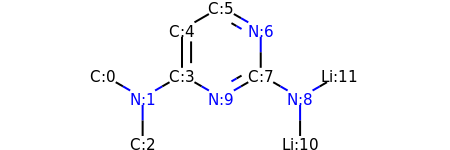

HETATM    1  C1  UNL     1      -3.897   0.125   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -2.598  -0.625   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -2.598  -2.125   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.299   0.125   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.299   1.625   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       0.000   2.375   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1       1.299   1.625   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       1.299   0.125   0.000  1.00  0.00           C  
HETATM    9  N3  UNL     1       2.598  -0.625   0.000  1.00  0.00           N  
HETATM   10  N4  UNL     1      -0.000  -0.625   0.000  1.00  0.00           N  
HETATM   11 LI1  UNL     1       2.598  -2.125   0.000  1.00  0.00          LI  
HETATM   12 LI2  UNL     1       3.897   0.125   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

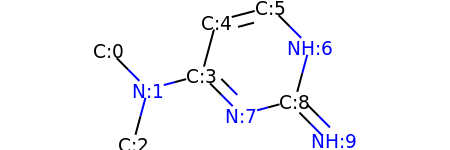

HETATM    1  C1  UNL     1      -3.155   0.775   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -2.096  -0.288   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -2.488  -1.736   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.647   0.097   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.255   1.545   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.195   1.930   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1       2.253   0.867   0.000  1.00  0.00           N  
HETATM    8  N3  UNL     1       0.412  -0.966   0.000  1.00  0.00           N  
HETATM    9  C6  UNL     1       1.861  -0.581   0.000  1.00  0.00           C  
HETATM   10  N4  UNL     1       2.920  -1.644   0.000  1.00  0.00           N  
CONECT    1    2
CONECT    2    3    4
CONECT    4    5    8    8
CONECT    5    6    6
CONECT    6    7
CONECT    7    9
CONECT    8    9
CONECT    9   10   10
END

#################
######

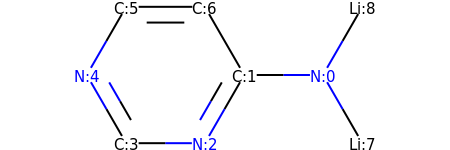

HETATM    1  N1  UNL     1       1.833   0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.333  -0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.417  -1.299   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.917  -1.299   0.000  1.00  0.00           C  
HETATM    5  N3  UNL     1      -2.667   0.000   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -1.917   1.299   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1      -0.417   1.299   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1       2.583  -1.299   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1       2.583   1.299   0.000  1.00  0.00          LI  
CONECT    1    2    8    9
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


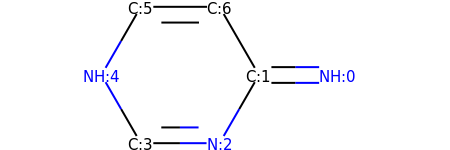

HETATM    1  N1  UNL     1       2.571   0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       0.321  -1.299   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.179  -1.299   0.000  1.00  0.00           C  
HETATM    5  N3  UNL     1      -1.929   0.000   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -1.179   1.299   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4    4
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found primary amine


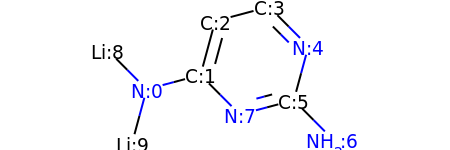

HETATM    1  N1  UNL     1      -2.096  -0.288   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.647   0.097   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.255   1.545   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.195   1.930   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       2.253   0.867   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.861  -0.581   0.000  1.00  0.00           C  
HETATM    7  N3  UNL     1       2.920  -1.644   0.000  1.00  0.00           N  
HETATM    8  N4  UNL     1       0.412  -0.966   0.000  1.00  0.00           N  
HETATM    9 LI1  UNL     1      -3.155   0.775   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1      -2.488  -1.736   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    8    8
END

search for patterns ...
found primary amine


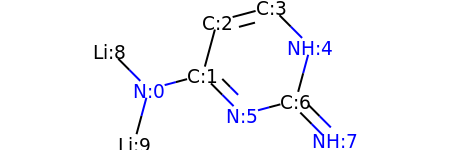

HETATM    1  N1  UNL     1      -2.096  -0.288   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.647   0.097   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.255   1.545   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.195   1.930   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       2.253   0.867   0.000  1.00  0.00           N  
HETATM    6  N3  UNL     1       0.412  -0.966   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.861  -0.581   0.000  1.00  0.00           C  
HETATM    8  N4  UNL     1       2.920  -1.644   0.000  1.00  0.00           N  
HETATM    9 LI1  UNL     1      -3.155   0.775   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1      -2.488  -1.736   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    6    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################


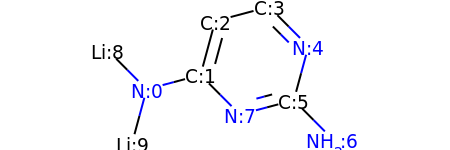

HETATM    1  N1  UNL     1      -2.096  -0.288   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.647   0.097   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.255   1.545   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.195   1.930   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       2.253   0.867   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.861  -0.581   0.000  1.00  0.00           C  
HETATM    7  N3  UNL     1       2.920  -1.644   0.000  1.00  0.00           N  
HETATM    8  N4  UNL     1       0.412  -0.966   0.000  1.00  0.00           N  
HETATM    9 LI1  UNL     1      -3.155   0.775   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1      -2.488  -1.736   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    8    8
END

search for patterns ...
found primary amine


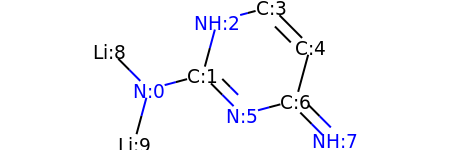

HETATM    1  N1  UNL     1      -2.096  -0.288   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.647   0.097   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.255   1.545   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.195   1.930   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.253   0.867   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1       0.412  -0.966   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.861  -0.581   0.000  1.00  0.00           C  
HETATM    8  N4  UNL     1       2.920  -1.644   0.000  1.00  0.00           N  
HETATM    9 LI1  UNL     1      -3.155   0.775   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1      -2.488  -1.736   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################


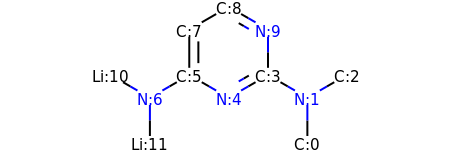

HETATM    1  C1  UNL     1       2.598  -2.125   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       2.598  -0.625   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       3.897   0.125   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.299   0.125   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -0.000  -0.625   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -1.299   0.125   0.000  1.00  0.00           C  
HETATM    7  N3  UNL     1      -2.598  -0.625   0.000  1.00  0.00           N  
HETATM    8  C5  UNL     1      -1.299   1.625   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1      -0.000   2.375   0.000  1.00  0.00           C  
HETATM   10  N4  UNL     1       1.299   1.625   0.000  1.00  0.00           N  
HETATM   11 LI1  UNL     1      -3.897   0.125   0.000  1.00  0.00          LI  
HETATM   12 LI2  UNL     1      -2.598  -2.125   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

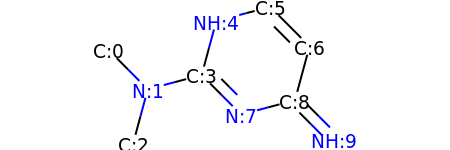

HETATM    1  C1  UNL     1      -3.155   0.775   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -2.096  -0.288   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -2.488  -1.736   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.647   0.097   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -0.255   1.545   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.195   1.930   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.253   0.867   0.000  1.00  0.00           C  
HETATM    8  N3  UNL     1       0.412  -0.966   0.000  1.00  0.00           N  
HETATM    9  C6  UNL     1       1.861  -0.581   0.000  1.00  0.00           C  
HETATM   10  N4  UNL     1       2.920  -1.644   0.000  1.00  0.00           N  
CONECT    1    2
CONECT    2    3    4
CONECT    4    5    8    8
CONECT    5    6
CONECT    6    7    7
CONECT    7    9
CONECT    8    9
CONECT    9   10   10
END

#################
######

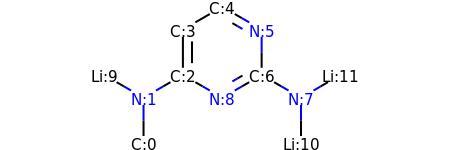

HETATM    1  C1  UNL     1      -2.598  -2.125   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -2.598  -0.625   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -1.299   0.125   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.299   1.625   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.000   2.375   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1       1.299   1.625   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1       1.299   0.125   0.000  1.00  0.00           C  
HETATM    8  N3  UNL     1       2.598  -0.625   0.000  1.00  0.00           N  
HETATM    9  N4  UNL     1      -0.000  -0.625   0.000  1.00  0.00           N  
HETATM   10 LI1  UNL     1      -3.897   0.125   0.000  1.00  0.00          LI  
HETATM   11 LI2  UNL     1       2.598  -2.125   0.000  1.00  0.00          LI  
HETATM   12 LI3  UNL     1       3.897   0.125   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

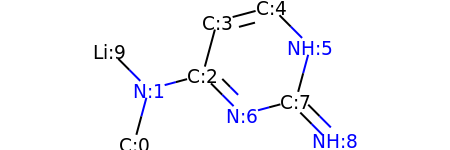

HETATM    1  C1  UNL     1      -2.488  -1.736   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -2.096  -0.288   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -0.647   0.097   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.255   1.545   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.195   1.930   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1       2.253   0.867   0.000  1.00  0.00           N  
HETATM    7  N3  UNL     1       0.412  -0.966   0.000  1.00  0.00           N  
HETATM    8  C5  UNL     1       1.861  -0.581   0.000  1.00  0.00           C  
HETATM    9  N4  UNL     1       2.920  -1.644   0.000  1.00  0.00           N  
HETATM   10 LI1  UNL     1      -3.155   0.775   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3   10
CONECT    3    4    7    7
CONECT    4    5    5
CONECT    5    6
CONECT    6    8
CONECT    7    8
CONECT    8    9    9
END

#################
######

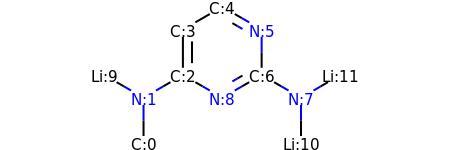

HETATM    1  C1  UNL     1      -2.598  -2.125   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -2.598  -0.625   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -1.299   0.125   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.299   1.625   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.000   2.375   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1       1.299   1.625   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1       1.299   0.125   0.000  1.00  0.00           C  
HETATM    8  N3  UNL     1       2.598  -0.625   0.000  1.00  0.00           N  
HETATM    9  N4  UNL     1      -0.000  -0.625   0.000  1.00  0.00           N  
HETATM   10 LI1  UNL     1      -3.897   0.125   0.000  1.00  0.00          LI  
HETATM   11 LI2  UNL     1       2.598  -2.125   0.000  1.00  0.00          LI  
HETATM   12 LI3  UNL     1       3.897   0.125   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

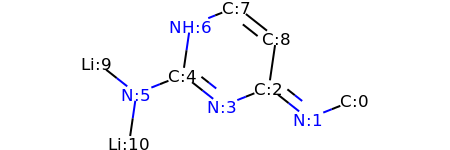

HETATM    1  C1  UNL     1       4.080  -0.663   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       2.687  -1.218   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       1.509  -0.289   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1       0.116  -0.844   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -1.062   0.086   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -2.455  -0.469   0.000  1.00  0.00           N  
HETATM    7  N4  UNL     1      -0.846   1.570   0.000  1.00  0.00           N  
HETATM    8  C4  UNL     1       0.548   2.125   0.000  1.00  0.00           C  
HETATM    9  C5  UNL     1       1.725   1.196   0.000  1.00  0.00           C  
HETATM   10 LI1  UNL     1      -3.633   0.460   0.000  1.00  0.00          LI  
HETATM   11 LI2  UNL     1      -2.671  -1.954   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3
CONECT    3    4    9
CONECT    4    5    5
CONECT    5    6    7
CONE

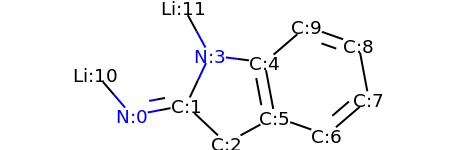

HETATM    1  N1  UNL     1      -3.058  -0.908   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.584  -0.631   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.493  -1.661   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -0.941   0.724   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.547   0.532   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.823  -0.943   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.238  -1.440   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.377  -0.463   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.100   1.011   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.685   1.508   0.000  1.00  0.00           C  
HETATM   11 LI1  UNL     1      -4.035   0.230   0.000  1.00  0.00          LI  
HETATM   12 LI2  UNL     1      -1.660   2.041   0.000  1.00  0.00          LI  
CONECT    1    2    2   11
C

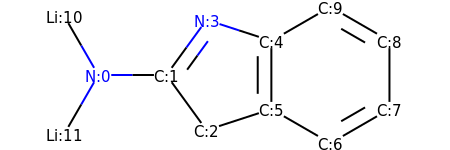

HETATM    1  N1  UNL     1      -2.951  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.451   0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.569  -1.214   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -0.569   1.214   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.858   0.750   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.858  -0.750   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.157  -1.500   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.456  -0.750   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.456   0.750   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       2.157   1.500   0.000  1.00  0.00           C  
HETATM   11 LI1  UNL     1      -3.701   1.299   0.000  1.00  0.00          LI  
HETATM   12 LI2  UNL     1      -3.701  -1.299   0.000  1.00  0.00          LI  
CONECT    1    2   11   12
C

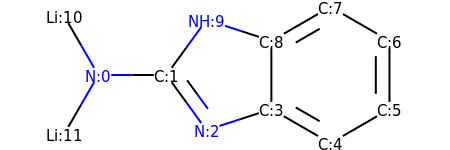

HETATM    1  N1  UNL     1      -2.951  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.451   0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.569  -1.214   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.858  -0.750   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.157  -1.500   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       3.456  -0.750   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.456   0.750   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.157   1.500   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.858   0.750   0.000  1.00  0.00           C  
HETATM   10  N3  UNL     1      -0.569   1.214   0.000  1.00  0.00           N  
HETATM   11 LI1  UNL     1      -3.701   1.299   0.000  1.00  0.00          LI  
HETATM   12 LI2  UNL     1      -3.701  -1.299   0.000  1.00  0.00          LI  
CONECT    1    2   11   12
C

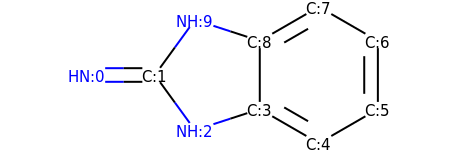

HETATM    1  N1  UNL     1      -3.691  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -2.191  -0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -1.309  -1.214   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.118  -0.750   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.417  -1.500   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.716  -0.750   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.716   0.750   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.417   1.500   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.118   0.750   0.000  1.00  0.00           C  
HETATM   10  N3  UNL     1      -1.309   1.214   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3   10
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9    9
CONECT    9   10
END

##

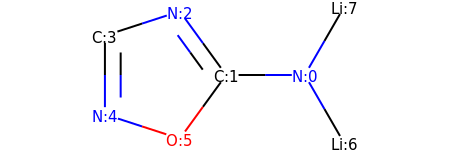

HETATM    1  N1  UNL     1       1.547  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.047  -0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.834   1.214   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -2.261   0.750   0.000  1.00  0.00           C  
HETATM    5  N3  UNL     1      -2.261  -0.750   0.000  1.00  0.00           N  
HETATM    6  O1  UNL     1      -0.834  -1.214   0.000  1.00  0.00           O  
HETATM    7 LI1  UNL     1       2.297  -1.299   0.000  1.00  0.00          LI  
HETATM    8 LI2  UNL     1       2.297   1.299   0.000  1.00  0.00          LI  
CONECT    1    2    7    8
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
END

search for patterns ...


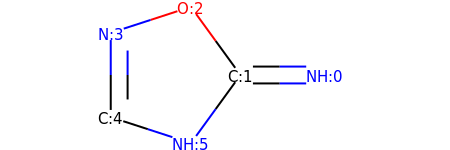

HETATM    1  N1  UNL     1       2.313  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.813  -0.000   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -0.068   1.214   0.000  1.00  0.00           O  
HETATM    4  N2  UNL     1      -1.495   0.750   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -1.495  -0.750   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -0.068  -1.214   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
END

#################
#################
search for patterns ...
found primary amine


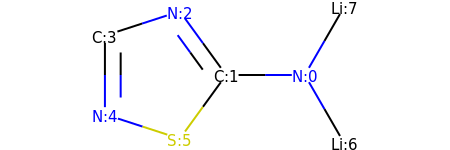

HETATM    1  N1  UNL     1       1.547  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.047  -0.000   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.834   1.214   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -2.261   0.750   0.000  1.00  0.00           C  
HETATM    5  N3  UNL     1      -2.261  -0.750   0.000  1.00  0.00           N  
HETATM    6  S1  UNL     1      -0.834  -1.214   0.000  1.00  0.00           S  
HETATM    7 LI1  UNL     1       2.297  -1.299   0.000  1.00  0.00          LI  
HETATM    8 LI2  UNL     1       2.297   1.299   0.000  1.00  0.00          LI  
CONECT    1    2    7    8
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
END

search for patterns ...


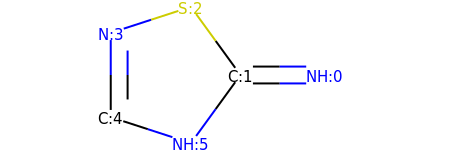

HETATM    1  N1  UNL     1       2.313  -0.000   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.813  -0.000   0.000  1.00  0.00           C  
HETATM    3  S1  UNL     1      -0.068   1.214   0.000  1.00  0.00           S  
HETATM    4  N2  UNL     1      -1.495   0.750   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -1.495  -0.750   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -0.068  -1.214   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
END

#################
#################
search for patterns ...
found primary amine


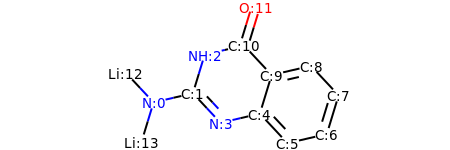

HETATM    1  N1  UNL     1      -3.142  -0.443   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.681  -0.104   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -1.244   1.331   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1      -0.656  -1.200   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       0.805  -0.861   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.829  -1.957   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       3.290  -1.618   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.727  -0.183   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.703   0.913   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       1.242   0.574   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       0.218   1.670   0.000  1.00  0.00           C  
HETATM   12  O1  UNL     1       0.655   3.105   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

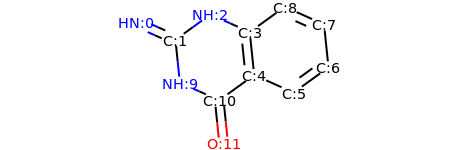

HETATM    1  N1  UNL     1      -3.612   1.261   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -2.243   0.648   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -1.028   1.528   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.341   0.915   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.495  -0.577   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.864  -1.190   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.079  -0.311   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.925   1.181   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.556   1.794   0.000  1.00  0.00           C  
HETATM   10  N3  UNL     1      -2.090  -0.844   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -0.720  -1.457   0.000  1.00  0.00           C  
HETATM   12  O1  UNL     1      -0.567  -2.949   0.000  1.00  0.00           O  
CONECT    1    2    2
CONECT

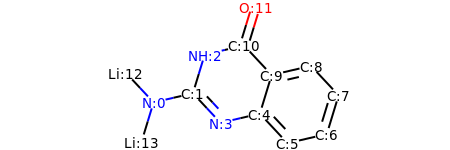

HETATM    1  N1  UNL     1      -3.142  -0.443   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.681  -0.104   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -1.244   1.331   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1      -0.656  -1.200   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       0.805  -0.861   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.829  -1.957   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       3.290  -1.618   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.727  -0.183   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.703   0.913   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       1.242   0.574   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       0.218   1.670   0.000  1.00  0.00           C  
HETATM   12  O1  UNL     1       0.655   3.105   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

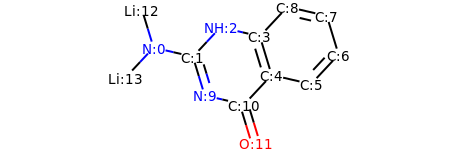

HETATM    1  N1  UNL     1      -3.142   0.443   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.681   0.104   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.656   1.200   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.805   0.861   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.242  -0.574   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.703  -0.913   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.727   0.183   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.290   1.618   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.829   1.957   0.000  1.00  0.00           C  
HETATM   10  N3  UNL     1      -1.244  -1.331   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1       0.218  -1.670   0.000  1.00  0.00           C  
HETATM   12  O1  UNL     1       0.655  -3.105   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

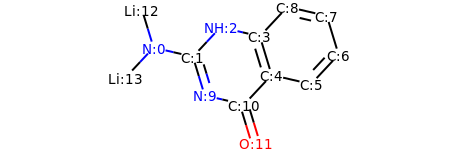

HETATM    1  N1  UNL     1      -3.142   0.443   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.681   0.104   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.656   1.200   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.805   0.861   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.242  -0.574   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.703  -0.913   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.727   0.183   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.290   1.618   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.829   1.957   0.000  1.00  0.00           C  
HETATM   10  N3  UNL     1      -1.244  -1.331   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1       0.218  -1.670   0.000  1.00  0.00           C  
HETATM   12  O1  UNL     1       0.655  -3.105   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

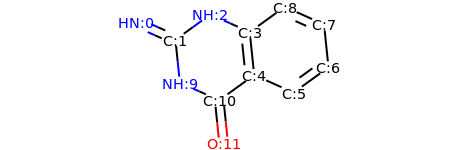

HETATM    1  N1  UNL     1      -3.612   1.261   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -2.243   0.648   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -1.028   1.528   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.341   0.915   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.495  -0.577   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.864  -1.190   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.079  -0.311   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.925   1.181   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.556   1.794   0.000  1.00  0.00           C  
HETATM   10  N3  UNL     1      -2.090  -0.844   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -0.720  -1.457   0.000  1.00  0.00           C  
HETATM   12  O1  UNL     1      -0.567  -2.949   0.000  1.00  0.00           O  
CONECT    1    2    2
CONECT

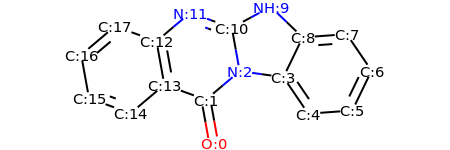

HETATM    1  O1  UNL     1      -0.389  -2.553   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.655  -1.077   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.491  -0.109   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.977  -0.312   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.820  -1.553   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       4.316  -1.443   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       4.969  -0.092   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       4.125   1.148   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.629   1.038   0.000  1.00  0.00           C  
HETATM   10  N2  UNL     1       1.547   2.076   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1       0.225   1.367   0.000  1.00  0.00           C  
HETATM   12  N3  UNL     1      -1.187   1.875   0.000  1.00  0.00           N  
HETATM   13  C9  UNL     1  

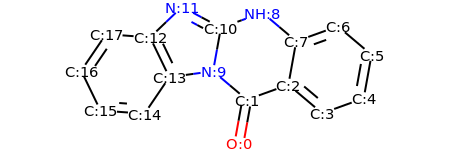

HETATM    1  O1  UNL     1       0.389  -2.553   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.655  -1.077   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.066  -0.569   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       3.212  -1.537   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       4.623  -1.029   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       4.889   0.447   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.744   1.415   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.332   0.907   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1       1.187   1.875   0.000  1.00  0.00           N  
HETATM   10  N2  UNL     1      -0.491  -0.109   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -0.225   1.367   0.000  1.00  0.00           C  
HETATM   12  N3  UNL     1      -1.547   2.076   0.000  1.00  0.00           N  
HETATM   13  C9  UNL     1  

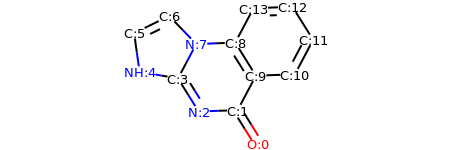

HETATM    1  O1  UNL     1       1.262  -3.157   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.467  -1.886   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.032  -1.939   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.828  -0.667   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -3.305  -0.407   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -3.515   1.078   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1      -2.167   1.736   0.000  1.00  0.00           C  
HETATM    8  N3  UNL     1      -1.124   0.658   0.000  1.00  0.00           N  
HETATM    9  C5  UNL     1       0.375   0.711   0.000  1.00  0.00           C  
HETATM   10  C6  UNL     1       1.170  -0.561   0.000  1.00  0.00           C  
HETATM   11  C7  UNL     1       2.669  -0.508   0.000  1.00  0.00           C  
HETATM   12  C8  UNL     1       3.373   0.817   0.000  1.00  0.00           C  
HETATM   13  C9  UNL     1  

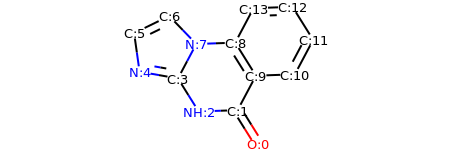

HETATM    1  O1  UNL     1       1.262  -3.157   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.467  -1.886   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.032  -1.939   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.828  -0.667   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -3.305  -0.407   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -3.515   1.078   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1      -2.167   1.736   0.000  1.00  0.00           C  
HETATM    8  N3  UNL     1      -1.124   0.658   0.000  1.00  0.00           N  
HETATM    9  C5  UNL     1       0.375   0.711   0.000  1.00  0.00           C  
HETATM   10  C6  UNL     1       1.170  -0.561   0.000  1.00  0.00           C  
HETATM   11  C7  UNL     1       2.669  -0.508   0.000  1.00  0.00           C  
HETATM   12  C8  UNL     1       3.373   0.817   0.000  1.00  0.00           C  
HETATM   13  C9  UNL     1  

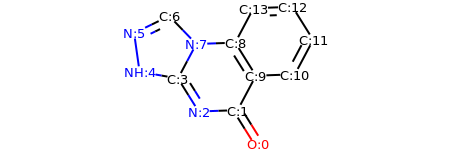

HETATM    1  O1  UNL     1       1.262  -3.157   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.467  -1.886   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.032  -1.939   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.828  -0.667   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -3.305  -0.407   0.000  1.00  0.00           N  
HETATM    6  N3  UNL     1      -3.515   1.078   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1      -2.167   1.736   0.000  1.00  0.00           C  
HETATM    8  N4  UNL     1      -1.124   0.658   0.000  1.00  0.00           N  
HETATM    9  C4  UNL     1       0.375   0.711   0.000  1.00  0.00           C  
HETATM   10  C5  UNL     1       1.170  -0.561   0.000  1.00  0.00           C  
HETATM   11  C6  UNL     1       2.669  -0.508   0.000  1.00  0.00           C  
HETATM   12  C7  UNL     1       3.373   0.817   0.000  1.00  0.00           C  
HETATM   13  C8  UNL     1  

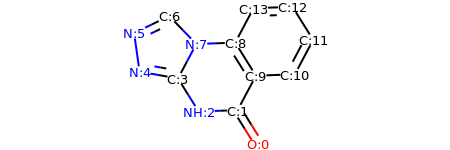

HETATM    1  O1  UNL     1       1.262  -3.157   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.467  -1.886   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.032  -1.939   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.828  -0.667   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -3.305  -0.407   0.000  1.00  0.00           N  
HETATM    6  N3  UNL     1      -3.515   1.078   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1      -2.167   1.736   0.000  1.00  0.00           C  
HETATM    8  N4  UNL     1      -1.124   0.658   0.000  1.00  0.00           N  
HETATM    9  C4  UNL     1       0.375   0.711   0.000  1.00  0.00           C  
HETATM   10  C5  UNL     1       1.170  -0.561   0.000  1.00  0.00           C  
HETATM   11  C6  UNL     1       2.669  -0.508   0.000  1.00  0.00           C  
HETATM   12  C7  UNL     1       3.373   0.817   0.000  1.00  0.00           C  
HETATM   13  C8  UNL     1  

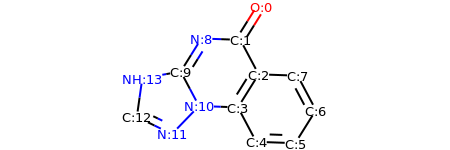

HETATM    1  O1  UNL     1       1.262   3.157   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.467   1.886   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.170   0.561   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.375  -0.711   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.078  -2.036   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.577  -2.089   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.373  -0.817   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.669   0.508   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -1.032   1.939   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -1.828   0.667   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -1.124  -0.658   0.000  1.00  0.00           N  
HETATM   12  N3  UNL     1      -2.167  -1.736   0.000  1.00  0.00           N  
HETATM   13  C9  UNL     1  

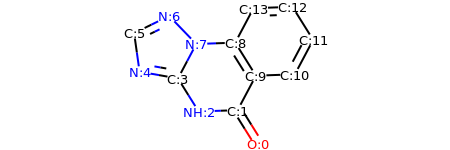

HETATM    1  O1  UNL     1       1.262  -3.157   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.467  -1.886   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.032  -1.939   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.828  -0.667   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -3.305  -0.407   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -3.515   1.078   0.000  1.00  0.00           C  
HETATM    7  N3  UNL     1      -2.167   1.736   0.000  1.00  0.00           N  
HETATM    8  N4  UNL     1      -1.124   0.658   0.000  1.00  0.00           N  
HETATM    9  C4  UNL     1       0.375   0.711   0.000  1.00  0.00           C  
HETATM   10  C5  UNL     1       1.170  -0.561   0.000  1.00  0.00           C  
HETATM   11  C6  UNL     1       2.669  -0.508   0.000  1.00  0.00           C  
HETATM   12  C7  UNL     1       3.373   0.817   0.000  1.00  0.00           C  
HETATM   13  C8  UNL     1  

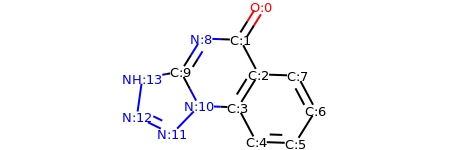

HETATM    1  O1  UNL     1       1.262   3.157   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.467   1.886   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.170   0.561   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.375  -0.711   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.078  -2.036   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.577  -2.089   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.373  -0.817   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.669   0.508   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -1.032   1.939   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -1.828   0.667   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -1.124  -0.658   0.000  1.00  0.00           N  
HETATM   12  N3  UNL     1      -2.167  -1.736   0.000  1.00  0.00           N  
HETATM   13  N4  UNL     1  

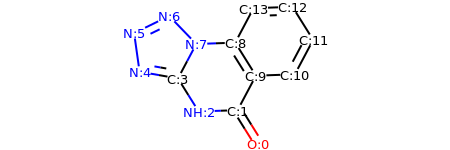

HETATM    1  O1  UNL     1       1.262  -3.157   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.467  -1.886   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.032  -1.939   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.828  -0.667   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -3.305  -0.407   0.000  1.00  0.00           N  
HETATM    6  N3  UNL     1      -3.515   1.078   0.000  1.00  0.00           N  
HETATM    7  N4  UNL     1      -2.167   1.736   0.000  1.00  0.00           N  
HETATM    8  N5  UNL     1      -1.124   0.658   0.000  1.00  0.00           N  
HETATM    9  C3  UNL     1       0.375   0.711   0.000  1.00  0.00           C  
HETATM   10  C4  UNL     1       1.170  -0.561   0.000  1.00  0.00           C  
HETATM   11  C5  UNL     1       2.669  -0.508   0.000  1.00  0.00           C  
HETATM   12  C6  UNL     1       3.373   0.817   0.000  1.00  0.00           C  
HETATM   13  C7  UNL     1  

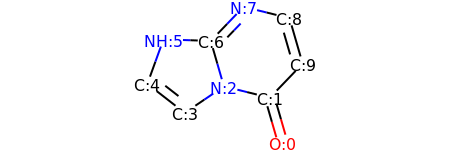

HETATM    1  O1  UNL     1       1.620  -2.342   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.203  -0.901   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.253  -0.541   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.495  -1.383   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -2.679  -0.462   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -2.168   0.949   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1      -0.669   0.900   0.000  1.00  0.00           C  
HETATM    8  N3  UNL     1       0.371   1.981   0.000  1.00  0.00           N  
HETATM    9  C5  UNL     1       1.827   1.621   0.000  1.00  0.00           C  
HETATM   10  C6  UNL     1       2.243   0.180   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   10
CONECT    3    4    7
CONECT    4    5    5
CONECT    5    6
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
CONECT    9   10   10
END

se

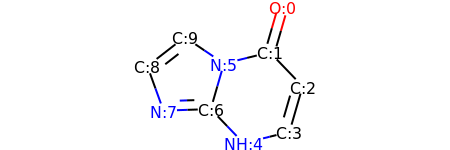

HETATM    1  O1  UNL     1       1.620   2.342   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.203   0.901   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.243  -0.180   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.827  -1.621   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.371  -1.981   0.000  1.00  0.00           N  
HETATM    6  N2  UNL     1      -0.253   0.541   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1      -0.669  -0.900   0.000  1.00  0.00           C  
HETATM    8  N3  UNL     1      -2.168  -0.949   0.000  1.00  0.00           N  
HETATM    9  C5  UNL     1      -2.679   0.462   0.000  1.00  0.00           C  
HETATM   10  C6  UNL     1      -1.495   1.383   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    7
CONECT    6    7   10
CONECT    7    8    8
CONECT    8    9
CONECT    9   10   10
END

##

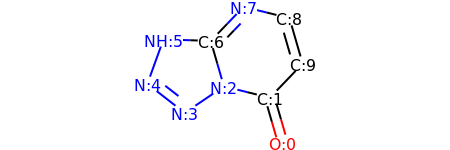

HETATM    1  O1  UNL     1       1.620  -2.342   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.203  -0.901   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.253  -0.541   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -1.495  -1.383   0.000  1.00  0.00           N  
HETATM    5  N3  UNL     1      -2.679  -0.462   0.000  1.00  0.00           N  
HETATM    6  N4  UNL     1      -2.168   0.949   0.000  1.00  0.00           N  
HETATM    7  C2  UNL     1      -0.669   0.900   0.000  1.00  0.00           C  
HETATM    8  N5  UNL     1       0.371   1.981   0.000  1.00  0.00           N  
HETATM    9  C3  UNL     1       1.827   1.621   0.000  1.00  0.00           C  
HETATM   10  C4  UNL     1       2.243   0.180   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   10
CONECT    3    4    7
CONECT    4    5    5
CONECT    5    6
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
CONECT    9   10   10
END

se

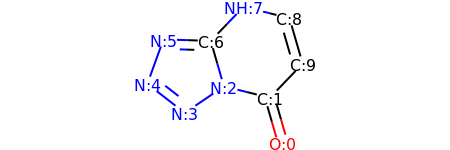

HETATM    1  O1  UNL     1       1.620  -2.342   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.203  -0.901   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.253  -0.541   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -1.495  -1.383   0.000  1.00  0.00           N  
HETATM    5  N3  UNL     1      -2.679  -0.462   0.000  1.00  0.00           N  
HETATM    6  N4  UNL     1      -2.168   0.949   0.000  1.00  0.00           N  
HETATM    7  C2  UNL     1      -0.669   0.900   0.000  1.00  0.00           C  
HETATM    8  N5  UNL     1       0.371   1.981   0.000  1.00  0.00           N  
HETATM    9  C3  UNL     1       1.827   1.621   0.000  1.00  0.00           C  
HETATM   10  C4  UNL     1       2.243   0.180   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   10
CONECT    3    4    7
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9
CONECT    9   10   10
END

##

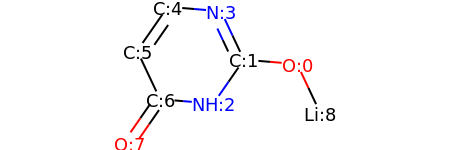

HETATM    1  O1  UNL     1       2.444   0.231   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.949   0.355   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.094  -0.877   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1       0.310   1.712   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -1.185   1.837   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1      -2.040   0.604   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1      -1.401  -0.752   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1      -2.256  -1.985   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1       3.084  -1.126   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    4    4
CONECT    3    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...
found primary alcohol


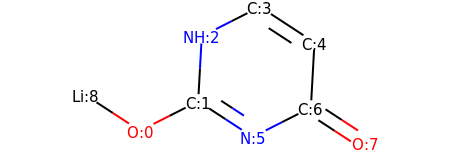

HETATM    1  O1  UNL     1      -2.221  -0.963   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.883  -0.285   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.801   1.213   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.538   1.890   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.794   1.070   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1       0.373  -1.106   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.711  -0.428   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1       2.967  -1.248   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.477  -0.142   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


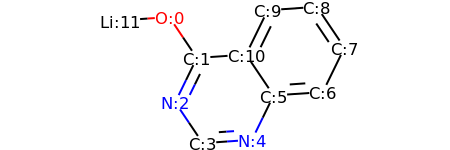

HETATM    1  O1  UNL     1      -2.170   1.477   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.332   0.233   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.990  -1.115   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.152  -2.359   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       0.344  -2.255   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       1.003  -0.907   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       2.499  -0.803   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.157   0.544   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.319   1.789   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       0.823   1.685   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       0.165   0.337   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -3.666   1.373   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

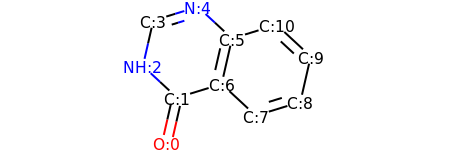

HETATM    1  O1  UNL     1      -1.758  -2.396   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.424  -0.934   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.524   0.086   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -2.191   1.549   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -0.757   1.991   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       0.343   0.971   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.009  -0.492   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       1.109  -1.512   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.542  -1.069   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       2.876   0.393   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       1.776   1.413   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT   

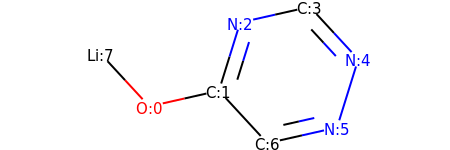

HETATM    1  O1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.159   1.129   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.305   1.459   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       2.322   0.357   0.000  1.00  0.00           N  
HETATM    6  N3  UNL     1       1.876  -1.075   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1       0.413  -1.405   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


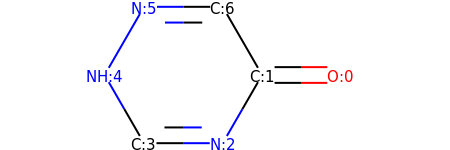

HETATM    1  O1  UNL     1       2.571   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.321  -1.299   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.179  -1.299   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.929   0.000   0.000  1.00  0.00           N  
HETATM    6  N3  UNL     1      -1.179   1.299   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4    4
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found primary alcohol


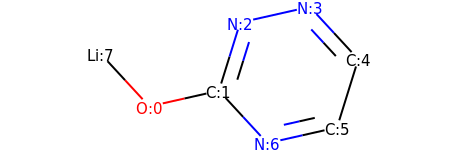

HETATM    1  O1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.159   1.129   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1       1.305   1.459   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       2.322   0.357   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.876  -1.075   0.000  1.00  0.00           C  
HETATM    7  N3  UNL     1       0.413  -1.405   0.000  1.00  0.00           N  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


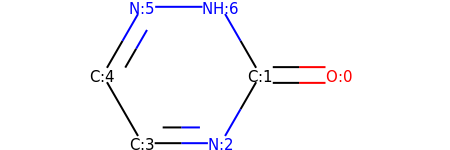

HETATM    1  O1  UNL     1       2.571   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.321  -1.299   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.179  -1.299   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.929   0.000   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -1.179   1.299   0.000  1.00  0.00           N  
HETATM    7  N3  UNL     1       0.321   1.299   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4    4
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
END

#################
#################
search for patterns ...
found primary alcohol


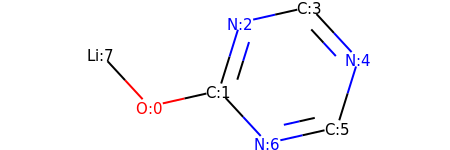

HETATM    1  O1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.159   1.129   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.305   1.459   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       2.322   0.357   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       1.876  -1.075   0.000  1.00  0.00           C  
HETATM    7  N3  UNL     1       0.413  -1.405   0.000  1.00  0.00           N  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


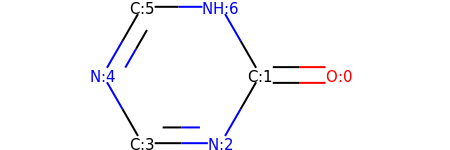

HETATM    1  O1  UNL     1       2.571   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.321  -1.299   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.179  -1.299   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.929   0.000   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -1.179   1.299   0.000  1.00  0.00           C  
HETATM    7  N3  UNL     1       0.321   1.299   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4    4
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
END

#################
#################
search for patterns ...
found primary alcohol


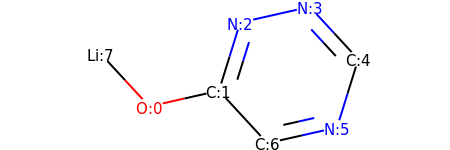

HETATM    1  O1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.159   1.129   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1       1.305   1.459   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       2.322   0.357   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1       1.876  -1.075   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1       0.413  -1.405   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


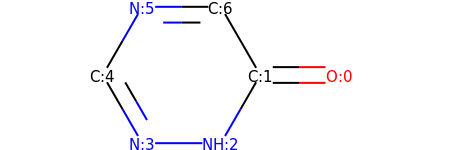

HETATM    1  O1  UNL     1       2.571   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.321  -1.299   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -1.179  -1.299   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -1.929   0.000   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -1.179   1.299   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found primary alcohol


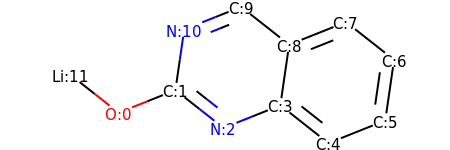

HETATM    1  O1  UNL     1      -3.295  -0.849   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.902  -0.293   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.724  -1.221   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.669  -0.665   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.847  -1.594   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       3.240  -1.038   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.456   0.446   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.278   1.375   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.884   0.819   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -0.294   1.748   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -1.687   1.192   0.000  1.00  0.00           N  
HETATM   12 LI1  UNL     1      -4.473   0.080   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

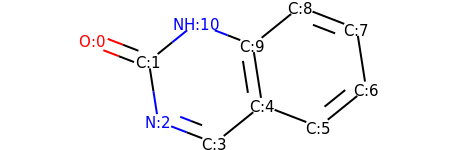

HETATM    1  O1  UNL     1      -3.711   0.800   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.312   0.259   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.080  -1.223   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.680  -1.763   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.487  -0.821   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.886  -1.361   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.054  -0.419   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.822   1.063   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.423   1.603   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.255   0.661   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -1.144   1.201   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4    4
CONECT    4    5
CONECT    5    6   10   10

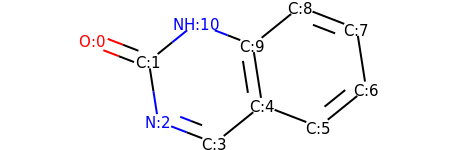

HETATM    1  O1  UNL     1      -3.711   0.800   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.312   0.259   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.080  -1.223   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.680  -1.763   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.487  -0.821   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.886  -1.361   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.054  -0.419   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.822   1.063   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.423   1.603   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.255   0.661   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -1.144   1.201   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4    4
CONECT    4    5
CONECT    5    6   10   10

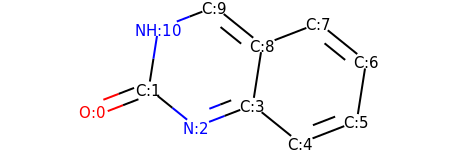

HETATM    1  O1  UNL     1      -3.711  -0.800   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.312  -0.259   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.144  -1.201   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.255  -0.661   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.423  -1.603   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.822  -1.063   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.054   0.419   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.886   1.361   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.487   0.821   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -0.680   1.763   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -2.080   1.223   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4    4
CONECT    4    5    9
CONECT    5    6    6

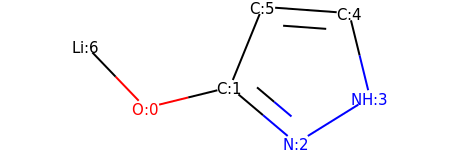

HETATM    1  O1  UNL     1      -1.777  -0.628   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.320  -0.270   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.826  -1.238   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1       2.100  -0.447   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       1.742   1.010   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       0.246   1.119   0.000  1.00  0.00           C  
HETATM    7 LI1  UNL     1      -2.816   0.454   0.000  1.00  0.00          LI  
CONECT    1    2    7
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6    6
END

search for patterns ...


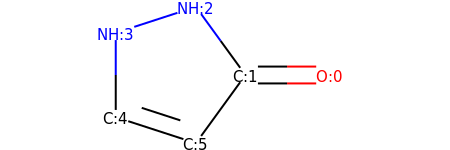

HETATM    1  O1  UNL     1       2.313  -0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.813  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.068   1.214   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -1.495   0.750   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -1.495  -0.750   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1      -0.068  -1.214   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6    6
END

#################
#################
search for patterns ...
found primary alcohol


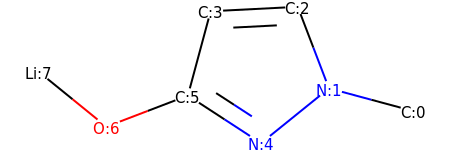

HETATM    1  C1  UNL     1       3.139  -0.502   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       1.691  -0.112   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       1.155   1.289   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.343   1.213   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       0.524  -1.054   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -0.733  -0.236   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1      -2.134  -0.771   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1      -3.299   0.174   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    5
CONECT    3    4    4
CONECT    4    6
CONECT    5    6    6
CONECT    6    7
CONECT    7    8
END

search for patterns ...


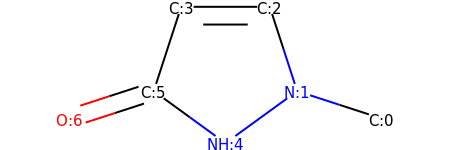

HETATM    1  C1  UNL     1       2.640  -0.613   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       1.214  -0.149   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       0.750   1.277   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.750   1.277   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -0.000  -1.031   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -1.214  -0.149   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1      -2.640  -0.613   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    5
CONECT    3    4    4
CONECT    4    6
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found primary alcohol


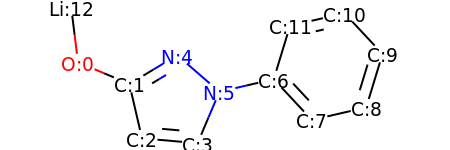

HETATM    1  O1  UNL     1      -4.071   0.356   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.690  -0.229   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.352  -1.690   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.857  -1.820   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -1.405   0.545   0.000  1.00  0.00           N  
HETATM    6  N2  UNL     1      -0.272  -0.439   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.189  -0.100   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       2.213  -1.196   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.674  -0.858   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       4.112   0.577   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       3.088   1.673   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       1.627   1.335   0.000  1.00  0.00           C  
HETATM   13 LI1  UNL     1  

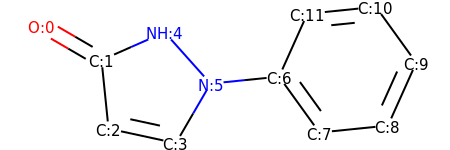

HETATM    1  O1  UNL     1      -4.326   1.063   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -3.030   0.309   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.878  -1.183   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.412  -1.500   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -1.658   0.915   0.000  1.00  0.00           N  
HETATM    6  N2  UNL     1      -0.658  -0.204   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       0.835  -0.052   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       1.712  -1.268   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.205  -1.117   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.819   0.252   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       2.942   1.468   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       1.449   1.316   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT

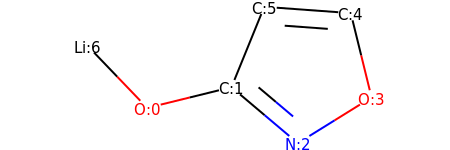

HETATM    1  O1  UNL     1      -1.777  -0.628   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.320  -0.270   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.826  -1.238   0.000  1.00  0.00           N  
HETATM    4  O2  UNL     1       2.100  -0.447   0.000  1.00  0.00           O  
HETATM    5  C2  UNL     1       1.742   1.010   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       0.246   1.119   0.000  1.00  0.00           C  
HETATM    7 LI1  UNL     1      -2.816   0.454   0.000  1.00  0.00          LI  
CONECT    1    2    7
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6    6
END

search for patterns ...


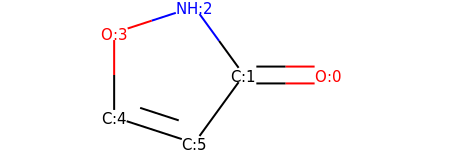

HETATM    1  O1  UNL     1       2.313  -0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.813  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.068   1.214   0.000  1.00  0.00           N  
HETATM    4  O2  UNL     1      -1.495   0.750   0.000  1.00  0.00           O  
HETATM    5  C2  UNL     1      -1.495  -0.750   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1      -0.068  -1.214   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6    6
END

#################
#################
search for patterns ...
found primary alcohol


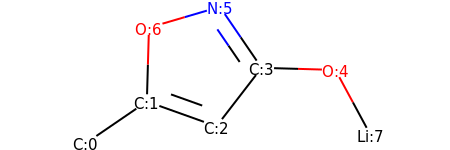

HETATM    1  C1  UNL     1      -2.788  -1.186   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.550  -0.339   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.137  -0.844   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.779   0.344   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1       2.279   0.301   0.000  1.00  0.00           O  
HETATM    6  N1  UNL     1      -0.067   1.582   0.000  1.00  0.00           N  
HETATM    7  O2  UNL     1      -1.507   1.160   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1       2.991  -1.019   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    6    6
CONECT    5    8
CONECT    6    7
END

search for patterns ...


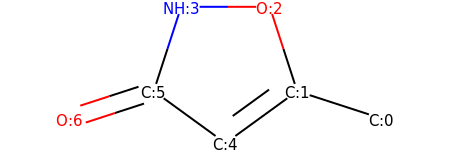

HETATM    1  C1  UNL     1       2.640  -0.613   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.214  -0.149   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       0.750   1.277   0.000  1.00  0.00           O  
HETATM    4  N1  UNL     1      -0.750   1.277   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -0.000  -1.031   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -1.214  -0.149   0.000  1.00  0.00           C  
HETATM    7  O2  UNL     1      -2.640  -0.613   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    5    5
CONECT    3    4
CONECT    4    6
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found primary alcohol


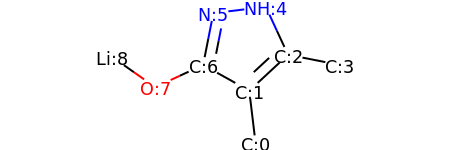

HETATM    1  C1  UNL     1       0.688  -2.227   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       0.509  -0.738   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       1.609   0.282   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       3.080  -0.008   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.978   1.644   0.000  1.00  0.00           N  
HETATM    6  N2  UNL     1      -0.511   1.465   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1      -0.801  -0.007   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.162  -0.637   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.389   0.226   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    7
CONECT    3    4    5
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9
END

search for patterns ...


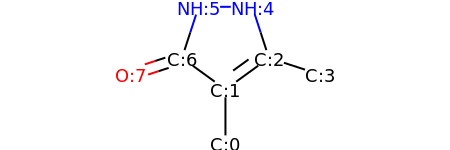

HETATM    1  C1  UNL     1       0.000  -2.215   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       0.000  -0.715   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       1.214   0.167   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       2.640  -0.296   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.750   1.594   0.000  1.00  0.00           N  
HETATM    6  N2  UNL     1      -0.750   1.594   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1      -1.214   0.167   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.640  -0.296   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    3    7
CONECT    3    4    5
CONECT    5    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


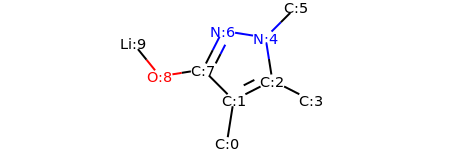

HETATM    1  C1  UNL     1      -0.192  -2.568   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       0.043  -1.086   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       1.379  -0.405   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       2.716  -1.086   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.145   1.077   0.000  1.00  0.00           N  
HETATM    6  C5  UNL     1       2.205   2.137   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1      -0.337   1.311   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1      -1.018  -0.025   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1      -2.499  -0.260   0.000  1.00  0.00           O  
HETATM   10 LI1  UNL     1      -3.443   0.905   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    8
CONECT    3    4    5
CONECT    5    6    7
CONECT    7    8    8
CONECT    8    9
CONECT    9   10
END

search for patterns ...


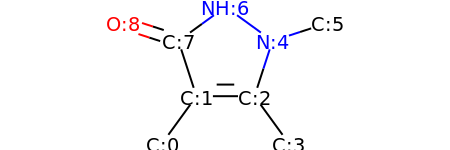

HETATM    1  C1  UNL     1      -1.632  -1.937   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.750  -0.724   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.750  -0.724   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       1.632  -1.937   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.214   0.703   0.000  1.00  0.00           N  
HETATM    6  C5  UNL     1       2.640   1.166   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1       0.000   1.584   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1      -1.214   0.703   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1      -2.640   1.166   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    3    8
CONECT    3    4    5
CONECT    5    6    7
CONECT    7    8
CONECT    8    9    9
END

#################
#################
search for patterns ...
found primary alcohol


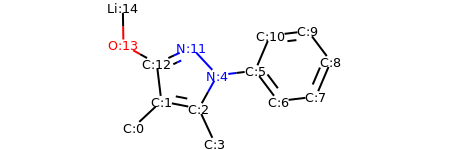

HETATM    1  C1  UNL     1      -3.348  -2.084   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.249  -1.062   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.777  -1.350   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.145  -2.710   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.049  -0.038   0.000  1.00  0.00           N  
HETATM    6  C5  UNL     1       1.440   0.143   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.342  -1.056   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.831  -0.875   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       4.418   0.505   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       3.517   1.704   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       2.028   1.523   0.000  1.00  0.00           C  
HETATM   12  N2  UNL     1      -1.070   1.060   0.000  1.00  0.00           N  
HETATM   13  C11 UNL     1  

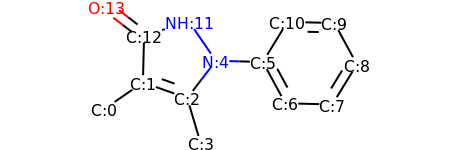

HETATM    1  C1  UNL     1      -3.854  -1.345   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.619  -0.495   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -1.204  -0.995   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.777  -2.433   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.292   0.196   0.000  1.00  0.00           N  
HETATM    6  C5  UNL     1       1.207   0.158   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.924  -1.160   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.424  -1.198   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       4.206   0.082   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       3.490   1.399   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       1.990   1.437   0.000  1.00  0.00           C  
HETATM   12  N2  UNL     1      -1.143   1.432   0.000  1.00  0.00           N  
HETATM   13  C11 UNL     1  

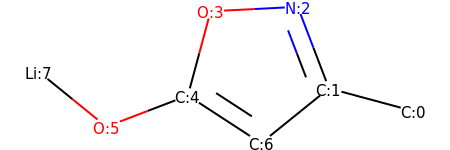

HETATM    1  C1  UNL     1       3.139  -0.502   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.691  -0.112   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.155   1.289   0.000  1.00  0.00           N  
HETATM    4  O1  UNL     1      -0.343   1.213   0.000  1.00  0.00           O  
HETATM    5  C3  UNL     1      -0.733  -0.236   0.000  1.00  0.00           C  
HETATM    6  O2  UNL     1      -2.134  -0.771   0.000  1.00  0.00           O  
HETATM    7  C4  UNL     1       0.524  -1.054   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.299   0.174   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5
CONECT    5    6    7    7
CONECT    6    8
END

search for patterns ...


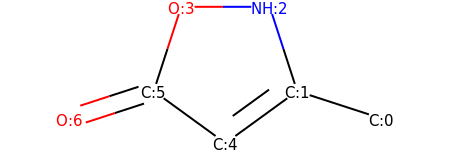

HETATM    1  C1  UNL     1       2.640  -0.613   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.214  -0.149   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.750   1.277   0.000  1.00  0.00           N  
HETATM    4  O1  UNL     1      -0.750   1.277   0.000  1.00  0.00           O  
HETATM    5  C3  UNL     1      -0.000  -1.031   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -1.214  -0.149   0.000  1.00  0.00           C  
HETATM    7  O2  UNL     1      -2.640  -0.613   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    5    5
CONECT    3    4
CONECT    4    6
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...


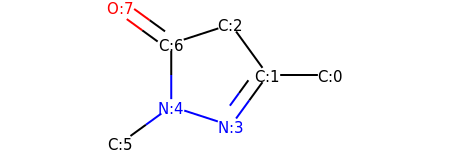

HETATM    1  C1  UNL     1       2.990  -0.000   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.490  -0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.609   1.214   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       0.609  -1.214   0.000  1.00  0.00           N  
HETATM    5  N2  UNL     1      -0.818  -0.750   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -2.031  -1.632   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -0.818   0.750   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.031   1.632   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    4    4
CONECT    3    7
CONECT    4    5
CONECT    5    6    7
CONECT    7    8    8
END

search for patterns ...


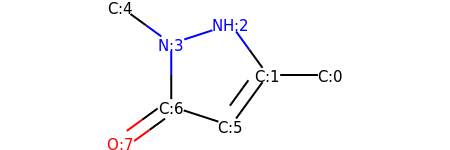

HETATM    1  C1  UNL     1       2.990  -0.000   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.490  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.609   1.214   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.818   0.750   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -2.031   1.632   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.609  -1.214   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -0.818  -0.750   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.031  -1.632   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...


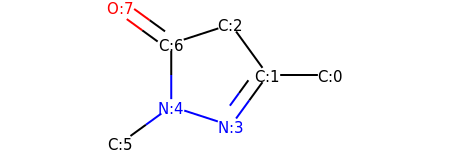

HETATM    1  C1  UNL     1       2.990  -0.000   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.490  -0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.609   1.214   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       0.609  -1.214   0.000  1.00  0.00           N  
HETATM    5  N2  UNL     1      -0.818  -0.750   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -2.031  -1.632   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -0.818   0.750   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.031   1.632   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    4    4
CONECT    3    7
CONECT    4    5
CONECT    5    6    7
CONECT    7    8    8
END

search for patterns ...
found primary alcohol


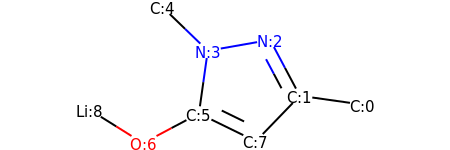

HETATM    1  C1  UNL     1       3.351  -0.358   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.866  -0.149   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.162   1.176   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.315   0.916   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -1.393   1.959   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -0.524  -0.569   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1      -1.849  -1.272   0.000  1.00  0.00           O  
HETATM    8  C5  UNL     1       0.823  -1.227   0.000  1.00  0.00           C  
HETATM    9 LI1  UNL     1      -3.121  -0.477   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    6
CONECT    6    7    8    8
CONECT    7    9
END

#################
#################
search for patterns ...


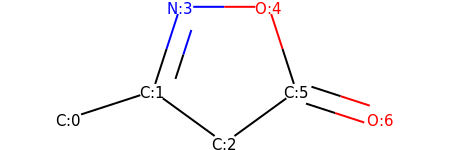

HETATM    1  C1  UNL     1      -2.640  -0.613   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.214  -0.149   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.000  -1.031   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -0.750   1.277   0.000  1.00  0.00           N  
HETATM    5  O1  UNL     1       0.750   1.277   0.000  1.00  0.00           O  
HETATM    6  C4  UNL     1       1.214  -0.149   0.000  1.00  0.00           C  
HETATM    7  O2  UNL     1       2.640  -0.613   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    4    4
CONECT    3    6
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...
found primary alcohol


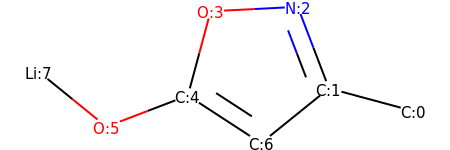

HETATM    1  C1  UNL     1       3.139  -0.502   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.691  -0.112   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.155   1.289   0.000  1.00  0.00           N  
HETATM    4  O1  UNL     1      -0.343   1.213   0.000  1.00  0.00           O  
HETATM    5  C3  UNL     1      -0.733  -0.236   0.000  1.00  0.00           C  
HETATM    6  O2  UNL     1      -2.134  -0.771   0.000  1.00  0.00           O  
HETATM    7  C4  UNL     1       0.524  -1.054   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.299   0.174   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5
CONECT    5    6    7    7
CONECT    6    8
END

#################
#################
search for patterns ...
found primary alcohol
found secondary amine


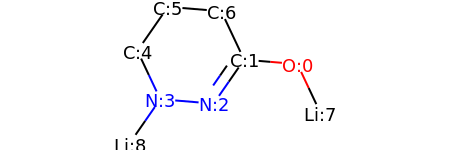

HETATM    1  O1  UNL     1       2.444   0.231   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.949   0.355   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.094  -0.877   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -1.401  -0.752   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -2.040   0.604   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1      -1.185   1.837   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.310   1.712   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1       3.084  -1.126   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1      -2.256  -1.985   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    9
CONECT    5    6
CONECT    6    7
END

search for patterns ...
found secondary amine


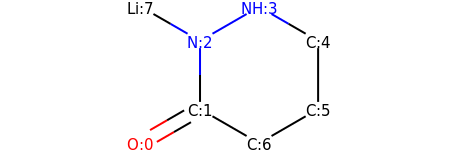

HETATM    1  O1  UNL     1      -1.949  -1.500   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.650  -0.750   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.650   0.750   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1       0.650   1.500   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       1.949   0.750   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.949  -0.750   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.650  -1.500   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -1.949   1.500   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4    8
CONECT    4    5
CONECT    5    6
CONECT    6    7
END

#################
#################
search for patterns ...
found primary alcohol


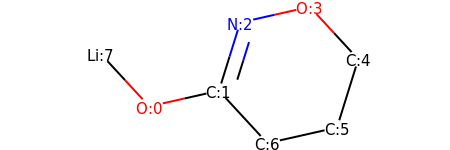

HETATM    1  O1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.159   1.129   0.000  1.00  0.00           N  
HETATM    4  O2  UNL     1       1.305   1.459   0.000  1.00  0.00           O  
HETATM    5  C2  UNL     1       2.322   0.357   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.876  -1.075   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.413  -1.405   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5
CONECT    5    6
CONECT    6    7
END

search for patterns ...
found secondary amine


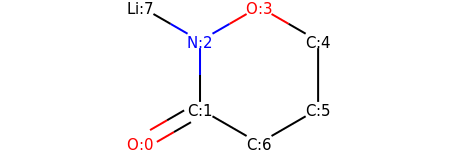

HETATM    1  O1  UNL     1      -1.949  -1.500   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.650  -0.750   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.650   0.750   0.000  1.00  0.00           N  
HETATM    4  O2  UNL     1       0.650   1.500   0.000  1.00  0.00           O  
HETATM    5  C2  UNL     1       1.949   0.750   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.949  -0.750   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.650  -1.500   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -1.949   1.500   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4    8
CONECT    4    5
CONECT    5    6
CONECT    6    7
END

#################
#################
search for patterns ...
found primary alcohol
found secondary amine


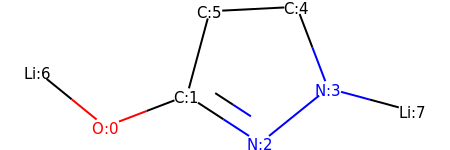

HETATM    1  O1  UNL     1      -2.134  -0.771   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.733  -0.236   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.524  -1.054   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1       1.691  -0.112   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       1.155   1.289   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1      -0.343   1.213   0.000  1.00  0.00           C  
HETATM    7 LI1  UNL     1      -3.299   0.174   0.000  1.00  0.00          LI  
HETATM    8 LI2  UNL     1       3.139  -0.502   0.000  1.00  0.00          LI  
CONECT    1    2    7
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5    8
CONECT    5    6
END

search for patterns ...
found secondary amine


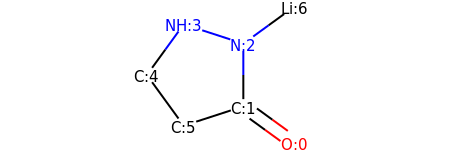

HETATM    1  O1  UNL     1       1.604  -1.632   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.391  -0.750   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.391   0.750   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -1.036   1.214   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -1.918   0.000   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1      -1.036  -1.214   0.000  1.00  0.00           C  
HETATM    7 LI1  UNL     1       1.604   1.632   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    7
CONECT    4    5
CONECT    5    6
END

#################
#################
search for patterns ...
found primary alcohol


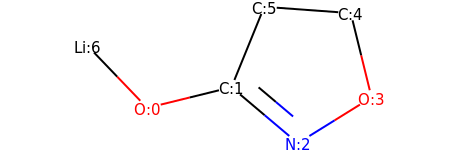

HETATM    1  O1  UNL     1      -1.777  -0.628   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.320  -0.270   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.826  -1.238   0.000  1.00  0.00           N  
HETATM    4  O2  UNL     1       2.100  -0.447   0.000  1.00  0.00           O  
HETATM    5  C2  UNL     1       1.742   1.010   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       0.246   1.119   0.000  1.00  0.00           C  
HETATM    7 LI1  UNL     1      -2.816   0.454   0.000  1.00  0.00          LI  
CONECT    1    2    7
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6
END

search for patterns ...
found secondary amine


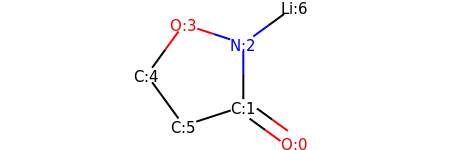

HETATM    1  O1  UNL     1       1.604  -1.632   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.391  -0.750   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.391   0.750   0.000  1.00  0.00           N  
HETATM    4  O2  UNL     1      -1.036   1.214   0.000  1.00  0.00           O  
HETATM    5  C2  UNL     1      -1.918   0.000   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1      -1.036  -1.214   0.000  1.00  0.00           C  
HETATM    7 LI1  UNL     1       1.604   1.632   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    7
CONECT    4    5
CONECT    5    6
END

#################
#################
search for patterns ...
found primary alcohol
found secondary amine


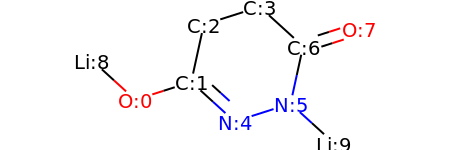

HETATM    1  O1  UNL     1      -2.683  -0.719   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.254  -0.263   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.934   1.202   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.495   1.658   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.145  -1.273   0.000  1.00  0.00           N  
HETATM    6  N2  UNL     1       1.284  -0.818   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.604   0.648   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1       3.033   1.103   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.792   0.291   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1       2.393  -1.828   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    5    5
CONECT    3    4
CONECT    4    7
CONECT    5    6
CONECT    6    7   10
CONECT    7    8    8
END

search for patterns ...
found secondary a

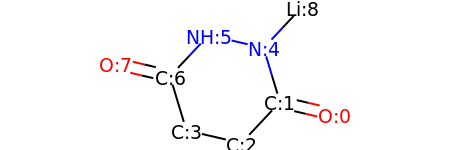

HETATM    1  O1  UNL     1       2.693  -0.926   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.233  -0.585   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.206  -1.679   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.254  -1.337   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.798   0.851   0.000  1.00  0.00           N  
HETATM    6  N2  UNL     1      -0.662   1.193   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1      -1.689   0.098   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1      -3.149   0.440   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1       1.824   1.945   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3    5
CONECT    3    4
CONECT    4    7
CONECT    5    6    9
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found thiol


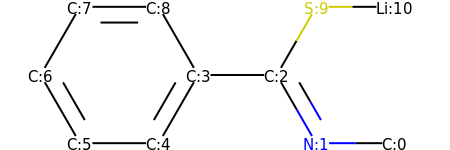

HETATM    1  C1  UNL     1       3.341  -1.299   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       1.841  -1.299   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       1.091   0.000   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.409  -0.000   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.159  -1.299   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -2.659  -1.299   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -3.409   0.000   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -2.659   1.299   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -1.159   1.299   0.000  1.00  0.00           C  
HETATM   10  S1  UNL     1       1.841   1.299   0.000  1.00  0.00           S  
HETATM   11 LI1  UNL     1       3.341   1.299   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3
CONECT    3    4   10
CONECT    4    5    5    9
CONECT    5    6
CONE

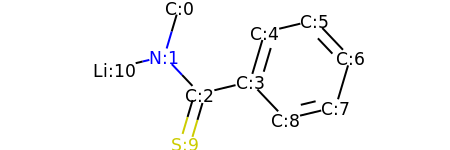

HETATM    1  C1  UNL     1      -1.783   1.879   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -2.209   0.441   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -1.177  -0.647   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.282  -0.297   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.708   1.141   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.166   1.492   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.199   0.403   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.773  -1.035   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       1.314  -1.385   0.000  1.00  0.00           C  
HETATM   10  S1  UNL     1      -1.603  -2.085   0.000  1.00  0.00           S  
HETATM   11 LI1  UNL     1      -3.668   0.091   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3   11
CONECT    3    4   10   10
CONECT    4    5    5    9
CONECT    5    6

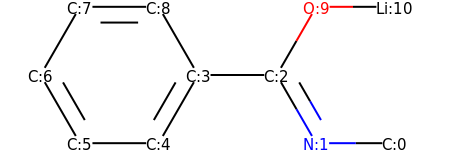

HETATM    1  C1  UNL     1       3.341  -1.299   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       1.841  -1.299   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       1.091   0.000   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.409  -0.000   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.159  -1.299   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -2.659  -1.299   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -3.409   0.000   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -2.659   1.299   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -1.159   1.299   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1       1.841   1.299   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1       3.341   1.299   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3
CONECT    3    4   10
CONECT    4    5    5    9
CONECT    5    6
CONE

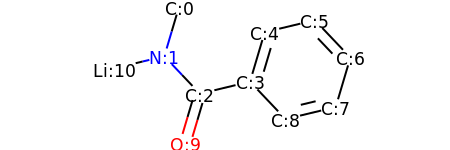

HETATM    1  C1  UNL     1      -1.783   1.879   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -2.209   0.441   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -1.177  -0.647   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.282  -0.297   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.708   1.141   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.166   1.492   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.199   0.403   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.773  -1.035   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       1.314  -1.385   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1      -1.603  -2.085   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1      -3.668   0.091   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3   11
CONECT    3    4   10   10
CONECT    4    5    5    9
CONECT    5    6

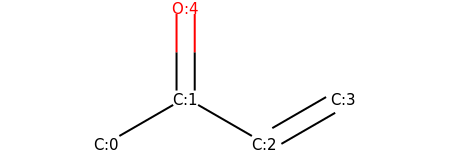

HETATM    1  C1  UNL     1      -1.819  -0.750   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.520   0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.779  -0.750   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       2.078  -0.000   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1      -0.520   1.500   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    5    5
CONECT    3    4    4
END

search for patterns ...
found primary alcohol


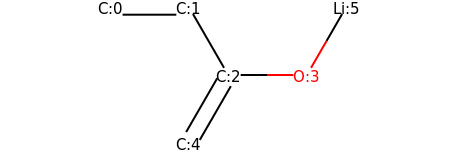

HETATM    1  C1  UNL     1      -2.250   0.866   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.750   0.866   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.000  -0.433   0.000  1.00  0.00           C  
HETATM    4  O1  UNL     1       1.500  -0.433   0.000  1.00  0.00           O  
HETATM    5  C4  UNL     1      -0.750  -1.732   0.000  1.00  0.00           C  
HETATM    6 LI1  UNL     1       2.250   0.866   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3
CONECT    3    4    5    5
CONECT    4    6
END

#################
#################
search for patterns ...


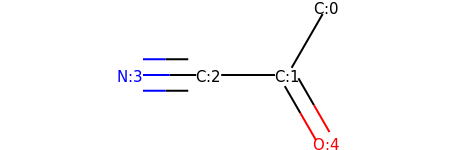

HETATM    1  C1  UNL     1       1.350   1.299   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       0.600   0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.900   0.000   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -2.400  -0.000   0.000  1.00  0.00           N  
HETATM    5  O1  UNL     1       1.350  -1.299   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    5    5
CONECT    3    4    4    4
END

search for patterns ...
found primary alcohol


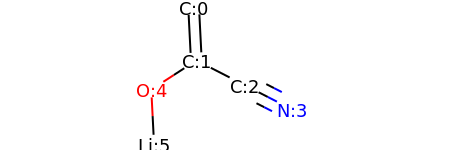

HETATM    1  C1  UNL     1      -0.324   2.111   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.248   0.613   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       1.087  -0.070   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       2.423  -0.753   0.000  1.00  0.00           N  
HETATM    5  O1  UNL     1      -1.507  -0.202   0.000  1.00  0.00           O  
HETATM    6 LI1  UNL     1      -1.431  -1.700   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3    5
CONECT    3    4    4    4
CONECT    5    6
END

#################
#################
search for patterns ...


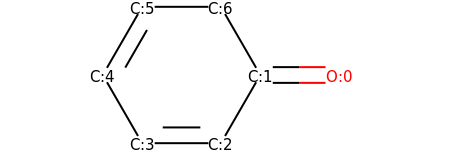

HETATM    1  O1  UNL     1       2.571   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.321  -1.299   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.179  -1.299   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.929   0.000   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.179   1.299   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4    4
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
END

search for patterns ...


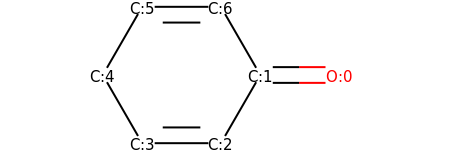

HETATM    1  O1  UNL     1       2.571   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.321  -1.299   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.179  -1.299   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.929   0.000   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.179   1.299   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4    4
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found primary alcohol


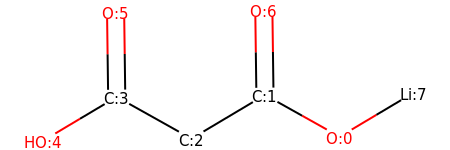

HETATM    1  O1  UNL     1       2.122  -0.816   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.813  -0.083   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.476  -0.850   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.785  -0.118   0.000  1.00  0.00           C  
HETATM    5  O2  UNL     1      -3.074  -0.885   0.000  1.00  0.00           O  
HETATM    6  O3  UNL     1      -1.805   1.382   0.000  1.00  0.00           O  
HETATM    7  O4  UNL     1       0.793   1.417   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1       3.411  -0.048   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    7    7
CONECT    3    4
CONECT    4    5    6    6
END

search for patterns ...
found primary alcohol


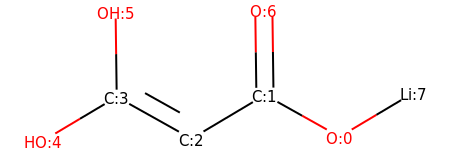

HETATM    1  O1  UNL     1       2.122  -0.816   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.813  -0.083   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.476  -0.850   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.785  -0.118   0.000  1.00  0.00           C  
HETATM    5  O2  UNL     1      -3.074  -0.885   0.000  1.00  0.00           O  
HETATM    6  O3  UNL     1      -1.805   1.382   0.000  1.00  0.00           O  
HETATM    7  O4  UNL     1       0.793   1.417   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1       3.411  -0.048   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    7    7
CONECT    3    4    4
CONECT    4    5    6
END

#################
#################
search for patterns ...
found primary alcohol


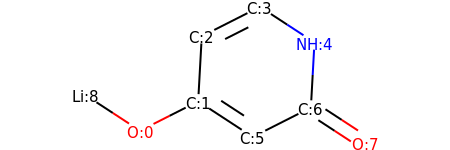

HETATM    1  O1  UNL     1      -2.221  -0.963   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.883  -0.285   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.801   1.213   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.538   1.890   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.794   1.070   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       0.373  -1.106   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.711  -0.428   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1       2.967  -1.248   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.477  -0.142   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    6    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...
found primary alcohol


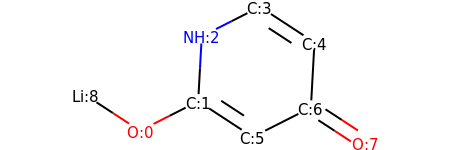

HETATM    1  O1  UNL     1      -2.221  -0.963   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.883  -0.285   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.801   1.213   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.538   1.890   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.794   1.070   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.373  -1.106   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.711  -0.428   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1       2.967  -1.248   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.477  -0.142   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...


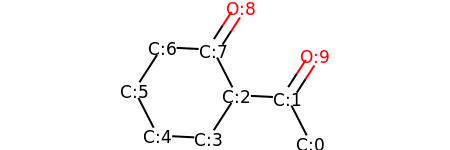

HETATM    1  C1  UNL     1       2.469  -1.684   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.785  -0.350   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.287  -0.274   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.527  -1.534   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -2.026  -1.459   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -2.710  -0.124   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -1.896   1.135   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1      -0.397   1.060   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       0.417   2.320   0.000  1.00  0.00           O  
HETATM   10  O2  UNL     1       2.599   0.910   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4    8
CONECT    4    5
CONECT    5    6
CONECT    6    7
CONECT    7    8
CONECT    8    9    9
END

search for patterns ...
found

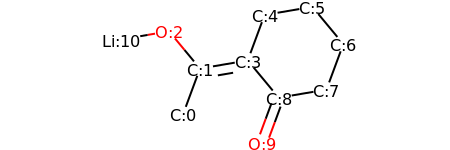

HETATM    1  C1  UNL     1      -1.952  -1.531   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.431  -0.124   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -2.389   1.030   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       0.047   0.128   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.568   1.535   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.047   1.787   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.005   0.632   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.484  -0.774   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       1.005  -1.027   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1       0.484  -2.433   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1      -3.868   0.778   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    4    4
CONECT    3   11
CONECT    4    5    9
CONECT    5    6
CONECT   

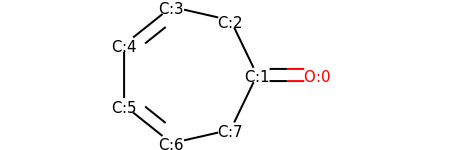

HETATM    1  O1  UNL     1       2.825  -0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.325  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.674   1.351   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.788   1.685   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.961   0.750   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.961  -0.750   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -0.788  -1.685   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.674  -1.351   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
END

search for patterns ...
found primary alcohol


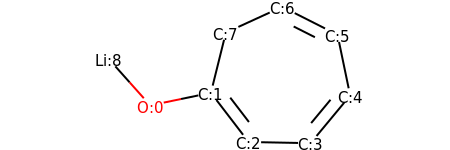

HETATM    1  O1  UNL     1      -2.347  -0.636   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.879  -0.330   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.034  -1.521   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.533  -1.550   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.491  -0.395   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.185   1.073   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.847   1.750   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -0.517   1.125   0.000  1.00  0.00           C  
HETATM    9 LI1  UNL     1      -3.346   0.483   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
END

#################
#################
search for patterns ...


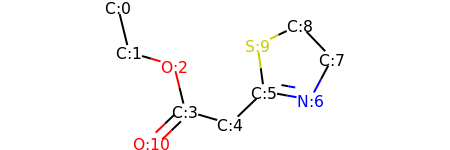

HETATM    1  C1  UNL     1      -3.363   2.174   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -3.005   0.717   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -1.564   0.300   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -1.205  -1.157   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.235  -1.575   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.317  -0.536   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1       2.794  -0.801   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       3.502   0.521   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.463   1.603   0.000  1.00  0.00           C  
HETATM   10  S1  UNL     1       1.113   0.950   0.000  1.00  0.00           S  
HETATM   11  O2  UNL     1      -2.288  -2.196   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3
CONECT    3    4
CONECT    4    5   11   11
CONECT    5    6
CONECT    6   

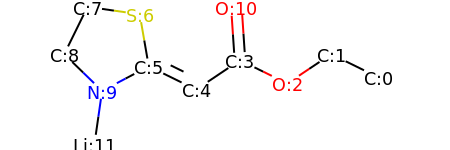

HETATM    1  C1  UNL     1       5.296  -0.428   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       3.950   0.233   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       2.704  -0.601   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       1.357   0.060   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.111  -0.775   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.235  -0.113   0.000  1.00  0.00           C  
HETATM    7  S1  UNL     1      -1.491   1.365   0.000  1.00  0.00           S  
HETATM    8  C6  UNL     1      -2.976   1.579   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -3.637   0.233   0.000  1.00  0.00           C  
HETATM   10  N1  UNL     1      -2.562  -0.813   0.000  1.00  0.00           N  
HETATM   11  O2  UNL     1       1.257   1.557   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1      -2.775  -2.298   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

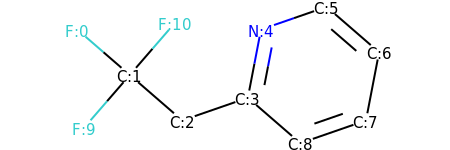

HETATM    1  F1  UNL     1      -3.299   0.982   0.000  1.00  0.00           F  
HETATM    2  C1  UNL     1      -2.165  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.031  -0.982   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.387  -0.491   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.670   0.982   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       2.087   1.473   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.221   0.491   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.938  -0.982   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.520  -1.473   0.000  1.00  0.00           C  
HETATM   10  F2  UNL     1      -3.147  -1.134   0.000  1.00  0.00           F  
HETATM   11  F3  UNL     1      -1.183   1.134   0.000  1.00  0.00           F  
CONECT    1    2
CONECT    2    3   10   11
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6
CONE

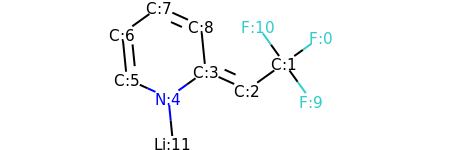

HETATM    1  F1  UNL     1       3.499   0.914   0.000  1.00  0.00           F  
HETATM    2  C1  UNL     1       2.281   0.039   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.062  -0.836   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.305  -0.219   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -1.523  -1.094   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -2.890  -0.477   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -3.039   1.016   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -1.820   1.891   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -0.453   1.274   0.000  1.00  0.00           C  
HETATM   10  F2  UNL     1       3.156  -1.179   0.000  1.00  0.00           F  
HETATM   11  F3  UNL     1       1.406   1.257   0.000  1.00  0.00           F  
HETATM   12 LI1  UNL     1      -1.374  -2.587   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

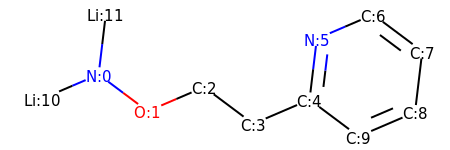

HETATM    1  N1  UNL     1      -3.799   0.138   0.000  1.00  0.00           N  
HETATM    2  O1  UNL     1      -2.598  -0.760   0.000  1.00  0.00           O  
HETATM    3  C1  UNL     1      -1.219  -0.169   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1      -0.018  -1.068   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.360  -0.477   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1       1.538   1.013   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       2.917   1.604   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       4.118   0.705   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.940  -0.784   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       2.562  -1.375   0.000  1.00  0.00           C  
HETATM   11 LI1  UNL     1      -5.178  -0.453   0.000  1.00  0.00          LI  
HETATM   12 LI2  UNL     1      -3.622   1.628   0.000  1.00  0.00          LI  
CONECT    1    2   11   12
C

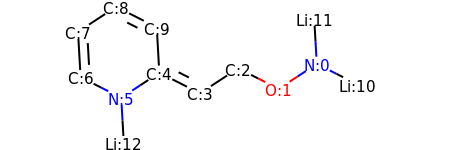

HETATM    1  N1  UNL     1       3.997   0.110   0.000  1.00  0.00           N  
HETATM    2  O1  UNL     1       2.742  -0.712   0.000  1.00  0.00           O  
HETATM    3  C1  UNL     1       1.403  -0.036   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1       0.148  -0.858   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.191  -0.183   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -2.445  -1.005   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1      -3.785  -0.329   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1      -3.869   1.169   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1      -2.614   1.991   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1      -1.275   1.315   0.000  1.00  0.00           C  
HETATM   11 LI1  UNL     1       5.336  -0.566   0.000  1.00  0.00          LI  
HETATM   12 LI2  UNL     1       3.913   1.607   0.000  1.00  0.00          LI  
HETATM   13 LI3  UNL     1  

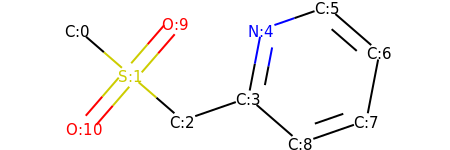

HETATM    1  C1  UNL     1      -3.299   0.982   0.000  1.00  0.00           C  
HETATM    2  S1  UNL     1      -2.165  -0.000   0.000  1.00  0.00           S  
HETATM    3  C2  UNL     1      -1.031  -0.982   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.387  -0.491   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.670   0.982   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       2.087   1.473   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.221   0.491   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.938  -0.982   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.520  -1.473   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1      -1.183   1.134   0.000  1.00  0.00           O  
HETATM   11  O2  UNL     1      -3.147  -1.134   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3   10   10   11
CONECT    2   11
CONECT    3    4
CONECT    4    5    5    9

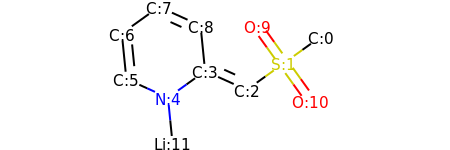

HETATM    1  C1  UNL     1       3.499   0.914   0.000  1.00  0.00           C  
HETATM    2  S1  UNL     1       2.281   0.039   0.000  1.00  0.00           S  
HETATM    3  C2  UNL     1       1.062  -0.836   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.305  -0.219   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -1.523  -1.094   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -2.890  -0.477   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -3.039   1.016   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -1.820   1.891   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -0.453   1.274   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1       1.406   1.257   0.000  1.00  0.00           O  
HETATM   11  O2  UNL     1       3.156  -1.179   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1      -1.374  -2.587   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

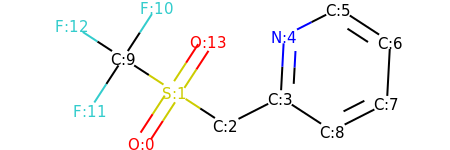

HETATM    1  O1  UNL     1      -2.144  -1.723   0.000  1.00  0.00           O  
HETATM    2  S1  UNL     1      -1.326  -0.466   0.000  1.00  0.00           S  
HETATM    3  C1  UNL     1      -0.069  -1.284   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1       1.269  -0.604   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.349   0.894   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       2.686   1.573   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       3.943   0.755   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.863  -0.743   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.526  -1.423   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1      -2.583   0.353   0.000  1.00  0.00           C  
HETATM   11  F1  UNL     1      -1.765   1.610   0.000  1.00  0.00           F  
HETATM   12  F2  UNL     1      -3.401  -0.904   0.000  1.00  0.00           F  
HETATM   13  F3  UNL     1  

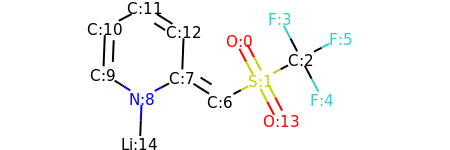

HETATM    1  O1  UNL     1       0.759   0.920   0.000  1.00  0.00           O  
HETATM    2  S1  UNL     1       1.457  -0.408   0.000  1.00  0.00           S  
HETATM    3  C1  UNL     1       2.785   0.289   0.000  1.00  0.00           C  
HETATM    4  F1  UNL     1       2.087   1.617   0.000  1.00  0.00           F  
HETATM    5  F2  UNL     1       3.483  -1.038   0.000  1.00  0.00           F  
HETATM    6  F3  UNL     1       4.113   0.987   0.000  1.00  0.00           F  
HETATM    7  C2  UNL     1       0.129  -1.106   0.000  1.00  0.00           C  
HETATM    8  C3  UNL     1      -1.139  -0.305   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -2.467  -1.003   0.000  1.00  0.00           N  
HETATM   10  C4  UNL     1      -3.735  -0.202   0.000  1.00  0.00           C  
HETATM   11  C5  UNL     1      -3.675   1.297   0.000  1.00  0.00           C  
HETATM   12  C6  UNL     1      -2.347   1.995   0.000  1.00  0.00           C  
HETATM   13  C7  UNL     1  

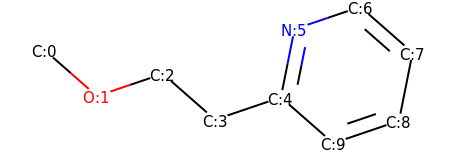

HETATM    1  C1  UNL     1      -4.645   0.620   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -3.518  -0.370   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -2.097   0.112   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.970  -0.877   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.451  -0.396   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       0.744   1.075   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1       2.165   1.557   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.292   0.567   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.999  -0.904   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.578  -1.385   0.000  1.00  0.00           C  
CONECT    1    2
CONECT    2    3
CONECT    3    4
CONECT    4    5
CONECT    5    6    6   10
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
CONECT    9   10   10
END

search for p

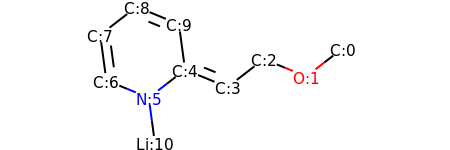

HETATM    1  C1  UNL     1       4.807   0.580   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1       3.620  -0.337   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1       2.233   0.233   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.046  -0.684   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.342  -0.115   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1      -1.529  -1.032   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1      -2.917  -0.462   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -3.117   1.024   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -1.930   1.941   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -0.543   1.372   0.000  1.00  0.00           C  
HETATM   11 LI1  UNL     1      -1.328  -2.518   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3
CONECT    3    4
CONECT    4    5    5
CONECT    5    6   10
CONECT    6   

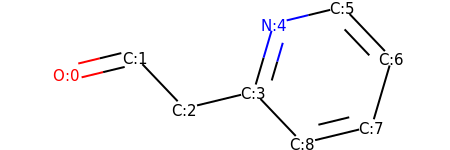

HETATM    1  O1  UNL     1      -4.044   0.061   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.587   0.413   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.552  -0.673   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.094  -0.320   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.329   1.119   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.787   1.472   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.822   0.386   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.398  -1.053   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.940  -1.406   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9    9
END

search for patterns ...
found secondary amine


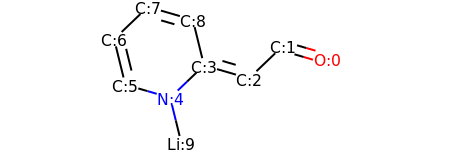

HETATM    1  O1  UNL     1       4.108   0.158   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       2.667   0.577   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.584  -0.461   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.144  -0.042   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.939  -1.080   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -2.379  -0.661   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -2.737   0.796   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -1.654   1.834   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -0.213   1.415   0.000  1.00  0.00           C  
HETATM   10 LI1  UNL     1      -0.582  -2.537   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3
CONECT    3    4    4
CONECT    4    5    9
CONECT    5    6   10
CONECT    6    7    7
CONECT    7    8
CONECT    8    9    9
END

#################
#

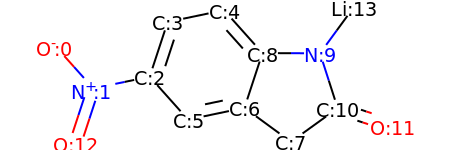

HETATM    1  O1  UNL     1      -4.439   0.866   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1      -3.439  -0.252   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1      -1.971   0.054   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1      -1.502   1.479   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -0.034   1.786   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -0.971  -1.064   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.498  -0.757   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.708  -1.643   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.966   0.668   0.000  1.00  0.00           C  
HETATM   10  N2  UNL     1       2.466   0.663   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1       2.925  -0.765   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1       4.350  -1.233   0.000  1.00  0.00           O  
HETATM   13  O3  UNL     1  

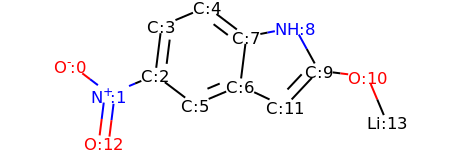

HETATM    1  O1  UNL     1      -4.677   0.302   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1      -3.481  -0.603   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1      -2.099  -0.021   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1      -1.912   1.467   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -0.530   2.050   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -0.903  -0.927   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.479  -0.345   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       0.666   1.144   0.000  1.00  0.00           C  
HETATM    9  N2  UNL     1       2.139   1.426   0.000  1.00  0.00           N  
HETATM   10  C7  UNL     1       2.863   0.112   0.000  1.00  0.00           C  
HETATM   11  O2  UNL     1       4.351  -0.075   0.000  1.00  0.00           O  
HETATM   12  C8  UNL     1       1.837  -0.982   0.000  1.00  0.00           C  
HETATM   13  O3  UNL     1  

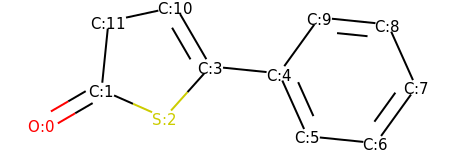

HETATM    1  O1  UNL     1      -4.326  -1.063   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -3.030  -0.309   0.000  1.00  0.00           C  
HETATM    3  S1  UNL     1      -1.658  -0.915   0.000  1.00  0.00           S  
HETATM    4  C2  UNL     1      -0.658   0.204   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.835   0.052   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.449  -1.316   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.942  -1.468   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.819  -0.252   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.205   1.117   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.712   1.268   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -1.412   1.500   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -2.878   1.183   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT

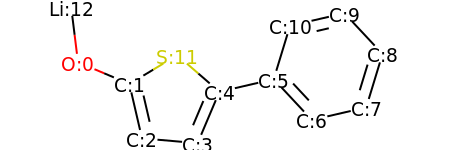

HETATM    1  O1  UNL     1      -4.071   0.356   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.690  -0.229   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.352  -1.690   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.857  -1.820   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.272  -0.439   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.189  -0.100   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.213  -1.196   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.674  -0.858   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       4.112   0.577   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       3.088   1.673   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       1.627   1.335   0.000  1.00  0.00           C  
HETATM   12  S1  UNL     1      -1.405   0.545   0.000  1.00  0.00           S  
HETATM   13 LI1  UNL     1  

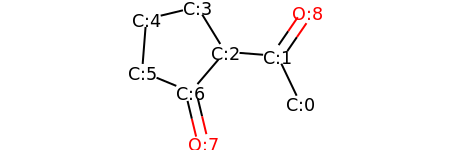

HETATM    1  C1  UNL     1       2.253  -1.185   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.607   0.169   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.111   0.286   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.673   1.564   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -2.131   1.213   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -2.248  -0.282   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -0.862  -0.856   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -0.512  -2.314   0.000  1.00  0.00           O  
HETATM    9  O2  UNL     1       2.456   1.405   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    9    9
CONECT    3    4    7
CONECT    4    5
CONECT    5    6
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...
found primary alcohol


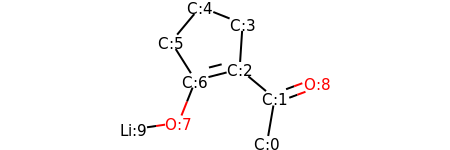

HETATM    1  C1  UNL     1       1.479  -2.088   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.733  -0.609   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.580   0.350   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.677   1.847   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -0.716   2.402   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -1.675   1.249   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -0.874  -0.020   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -1.430  -1.413   0.000  1.00  0.00           O  
HETATM    9  O2  UNL     1       3.140  -0.090   0.000  1.00  0.00           O  
HETATM   10 LI1  UNL     1      -2.914  -1.628   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    9    9
CONECT    3    4    7    7
CONECT    4    5
CONECT    5    6
CONECT    6    7
CONECT    7    8
CONECT    8   10
END

#################
###########

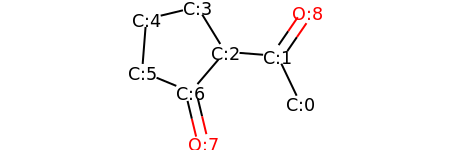

HETATM    1  C1  UNL     1       2.253  -1.185   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.607   0.169   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.111   0.286   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.673   1.564   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -2.131   1.213   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -2.248  -0.282   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -0.862  -0.856   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -0.512  -2.314   0.000  1.00  0.00           O  
HETATM    9  O2  UNL     1       2.456   1.405   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    9    9
CONECT    3    4    7
CONECT    4    5
CONECT    5    6
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...
found primary alcohol


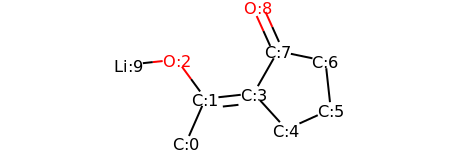

HETATM    1  C1  UNL     1      -1.758  -1.896   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.155  -0.523   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -2.042   0.686   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       0.336  -0.359   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.346  -1.469   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.713  -0.853   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.549   0.639   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.080   0.943   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1       0.464   2.311   0.000  1.00  0.00           O  
HETATM   10 LI1  UNL     1      -3.533   0.522   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    4    4
CONECT    3   10
CONECT    4    5    8
CONECT    5    6
CONECT    6    7
CONECT    7    8
CONECT    8    9    9
END

#################
###########

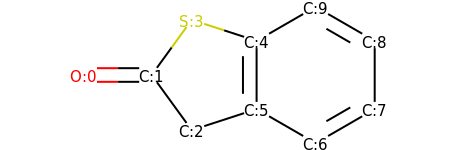

HETATM    1  O1  UNL     1      -3.691  -0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.191  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.309  -1.214   0.000  1.00  0.00           C  
HETATM    4  S1  UNL     1      -1.309   1.214   0.000  1.00  0.00           S  
HETATM    5  C3  UNL     1       0.118   0.750   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.118  -0.750   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.417  -1.500   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.716  -0.750   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.716   0.750   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.417   1.500   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    4
CONECT    3    6
CONECT    4    5
CONECT    5    6    6   10
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
CONECT    9   10   10
END

se

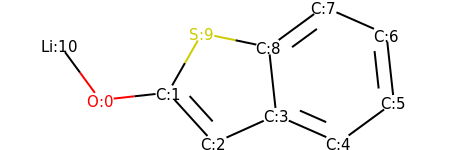

HETATM    1  O1  UNL     1      -3.255  -0.475   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.764  -0.312   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.755  -1.422   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.613  -0.806   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.986  -1.410   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.195  -0.524   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.032   0.968   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.659   1.572   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       0.449   0.685   0.000  1.00  0.00           C  
HETATM   10  S1  UNL     1      -1.019   0.990   0.000  1.00  0.00           S  
HETATM   11 LI1  UNL     1      -4.142   0.735   0.000  1.00  0.00          LI  
CONECT    1    2   11
CONECT    2    3    3   10
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6

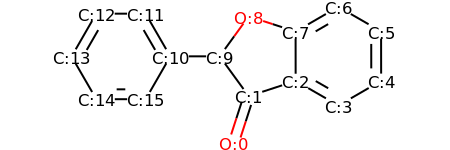

HETATM    1  O1  UNL     1       0.057  -2.475   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.519  -1.048   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.945  -0.583   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       3.245  -1.331   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       4.543  -0.580   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       4.541   0.920   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.241   1.669   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.943   0.917   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1       0.516   1.379   0.000  1.00  0.00           O  
HETATM   10  C8  UNL     1      -0.364   0.165   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -1.864   0.163   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -2.616   1.461   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

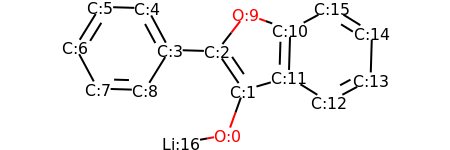

HETATM    1  O1  UNL     1       0.067  -2.314   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.573  -0.902   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.271   0.337   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.770   0.383   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -2.480   1.704   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -3.979   1.750   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -4.769   0.475   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -4.059  -0.847   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -2.559  -0.893   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1       0.647   1.523   0.000  1.00  0.00           O  
HETATM   11  C9  UNL     1       2.059   1.017   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       2.014  -0.483   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

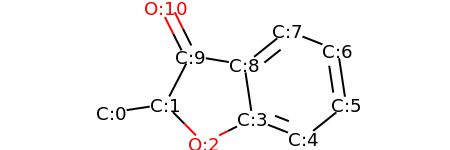

HETATM    1  C1  UNL     1      -3.454  -0.766   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.971  -0.541   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -0.917  -1.609   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       0.424  -0.937   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.820  -1.484   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.993  -0.548   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.768   0.935   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.371   1.482   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       0.199   0.546   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.281   0.791   0.000  1.00  0.00           C  
HETATM   11  O2  UNL     1      -1.952   2.132   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3   10
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6
CONECT   

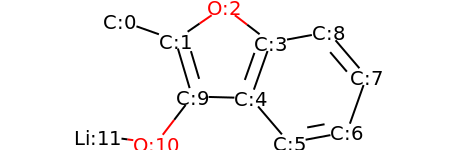

HETATM    1  C1  UNL     1      -2.930   1.532   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.516   1.031   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -0.280   1.881   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       0.910   0.968   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.410  -0.446   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.384  -1.587   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.859  -1.314   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.360   0.100   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.385   1.241   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.090  -0.407   0.000  1.00  0.00           C  
HETATM   11  O2  UNL     1      -2.003  -1.597   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1      -3.490  -1.401   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

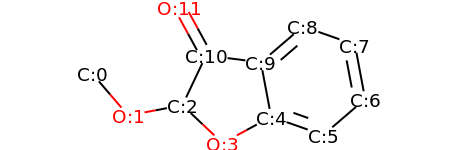

HETATM    1  C1  UNL     1      -4.035   0.230   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -3.058  -0.908   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -1.584  -0.631   0.000  1.00  0.00           C  
HETATM    4  O2  UNL     1      -0.493  -1.661   0.000  1.00  0.00           O  
HETATM    5  C3  UNL     1       0.823  -0.943   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.238  -1.440   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.377  -0.463   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.100   1.011   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.685   1.508   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.547   0.532   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -0.941   0.724   0.000  1.00  0.00           C  
HETATM   12  O3  UNL     1      -1.660   2.041   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2

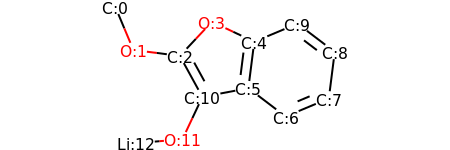

HETATM    1  C1  UNL     1      -3.479   2.084   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -2.898   0.701   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -1.410   0.512   0.000  1.00  0.00           C  
HETATM    4  O2  UNL     1      -0.383   1.605   0.000  1.00  0.00           O  
HETATM    5  C3  UNL     1       0.974   0.965   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.785  -0.523   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.979  -1.431   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.362  -0.850   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.551   0.638   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       2.357   1.546   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -0.689  -0.803   0.000  1.00  0.00           C  
HETATM   12  O3  UNL     1      -1.328  -2.160   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

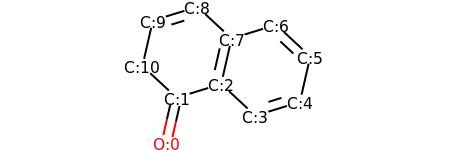

HETATM    1  O1  UNL     1      -1.758  -2.396   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.424  -0.934   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.009  -0.492   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.109  -1.512   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.542  -1.069   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.876   0.393   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.776   1.413   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.343   0.971   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -0.757   1.991   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -2.191   1.549   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -2.524   0.086   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4    8    8
CONECT    4    5    5
CONECT    5    6

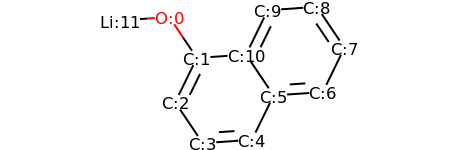

HETATM    1  O1  UNL     1      -2.170   1.477   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.332   0.233   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.990  -1.115   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.152  -2.359   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.344  -2.255   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.003  -0.907   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.499  -0.803   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.157   0.544   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.319   1.789   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       0.823   1.685   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       0.165   0.337   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -3.666   1.373   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

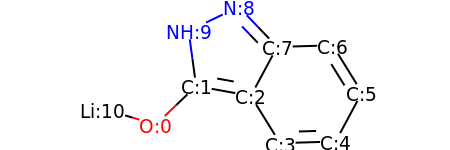

HETATM    1  O1  UNL     1      -2.465  -1.096   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.381  -0.058   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.095  -0.325   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.884  -1.601   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.384  -1.555   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.094  -0.234   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.304   1.042   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.805   0.996   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -0.232   2.080   0.000  1.00  0.00           N  
HETATM   10  N2  UNL     1      -1.583   1.428   0.000  1.00  0.00           N  
HETATM   11 LI1  UNL     1      -3.905  -0.676   0.000  1.00  0.00          LI  
CONECT    1    2   11
CONECT    2    3    3   10
CONECT    3    4    8
CONECT    4    5    5
CONECT    5    6

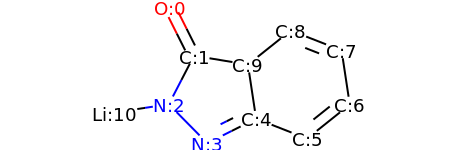

HETATM    1  O1  UNL     1      -1.952   2.132   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.281   0.791   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.971  -0.541   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.917  -1.609   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       0.424  -0.937   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.820  -1.484   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       2.993  -0.548   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       2.768   0.935   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       1.371   1.482   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       0.199   0.546   0.000  1.00  0.00           C  
HETATM   11 LI1  UNL     1      -3.454  -0.766   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3   10
CONECT    3    4   11
CONECT    4    5    5
CONECT    5    6   10

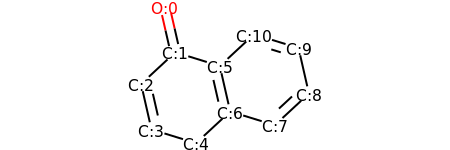

HETATM    1  O1  UNL     1      -1.758   2.396   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.424   0.934   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.524  -0.086   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -2.191  -1.549   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.757  -1.991   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       0.009   0.492   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.343  -0.971   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.776  -1.413   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.876  -0.393   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       2.542   1.069   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       1.109   1.512   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    7
CONECT   

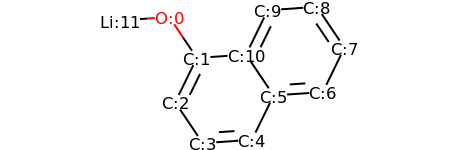

HETATM    1  O1  UNL     1      -2.170   1.477   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.332   0.233   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.990  -1.115   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.152  -2.359   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.344  -2.255   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.003  -0.907   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.499  -0.803   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.157   0.544   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.319   1.789   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       0.823   1.685   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       0.165   0.337   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -3.666   1.373   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

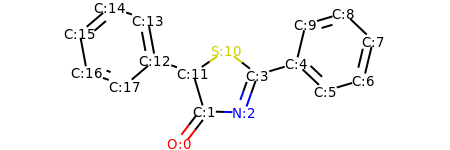

HETATM    1  O1  UNL     1      -1.620  -2.960   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.706  -1.770   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.793  -1.810   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.294  -0.396   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.732   0.030   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       3.820  -1.003   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       5.259  -0.578   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       5.609   0.881   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       4.521   1.914   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.083   1.488   0.000  1.00  0.00           C  
HETATM   11  S1  UNL     1       0.104   0.517   0.000  1.00  0.00           S  
HETATM   12  C9  UNL     1      -1.132  -0.332   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

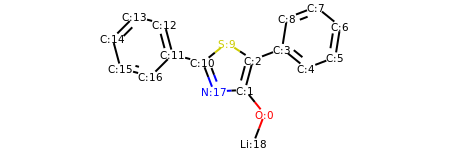

HETATM    1  O1  UNL     1       1.634  -2.691   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.690  -1.525   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.079  -0.076   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.480   0.461   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.645  -0.483   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       5.046   0.054   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       5.281   1.535   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       4.116   2.480   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.715   1.943   0.000  1.00  0.00           C  
HETATM   10  S1  UNL     1      -0.178   0.742   0.000  1.00  0.00           S  
HETATM   11  C9  UNL     1      -1.345  -0.202   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -2.793   0.187   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

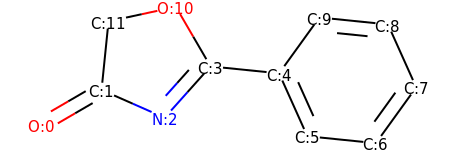

HETATM    1  O1  UNL     1      -4.326  -1.063   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -3.030  -0.309   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.658  -0.915   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.658   0.204   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.835   0.052   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.449  -1.316   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.942  -1.468   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.819  -0.252   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.205   1.117   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.712   1.268   0.000  1.00  0.00           C  
HETATM   11  O2  UNL     1      -1.412   1.500   0.000  1.00  0.00           O  
HETATM   12  C9  UNL     1      -2.878   1.183   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT

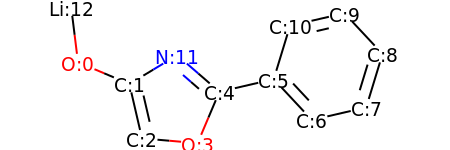

HETATM    1  O1  UNL     1      -4.071   0.356   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.690  -0.229   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.352  -1.690   0.000  1.00  0.00           C  
HETATM    4  O2  UNL     1      -0.857  -1.820   0.000  1.00  0.00           O  
HETATM    5  C3  UNL     1      -0.272  -0.439   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.189  -0.100   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.213  -1.196   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.674  -0.858   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       4.112   0.577   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.088   1.673   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.627   1.335   0.000  1.00  0.00           C  
HETATM   12  N1  UNL     1      -1.405   0.545   0.000  1.00  0.00           N  
HETATM   13 LI1  UNL     1  

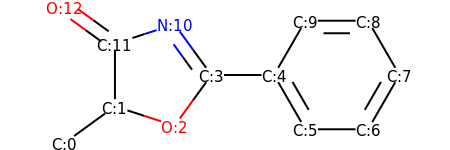

HETATM    1  C1  UNL     1      -3.874  -1.632   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.660  -0.750   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -1.234  -1.214   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -0.352  -0.000   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.148   0.000   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.898  -1.299   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.398  -1.299   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       4.148   0.000   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       3.398   1.299   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       1.898   1.299   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1      -1.234   1.214   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1      -2.660   0.750   0.000  1.00  0.00           C  
HETATM   13  O2  UNL     1  

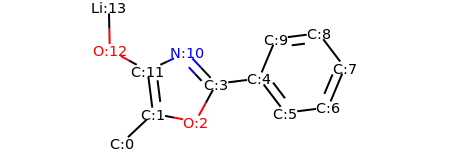

HETATM    1  C1  UNL     1      -3.347  -2.293   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.254  -1.266   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -0.780  -1.547   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -0.058  -0.232   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.430  -0.044   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.338  -1.238   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.826  -1.050   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       4.407   0.333   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       3.499   1.528   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       2.011   1.339   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1      -1.085   0.861   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1      -2.442   0.222   0.000  1.00  0.00           C  
HETATM   13  O2  UNL     1  

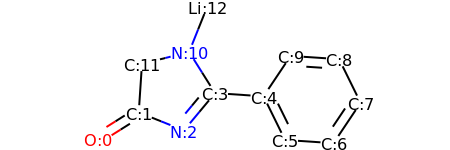

HETATM    1  O1  UNL     1      -4.217  -1.433   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.948  -0.634   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.555  -1.191   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.595  -0.038   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.902  -0.138   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.564  -1.484   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.061  -1.583   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.895  -0.337   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.233   1.009   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.737   1.109   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -1.394   1.231   0.000  1.00  0.00           N  
HETATM   12  C9  UNL     1      -2.848   0.863   0.000  1.00  0.00           C  
HETATM   13 LI1  UNL     1  

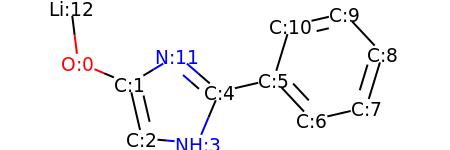

HETATM    1  O1  UNL     1      -4.071   0.356   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.690  -0.229   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.352  -1.690   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -0.857  -1.820   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -0.272  -0.439   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.189  -0.100   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.213  -1.196   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.674  -0.858   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       4.112   0.577   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.088   1.673   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.627   1.335   0.000  1.00  0.00           C  
HETATM   12  N2  UNL     1      -1.405   0.545   0.000  1.00  0.00           N  
HETATM   13 LI1  UNL     1  

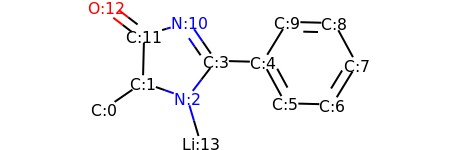

HETATM    1  C1  UNL     1      -3.854  -1.345   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.619  -0.495   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.204  -0.995   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.292   0.196   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.207   0.158   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.924  -1.160   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.424  -1.198   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       4.206   0.082   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       3.490   1.399   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       1.990   1.437   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -1.143   1.432   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1      -2.581   1.005   0.000  1.00  0.00           C  
HETATM   13  O1  UNL     1  

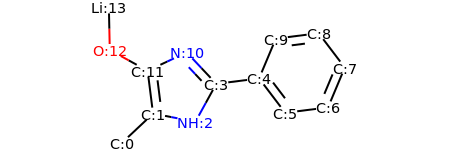

HETATM    1  C1  UNL     1      -3.347  -2.293   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.254  -1.266   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.780  -1.547   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.058  -0.232   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.430  -0.044   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.338  -1.238   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.826  -1.050   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       4.407   0.333   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       3.499   1.528   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       2.011   1.339   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -1.085   0.861   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1      -2.442   0.222   0.000  1.00  0.00           C  
HETATM   13  O1  UNL     1  

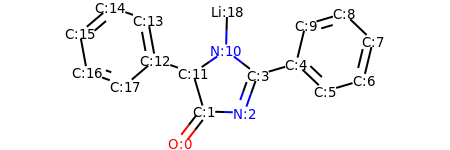

HETATM    1  O1  UNL     1      -1.632  -3.064   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.717  -1.875   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.783  -1.917   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.286  -0.504   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.725  -0.081   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       3.811  -1.115   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       5.250  -0.692   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       5.603   0.766   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       4.516   1.801   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.078   1.377   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1       0.097   0.411   0.000  1.00  0.00           N  
HETATM   12  C9  UNL     1      -1.140  -0.436   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

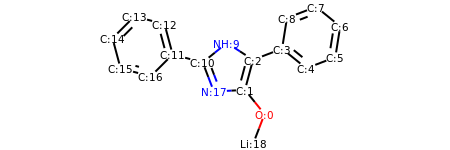

HETATM    1  O1  UNL     1       1.634  -2.691   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.690  -1.525   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.079  -0.076   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.480   0.461   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.645  -0.483   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       5.046   0.054   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       5.281   1.535   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       4.116   2.480   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.715   1.943   0.000  1.00  0.00           C  
HETATM   10  N1  UNL     1      -0.178   0.742   0.000  1.00  0.00           N  
HETATM   11  C9  UNL     1      -1.345  -0.202   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -2.793   0.187   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

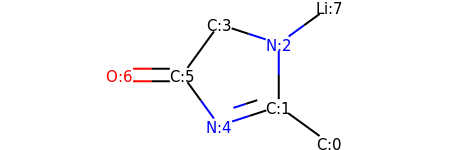

HETATM    1  C1  UNL     1       2.031  -1.632   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       0.818  -0.750   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.818   0.750   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.609   1.214   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -0.609  -1.214   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -1.490  -0.000   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1      -2.990  -0.000   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1       2.031   1.632   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    5    5
CONECT    3    4    8
CONECT    4    6
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...
found primary alcohol


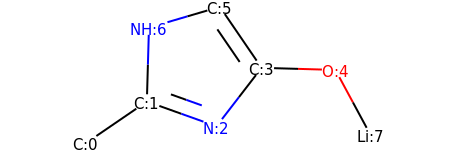

HETATM    1  C1  UNL     1      -2.788  -1.186   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.550  -0.339   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.137  -0.844   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       0.779   0.344   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1       2.279   0.301   0.000  1.00  0.00           O  
HETATM    6  C4  UNL     1      -0.067   1.582   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1      -1.507   1.160   0.000  1.00  0.00           N  
HETATM    8 LI1  UNL     1       2.991  -1.019   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    6    6
CONECT    5    8
CONECT    6    7
END

#################
#################
search for patterns ...


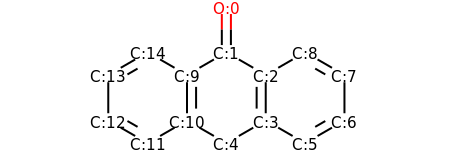

HETATM    1  O1  UNL     1      -0.000   2.800   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.000   1.300   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.299   0.550   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.299  -0.950   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.000  -1.700   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.598  -1.700   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.897  -0.950   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.897   0.550   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.598   1.300   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.299   0.550   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -1.299  -0.950   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -2.598  -1.700   0.000  1.00  0.00           C  
HETATM   13  C12 UNL     1  

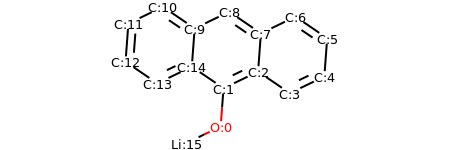

HETATM    1  O1  UNL     1      -0.110  -2.577   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.001  -1.081   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.352  -0.429   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.592  -1.274   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.943  -0.622   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       4.054   0.874   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.814   1.718   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.463   1.066   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       0.223   1.911   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.128   1.259   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -2.368   2.103   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -3.719   1.451   0.000  1.00  0.00           C  
HETATM   13  C12 UNL     1  

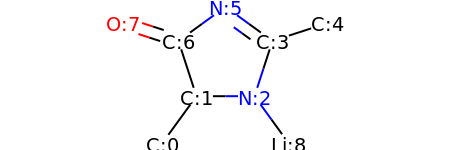

HETATM    1  C1  UNL     1      -1.632  -1.937   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.750  -0.724   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.750  -0.724   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       1.214   0.703   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.640   1.166   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -0.000   1.584   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1      -1.214   0.703   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.640   1.166   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1       1.632  -1.937   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    7
CONECT    3    4    9
CONECT    4    5    6    6
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...
found primary alcohol


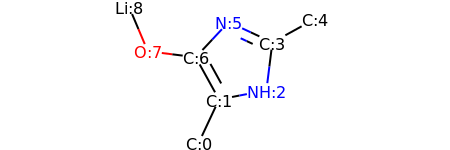

HETATM    1  C1  UNL     1      -0.640  -2.613   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.003  -1.255   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.470  -0.971   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       1.655   0.517   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.968   1.242   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1       0.296   1.153   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1      -0.728   0.058   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.217   0.243   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -2.801   1.625   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    7    7
CONECT    3    4
CONECT    4    5    6    6
CONECT    6    7
CONECT    7    8
CONECT    8    9
END

#################
#################
search for patterns ...
found secondary amine


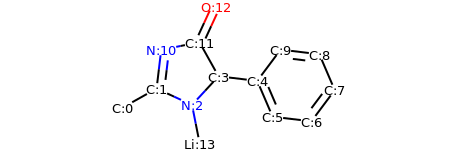

HETATM    1  C1  UNL     1      -4.191  -1.028   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.882  -0.296   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.520  -0.924   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.501   0.177   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.988  -0.000   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.580  -1.378   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.069  -1.555   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.967  -0.354   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       3.376   1.025   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       1.886   1.201   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -2.705   1.194   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1      -1.234   1.486   0.000  1.00  0.00           C  
HETATM   13  O1  UNL     1  

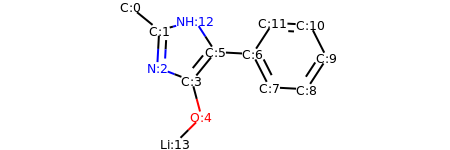

HETATM    1  C1  UNL     1      -3.856   2.184   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.692   1.238   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.773  -0.260   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -1.374  -0.800   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1      -0.989  -2.250   0.000  1.00  0.00           O  
HETATM    6  C4  UNL     1      -0.428   0.364   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.070   0.283   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.748  -1.055   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.246  -1.137   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       4.065   0.120   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       3.387   1.458   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       1.889   1.539   0.000  1.00  0.00           C  
HETATM   13  N2  UNL     1  

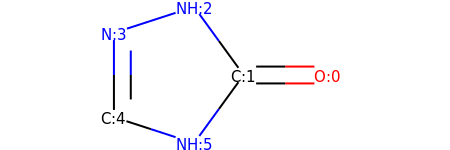

HETATM    1  O1  UNL     1       2.313  -0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.813  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.068   1.214   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -1.495   0.750   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -1.495  -0.750   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -0.068  -1.214   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
END

search for patterns ...
found primary alcohol


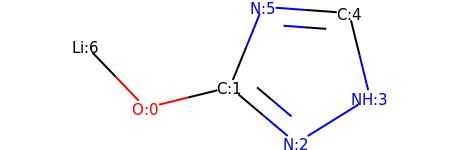

HETATM    1  O1  UNL     1      -1.777  -0.628   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.320  -0.270   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.826  -1.238   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1       2.100  -0.447   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       1.742   1.010   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1       0.246   1.119   0.000  1.00  0.00           N  
HETATM    7 LI1  UNL     1      -2.816   0.454   0.000  1.00  0.00          LI  
CONECT    1    2    7
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6    6
END

#################
#################
search for patterns ...
found primary alcohol


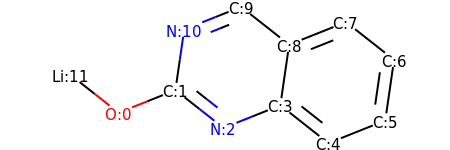

HETATM    1  O1  UNL     1      -3.295  -0.849   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.902  -0.293   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.724  -1.221   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.669  -0.665   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.847  -1.594   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       3.240  -1.038   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.456   0.446   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.278   1.375   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.884   0.819   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -0.294   1.748   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -1.687   1.192   0.000  1.00  0.00           N  
HETATM   12 LI1  UNL     1      -4.473   0.080   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

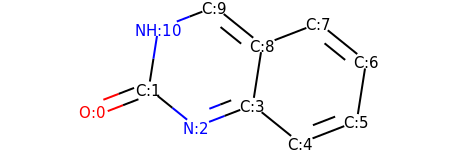

HETATM    1  O1  UNL     1      -3.711  -0.800   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.312  -0.259   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.144  -1.201   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.255  -0.661   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.423  -1.603   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.822  -1.063   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.054   0.419   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.886   1.361   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.487   0.821   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -0.680   1.763   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -2.080   1.223   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4    4
CONECT    4    5    9
CONECT    5    6    6

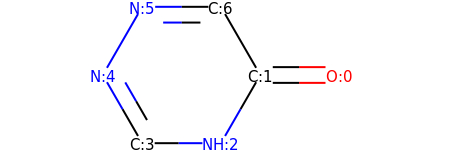

HETATM    1  O1  UNL     1       2.571   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.321  -1.299   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.179  -1.299   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.929   0.000   0.000  1.00  0.00           N  
HETATM    6  N3  UNL     1      -1.179   1.299   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


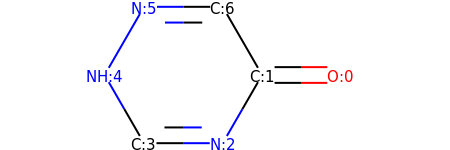

HETATM    1  O1  UNL     1       2.571   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.321  -1.299   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.179  -1.299   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.929   0.000   0.000  1.00  0.00           N  
HETATM    6  N3  UNL     1      -1.179   1.299   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4    4
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found primary alcohol


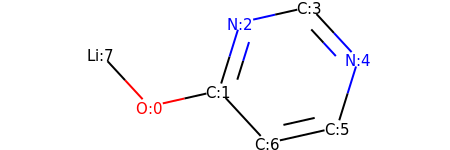

HETATM    1  O1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.159   1.129   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.305   1.459   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       2.322   0.357   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       1.876  -1.075   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.413  -1.405   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


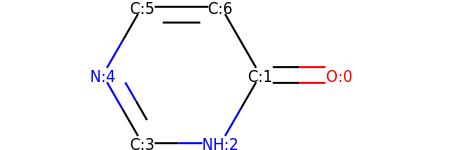

HETATM    1  O1  UNL     1       2.571   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.321  -1.299   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.179  -1.299   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.929   0.000   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -1.179   1.299   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found primary alcohol


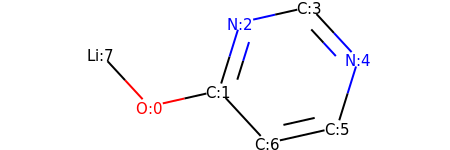

HETATM    1  O1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.159   1.129   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.305   1.459   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       2.322   0.357   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       1.876  -1.075   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.413  -1.405   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


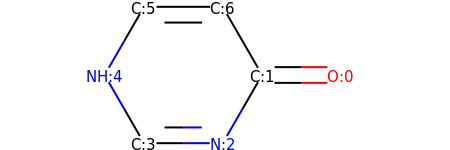

HETATM    1  O1  UNL     1       2.571   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.321  -1.299   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.179  -1.299   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.929   0.000   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -1.179   1.299   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4    4
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found primary alcohol


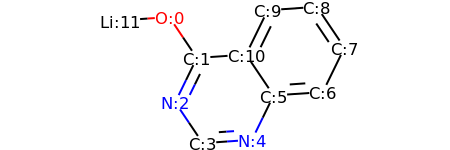

HETATM    1  O1  UNL     1      -2.170   1.477   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.332   0.233   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.990  -1.115   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.152  -2.359   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       0.344  -2.255   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       1.003  -0.907   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       2.499  -0.803   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.157   0.544   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.319   1.789   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       0.823   1.685   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       0.165   0.337   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -3.666   1.373   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

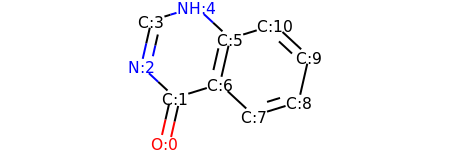

HETATM    1  O1  UNL     1      -1.758  -2.396   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.424  -0.934   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.524   0.086   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -2.191   1.549   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -0.757   1.991   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       0.343   0.971   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.009  -0.492   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       1.109  -1.512   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.542  -1.069   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       2.876   0.393   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       1.776   1.413   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4    4
CONECT    4    5
CONECT    5    6
CONECT   

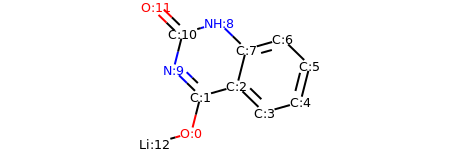

HETATM    1  O1  UNL     1      -1.316  -2.344   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.948  -0.890   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.496  -0.483   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.571  -1.529   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.014  -1.122   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.383   0.332   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.308   1.378   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.865   0.971   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -0.210   2.017   0.000  1.00  0.00           N  
HETATM   10  N2  UNL     1      -2.022   0.156   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -1.653   1.610   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1      -2.728   2.656   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

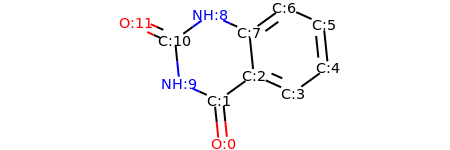

HETATM    1  O1  UNL     1      -0.567  -2.949   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.720  -1.457   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.495  -0.577   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.864  -1.190   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.079  -0.311   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.925   1.181   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.556   1.794   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.341   0.915   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -1.028   1.528   0.000  1.00  0.00           N  
HETATM   10  N2  UNL     1      -2.090  -0.844   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -2.243   0.648   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1      -3.612   1.261   0.000  1.00  0.00           O  
CONECT    1    2    2
CONECT

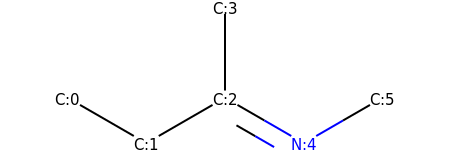

HETATM    1  C1  UNL     1      -2.598   0.000   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.299  -0.750   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.000   0.000   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.000   1.500   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.299  -0.750   0.000  1.00  0.00           N  
HETATM    6  C5  UNL     1       2.598   0.000   0.000  1.00  0.00           C  
CONECT    1    2
CONECT    2    3
CONECT    3    4    5    5
CONECT    5    6
END

search for patterns ...
found secondary amine


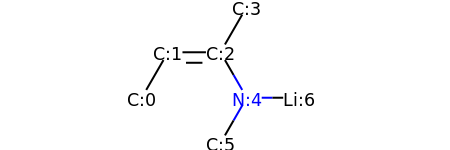

HETATM    1  C1  UNL     1      -2.250  -0.557   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.500   0.742   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.000   0.742   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.750   2.041   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.750  -0.557   0.000  1.00  0.00           N  
HETATM    6  C5  UNL     1      -0.000  -1.856   0.000  1.00  0.00           C  
HETATM    7 LI1  UNL     1       2.250  -0.557   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3
CONECT    3    4    5
CONECT    5    6    7
END

#################
#################
search for patterns ...


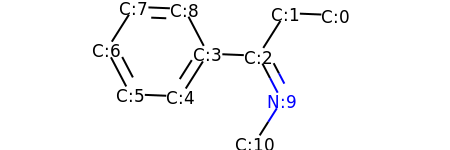

HETATM    1  C1  UNL     1       3.601   1.270   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.102   1.332   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       1.299   0.065   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.200   0.126   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -1.002  -1.141   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -2.501  -1.079   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -3.197   0.250   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1      -2.394   1.517   0.000  1.00  0.00           C  
HETATM    9  C9  UNL     1      -0.895   1.455   0.000  1.00  0.00           C  
HETATM   10  N1  UNL     1       1.995  -1.264   0.000  1.00  0.00           N  
HETATM   11  C10 UNL     1       1.192  -2.531   0.000  1.00  0.00           C  
CONECT    1    2
CONECT    2    3
CONECT    3    4   10   10
CONECT    4    5    5    9
CONECT    5    6
CONE

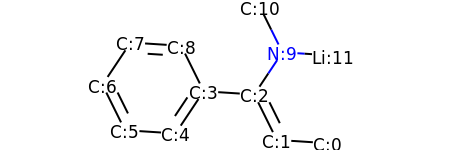

HETATM    1  C1  UNL     1       3.146  -1.721   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.649  -1.625   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.984  -0.280   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.513  -0.184   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -1.345  -1.432   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -2.841  -1.336   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -3.507   0.008   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1      -2.675   1.256   0.000  1.00  0.00           C  
HETATM    9  C9  UNL     1      -1.178   1.160   0.000  1.00  0.00           C  
HETATM   10  N1  UNL     1       1.816   0.968   0.000  1.00  0.00           N  
HETATM   11  C10 UNL     1       1.150   2.313   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1       3.313   0.872   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

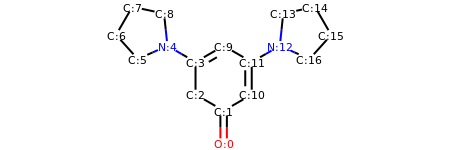

HETATM    1  O1  UNL     1       0.000  -4.081   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.000  -2.581   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.299  -1.831   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.299  -0.331   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -2.598   0.419   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -3.968  -0.191   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -4.972   0.923   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -4.222   2.222   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -2.755   1.911   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -0.000   0.419   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.299  -1.831   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       1.299  -0.331   0.000  1.00  0.00           C  
HETATM   13  N2  UNL     1  

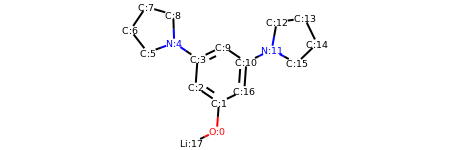

HETATM    1  O1  UNL     1      -0.202  -3.808   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.094  -2.312   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.336  -1.471   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.228   0.026   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -2.470   0.867   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -3.881   0.357   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -4.802   1.541   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -3.960   2.783   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -2.519   2.366   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.121   0.680   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.363  -0.161   0.000  1.00  0.00           C  
HETATM   12  N2  UNL     1       2.713   0.494   0.000  1.00  0.00           N  
HETATM   13  C10 UNL     1  

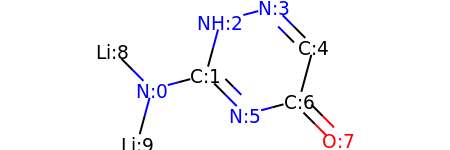

HETATM    1  N1  UNL     1      -2.096  -0.288   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.647   0.097   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.255   1.545   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1       1.195   1.930   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       2.253   0.867   0.000  1.00  0.00           C  
HETATM    6  N4  UNL     1       0.412  -0.966   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1       1.861  -0.581   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.920  -1.644   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.155   0.775   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1      -2.488  -1.736   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...


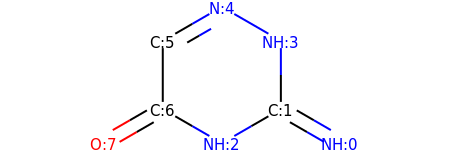

HETATM    1  N1  UNL     1       2.598  -1.125   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.000  -1.125   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1       1.299   1.125   0.000  1.00  0.00           N  
HETATM    5  N4  UNL     1       0.000   1.875   0.000  1.00  0.00           N  
HETATM    6  C2  UNL     1      -1.299   1.125   0.000  1.00  0.00           C  
HETATM    7  C3  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           O  
CONECT    1    2    2
CONECT    2    3    4
CONECT    3    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary amine


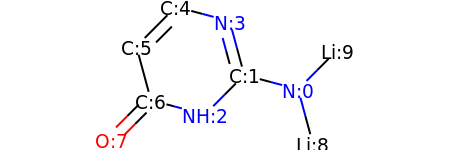

HETATM    1  N1  UNL     1       2.096  -0.288   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.647   0.097   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.412  -0.966   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1       0.255   1.545   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -1.195   1.930   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1      -2.253   0.867   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1      -1.861  -0.581   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.920  -1.644   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1       2.488  -1.736   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1       3.155   0.775   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    4    4
CONECT    3    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...


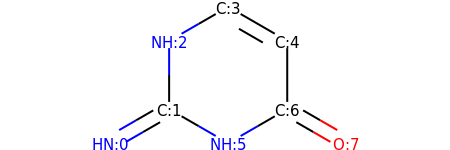

HETATM    1  N1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -1.299   1.125   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.000   1.875   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.299   1.125   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -0.000  -1.125   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.598  -1.125   0.000  1.00  0.00           O  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary amine


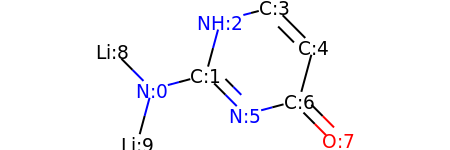

HETATM    1  N1  UNL     1      -2.096  -0.288   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.647   0.097   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.255   1.545   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.195   1.930   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.253   0.867   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1       0.412  -0.966   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.861  -0.581   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.920  -1.644   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.155   0.775   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1      -2.488  -1.736   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...


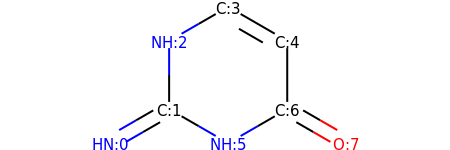

HETATM    1  N1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -1.299   1.125   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.000   1.875   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.299   1.125   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -0.000  -1.125   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.598  -1.125   0.000  1.00  0.00           O  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary amine


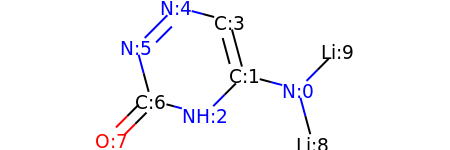

HETATM    1  N1  UNL     1       2.096  -0.288   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.647   0.097   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.412  -0.966   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.255   1.545   0.000  1.00  0.00           C  
HETATM    5  N3  UNL     1      -1.195   1.930   0.000  1.00  0.00           N  
HETATM    6  N4  UNL     1      -2.253   0.867   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1      -1.861  -0.581   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.920  -1.644   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1       2.488  -1.736   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1       3.155   0.775   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    4    4
CONECT    3    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...


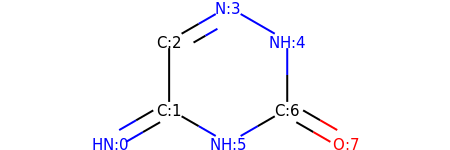

HETATM    1  N1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.299   1.125   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1       0.000   1.875   0.000  1.00  0.00           N  
HETATM    5  N3  UNL     1       1.299   1.125   0.000  1.00  0.00           N  
HETATM    6  N4  UNL     1      -0.000  -1.125   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.598  -1.125   0.000  1.00  0.00           O  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...


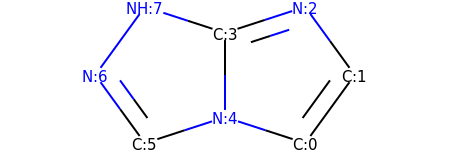

HETATM    1  C1  UNL     1       1.427  -1.214   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.308   0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.427   1.214   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       0.000   0.750   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -0.000  -0.750   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -1.427  -1.214   0.000  1.00  0.00           C  
HETATM    7  N3  UNL     1      -2.308   0.000   0.000  1.00  0.00           N  
HETATM    8  N4  UNL     1      -1.427   1.214   0.000  1.00  0.00           N  
CONECT    1    2    2    5
CONECT    2    3
CONECT    3    4    4
CONECT    4    5    8
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
END

search for patterns ...


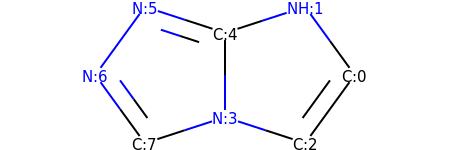

HETATM    1  C1  UNL     1       2.308  -0.000   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       1.427   1.214   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       1.427  -1.214   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -0.000  -0.750   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.000   0.750   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -1.427   1.214   0.000  1.00  0.00           N  
HETATM    7  N4  UNL     1      -2.308  -0.000   0.000  1.00  0.00           N  
HETATM    8  C4  UNL     1      -1.427  -1.214   0.000  1.00  0.00           C  
CONECT    1    2    3    3
CONECT    2    5
CONECT    3    4
CONECT    4    5    8
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...


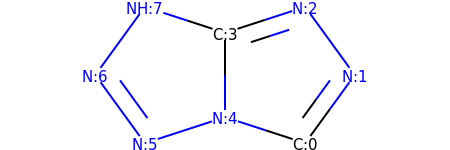

HETATM    1  C1  UNL     1       1.427  -1.214   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       2.308   0.000   0.000  1.00  0.00           N  
HETATM    3  N2  UNL     1       1.427   1.214   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.000   0.750   0.000  1.00  0.00           C  
HETATM    5  N3  UNL     1      -0.000  -0.750   0.000  1.00  0.00           N  
HETATM    6  N4  UNL     1      -1.427  -1.214   0.000  1.00  0.00           N  
HETATM    7  N5  UNL     1      -2.308   0.000   0.000  1.00  0.00           N  
HETATM    8  N6  UNL     1      -1.427   1.214   0.000  1.00  0.00           N  
CONECT    1    2    2    5
CONECT    2    3
CONECT    3    4    4
CONECT    4    5    8
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
END

search for patterns ...


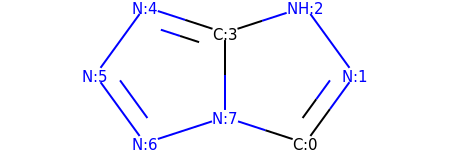

HETATM    1  C1  UNL     1       1.427  -1.214   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       2.308  -0.000   0.000  1.00  0.00           N  
HETATM    3  N2  UNL     1       1.427   1.214   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.000   0.750   0.000  1.00  0.00           C  
HETATM    5  N3  UNL     1      -1.427   1.214   0.000  1.00  0.00           N  
HETATM    6  N4  UNL     1      -2.308  -0.000   0.000  1.00  0.00           N  
HETATM    7  N5  UNL     1      -1.427  -1.214   0.000  1.00  0.00           N  
HETATM    8  N6  UNL     1      -0.000  -0.750   0.000  1.00  0.00           N  
CONECT    1    2    2    8
CONECT    2    3
CONECT    3    4
CONECT    4    5    5    8
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
END

#################
#################
search for patterns ...
found secondary amine


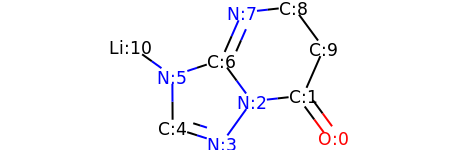

HETATM    1  O1  UNL     1       2.655  -1.730   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.766  -0.522   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.276  -0.688   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.599  -1.907   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -2.028  -1.451   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -2.037   0.048   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1      -0.613   0.520   0.000  1.00  0.00           C  
HETATM    8  N4  UNL     1      -0.011   1.894   0.000  1.00  0.00           N  
HETATM    9  C4  UNL     1       1.479   2.060   0.000  1.00  0.00           C  
HETATM   10  C5  UNL     1       2.368   0.852   0.000  1.00  0.00           C  
HETATM   11 LI1  UNL     1      -3.256   0.923   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3   10
CONECT    3    4    7
CONECT    4    5    5
CONECT    5    6
CONE

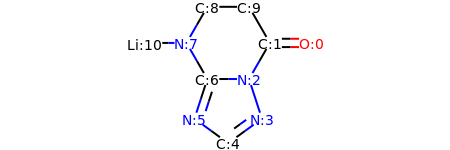

HETATM    1  O1  UNL     1       3.000   0.824   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.500   0.824   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.750  -0.476   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1       1.214  -1.902   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -0.000  -2.784   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -1.214  -1.902   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1      -0.750  -0.476   0.000  1.00  0.00           C  
HETATM    8  N4  UNL     1      -1.500   0.824   0.000  1.00  0.00           N  
HETATM    9  C4  UNL     1      -0.750   2.123   0.000  1.00  0.00           C  
HETATM   10  C5  UNL     1       0.750   2.123   0.000  1.00  0.00           C  
HETATM   11 LI1  UNL     1      -3.000   0.824   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3   10
CONECT    3    4    7
CONECT    4    5    5
CONECT    5    6
CONE

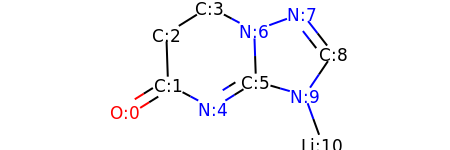

HETATM    1  O1  UNL     1      -3.434  -1.243   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.162  -0.449   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.214   1.050   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.942   1.845   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.838  -1.153   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       0.434  -0.359   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1       0.383   1.140   0.000  1.00  0.00           N  
HETATM    8  N3  UNL     1       1.792   1.653   0.000  1.00  0.00           N  
HETATM    9  C5  UNL     1       2.715   0.471   0.000  1.00  0.00           C  
HETATM   10  N4  UNL     1       1.876  -0.773   0.000  1.00  0.00           N  
HETATM   11 LI1  UNL     1       2.389  -2.182   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3    5
CONECT    3    4
CONECT    4    7
CONECT    5    6    6
CONECT   

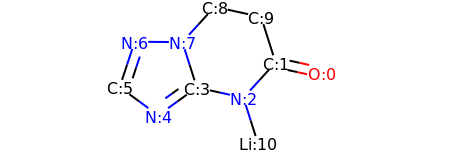

HETATM    1  O1  UNL     1       3.366  -0.074   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.901   0.247   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.890  -0.861   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.575  -0.541   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.794  -1.415   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -3.002  -0.526   0.000  1.00  0.00           C  
HETATM    7  N3  UNL     1      -2.530   0.898   0.000  1.00  0.00           N  
HETATM    8  N4  UNL     1      -1.030   0.889   0.000  1.00  0.00           N  
HETATM    9  C4  UNL     1      -0.019   1.997   0.000  1.00  0.00           C  
HETATM   10  C5  UNL     1       1.446   1.677   0.000  1.00  0.00           C  
HETATM   11 LI1  UNL     1       1.345  -2.291   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3   10
CONECT    3    4   11
CONECT    4    5    5    8
CONECT    5    6

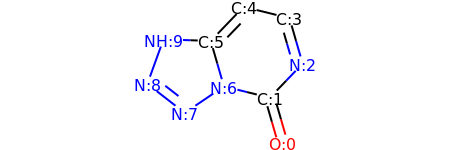

HETATM    1  O1  UNL     1       1.620  -2.342   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.203  -0.901   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       2.243   0.180   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.827   1.621   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.371   1.981   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -0.669   0.900   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1      -0.253  -0.541   0.000  1.00  0.00           N  
HETATM    8  N3  UNL     1      -1.495  -1.383   0.000  1.00  0.00           N  
HETATM    9  N4  UNL     1      -2.679  -0.462   0.000  1.00  0.00           N  
HETATM   10  N5  UNL     1      -2.168   0.949   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4    4
CONECT    4    5
CONECT    5    6    6
CONECT    6    7   10
CONECT    7    8
CONECT    8    9    9
CONECT    9   10
END

se

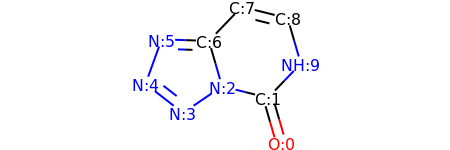

HETATM    1  O1  UNL     1       1.620  -2.342   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.203  -0.901   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.253  -0.541   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -1.495  -1.383   0.000  1.00  0.00           N  
HETATM    5  N3  UNL     1      -2.679  -0.462   0.000  1.00  0.00           N  
HETATM    6  N4  UNL     1      -2.168   0.949   0.000  1.00  0.00           N  
HETATM    7  C2  UNL     1      -0.669   0.900   0.000  1.00  0.00           C  
HETATM    8  C3  UNL     1       0.371   1.981   0.000  1.00  0.00           C  
HETATM    9  C4  UNL     1       1.827   1.621   0.000  1.00  0.00           C  
HETATM   10  N5  UNL     1       2.243   0.180   0.000  1.00  0.00           N  
CONECT    1    2    2
CONECT    2    3   10
CONECT    3    4    7
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9    9
CONECT    9   10
END

##

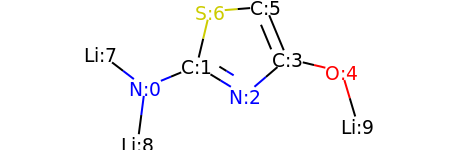

HETATM    1  N1  UNL     1      -2.238  -0.417   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.854   0.160   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       0.427  -0.622   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.566   0.354   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1       3.025   0.007   0.000  1.00  0.00           O  
HETATM    6  C3  UNL     1       0.989   1.739   0.000  1.00  0.00           C  
HETATM    7  S1  UNL     1      -0.506   1.619   0.000  1.00  0.00           S  
HETATM    8 LI1  UNL     1      -3.430   0.495   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1      -2.432  -1.904   0.000  1.00  0.00          LI  
HETATM   10 LI3  UNL     1       3.453  -1.431   0.000  1.00  0.00          LI  
CONECT    1    2    8    9
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    6    6
CONECT    5   10
CONECT    6    7
END

search for patterns ...
found imine
found secondary a

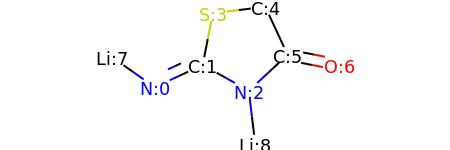

HETATM    1  N1  UNL     1      -2.162  -0.637   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.801  -0.007   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       0.509  -0.738   0.000  1.00  0.00           N  
HETATM    4  S1  UNL     1      -0.511   1.465   0.000  1.00  0.00           S  
HETATM    5  C2  UNL     1       0.978   1.644   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.609   0.282   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1       3.080  -0.008   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1      -3.389   0.226   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1       0.688  -2.227   0.000  1.00  0.00          LI  
CONECT    1    2    2    8
CONECT    2    3    4
CONECT    3    6    9
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found primary alcohol
found primary amine


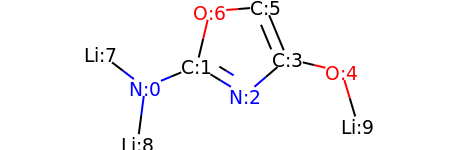

HETATM    1  N1  UNL     1      -2.238  -0.417   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.854   0.160   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       0.427  -0.622   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.566   0.354   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1       3.025   0.007   0.000  1.00  0.00           O  
HETATM    6  C3  UNL     1       0.989   1.739   0.000  1.00  0.00           C  
HETATM    7  O2  UNL     1      -0.506   1.619   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1      -3.430   0.495   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1      -2.432  -1.904   0.000  1.00  0.00          LI  
HETATM   10 LI3  UNL     1       3.453  -1.431   0.000  1.00  0.00          LI  
CONECT    1    2    8    9
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    6    6
CONECT    5   10
CONECT    6    7
END

search for patterns ...
found imine
found secondary a

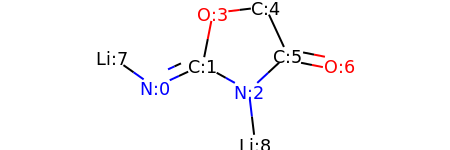

HETATM    1  N1  UNL     1      -2.162  -0.637   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.801  -0.007   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       0.509  -0.738   0.000  1.00  0.00           N  
HETATM    4  O1  UNL     1      -0.511   1.465   0.000  1.00  0.00           O  
HETATM    5  C2  UNL     1       0.978   1.644   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.609   0.282   0.000  1.00  0.00           C  
HETATM    7  O2  UNL     1       3.080  -0.008   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1      -3.389   0.226   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1       0.688  -2.227   0.000  1.00  0.00          LI  
CONECT    1    2    2    8
CONECT    2    3    4
CONECT    3    6    9
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found primary alcohol
found primary amine


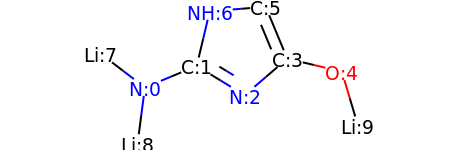

HETATM    1  N1  UNL     1      -2.238  -0.417   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.854   0.160   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       0.427  -0.622   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.566   0.354   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1       3.025   0.007   0.000  1.00  0.00           O  
HETATM    6  C3  UNL     1       0.989   1.739   0.000  1.00  0.00           C  
HETATM    7  N3  UNL     1      -0.506   1.619   0.000  1.00  0.00           N  
HETATM    8 LI1  UNL     1      -3.430   0.495   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1      -2.432  -1.904   0.000  1.00  0.00          LI  
HETATM   10 LI3  UNL     1       3.453  -1.431   0.000  1.00  0.00          LI  
CONECT    1    2    8    9
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    6    6
CONECT    5   10
CONECT    6    7
END

search for patterns ...
found imine
found secondary a

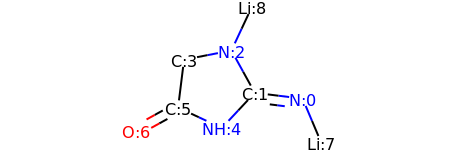

HETATM    1  N1  UNL     1       2.217  -0.243   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.728  -0.058   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       0.003   1.255   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.470   0.971   0.000  1.00  0.00           C  
HETATM    5  N3  UNL     1      -0.296  -1.153   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -1.655  -0.517   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1      -2.968  -1.242   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1       2.801  -1.625   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1       0.640   2.613   0.000  1.00  0.00          LI  
CONECT    1    2    2    8
CONECT    2    3    5
CONECT    3    4    9
CONECT    4    6
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found primary amine


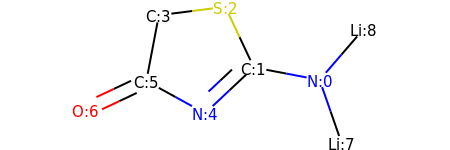

HETATM    1  N1  UNL     1       1.933  -0.184   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.460   0.097   0.000  1.00  0.00           C  
HETATM    3  S1  UNL     1      -0.179   1.454   0.000  1.00  0.00           S  
HETATM    4  C2  UNL     1      -1.667   1.266   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -0.633  -0.930   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -1.948  -0.208   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1      -3.305  -0.847   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1       2.427  -1.600   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1       2.913   0.952   0.000  1.00  0.00          LI  
CONECT    1    2    8    9
CONECT    2    3    5    5
CONECT    3    4
CONECT    4    6
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...
found primary alcohol
found primary amine


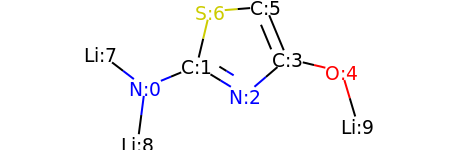

HETATM    1  N1  UNL     1      -2.238  -0.417   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.854   0.160   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       0.427  -0.622   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.566   0.354   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1       3.025   0.007   0.000  1.00  0.00           O  
HETATM    6  C3  UNL     1       0.989   1.739   0.000  1.00  0.00           C  
HETATM    7  S1  UNL     1      -0.506   1.619   0.000  1.00  0.00           S  
HETATM    8 LI1  UNL     1      -3.430   0.495   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1      -2.432  -1.904   0.000  1.00  0.00          LI  
HETATM   10 LI3  UNL     1       3.453  -1.431   0.000  1.00  0.00          LI  
CONECT    1    2    8    9
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    6    6
CONECT    5   10
CONECT    6    7
END

#################
#################
search for patter

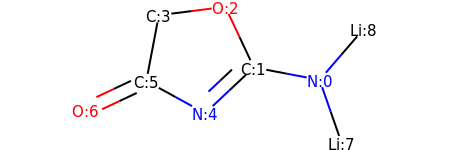

HETATM    1  N1  UNL     1       1.933  -0.184   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.460   0.097   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -0.179   1.454   0.000  1.00  0.00           O  
HETATM    4  C2  UNL     1      -1.667   1.266   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -0.633  -0.930   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -1.948  -0.208   0.000  1.00  0.00           C  
HETATM    7  O2  UNL     1      -3.305  -0.847   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1       2.427  -1.600   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1       2.913   0.952   0.000  1.00  0.00          LI  
CONECT    1    2    8    9
CONECT    2    3    5    5
CONECT    3    4
CONECT    4    6
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...
found primary alcohol
found primary amine


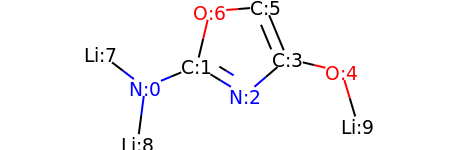

HETATM    1  N1  UNL     1      -2.238  -0.417   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.854   0.160   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       0.427  -0.622   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.566   0.354   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1       3.025   0.007   0.000  1.00  0.00           O  
HETATM    6  C3  UNL     1       0.989   1.739   0.000  1.00  0.00           C  
HETATM    7  O2  UNL     1      -0.506   1.619   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1      -3.430   0.495   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1      -2.432  -1.904   0.000  1.00  0.00          LI  
HETATM   10 LI3  UNL     1       3.453  -1.431   0.000  1.00  0.00          LI  
CONECT    1    2    8    9
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    6    6
CONECT    5   10
CONECT    6    7
END

#################
#################
search for patter

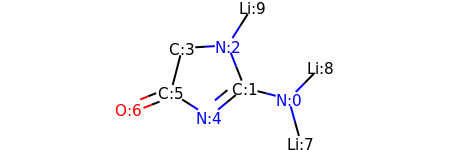

HETATM    1  N1  UNL     1       1.845  -0.581   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.393  -0.206   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.157   1.190   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.654   1.098   0.000  1.00  0.00           C  
HETATM    5  N3  UNL     1      -0.764  -1.160   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -2.030  -0.354   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1      -3.425  -0.904   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1       2.246  -2.027   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1       2.897   0.488   0.000  1.00  0.00          LI  
HETATM   10 LI3  UNL     1       0.649   2.455   0.000  1.00  0.00          LI  
CONECT    1    2    8    9
CONECT    2    3    5    5
CONECT    3    4   10
CONECT    4    6
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...
found primary alcohol
found p

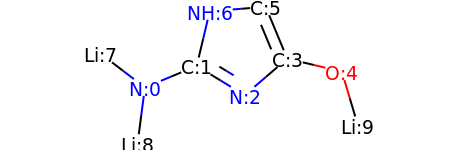

HETATM    1  N1  UNL     1      -2.238  -0.417   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.854   0.160   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       0.427  -0.622   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.566   0.354   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1       3.025   0.007   0.000  1.00  0.00           O  
HETATM    6  C3  UNL     1       0.989   1.739   0.000  1.00  0.00           C  
HETATM    7  N3  UNL     1      -0.506   1.619   0.000  1.00  0.00           N  
HETATM    8 LI1  UNL     1      -3.430   0.495   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1      -2.432  -1.904   0.000  1.00  0.00          LI  
HETATM   10 LI3  UNL     1       3.453  -1.431   0.000  1.00  0.00          LI  
CONECT    1    2    8    9
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    6    6
CONECT    5   10
CONECT    6    7
END

#################
#################
search for patter

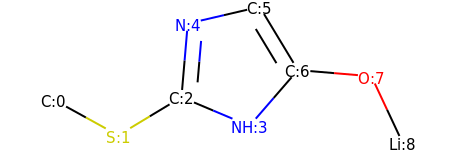

HETATM    1  C1  UNL     1      -3.701  -0.269   0.000  1.00  0.00           C  
HETATM    2  S1  UNL     1      -2.388  -0.993   0.000  1.00  0.00           S  
HETATM    3  C2  UNL     1      -1.104  -0.218   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       0.278  -0.801   0.000  1.00  0.00           N  
HETATM    5  N2  UNL     1      -0.976   1.277   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       0.485   1.617   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       1.260   0.333   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.755   0.206   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1       3.391  -1.152   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3
CONECT    3    4    5    5
CONECT    4    7
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9
END

search for patterns ...
found secondary amine


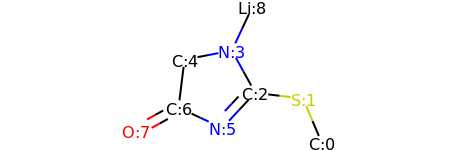

HETATM    1  C1  UNL     1       2.801  -1.625   0.000  1.00  0.00           C  
HETATM    2  S1  UNL     1       2.217  -0.243   0.000  1.00  0.00           S  
HETATM    3  C2  UNL     1       0.728  -0.058   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       0.003   1.255   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -1.470   0.971   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -0.296  -1.153   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1      -1.655  -0.517   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.968  -1.242   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1       0.640   2.613   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3
CONECT    3    4    6    6
CONECT    4    5    9
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


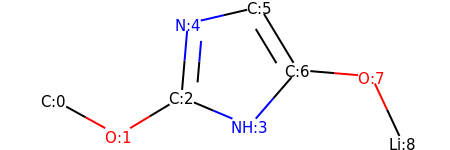

HETATM    1  C1  UNL     1      -3.701  -0.269   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -2.388  -0.993   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -1.104  -0.218   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       0.278  -0.801   0.000  1.00  0.00           N  
HETATM    5  N2  UNL     1      -0.976   1.277   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       0.485   1.617   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       1.260   0.333   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1       2.755   0.206   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1       3.391  -1.152   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3
CONECT    3    4    5    5
CONECT    4    7
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9
END

search for patterns ...
found secondary amine


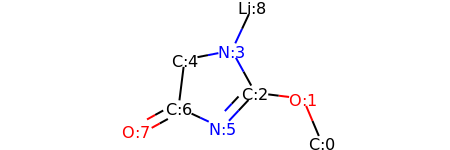

HETATM    1  C1  UNL     1       2.801  -1.625   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1       2.217  -0.243   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1       0.728  -0.058   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       0.003   1.255   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -1.470   0.971   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -0.296  -1.153   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1      -1.655  -0.517   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1      -2.968  -1.242   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1       0.640   2.613   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3
CONECT    3    4    6    6
CONECT    4    5    9
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol
found primary amine


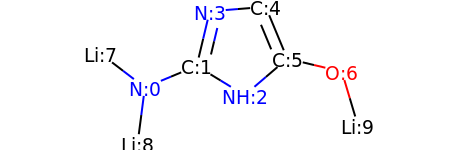

HETATM    1  N1  UNL     1      -2.238  -0.417   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.854   0.160   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       0.427  -0.622   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1      -0.506   1.619   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       0.989   1.739   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.566   0.354   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1       3.025   0.007   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1      -3.430   0.495   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1      -2.432  -1.904   0.000  1.00  0.00          LI  
HETATM   10 LI3  UNL     1       3.453  -1.431   0.000  1.00  0.00          LI  
CONECT    1    2    8    9
CONECT    2    3    4    4
CONECT    3    6
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7   10
END

search for patterns ...
found primary ami

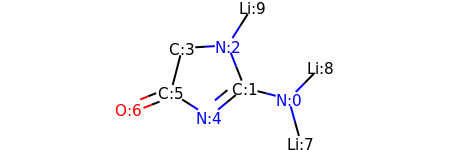

HETATM    1  N1  UNL     1       1.845  -0.581   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.393  -0.206   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.157   1.190   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.654   1.098   0.000  1.00  0.00           C  
HETATM    5  N3  UNL     1      -0.764  -1.160   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -2.030  -0.354   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1      -3.425  -0.904   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1       2.246  -2.027   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1       2.897   0.488   0.000  1.00  0.00          LI  
HETATM   10 LI3  UNL     1       0.649   2.455   0.000  1.00  0.00          LI  
CONECT    1    2    8    9
CONECT    2    3    5    5
CONECT    3    4   10
CONECT    4    6
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patter

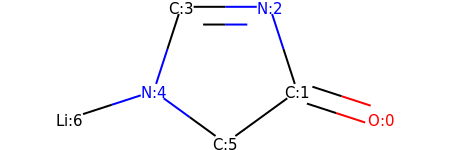

HETATM    1  O1  UNL     1       2.640  -0.613   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.214  -0.149   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.750   1.277   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.750   1.277   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.214  -0.149   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -0.000  -1.031   0.000  1.00  0.00           C  
HETATM    7 LI1  UNL     1      -2.640  -0.613   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    6    7
END

search for patterns ...
found primary alcohol


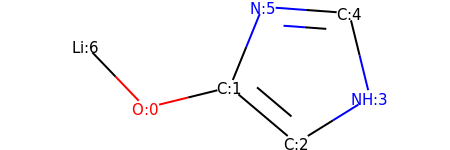

HETATM    1  O1  UNL     1      -1.777  -0.628   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.320  -0.270   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.826  -1.238   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       2.100  -0.447   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       1.742   1.010   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1       0.246   1.119   0.000  1.00  0.00           N  
HETATM    7 LI1  UNL     1      -2.816   0.454   0.000  1.00  0.00          LI  
CONECT    1    2    7
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6    6
END

#################
#################
search for patterns ...
found primary alcohol


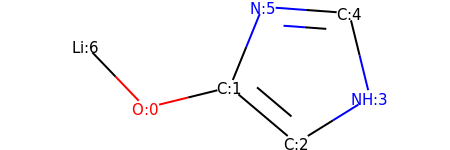

HETATM    1  O1  UNL     1      -1.777  -0.628   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.320  -0.270   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.826  -1.238   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       2.100  -0.447   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       1.742   1.010   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1       0.246   1.119   0.000  1.00  0.00           N  
HETATM    7 LI1  UNL     1      -2.816   0.454   0.000  1.00  0.00          LI  
CONECT    1    2    7
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6    6
END

search for patterns ...
found secondary amine


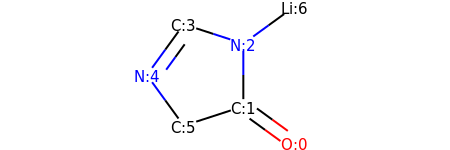

HETATM    1  O1  UNL     1       1.604  -1.632   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.391  -0.750   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.391   0.750   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.036   1.214   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.918   0.000   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -1.036  -1.214   0.000  1.00  0.00           C  
HETATM    7 LI1  UNL     1       1.604   1.632   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    7
CONECT    4    5    5
CONECT    5    6
END

#################
#################
search for patterns ...
found primary alcohol
found primary amine


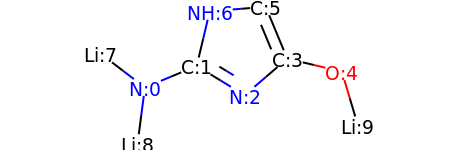

HETATM    1  N1  UNL     1      -2.238  -0.417   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.854   0.160   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       0.427  -0.622   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.566   0.354   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1       3.025   0.007   0.000  1.00  0.00           O  
HETATM    6  C3  UNL     1       0.989   1.739   0.000  1.00  0.00           C  
HETATM    7  N3  UNL     1      -0.506   1.619   0.000  1.00  0.00           N  
HETATM    8 LI1  UNL     1      -3.430   0.495   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1      -2.432  -1.904   0.000  1.00  0.00          LI  
HETATM   10 LI3  UNL     1       3.453  -1.431   0.000  1.00  0.00          LI  
CONECT    1    2    8    9
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    6    6
CONECT    5   10
CONECT    6    7
END

search for patterns ...
found primary amine
found sec

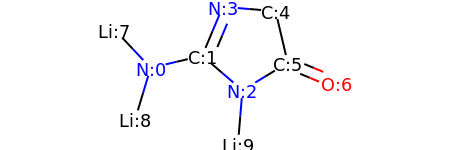

HETATM    1  N1  UNL     1      -1.978  -0.028   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.518   0.317   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       0.618  -0.662   0.000  1.00  0.00           N  
HETATM    4  N3  UNL     1       0.061   1.700   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       1.556   1.576   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.900   0.116   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1       3.284  -0.463   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1      -3.007   1.065   0.000  1.00  0.00          LI  
HETATM    9 LI2  UNL     1      -2.410  -1.464   0.000  1.00  0.00          LI  
HETATM   10 LI3  UNL     1       0.494  -2.157   0.000  1.00  0.00          LI  
CONECT    1    2    8    9
CONECT    2    3    4    4
CONECT    3    6   10
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patter

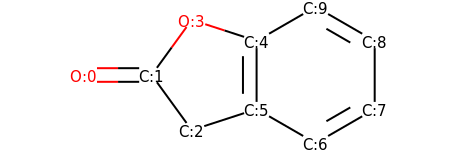

HETATM    1  O1  UNL     1      -3.691  -0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.191  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.309  -1.214   0.000  1.00  0.00           C  
HETATM    4  O2  UNL     1      -1.309   1.214   0.000  1.00  0.00           O  
HETATM    5  C3  UNL     1       0.118   0.750   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.118  -0.750   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.417  -1.500   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.716  -0.750   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.716   0.750   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.417   1.500   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    4
CONECT    3    6
CONECT    4    5
CONECT    5    6    6   10
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
CONECT    9   10   10
END

se

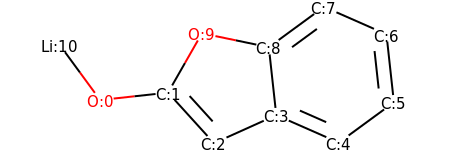

HETATM    1  O1  UNL     1      -3.255  -0.475   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.764  -0.312   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.755  -1.422   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.613  -0.806   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.986  -1.410   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.195  -0.524   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.032   0.968   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.659   1.572   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       0.449   0.685   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1      -1.019   0.990   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1      -4.142   0.735   0.000  1.00  0.00          LI  
CONECT    1    2   11
CONECT    2    3    3   10
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6

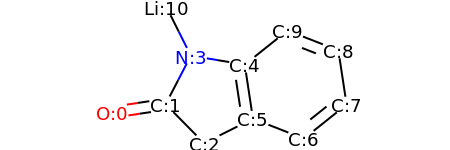

HETATM    1  O1  UNL     1      -3.454  -0.766   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.971  -0.541   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.917  -1.609   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.281   0.791   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.199   0.546   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.424  -0.937   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.820  -1.484   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.993  -0.548   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.768   0.935   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.371   1.482   0.000  1.00  0.00           C  
HETATM   11 LI1  UNL     1      -1.952   2.132   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3    4
CONECT    3    6
CONECT    4    5   11
CONECT    5    6    6   10

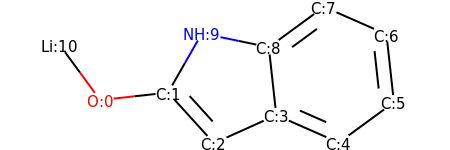

HETATM    1  O1  UNL     1      -3.255  -0.475   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.764  -0.312   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.755  -1.422   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.613  -0.806   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.986  -1.410   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.195  -0.524   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.032   0.968   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.659   1.572   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       0.449   0.685   0.000  1.00  0.00           C  
HETATM   10  N1  UNL     1      -1.019   0.990   0.000  1.00  0.00           N  
HETATM   11 LI1  UNL     1      -4.142   0.735   0.000  1.00  0.00          LI  
CONECT    1    2   11
CONECT    2    3    3   10
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6

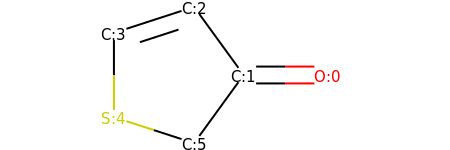

HETATM    1  O1  UNL     1       2.313  -0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.813  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.068   1.214   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.495   0.750   0.000  1.00  0.00           C  
HETATM    5  S1  UNL     1      -1.495  -0.750   0.000  1.00  0.00           S  
HETATM    6  C4  UNL     1      -0.068  -1.214   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    6
END

search for patterns ...
found primary alcohol


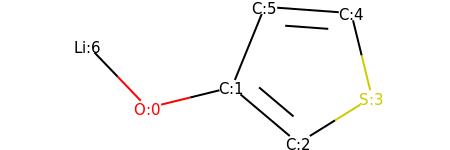

HETATM    1  O1  UNL     1      -1.777  -0.628   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.320  -0.270   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.826  -1.238   0.000  1.00  0.00           C  
HETATM    4  S1  UNL     1       2.100  -0.447   0.000  1.00  0.00           S  
HETATM    5  C3  UNL     1       1.742   1.010   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.246   1.119   0.000  1.00  0.00           C  
HETATM    7 LI1  UNL     1      -2.816   0.454   0.000  1.00  0.00          LI  
CONECT    1    2    7
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6    6
END

#################
#################
search for patterns ...
found secondary amine


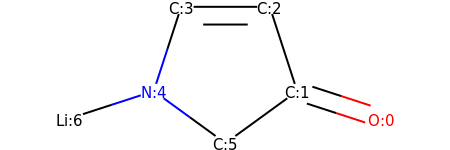

HETATM    1  O1  UNL     1       2.640  -0.613   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.214  -0.149   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.750   1.277   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.750   1.277   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -1.214  -0.149   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -0.000  -1.031   0.000  1.00  0.00           C  
HETATM    7 LI1  UNL     1      -2.640  -0.613   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    6    7
END

search for patterns ...
found primary alcohol


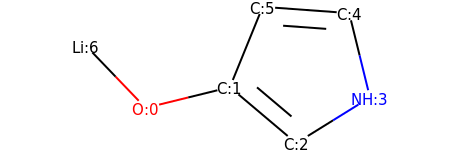

HETATM    1  O1  UNL     1      -1.777  -0.628   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.320  -0.270   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.826  -1.238   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       2.100  -0.447   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       1.742   1.010   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.246   1.119   0.000  1.00  0.00           C  
HETATM    7 LI1  UNL     1      -2.816   0.454   0.000  1.00  0.00          LI  
CONECT    1    2    7
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6    6
END

#################
#################
search for patterns ...


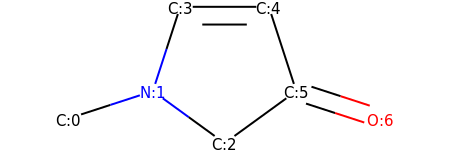

HETATM    1  C1  UNL     1      -2.640  -0.613   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -1.214  -0.149   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -0.000  -1.031   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.750   1.277   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.750   1.277   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.214  -0.149   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1       2.640  -0.613   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    4
CONECT    3    6
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...
found primary alcohol


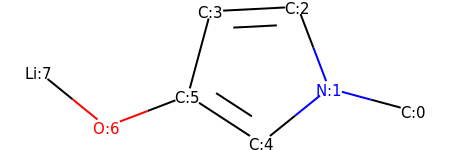

HETATM    1  C1  UNL     1       3.139  -0.502   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       1.691  -0.112   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       1.155   1.289   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.343   1.213   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.524  -1.054   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -0.733  -0.236   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1      -2.134  -0.771   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1      -3.299   0.174   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    5
CONECT    3    4    4
CONECT    4    6
CONECT    5    6    6
CONECT    6    7
CONECT    7    8
END

#################
#################
search for patterns ...


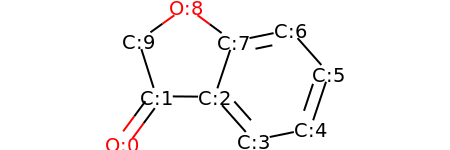

HETATM    1  O1  UNL     1      -2.615  -1.633   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.724  -0.426   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.224  -0.438   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.771  -1.560   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.240  -1.259   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.715   0.164   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.720   1.286   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.250   0.985   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1      -0.956   1.876   0.000  1.00  0.00           O  
HETATM   10  C8  UNL     1      -2.177   1.004   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   10
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
CONECT    9   10
END

se

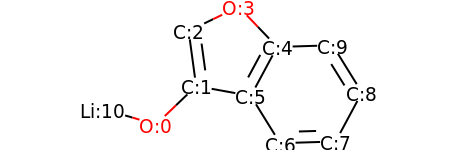

HETATM    1  O1  UNL     1      -2.465  -1.096   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.381  -0.058   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.583   1.428   0.000  1.00  0.00           C  
HETATM    4  O2  UNL     1      -0.232   2.080   0.000  1.00  0.00           O  
HETATM    5  C3  UNL     1       0.805   0.996   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.095  -0.325   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.884  -1.601   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.384  -1.555   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.094  -0.234   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       2.304   1.042   0.000  1.00  0.00           C  
HETATM   11 LI1  UNL     1      -3.905  -0.676   0.000  1.00  0.00          LI  
CONECT    1    2   11
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6    6   10

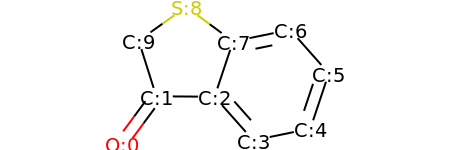

HETATM    1  O1  UNL     1      -2.615  -1.633   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.724  -0.426   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.224  -0.438   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.771  -1.560   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.240  -1.259   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.715   0.164   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.720   1.286   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.250   0.985   0.000  1.00  0.00           C  
HETATM    9  S1  UNL     1      -0.956   1.876   0.000  1.00  0.00           S  
HETATM   10  C8  UNL     1      -2.177   1.004   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   10
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
CONECT    9   10
END

se

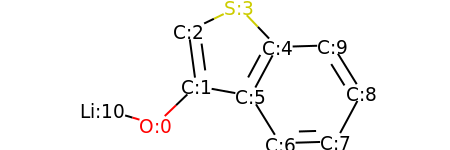

HETATM    1  O1  UNL     1      -2.465  -1.096   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.381  -0.058   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.583   1.428   0.000  1.00  0.00           C  
HETATM    4  S1  UNL     1      -0.232   2.080   0.000  1.00  0.00           S  
HETATM    5  C3  UNL     1       0.805   0.996   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.095  -0.325   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.884  -1.601   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.384  -1.555   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.094  -0.234   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       2.304   1.042   0.000  1.00  0.00           C  
HETATM   11 LI1  UNL     1      -3.905  -0.676   0.000  1.00  0.00          LI  
CONECT    1    2   11
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6    6   10

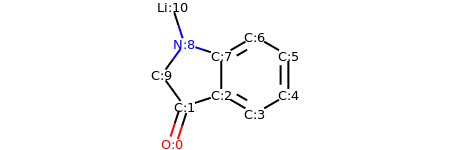

HETATM    1  O1  UNL     1      -1.786  -2.640   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.322  -1.214   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.104  -0.750   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.403  -1.500   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.702  -0.750   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.702   0.750   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.403   1.500   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.104   0.750   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -1.322   1.214   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -2.204   0.000   0.000  1.00  0.00           C  
HETATM   11 LI1  UNL     1      -1.786   2.640   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3   10
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6    6

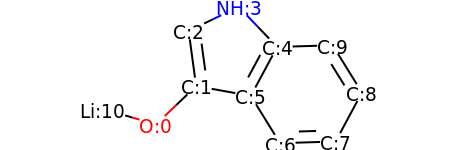

HETATM    1  O1  UNL     1      -2.465  -1.096   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.381  -0.058   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.583   1.428   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -0.232   2.080   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.805   0.996   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.095  -0.325   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.884  -1.601   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.384  -1.555   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.094  -0.234   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       2.304   1.042   0.000  1.00  0.00           C  
HETATM   11 LI1  UNL     1      -3.905  -0.676   0.000  1.00  0.00          LI  
CONECT    1    2   11
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6    6   10

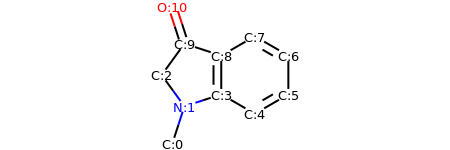

HETATM    1  C1  UNL     1      -1.786  -2.640   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -1.322  -1.214   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -2.204  -0.000   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.104  -0.750   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.403  -1.500   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.702  -0.750   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.702   0.750   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.403   1.500   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       0.104   0.750   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.322   1.214   0.000  1.00  0.00           C  
HETATM   11  O1  UNL     1      -1.786   2.640   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    4
CONECT    3   10
CONECT    4    5    9    9
CONECT    5    6    6
CONE

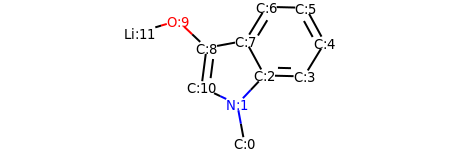

HETATM    1  C1  UNL     1       0.050  -3.259   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -0.225  -1.784   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       0.806  -0.695   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.305  -0.733   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.088   0.547   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.371   1.864   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.871   1.902   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.089   0.622   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -1.386   0.347   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1      -2.475   1.378   0.000  1.00  0.00           O  
HETATM   11  C9  UNL     1      -1.580  -1.140   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -3.913   0.951   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

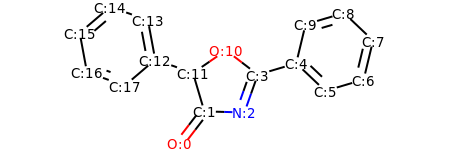

HETATM    1  O1  UNL     1      -1.620  -2.960   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.706  -1.770   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.793  -1.810   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.294  -0.396   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.732   0.030   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       3.820  -1.003   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       5.259  -0.578   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       5.609   0.881   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       4.521   1.914   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.083   1.488   0.000  1.00  0.00           C  
HETATM   11  O2  UNL     1       0.104   0.517   0.000  1.00  0.00           O  
HETATM   12  C9  UNL     1      -1.132  -0.332   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

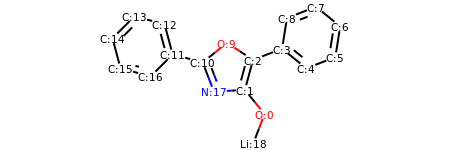

HETATM    1  O1  UNL     1       1.634  -2.691   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.690  -1.525   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.079  -0.076   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.480   0.461   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.645  -0.483   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       5.046   0.054   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       5.281   1.535   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       4.116   2.480   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.715   1.943   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1      -0.178   0.742   0.000  1.00  0.00           O  
HETATM   11  C9  UNL     1      -1.345  -0.202   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -2.793   0.187   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

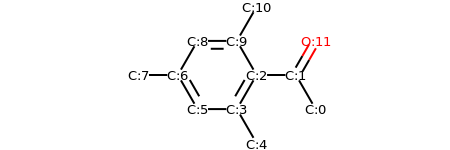

HETATM    1  C1  UNL     1       2.875  -1.299   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.125   0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.625   0.000   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.125  -1.299   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       0.625  -2.598   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -1.625  -1.299   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -2.375   0.000   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1      -3.875   0.000   0.000  1.00  0.00           C  
HETATM    9  C9  UNL     1      -1.625   1.299   0.000  1.00  0.00           C  
HETATM   10  C10 UNL     1      -0.125   1.299   0.000  1.00  0.00           C  
HETATM   11  C11 UNL     1       0.625   2.598   0.000  1.00  0.00           C  
HETATM   12  O1  UNL     1       2.875   1.299   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2

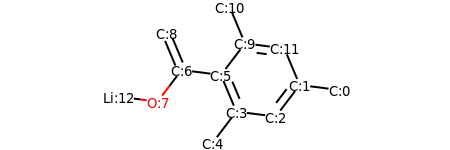

HETATM    1  C1  UNL     1       4.191  -0.431   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.703  -0.242   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       1.795  -1.437   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.307  -1.248   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -0.601  -2.442   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -0.274   0.135   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -1.762   0.324   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.669  -0.870   0.000  1.00  0.00           O  
HETATM    9  C8  UNL     1      -2.342   1.707   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       0.634   1.330   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       0.054   2.713   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1       2.122   1.141   0.000  1.00  0.00           C  
HETATM   13 LI1  UNL     1  

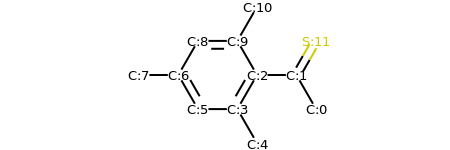

HETATM    1  C1  UNL     1       2.875  -1.299   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.125   0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.625   0.000   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.125  -1.299   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       0.625  -2.598   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -1.625  -1.299   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -2.375   0.000   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1      -3.875   0.000   0.000  1.00  0.00           C  
HETATM    9  C9  UNL     1      -1.625   1.299   0.000  1.00  0.00           C  
HETATM   10  C10 UNL     1      -0.125   1.299   0.000  1.00  0.00           C  
HETATM   11  C11 UNL     1       0.625   2.598   0.000  1.00  0.00           C  
HETATM   12  S1  UNL     1       2.875   1.299   0.000  1.00  0.00           S  
CONECT    1    2
CONECT    2

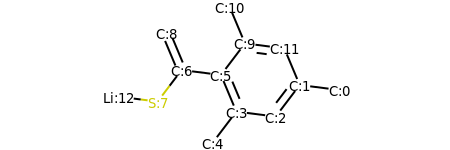

HETATM    1  C1  UNL     1       4.191  -0.431   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.703  -0.242   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       1.795  -1.437   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.307  -1.248   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -0.601  -2.442   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -0.274   0.135   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -1.762   0.324   0.000  1.00  0.00           C  
HETATM    8  S1  UNL     1      -2.669  -0.870   0.000  1.00  0.00           S  
HETATM    9  C8  UNL     1      -2.342   1.707   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       0.634   1.330   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       0.054   2.713   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1       2.122   1.141   0.000  1.00  0.00           C  
HETATM   13 LI1  UNL     1  

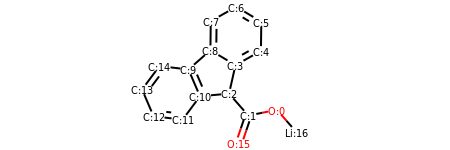

HETATM    1  O1  UNL     1       2.954  -1.513   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.483  -1.806   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.494  -0.679   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.824   0.784   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.133   1.518   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.152   3.018   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.863   3.784   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -0.445   3.051   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -0.465   1.551   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.592   0.562   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -1.000  -0.816   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -1.897  -2.018   0.000  1.00  0.00           C  
HETATM   13  C12 UNL     1  

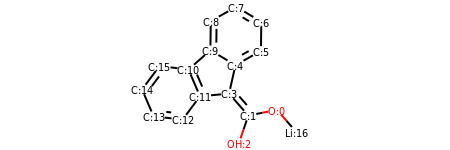

HETATM    1  O1  UNL     1       2.954  -1.513   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.483  -1.806   0.000  1.00  0.00           C  
HETATM    3  O2  UNL     1       1.001  -3.227   0.000  1.00  0.00           O  
HETATM    4  C2  UNL     1       0.494  -0.679   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.824   0.784   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.133   1.518   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.152   3.018   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       0.863   3.784   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -0.445   3.051   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -0.465   1.551   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -1.592   0.562   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -1.000  -0.816   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

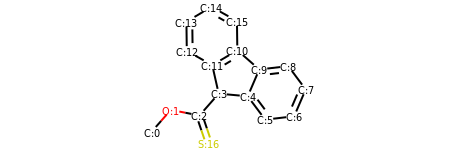

HETATM    1  C1  UNL     1      -3.943  -2.641   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -2.954  -1.513   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -1.483  -1.806   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.494  -0.679   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.000  -0.816   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.897  -2.018   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.387  -1.842   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.979  -0.464   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       3.082   0.738   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       1.592   0.562   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       0.465   1.551   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -0.824   0.784   0.000  1.00  0.00           C  
HETATM   13  C12 UNL     1  

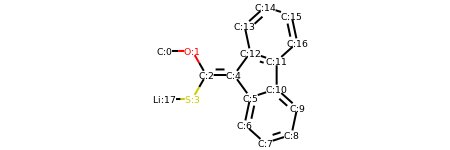

HETATM    1  C1  UNL     1      -4.331   1.299   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -2.831   1.299   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -2.081   0.000   0.000  1.00  0.00           C  
HETATM    4  S1  UNL     1      -2.831  -1.299   0.000  1.00  0.00           S  
HETATM    5  C3  UNL     1      -0.581   0.000   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.301  -1.214   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -0.011  -2.681   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.104  -3.684   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.530  -3.221   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       2.842  -1.754   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.727  -0.750   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       1.727   0.750   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

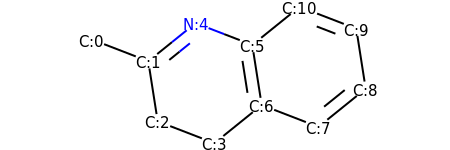

HETATM    1  C1  UNL     1      -3.711   0.800   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.312   0.259   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -2.080  -1.223   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.680  -1.763   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -1.144   1.201   0.000  1.00  0.00           N  
HETATM    6  C5  UNL     1       0.255   0.661   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.487  -0.821   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.886  -1.361   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       3.054  -0.419   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       2.822   1.063   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       1.423   1.603   0.000  1.00  0.00           C  
CONECT    1    2
CONECT    2    3    5    5
CONECT    3    4
CONECT    4    7
CONECT    5    6
CONECT    6   

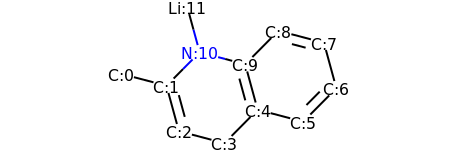

HETATM    1  C1  UNL     1      -3.638   0.173   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.187  -0.208   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -1.793  -1.655   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.342  -2.037   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       0.714  -0.971   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       2.165  -1.353   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1       3.220  -0.287   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1       2.825   1.160   0.000  1.00  0.00           C  
HETATM    9  C9  UNL     1       1.375   1.541   0.000  1.00  0.00           C  
HETATM   10  C10 UNL     1       0.319   0.476   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1      -1.132   0.857   0.000  1.00  0.00           N  
HETATM   12 LI1  UNL     1      -1.526   2.304   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

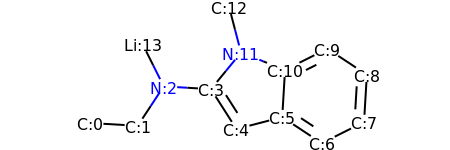

HETATM    1  C1  UNL     1      -4.830  -1.109   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -3.333  -1.198   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.507   0.054   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -1.009  -0.036   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.201  -1.300   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.250  -0.922   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.502  -1.748   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.844  -1.077   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       3.933   0.421   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       2.681   1.247   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       1.340   0.575   0.000  1.00  0.00           C  
HETATM   12  N2  UNL     1      -0.057   1.123   0.000  1.00  0.00           N  
HETATM   13  C11 UNL     1  

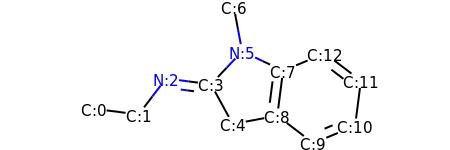

HETATM    1  C1  UNL     1      -5.131  -0.651   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -3.644  -0.843   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.734   0.350   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -1.246   0.158   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.527  -1.159   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -0.216   1.248   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1      -0.493   2.722   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.139   0.606   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.947  -0.882   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       2.140  -1.792   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       3.524  -1.214   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       3.716   0.273   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

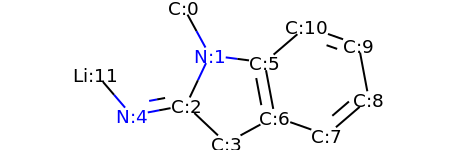

HETATM    1  C1  UNL     1      -1.660   2.041   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -0.941   0.724   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -1.584  -0.631   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.493  -1.661   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -3.058  -0.908   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       0.547   0.532   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.823  -0.943   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.238  -1.440   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.377  -0.463   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.100   1.011   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.685   1.508   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -4.035   0.230   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

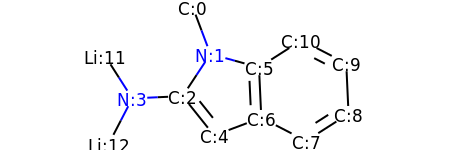

HETATM    1  C1  UNL     1      -1.063   2.391   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -0.535   0.987   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -1.360  -0.265   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -2.859  -0.334   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -0.424  -1.437   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.911   0.589   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.980  -0.909   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.311  -1.599   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.575  -0.791   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.507   0.708   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       2.175   1.398   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -3.667   0.930   0.000  1.00  0.00          LI  
HETATM   13 LI2  UNL     1  

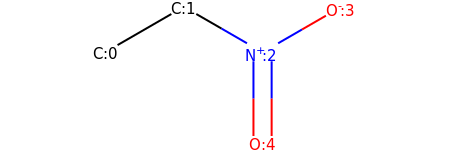

HETATM    1  C1  UNL     1      -2.078   0.000   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.779   0.750   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.520  -0.000   0.000  1.00  0.00           N1+
HETATM    4  O1  UNL     1       1.819   0.750   0.000  1.00  0.00           O1-
HETATM    5  O2  UNL     1       0.520  -1.500   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3
CONECT    3    4    5    5
END

search for patterns ...
found primary alcohol


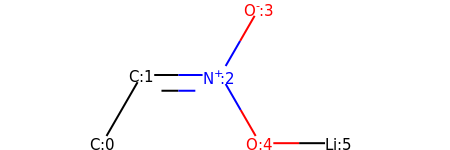

HETATM    1  C1  UNL     1      -2.250  -0.866   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.500   0.433   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.000   0.433   0.000  1.00  0.00           N1+
HETATM    4  O1  UNL     1       0.750   1.732   0.000  1.00  0.00           O1-
HETATM    5  O2  UNL     1       0.750  -0.866   0.000  1.00  0.00           O  
HETATM    6 LI1  UNL     1       2.250  -0.866   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3
CONECT    3    4    5
CONECT    5    6
END

#################
#################
search for patterns ...


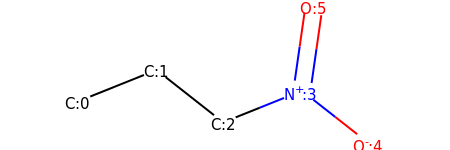

HETATM    1  C1  UNL     1      -2.875  -0.220   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.483   0.339   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.303  -0.588   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       1.089  -0.030   0.000  1.00  0.00           N1+
HETATM    5  O1  UNL     1       2.269  -0.956   0.000  1.00  0.00           O1-
HETATM    6  O2  UNL     1       1.302   1.455   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3
CONECT    3    4
CONECT    4    5    6    6
END

search for patterns ...
found primary alcohol


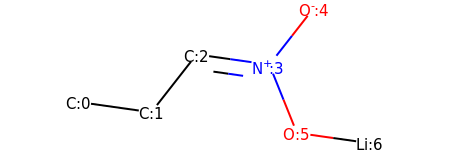

HETATM    1  C1  UNL     1      -3.287  -0.285   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.801  -0.495   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.877   0.686   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       0.608   0.476   0.000  1.00  0.00           N1+
HETATM    5  O1  UNL     1       1.533   1.657   0.000  1.00  0.00           O1-
HETATM    6  O2  UNL     1       1.169  -0.915   0.000  1.00  0.00           O  
HETATM    7 LI1  UNL     1       2.654  -1.125   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3
CONECT    3    4    4
CONECT    4    5    6
CONECT    6    7
END

#################
#################
search for patterns ...


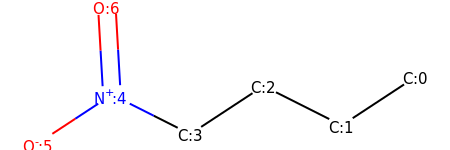

HETATM    1  C1  UNL     1       3.514   0.310   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.260  -0.514   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.920   0.160   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.334  -0.663   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -1.674   0.011   0.000  1.00  0.00           N1+
HETATM    6  O1  UNL     1      -2.927  -0.812   0.000  1.00  0.00           O1-
HETATM    7  O2  UNL     1      -1.760   1.509   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3
CONECT    3    4
CONECT    4    5
CONECT    5    6    7    7
END

search for patterns ...
found primary alcohol


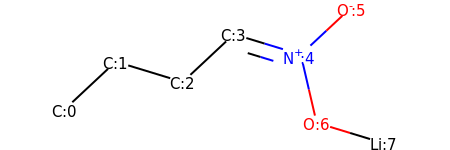

HETATM    1  C1  UNL     1      -3.839  -0.698   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.743   0.326   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -1.308  -0.111   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.212   0.913   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.223   0.476   0.000  1.00  0.00           N1+
HETATM    6  O1  UNL     1       2.319   1.500   0.000  1.00  0.00           O1-
HETATM    7  O2  UNL     1       1.562  -0.985   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1       2.997  -1.422   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3
CONECT    3    4
CONECT    4    5    5
CONECT    5    6    7
CONECT    7    8
END

#################
#################
search for patterns ...


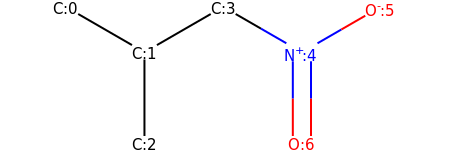

HETATM    1  C1  UNL     1      -2.598   0.857   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.299   0.107   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -1.299  -1.393   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.000   0.857   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.299   0.107   0.000  1.00  0.00           N1+
HETATM    6  O1  UNL     1       2.598   0.857   0.000  1.00  0.00           O1-
HETATM    7  O2  UNL     1       1.299  -1.393   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    4
CONECT    4    5
CONECT    5    6    7    7
END

search for patterns ...
found primary alcohol


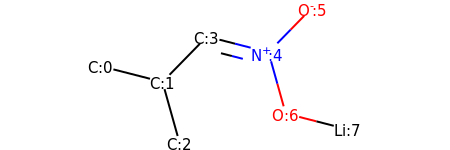

HETATM    1  C1  UNL     1      -3.118   0.295   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.665  -0.077   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -1.260  -1.521   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.616   0.996   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.837   0.624   0.000  1.00  0.00           N1+
HETATM    6  O1  UNL     1       1.886   1.696   0.000  1.00  0.00           O1-
HETATM    7  O2  UNL     1       1.242  -0.821   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1       2.695  -1.193   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    4
CONECT    4    5    5
CONECT    5    6    7
CONECT    7    8
END

#################
#################
search for patterns ...


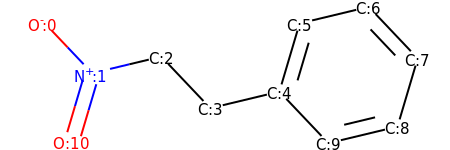

HETATM    1  O1  UNL     1      -4.209   1.176   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1      -3.176   0.088   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1      -1.718   0.438   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1      -0.685  -0.650   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.773  -0.300   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.199   1.138   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.658   1.488   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.690   0.400   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.264  -1.038   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.806  -1.388   0.000  1.00  0.00           C  
HETATM   11  O2  UNL     1      -3.602  -1.351   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3   11   11
CONECT    3    4
CONECT    4    5
CONECT    5    6    6   10
CONE

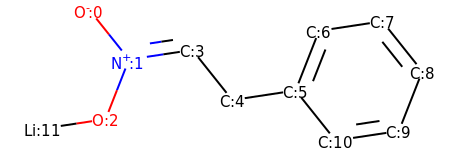

HETATM    1  O1  UNL     1      -3.660   1.637   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1      -2.725   0.465   0.000  1.00  0.00           N1+
HETATM    3  O2  UNL     1      -3.273  -0.932   0.000  1.00  0.00           O  
HETATM    4  C1  UNL     1      -1.242   0.688   0.000  1.00  0.00           C  
HETATM    5  C2  UNL     1      -0.306  -0.484   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.177  -0.260   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       1.725   1.136   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.208   1.360   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       4.143   0.187   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.596  -1.209   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       2.112  -1.433   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -4.756  -1.156   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

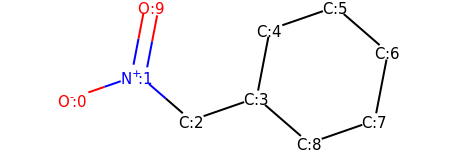

HETATM    1  O1  UNL     1      -3.799  -0.491   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1      -2.381   0.000   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1      -1.247  -0.982   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1       0.170  -0.491   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.454   0.982   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.871   1.473   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.005   0.491   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.721  -0.982   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.304  -1.473   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1      -2.098   1.473   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4
CONECT    4    5    9
CONECT    5    6
CONECT    6    7
CONECT    7    8
CONECT    8    9
END

search for patterns ...
found prim

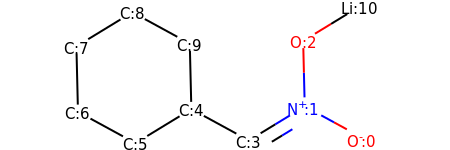

HETATM    1  O1  UNL     1       3.338  -1.284   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1       2.022  -0.565   0.000  1.00  0.00           N1+
HETATM    3  O2  UNL     1       1.986   0.934   0.000  1.00  0.00           O  
HETATM    4  C1  UNL     1       0.741  -1.346   0.000  1.00  0.00           C  
HETATM    5  C2  UNL     1      -0.576  -0.628   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1      -1.856  -1.409   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1      -3.173  -0.690   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1      -3.209   0.809   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1      -1.928   1.590   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1      -0.612   0.872   0.000  1.00  0.00           C  
HETATM   11 LI1  UNL     1       3.266   1.715   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    4    4
CONECT    3   11
CONECT    4    5
CONECT    5    6   10
CONECT   

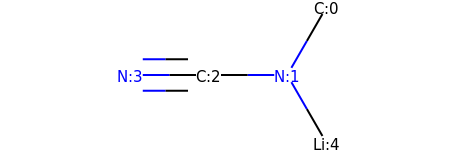

HETATM    1  C1  UNL     1       1.350   1.299   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       0.600  -0.000   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -0.900   0.000   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -2.400   0.000   0.000  1.00  0.00           N  
HETATM    5 LI1  UNL     1       1.350  -1.299   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    5
CONECT    3    4    4    4
END

search for patterns ...


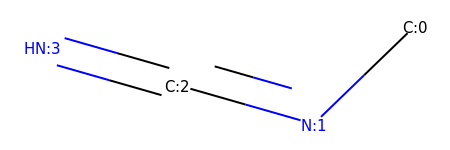

HETATM    1  C1  UNL     1       1.890   0.472   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       0.812  -0.570   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -0.630  -0.157   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -2.072   0.255   0.000  1.00  0.00           N  
CONECT    1    2
CONECT    2    3    3
CONECT    3    4    4
END

#################
#################
search for patterns ...


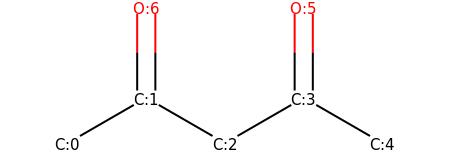

HETATM    1  C1  UNL     1      -2.598  -0.857   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.299  -0.107   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.000  -0.857   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       1.299  -0.107   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       2.598  -0.857   0.000  1.00  0.00           C  
HETATM    6  O1  UNL     1       1.299   1.393   0.000  1.00  0.00           O  
HETATM    7  O2  UNL     1      -1.299   1.393   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    7    7
CONECT    3    4
CONECT    4    5    6    6
END

search for patterns ...
found primary alcohol


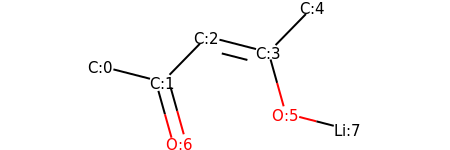

HETATM    1  C1  UNL     1      -3.118   0.295   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.665  -0.077   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.616   0.996   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.837   0.624   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       1.886   1.696   0.000  1.00  0.00           C  
HETATM    6  O1  UNL     1       1.242  -0.821   0.000  1.00  0.00           O  
HETATM    7  O2  UNL     1      -1.260  -1.521   0.000  1.00  0.00           O  
HETATM    8 LI1  UNL     1       2.695  -1.193   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    7    7
CONECT    3    4    4
CONECT    4    5    6
CONECT    6    8
END

#################
#################
search for patterns ...
found primary alcohol


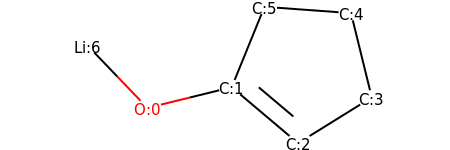

HETATM    1  O1  UNL     1      -1.777  -0.628   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.320  -0.270   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.826  -1.238   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.100  -0.447   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.742   1.010   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       0.246   1.119   0.000  1.00  0.00           C  
HETATM    7 LI1  UNL     1      -2.816   0.454   0.000  1.00  0.00          LI  
CONECT    1    2    7
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6
END

search for patterns ...


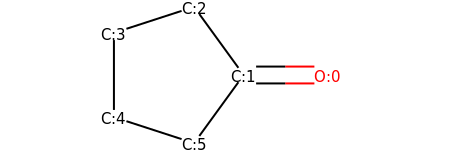

HETATM    1  O1  UNL     1       2.313  -0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.813  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.068   1.214   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.495   0.750   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.495  -0.750   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -0.068  -1.214   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6
END

#################
#################
search for patterns ...


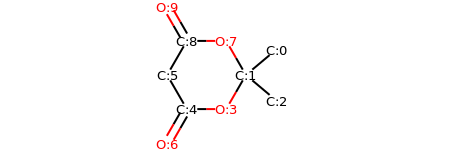

HETATM    1  C1  UNL     1       2.419   0.964   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.270  -0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       2.419  -0.964   0.000  1.00  0.00           C  
HETATM    4  O1  UNL     1       0.520  -1.299   0.000  1.00  0.00           O  
HETATM    5  C4  UNL     1      -0.980  -1.299   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.730   0.000   0.000  1.00  0.00           C  
HETATM    7  O2  UNL     1      -1.730  -2.598   0.000  1.00  0.00           O  
HETATM    8  O3  UNL     1       0.520   1.299   0.000  1.00  0.00           O  
HETATM    9  C6  UNL     1      -0.980   1.299   0.000  1.00  0.00           C  
HETATM   10  O4  UNL     1      -1.730   2.598   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    4    8
CONECT    4    5
CONECT    5    6    7    7
CONECT    6    9
CONECT    8    9
CONECT    9   10   10
END

search for patterns ...
found primary alc

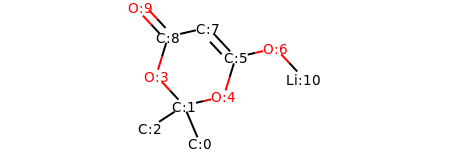

HETATM    1  C1  UNL     1      -0.150  -2.577   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.736  -1.196   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -1.995  -2.013   0.000  1.00  0.00           C  
HETATM    4  O1  UNL     1      -1.759  -0.099   0.000  1.00  0.00           O  
HETATM    5  O2  UNL     1       0.725  -0.859   0.000  1.00  0.00           O  
HETATM    6  C4  UNL     1       1.164   0.575   0.000  1.00  0.00           C  
HETATM    7  O3  UNL     1       2.626   0.913   0.000  1.00  0.00           O  
HETATM    8  C5  UNL     1       0.141   1.673   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1      -1.320   1.335   0.000  1.00  0.00           C  
HETATM   10  O4  UNL     1      -2.343   2.433   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1       3.648  -0.185   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    4    5
CONECT    4    9
CONECT    5    6
CONECT    6    7    8    8
CONE

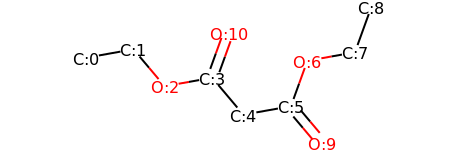

HETATM    1  C1  UNL     1      -4.994   0.428   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -3.517   0.692   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -2.551  -0.455   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -1.074  -0.192   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.107  -1.339   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.369  -1.075   0.000  1.00  0.00           C  
HETATM    7  O2  UNL     1       1.879   0.335   0.000  1.00  0.00           O  
HETATM    8  C6  UNL     1       3.356   0.599   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.866   2.010   0.000  1.00  0.00           C  
HETATM   10  O3  UNL     1       2.336  -2.222   0.000  1.00  0.00           O  
HETATM   11  O4  UNL     1      -0.564   1.219   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3
CONECT    3    4
CONECT    4    5   11   11
CONECT    5    6
CONECT    6   

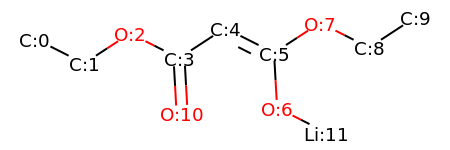

HETATM    1  C1  UNL     1      -5.453   0.572   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -4.114  -0.104   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -2.859   0.717   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -1.520   0.040   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.265   0.862   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.074   0.185   0.000  1.00  0.00           C  
HETATM    7  O2  UNL     1       1.157  -1.313   0.000  1.00  0.00           O  
HETATM    8  O3  UNL     1       2.329   1.006   0.000  1.00  0.00           O  
HETATM    9  C6  UNL     1       3.668   0.330   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       4.923   1.151   0.000  1.00  0.00           C  
HETATM   11  O4  UNL     1      -1.437  -1.457   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1       2.496  -1.989   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

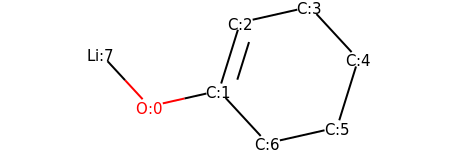

HETATM    1  O1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.159   1.129   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.305   1.459   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.322   0.357   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.876  -1.075   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.413  -1.405   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5
CONECT    5    6
CONECT    6    7
END

search for patterns ...


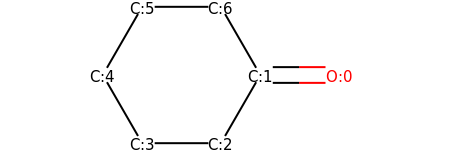

HETATM    1  O1  UNL     1       2.571   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.321  -1.299   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.179  -1.299   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.929   0.000   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.179   1.299   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4
CONECT    4    5
CONECT    5    6
CONECT    6    7
END

#################
#################
search for patterns ...


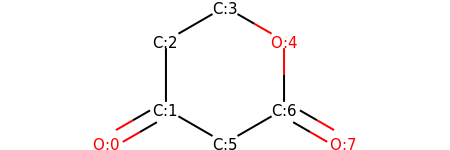

HETATM    1  O1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.299   1.125   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.000   1.875   0.000  1.00  0.00           C  
HETATM    5  O2  UNL     1       1.299   1.125   0.000  1.00  0.00           O  
HETATM    6  C4  UNL     1      -0.000  -1.125   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8  O3  UNL     1       2.598  -1.125   0.000  1.00  0.00           O  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...
found primary alcohol


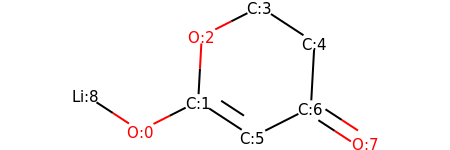

HETATM    1  O1  UNL     1      -2.221  -0.963   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.883  -0.285   0.000  1.00  0.00           C  
HETATM    3  O2  UNL     1      -0.801   1.213   0.000  1.00  0.00           O  
HETATM    4  C2  UNL     1       0.538   1.890   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.794   1.070   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.373  -1.106   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.711  -0.428   0.000  1.00  0.00           C  
HETATM    8  O3  UNL     1       2.967  -1.248   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.477  -0.142   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...


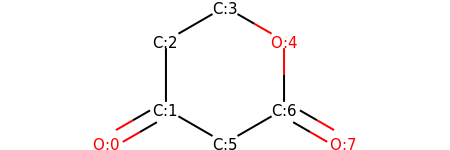

HETATM    1  O1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.299   1.125   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.000   1.875   0.000  1.00  0.00           C  
HETATM    5  O2  UNL     1       1.299   1.125   0.000  1.00  0.00           O  
HETATM    6  C4  UNL     1      -0.000  -1.125   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8  O3  UNL     1       2.598  -1.125   0.000  1.00  0.00           O  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...
found primary alcohol


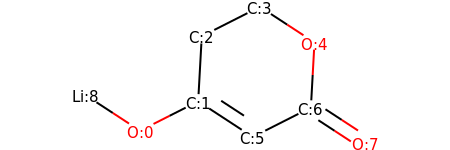

HETATM    1  O1  UNL     1      -2.221  -0.963   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.883  -0.285   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.801   1.213   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.538   1.890   0.000  1.00  0.00           C  
HETATM    5  O2  UNL     1       1.794   1.070   0.000  1.00  0.00           O  
HETATM    6  C4  UNL     1       0.373  -1.106   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.711  -0.428   0.000  1.00  0.00           C  
HETATM    8  O3  UNL     1       2.967  -1.248   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.477  -0.142   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


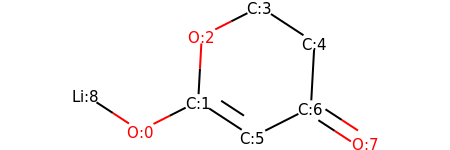

HETATM    1  O1  UNL     1      -2.221  -0.963   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.883  -0.285   0.000  1.00  0.00           C  
HETATM    3  O2  UNL     1      -0.801   1.213   0.000  1.00  0.00           O  
HETATM    4  C2  UNL     1       0.538   1.890   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.794   1.070   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.373  -1.106   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.711  -0.428   0.000  1.00  0.00           C  
HETATM    8  O3  UNL     1       2.967  -1.248   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.477  -0.142   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...
found primary alcohol


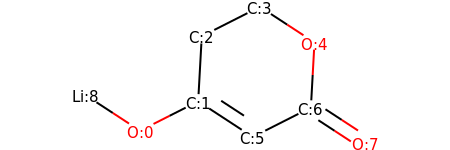

HETATM    1  O1  UNL     1      -2.221  -0.963   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.883  -0.285   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.801   1.213   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.538   1.890   0.000  1.00  0.00           C  
HETATM    5  O2  UNL     1       1.794   1.070   0.000  1.00  0.00           O  
HETATM    6  C4  UNL     1       0.373  -1.106   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.711  -0.428   0.000  1.00  0.00           C  
HETATM    8  O3  UNL     1       2.967  -1.248   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.477  -0.142   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


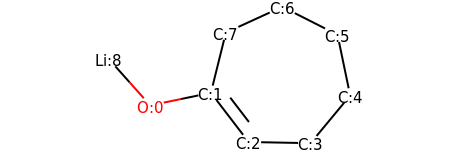

HETATM    1  O1  UNL     1      -2.347  -0.636   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.879  -0.330   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.034  -1.521   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.533  -1.550   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.491  -0.395   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.185   1.073   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.847   1.750   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -0.517   1.125   0.000  1.00  0.00           C  
HETATM    9 LI1  UNL     1      -3.346   0.483   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5
CONECT    5    6
CONECT    6    7
CONECT    7    8
END

search for patterns ...


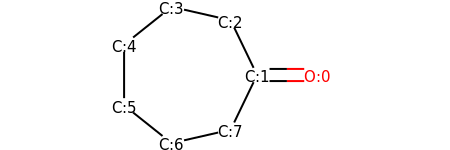

HETATM    1  O1  UNL     1       2.825  -0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.325  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.674   1.351   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.788   1.685   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.961   0.750   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.961  -0.750   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -0.788  -1.685   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.674  -1.351   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    8
CONECT    3    4
CONECT    4    5
CONECT    5    6
CONECT    6    7
CONECT    7    8
END

#################
#################
search for patterns ...
found primary alcohol


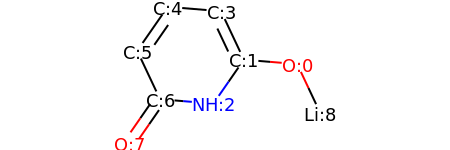

HETATM    1  O1  UNL     1       2.444   0.231   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.949   0.355   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.094  -0.877   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.310   1.712   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.185   1.837   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -2.040   0.604   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -1.401  -0.752   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1      -2.256  -1.985   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1       3.084  -1.126   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    4    4
CONECT    3    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...
found primary alcohol


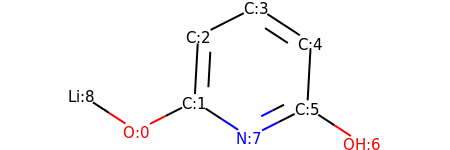

HETATM    1  O1  UNL     1      -2.221  -0.963   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.883  -0.285   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.801   1.213   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.538   1.890   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.794   1.070   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.711  -0.428   0.000  1.00  0.00           C  
HETATM    7  O2  UNL     1       2.967  -1.248   0.000  1.00  0.00           O  
HETATM    8  N1  UNL     1       0.373  -1.106   0.000  1.00  0.00           N  
HETATM    9 LI1  UNL     1      -3.477  -0.142   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    8    8
END

#################
#################
search for patterns ...
found secondary amine


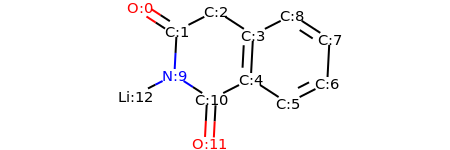

HETATM    1  O1  UNL     1      -3.103   1.896   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.845   1.079   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.508   1.760   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.750   0.943   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.671  -0.555   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.929  -1.372   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.266  -0.691   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.344   0.807   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.086   1.624   0.000  1.00  0.00           C  
HETATM   10  N1  UNL     1      -1.923  -0.419   0.000  1.00  0.00           N  
HETATM   11  C9  UNL     1      -0.665  -1.236   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1      -0.743  -2.734   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

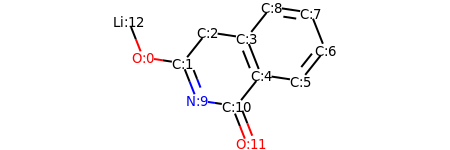

HETATM    1  O1  UNL     1      -3.483   0.116   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.999  -0.105   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.065   1.068   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.418   0.847   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.968  -0.549   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.452  -0.770   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.385   0.404   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.835   1.799   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       1.352   2.021   0.000  1.00  0.00           C  
HETATM   10  N1  UNL     1      -1.449  -1.501   0.000  1.00  0.00           N  
HETATM   11  C9  UNL     1       0.034  -1.723   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1       0.584  -3.118   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

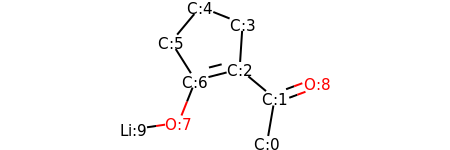

HETATM    1  C1  UNL     1       1.479  -2.088   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.733  -0.609   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.580   0.350   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.677   1.847   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -0.716   2.402   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -1.675   1.249   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -0.874  -0.020   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -1.430  -1.413   0.000  1.00  0.00           O  
HETATM    9  O2  UNL     1       3.140  -0.090   0.000  1.00  0.00           O  
HETATM   10 LI1  UNL     1      -2.914  -1.628   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    9    9
CONECT    3    4    7    7
CONECT    4    5
CONECT    5    6
CONECT    6    7
CONECT    7    8
CONECT    8   10
END

search for patterns ...


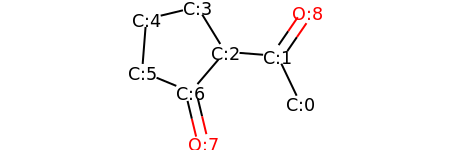

HETATM    1  C1  UNL     1       2.253  -1.185   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.607   0.169   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.111   0.286   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.673   1.564   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -2.131   1.213   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -2.248  -0.282   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -0.862  -0.856   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -0.512  -2.314   0.000  1.00  0.00           O  
HETATM    9  O2  UNL     1       2.456   1.405   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    9    9
CONECT    3    4    7
CONECT    4    5
CONECT    5    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


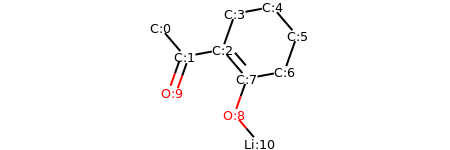

HETATM    1  C1  UNL     1      -2.892   1.384   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.918   0.244   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.443   0.518   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.057   1.932   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       1.532   2.206   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       2.506   1.066   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1       2.006  -0.348   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1       0.532  -0.622   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       0.032  -2.036   0.000  1.00  0.00           O  
HETATM   10  O2  UNL     1      -2.418  -1.170   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1       1.006  -3.176   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4    8    8
CONECT    4    5
CONECT    5    6
CONE

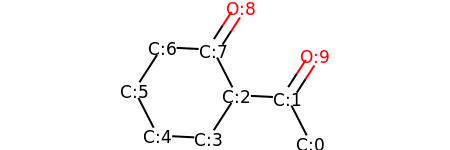

HETATM    1  C1  UNL     1       2.469  -1.684   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.785  -0.350   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.287  -0.274   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.527  -1.534   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -2.026  -1.459   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -2.710  -0.124   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -1.896   1.135   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1      -0.397   1.060   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       0.417   2.320   0.000  1.00  0.00           O  
HETATM   10  O2  UNL     1       2.599   0.910   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4    8
CONECT    4    5
CONECT    5    6
CONECT    6    7
CONECT    7    8
CONECT    8    9    9
END

#################
###########

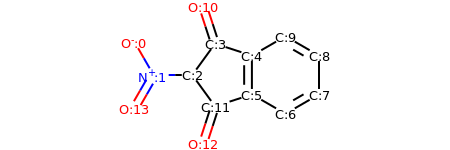

HETATM    1  O1  UNL     1      -3.553   1.299   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1      -2.803  -0.000   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1      -1.303  -0.000   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1      -0.421   1.214   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.005   0.750   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.005  -0.750   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.304  -1.500   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.603  -0.750   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.603   0.750   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       2.304   1.500   0.000  1.00  0.00           C  
HETATM   11  O2  UNL     1      -0.885   2.640   0.000  1.00  0.00           O  
HETATM   12  C9  UNL     1      -0.421  -1.214   0.000  1.00  0.00           C  
HETATM   13  O3  UNL     1  

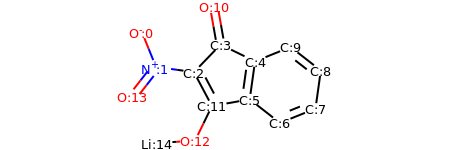

HETATM    1  O1  UNL     1      -3.156   1.953   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1      -2.593   0.562   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1      -1.108   0.354   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1      -0.066   1.433   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.282   0.776   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.074  -0.709   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.256  -1.632   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.647  -1.070   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.855   0.416   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       2.673   1.339   0.000  1.00  0.00           C  
HETATM   11  O2  UNL     1      -0.328   2.910   0.000  1.00  0.00           O  
HETATM   12  C9  UNL     1      -0.403  -0.970   0.000  1.00  0.00           C  
HETATM   13  O3  UNL     1  

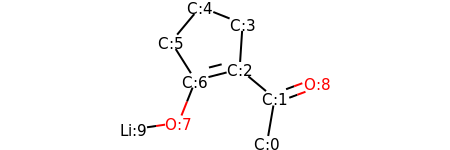

HETATM    1  C1  UNL     1       1.479  -2.088   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.733  -0.609   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.580   0.350   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.677   1.847   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -0.716   2.402   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -1.675   1.249   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -0.874  -0.020   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -1.430  -1.413   0.000  1.00  0.00           O  
HETATM    9  O2  UNL     1       3.140  -0.090   0.000  1.00  0.00           O  
HETATM   10 LI1  UNL     1      -2.914  -1.628   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    9    9
CONECT    3    4    7    7
CONECT    4    5
CONECT    5    6
CONECT    6    7
CONECT    7    8
CONECT    8   10
END

search for patterns ...
found

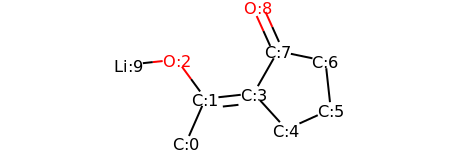

HETATM    1  C1  UNL     1      -1.758  -1.896   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.155  -0.523   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -2.042   0.686   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       0.336  -0.359   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.346  -1.469   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.713  -0.853   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.549   0.639   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.080   0.943   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1       0.464   2.311   0.000  1.00  0.00           O  
HETATM   10 LI1  UNL     1      -3.533   0.522   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    4    4
CONECT    3   10
CONECT    4    5    8
CONECT    5    6
CONECT    6    7
CONECT    7    8
CONECT    8    9    9
END

#################
###########

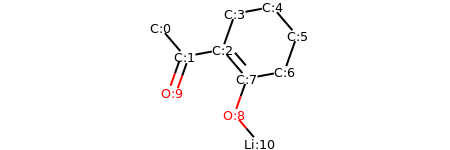

HETATM    1  C1  UNL     1      -2.892   1.384   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.918   0.244   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.443   0.518   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.057   1.932   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       1.532   2.206   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       2.506   1.066   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1       2.006  -0.348   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1       0.532  -0.622   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       0.032  -2.036   0.000  1.00  0.00           O  
HETATM   10  O2  UNL     1      -2.418  -1.170   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1       1.006  -3.176   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4    8    8
CONECT    4    5
CONECT    5    6
CONE

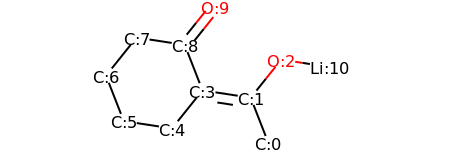

HETATM    1  C1  UNL     1       1.907  -1.964   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.362  -0.566   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       2.299   0.605   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -0.121  -0.340   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.058  -1.511   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -2.541  -1.284   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -3.087   0.113   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -2.149   1.284   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -0.666   1.057   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1       0.271   2.228   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1       3.782   0.378   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    4    4
CONECT    3   11
CONECT    4    5    9
CONECT    5    6
CONECT   

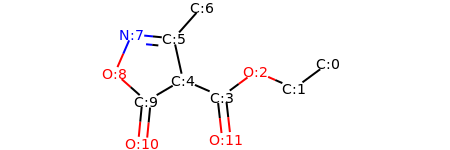

HETATM    1  C1  UNL     1       4.496   0.522   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       3.290  -0.370   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       1.914   0.229   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       0.708  -0.663   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.667  -0.064   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -0.991   1.401   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.004   2.524   0.000  1.00  0.00           C  
HETATM    8  N1  UNL     1      -2.484   1.546   0.000  1.00  0.00           N  
HETATM    9  O2  UNL     1      -3.083   0.170   0.000  1.00  0.00           O  
HETATM   10  C7  UNL     1      -1.960  -0.824   0.000  1.00  0.00           C  
HETATM   11  O3  UNL     1      -2.105  -2.317   0.000  1.00  0.00           O  
HETATM   12  O4  UNL     1       0.877  -2.153   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2

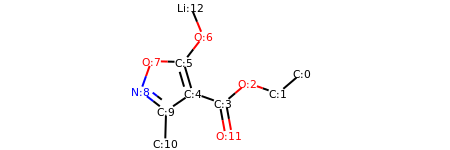

HETATM    1  C1  UNL     1       4.507   0.529   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       3.364  -0.444   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       1.951   0.059   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       0.809  -0.913   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.604  -0.410   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.028   1.029   0.000  1.00  0.00           C  
HETATM    7  O2  UNL     1      -0.113   2.218   0.000  1.00  0.00           O  
HETATM    8  O3  UNL     1      -2.527   1.071   0.000  1.00  0.00           O  
HETATM    9  N1  UNL     1      -3.030  -0.342   0.000  1.00  0.00           N  
HETATM   10  C6  UNL     1      -1.842  -1.257   0.000  1.00  0.00           C  
HETATM   11  C7  UNL     1      -1.883  -2.757   0.000  1.00  0.00           C  
HETATM   12  O4  UNL     1       1.080  -2.388   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

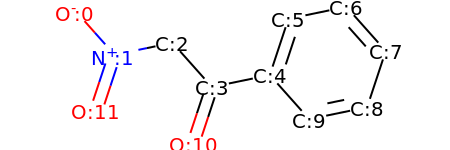

HETATM    1  O1  UNL     1      -4.072   1.479   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1      -3.074   0.359   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1      -1.605   0.663   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1      -0.607  -0.457   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.861  -0.153   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.333   1.271   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.802   1.575   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.799   0.455   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.328  -0.970   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.859  -1.274   0.000  1.00  0.00           C  
HETATM   11  O2  UNL     1      -1.079  -1.881   0.000  1.00  0.00           O  
HETATM   12  O3  UNL     1      -3.545  -1.065   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2

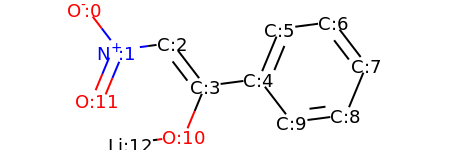

HETATM    1  O1  UNL     1      -3.744   1.928   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1      -2.831   0.738   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1      -1.344   0.933   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1      -0.432  -0.258   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.056  -0.063   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.631   1.322   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.118   1.517   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       4.030   0.326   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.455  -1.059   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.968  -1.254   0.000  1.00  0.00           C  
HETATM   11  O2  UNL     1      -1.007  -1.644   0.000  1.00  0.00           O  
HETATM   12  O3  UNL     1      -3.406  -0.648   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

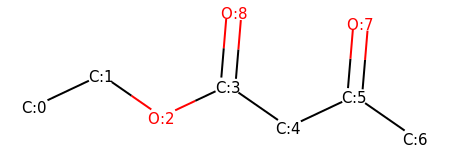

HETATM    1  C1  UNL     1      -4.234  -0.400   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.877   0.239   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -1.644  -0.616   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -0.288   0.024   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.945  -0.831   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.301  -0.192   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.534  -1.047   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1       2.426   1.303   0.000  1.00  0.00           O  
HETATM    9  O3  UNL     1      -0.163   1.519   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3
CONECT    3    4
CONECT    4    5    9    9
CONECT    5    6
CONECT    6    7    8    8
END

search for patterns ...
found primary alcohol


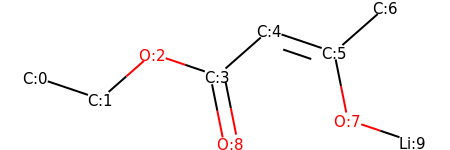

HETATM    1  C1  UNL     1      -4.650   0.063   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -3.228  -0.418   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -2.102   0.573   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -0.681   0.093   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.445   1.084   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.866   0.604   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.993   1.594   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1       2.161  -0.867   0.000  1.00  0.00           O  
HETATM    9  O3  UNL     1      -0.386  -1.378   0.000  1.00  0.00           O  
HETATM   10 LI1  UNL     1       3.582  -1.347   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3
CONECT    3    4
CONECT    4    5    9    9
CONECT    5    6    6
CONECT    6    7    8
CONECT    8   10
END

#################
#################
search for

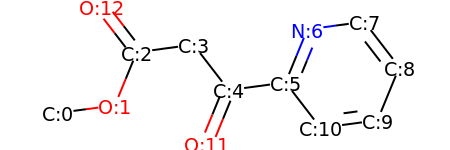

HETATM    1  C1  UNL     1      -4.706  -0.934   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -3.219  -0.734   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -2.649   0.653   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.162   0.852   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.246  -0.335   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.241  -0.136   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1       1.811   1.251   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       3.298   1.450   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       4.214   0.263   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.643  -1.125   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       2.157  -1.324   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1      -0.817  -1.723   0.000  1.00  0.00           O  
HETATM   13  O3  UNL     1  

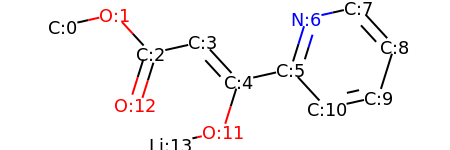

HETATM    1  C1  UNL     1      -4.982   1.166   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -3.519   1.494   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -2.503   0.390   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.039   0.718   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.023  -0.386   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.440  -0.058   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1       1.888   1.374   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       3.352   1.701   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       4.368   0.598   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.920  -0.834   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       2.456  -1.162   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1      -0.471  -1.817   0.000  1.00  0.00           O  
HETATM   13  O3  UNL     1  

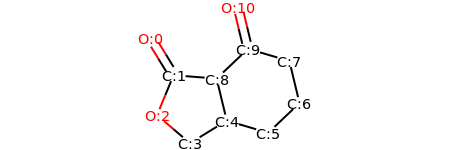

HETATM    1  O1  UNL     1      -2.516   1.583   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.731   0.304   0.000  1.00  0.00           C  
HETATM    3  O2  UNL     1      -2.305  -1.082   0.000  1.00  0.00           O  
HETATM    4  C2  UNL     1      -1.164  -2.055   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.115  -1.271   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.553  -1.697   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.641  -0.663   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.290   0.795   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -0.236   0.187   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.852   1.220   0.000  1.00  0.00           C  
HETATM   11  O3  UNL     1       0.501   2.679   0.000  1.00  0.00           O  
CONECT    1    2    2
CONECT    2    3    9
CONECT    3    4
CONECT    4    5
CONECT    5    6    9
CONECT   

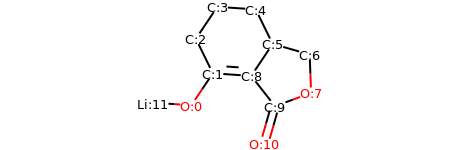

HETATM    1  O1  UNL     1      -1.993  -1.333   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.157  -0.087   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.818   1.259   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.982   2.505   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.514   2.404   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.175   1.057   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.618   0.647   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1       2.674  -0.852   0.000  1.00  0.00           O  
HETATM    9  C7  UNL     1       0.339  -0.188   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.265  -1.368   0.000  1.00  0.00           C  
HETATM   11  O3  UNL     1       0.855  -2.811   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1      -3.490  -1.232   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

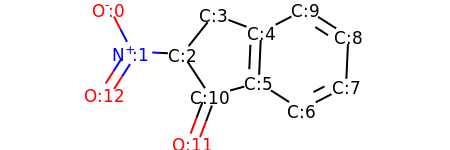

HETATM    1  O1  UNL     1      -3.549   1.666   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1      -2.859   0.334   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1      -1.360   0.265   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1      -0.424   1.437   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.980   0.909   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.911  -0.589   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.175  -1.398   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.507  -0.708   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.575   0.791   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       2.311   1.599   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -0.535  -0.987   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1      -1.063  -2.391   0.000  1.00  0.00           O  
HETATM   13  O3  UNL     1  

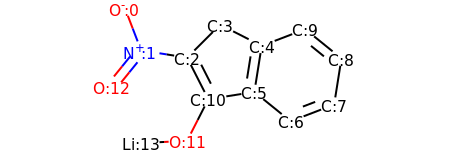

HETATM    1  O1  UNL     1      -3.139   2.218   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1      -2.602   0.817   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1      -1.121   0.582   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1      -0.060   1.643   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.276   0.961   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.041  -0.520   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.207  -1.465   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.607  -0.927   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.842   0.554   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       2.677   1.498   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -0.440  -0.754   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1      -1.122  -2.091   0.000  1.00  0.00           O  
HETATM   13  O3  UNL     1  

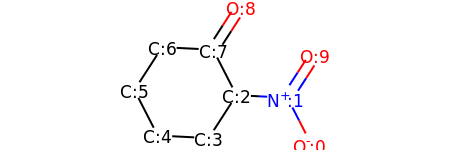

HETATM    1  O1  UNL     1       2.469  -1.684   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1       1.785  -0.350   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1       0.287  -0.274   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1      -0.527  -1.534   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -2.026  -1.459   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -2.710  -0.124   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -1.896   1.135   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -0.397   1.060   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1       0.417   2.320   0.000  1.00  0.00           O  
HETATM   10  O3  UNL     1       2.599   0.910   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4    8
CONECT    4    5
CONECT    5    6
CONECT    6    7
CONECT    7    8
CONECT    8    9    9
END

search for patterns ...
found

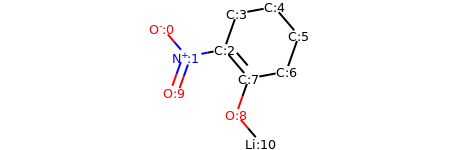

HETATM    1  O1  UNL     1      -2.892   1.384   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1      -1.918   0.244   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1      -0.443   0.518   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1       0.057   1.932   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.532   2.206   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.506   1.066   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.006  -0.348   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       0.532  -0.622   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1       0.032  -2.036   0.000  1.00  0.00           O  
HETATM   10  O3  UNL     1      -2.418  -1.170   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1       1.006  -3.176   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4    8    8
CONECT    4    5
CONECT    5    6
CONE

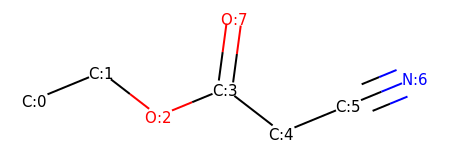

HETATM    1  C1  UNL     1      -3.962  -0.225   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.575   0.346   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -1.387  -0.570   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -0.000  -0.000   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.188  -0.916   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.575  -0.346   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1       3.962   0.225   0.000  1.00  0.00           N  
HETATM    8  O2  UNL     1       0.200   1.487   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3
CONECT    3    4
CONECT    4    5    8    8
CONECT    5    6
CONECT    6    7    7    7
END

search for patterns ...
found primary alcohol


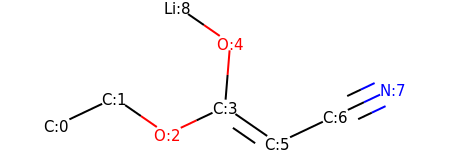

HETATM    1  C1  UNL     1      -3.821  -0.693   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.466  -0.051   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -1.232  -0.903   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       0.124  -0.261   0.000  1.00  0.00           C  
HETATM    5  O2  UNL     1       0.245   1.234   0.000  1.00  0.00           O  
HETATM    6  C4  UNL     1       1.358  -1.113   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.713  -0.471   0.000  1.00  0.00           C  
HETATM    8  N1  UNL     1       4.069   0.171   0.000  1.00  0.00           N  
HETATM    9 LI1  UNL     1      -0.989   2.087   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3
CONECT    3    4
CONECT    4    5    6    6
CONECT    5    9
CONECT    6    7
CONECT    7    8    8    8
END

#################
#################
search for patterns ...


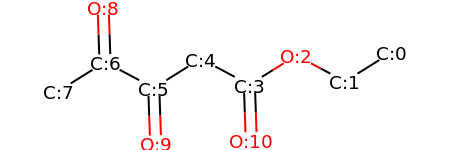

HETATM    1  C1  UNL     1       4.938   0.715   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       3.666  -0.079   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       2.342   0.626   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       1.069  -0.168   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.255   0.537   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.527  -0.257   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -2.851   0.448   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -4.124  -0.346   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1      -2.903   1.947   0.000  1.00  0.00           O  
HETATM   10  O3  UNL     1      -1.476  -1.756   0.000  1.00  0.00           O  
HETATM   11  O4  UNL     1       1.121  -1.667   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3
CONECT    3    4
CONECT    4    5   11   11
CONECT    5    6
CONECT    6   

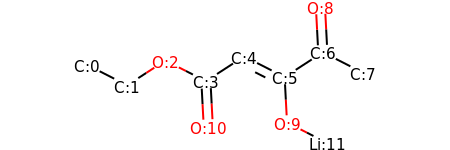

HETATM    1  C1  UNL     1      -5.228   0.477   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -3.892  -0.204   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -2.634   0.613   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -1.297  -0.068   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.039   0.749   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.297   0.068   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.555   0.885   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.892   0.204   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1       2.477   2.383   0.000  1.00  0.00           O  
HETATM   10  O3  UNL     1       1.376  -1.430   0.000  1.00  0.00           O  
HETATM   11  O4  UNL     1      -1.219  -1.566   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1       2.712  -2.111   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

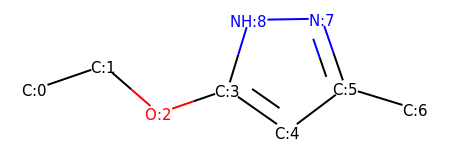

HETATM    1  C1  UNL     1      -4.186  -0.180   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.768   0.308   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -1.636  -0.677   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -0.217  -0.188   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.011  -1.049   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.209  -0.146   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.644  -0.585   0.000  1.00  0.00           C  
HETATM    8  N1  UNL     1       1.721   1.272   0.000  1.00  0.00           N  
HETATM    9  N2  UNL     1       0.221   1.246   0.000  1.00  0.00           N  
CONECT    1    2
CONECT    2    3
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6
CONECT    6    7    8    8
CONECT    8    9
END

search for patterns ...


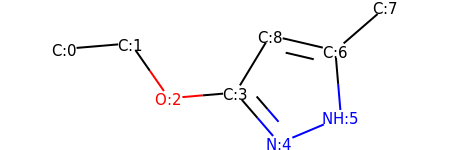

HETATM    1  C1  UNL     1      -4.072   0.487   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.578   0.614   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -1.721  -0.617   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -0.226  -0.491   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.755  -1.626   0.000  1.00  0.00           N  
HETATM    6  N2  UNL     1       2.137  -1.043   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       2.010   0.451   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.145   1.432   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       0.550   0.793   0.000  1.00  0.00           C  
CONECT    1    2
CONECT    2    3
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6
CONECT    6    7
CONECT    7    8    9    9
END

#################
#################
search for patterns ...


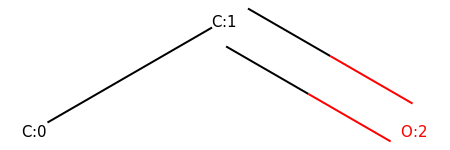

HETATM    1  C1  UNL     1      -1.299  -0.250   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       0.000   0.500   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       1.299  -0.250   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    3
END

search for patterns ...
found primary alcohol


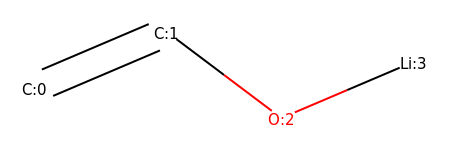

HETATM    1  C1  UNL     1      -1.980  -0.136   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.599   0.451   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       0.599  -0.451   0.000  1.00  0.00           O  
HETATM    4 LI1  UNL     1       1.980   0.136   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3
CONECT    3    4
END

#################
#################
search for patterns ...


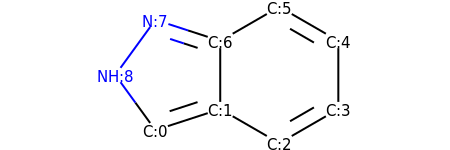

HETATM    1  C1  UNL     1      -1.719  -1.214   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.293  -0.750   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       1.007  -1.500   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       2.306  -0.750   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       2.306   0.750   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       1.007   1.500   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -0.293   0.750   0.000  1.00  0.00           C  
HETATM    8  N1  UNL     1      -1.719   1.214   0.000  1.00  0.00           N  
HETATM    9  N2  UNL     1      -2.601  -0.000   0.000  1.00  0.00           N  
CONECT    1    2    2    9
CONECT    2    3    7
CONECT    3    4    4
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
END

search for patterns ...


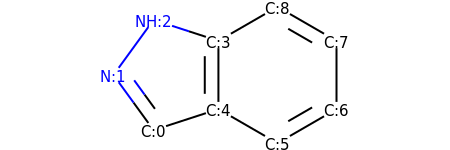

HETATM    1  C1  UNL     1      -1.719  -1.214   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -2.601  -0.000   0.000  1.00  0.00           N  
HETATM    3  N2  UNL     1      -1.719   1.214   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.293   0.750   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -0.293  -0.750   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.007  -1.500   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.306  -0.750   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.306   0.750   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.007   1.500   0.000  1.00  0.00           C  
CONECT    1    2    2    5
CONECT    2    3
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9    9
END

#################
#################
search for patterns ...


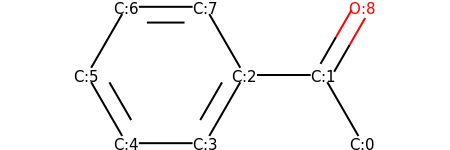

HETATM    1  C1  UNL     1       2.583  -1.299   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.833   0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.333   0.000   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.417  -1.299   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -1.917  -1.299   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -2.667   0.000   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -1.917   1.299   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1      -0.417   1.299   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       2.583   1.299   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    9    9
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...
found primary alcohol


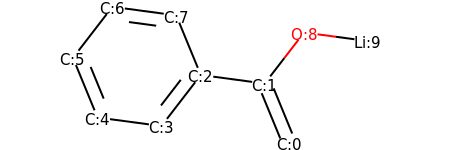

HETATM    1  C1  UNL     1       1.966  -1.705   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.395  -0.318   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.092  -0.119   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -1.007  -1.307   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -2.494  -1.107   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -3.065   0.280   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -2.149   1.468   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1      -0.662   1.268   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       2.311   0.870   0.000  1.00  0.00           O  
HETATM   10 LI1  UNL     1       3.798   0.671   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3    9
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
CONECT    9   10
END

#################
#

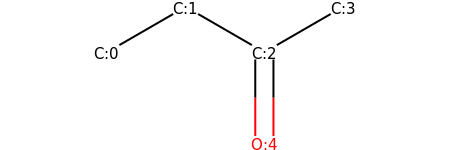

HETATM    1  C1  UNL     1      -2.078   0.000   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.779   0.750   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.520  -0.000   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       1.819   0.750   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1       0.520  -1.500   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3
CONECT    3    4    5    5
END

search for patterns ...
found primary alcohol


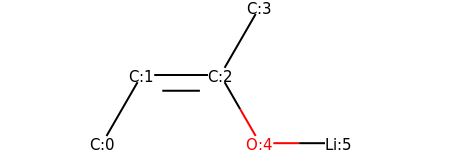

HETATM    1  C1  UNL     1      -2.250  -0.866   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.500   0.433   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.000   0.433   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.750   1.732   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1       0.750  -0.866   0.000  1.00  0.00           O  
HETATM    6 LI1  UNL     1       2.250  -0.866   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3
CONECT    3    4    5
CONECT    5    6
END

#################
#################
search for patterns ...


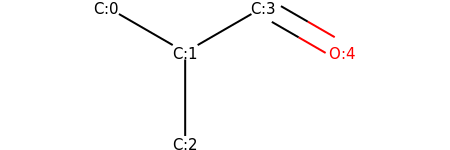

HETATM    1  C1  UNL     1      -1.819   0.750   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.520   0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.520  -1.500   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.779   0.750   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1       2.078  -0.000   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    4
CONECT    4    5    5
END

search for patterns ...
found primary alcohol


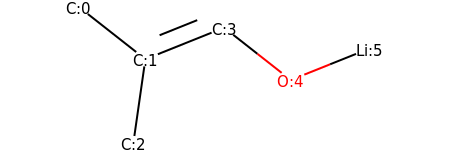

HETATM    1  C1  UNL     1      -2.269   0.956   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.089   0.030   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -1.302  -1.455   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.303   0.588   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1       1.483  -0.339   0.000  1.00  0.00           O  
HETATM    6 LI1  UNL     1       2.875   0.220   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    4    4
CONECT    4    5
CONECT    5    6
END

#################
#################
search for patterns ...


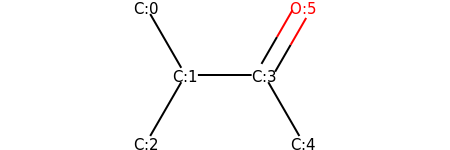

HETATM    1  C1  UNL     1      -1.500   1.299   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.750   0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -1.500  -1.299   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.750  -0.000   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       1.500  -1.299   0.000  1.00  0.00           C  
HETATM    6  O1  UNL     1       1.500   1.299   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    4
CONECT    4    5    6    6
END

search for patterns ...
found primary alcohol


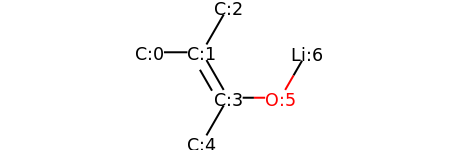

HETATM    1  C1  UNL     1      -2.250   0.557   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.750   0.557   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.000   1.856   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.000  -0.742   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -0.750  -2.041   0.000  1.00  0.00           C  
HETATM    6  O1  UNL     1       1.500  -0.742   0.000  1.00  0.00           O  
HETATM    7 LI1  UNL     1       2.250   0.557   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    4    4
CONECT    4    5    6
CONECT    6    7
END

#################
#################
search for patterns ...


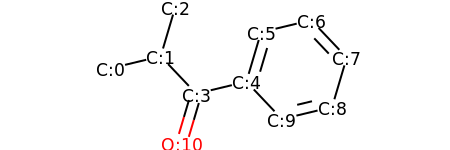

HETATM    1  C1  UNL     1      -3.668   0.091   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.209   0.441   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -1.783   1.879   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -1.177  -0.647   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       0.282  -0.297   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       0.708   1.141   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1       2.166   1.492   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1       3.199   0.403   0.000  1.00  0.00           C  
HETATM    9  C9  UNL     1       2.773  -1.035   0.000  1.00  0.00           C  
HETATM   10  C10 UNL     1       1.314  -1.385   0.000  1.00  0.00           C  
HETATM   11  O1  UNL     1      -1.603  -2.085   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    4
CONECT    4    5   11   11
CONECT    5    6    6   10
CONECT    6    7

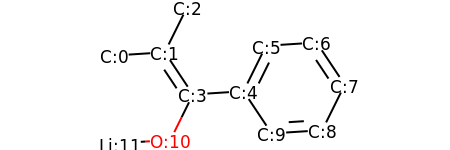

HETATM    1  C1  UNL     1      -3.313   0.872   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.816   0.968   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -1.150   2.313   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.984  -0.280   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       0.513  -0.184   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       1.178   1.160   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1       2.675   1.256   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1       3.507   0.008   0.000  1.00  0.00           C  
HETATM    9  C9  UNL     1       2.841  -1.336   0.000  1.00  0.00           C  
HETATM   10  C10 UNL     1       1.345  -1.432   0.000  1.00  0.00           C  
HETATM   11  O1  UNL     1      -1.649  -1.625   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1      -3.146  -1.721   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

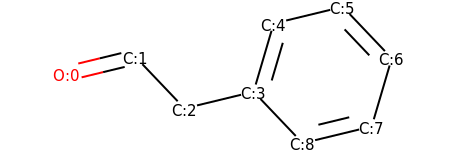

HETATM    1  O1  UNL     1      -4.044   0.061   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.587   0.413   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.552  -0.673   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.094  -0.320   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.329   1.119   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.787   1.472   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.822   0.386   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.398  -1.053   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       0.940  -1.406   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9    9
END

search for patterns ...
found primary alcohol


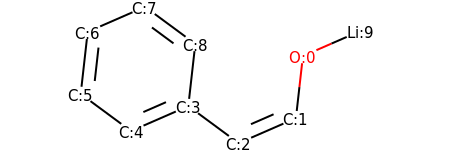

HETATM    1  O1  UNL     1       2.407   0.484   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       2.240  -1.007   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.865  -1.607   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.342  -0.716   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.717  -1.316   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -2.924  -0.426   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -2.756   1.065   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -1.381   1.665   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -0.174   0.774   0.000  1.00  0.00           C  
HETATM   10 LI1  UNL     1       3.782   1.084   0.000  1.00  0.00          LI  
CONECT    1    2   10
CONECT    2    3    3
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9    9
END

#################
#

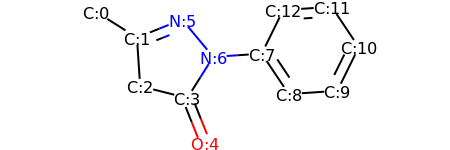

HETATM    1  C1  UNL     1      -4.217   1.433   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.948   0.634   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -2.848  -0.863   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -1.394  -1.231   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1      -0.837  -2.624   0.000  1.00  0.00           O  
HETATM    6  N1  UNL     1      -1.555   1.191   0.000  1.00  0.00           N  
HETATM    7  N2  UNL     1      -0.595   0.038   0.000  1.00  0.00           N  
HETATM    8  C5  UNL     1       0.902   0.138   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       1.737  -1.109   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.233  -1.009   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       3.895   0.337   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       3.061   1.583   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

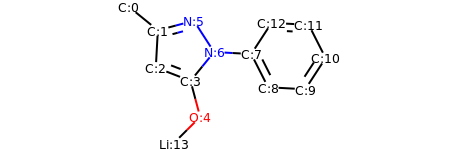

HETATM    1  C1  UNL     1      -3.856   2.184   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.692   1.238   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -2.773  -0.260   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -1.374  -0.800   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1      -0.989  -2.250   0.000  1.00  0.00           O  
HETATM    6  N1  UNL     1      -1.242   1.624   0.000  1.00  0.00           N  
HETATM    7  N2  UNL     1      -0.428   0.364   0.000  1.00  0.00           N  
HETATM    8  C5  UNL     1       1.070   0.283   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       1.748  -1.055   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.246  -1.137   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       4.065   0.120   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       3.387   1.458   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

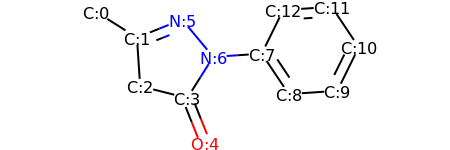

HETATM    1  C1  UNL     1      -4.217   1.433   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.948   0.634   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -2.848  -0.863   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -1.394  -1.231   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1      -0.837  -2.624   0.000  1.00  0.00           O  
HETATM    6  N1  UNL     1      -1.555   1.191   0.000  1.00  0.00           N  
HETATM    7  N2  UNL     1      -0.595   0.038   0.000  1.00  0.00           N  
HETATM    8  C5  UNL     1       0.902   0.138   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       1.737  -1.109   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.233  -1.009   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       3.895   0.337   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       3.061   1.583   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

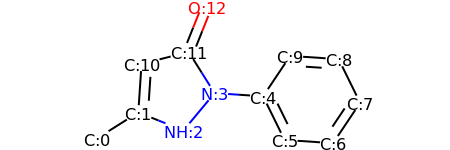

HETATM    1  C1  UNL     1      -4.217  -1.433   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.948  -0.634   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.555  -1.191   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.595  -0.038   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.902  -0.138   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.564  -1.484   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.061  -1.583   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.895  -0.337   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.233   1.009   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.737   1.109   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.848   0.863   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -1.394   1.231   0.000  1.00  0.00           C  
HETATM   13  O1  UNL     1  

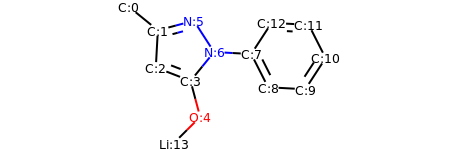

HETATM    1  C1  UNL     1      -3.856   2.184   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.692   1.238   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -2.773  -0.260   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -1.374  -0.800   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1      -0.989  -2.250   0.000  1.00  0.00           O  
HETATM    6  N1  UNL     1      -1.242   1.624   0.000  1.00  0.00           N  
HETATM    7  N2  UNL     1      -0.428   0.364   0.000  1.00  0.00           N  
HETATM    8  C5  UNL     1       1.070   0.283   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       1.748  -1.055   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.246  -1.137   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       4.065   0.120   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       3.387   1.458   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

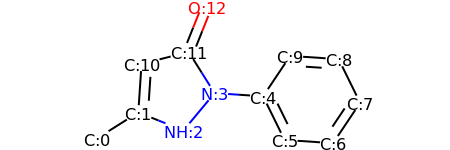

HETATM    1  C1  UNL     1      -4.217  -1.433   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.948  -0.634   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.555  -1.191   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -0.595  -0.038   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.902  -0.138   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.564  -1.484   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.061  -1.583   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.895  -0.337   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.233   1.009   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.737   1.109   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.848   0.863   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -1.394   1.231   0.000  1.00  0.00           C  
HETATM   13  O1  UNL     1  

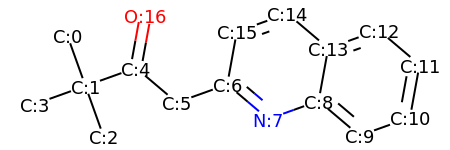

HETATM    1  C1  UNL     1      -4.672   1.135   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -4.166  -0.277   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -3.660  -1.689   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -5.578  -0.783   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -2.754   0.230   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -1.609  -0.740   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -0.198  -0.233   0.000  1.00  0.00           C  
HETATM    8  N1  UNL     1       0.947  -1.203   0.000  1.00  0.00           N  
HETATM    9  C8  UNL     1       2.359  -0.696   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       3.503  -1.666   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       4.915  -1.159   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1       5.183   0.317   0.000  1.00  0.00           C  
HETATM   13  C12 UNL     1  

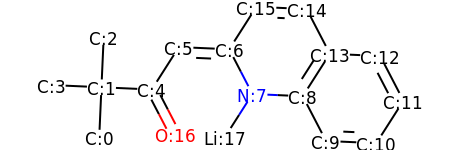

HETATM    1  C1  UNL     1      -4.076  -1.609   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -4.009  -0.110   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -3.942   1.388   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -5.507  -0.044   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -2.510  -0.177   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -1.703   1.087   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1      -0.205   1.020   0.000  1.00  0.00           C  
HETATM    8  N1  UNL     1       0.487  -0.311   0.000  1.00  0.00           N  
HETATM    9  C8  UNL     1       1.985  -0.377   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       2.677  -1.709   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       4.175  -1.775   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1       4.982  -0.511   0.000  1.00  0.00           C  
HETATM   13  C12 UNL     1  

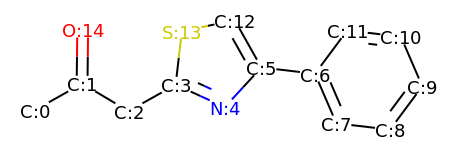

HETATM    1  C1  UNL     1      -5.727  -0.973   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -4.420  -0.238   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -3.129  -1.003   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -1.822  -0.268   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.459  -0.894   0.000  1.00  0.00           N  
HETATM    6  C5  UNL     1       0.558   0.209   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.048   0.035   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.642  -1.342   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       4.132  -1.516   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       5.028  -0.313   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       4.433   1.065   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1       2.943   1.238   0.000  1.00  0.00           C  
HETATM   13  C12 UNL     1  

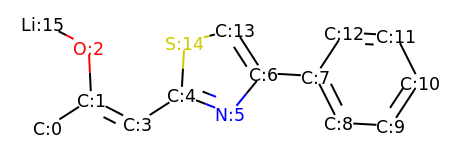

HETATM    1  C1  UNL     1      -5.297  -1.417   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -4.035  -0.605   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -4.107   0.893   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -2.702  -1.292   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.440  -0.481   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1      -0.042  -1.025   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1       0.907   0.137   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.405   0.051   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.080  -1.288   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       4.577  -1.373   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       5.400  -0.119   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       4.725   1.220   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

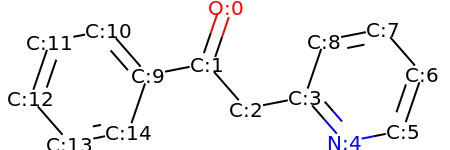

HETATM    1  O1  UNL     1      -0.007   1.852   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.493   0.433   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.494  -0.697   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.966  -0.408   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       2.952  -1.538   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       4.424  -1.248   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       4.909   0.171   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.923   1.301   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.451   1.012   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -1.965   0.143   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.951   1.273   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -4.423   0.984   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

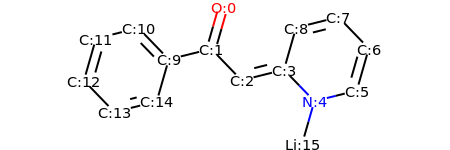

HETATM    1  O1  UNL     1      -0.264   2.026   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.677   0.584   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.365  -0.495   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.820  -0.132   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       2.863  -1.210   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       4.318  -0.847   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       4.731   0.595   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.689   1.673   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.234   1.310   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -2.133   0.221   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -3.175   1.300   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -4.630   0.937   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

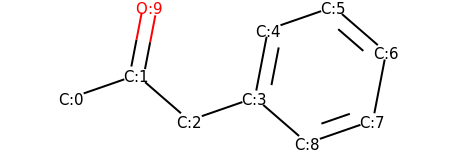

HETATM    1  C1  UNL     1      -3.799  -0.491   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.381   0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -1.247  -0.982   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.170  -0.491   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       0.454   0.982   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       1.871   1.473   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1       3.005   0.491   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1       2.721  -0.982   0.000  1.00  0.00           C  
HETATM    9  C9  UNL     1       1.304  -1.473   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1      -2.098   1.473   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9    9
END

search for patterns

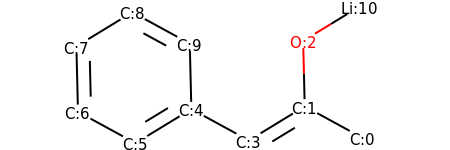

HETATM    1  C1  UNL     1       3.338  -1.284   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.022  -0.565   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       1.986   0.934   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       0.741  -1.346   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.576  -0.628   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.856  -1.409   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -3.173  -0.690   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -3.209   0.809   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -1.928   1.590   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -0.612   0.872   0.000  1.00  0.00           C  
HETATM   11 LI1  UNL     1       3.266   1.715   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    4    4
CONECT    3   11
CONECT    4    5
CONECT    5    6    6   10
CONE

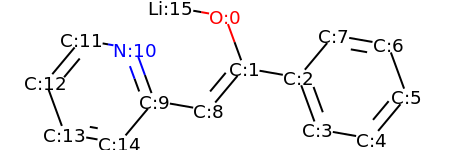

HETATM    1  O1  UNL     1       0.062   1.720   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.578   0.311   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.055   0.054   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.571  -1.355   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       4.049  -1.612   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       5.011  -0.461   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       4.495   0.948   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.017   1.205   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -0.384  -0.840   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.862  -0.582   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1      -2.378   0.826   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1      -3.856   1.084   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

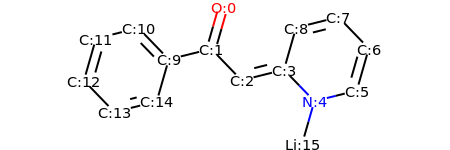

HETATM    1  O1  UNL     1      -0.264   2.026   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.677   0.584   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.365  -0.495   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.820  -0.132   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       2.863  -1.210   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       4.318  -0.847   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       4.731   0.595   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.689   1.673   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.234   1.310   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -2.133   0.221   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -3.175   1.300   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -4.630   0.937   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

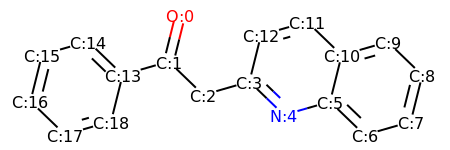

HETATM    1  O1  UNL     1      -1.552   1.973   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.915   0.517   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.835  -0.524   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.607  -0.110   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.686  -1.152   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       3.128  -0.738   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       4.207  -1.779   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       5.649  -1.365   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       6.011   0.090   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       4.932   1.132   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       3.490   0.718   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       2.411   1.759   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

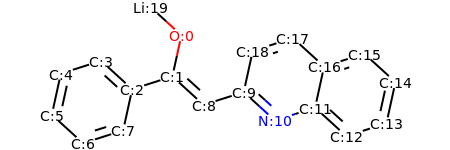

HETATM    1  O1  UNL     1      -1.472   1.781   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.793   0.316   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -3.222  -0.139   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -4.330   0.872   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -5.760   0.417   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -6.081  -1.048   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -4.972  -2.059   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -3.543  -1.604   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -0.684  -0.695   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       0.745  -0.240   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1       1.854  -1.251   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1       3.283  -0.796   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

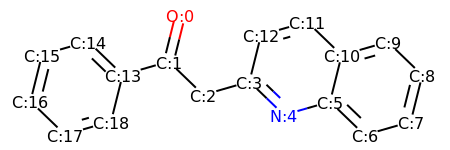

HETATM    1  O1  UNL     1      -1.552   1.973   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.915   0.517   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.835  -0.524   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.607  -0.110   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.686  -1.152   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       3.128  -0.738   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       4.207  -1.779   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       5.649  -1.365   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       6.011   0.090   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       4.932   1.132   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       3.490   0.718   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       2.411   1.759   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

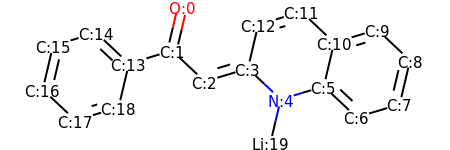

HETATM    1  O1  UNL     1      -1.644   2.083   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.989   0.623   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.896  -0.405   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.540   0.027   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.633  -1.001   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       3.069  -0.569   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       4.161  -1.597   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       5.598  -1.165   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       5.942   0.295   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       4.850   1.323   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       3.413   0.891   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       2.321   1.919   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

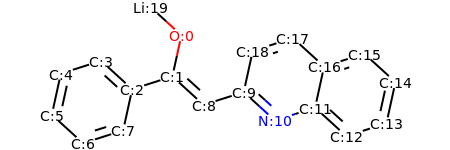

HETATM    1  O1  UNL     1      -1.472   1.781   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.793   0.316   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -3.222  -0.139   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -4.330   0.872   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -5.760   0.417   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -6.081  -1.048   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -4.972  -2.059   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -3.543  -1.604   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -0.684  -0.695   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       0.745  -0.240   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1       1.854  -1.251   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1       3.283  -0.796   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

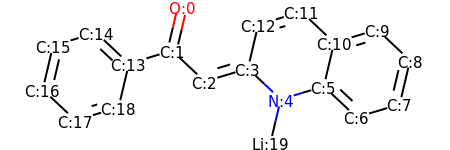

HETATM    1  O1  UNL     1      -1.644   2.083   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.989   0.623   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.896  -0.405   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.540   0.027   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.633  -1.001   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       3.069  -0.569   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       4.161  -1.597   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       5.598  -1.165   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       5.942   0.295   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       4.850   1.323   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       3.413   0.891   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       2.321   1.919   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

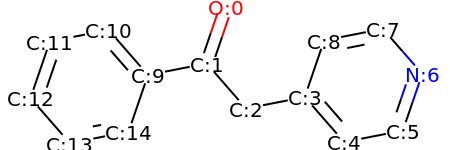

HETATM    1  O1  UNL     1      -0.007   1.852   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.493   0.433   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.494  -0.697   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.966  -0.408   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.952  -1.538   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       4.424  -1.248   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1       4.909   0.171   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       3.923   1.301   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.451   1.012   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -1.965   0.143   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.951   1.273   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -4.423   0.984   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

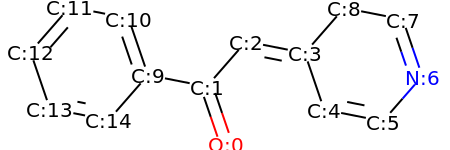

HETATM    1  O1  UNL     1      -0.007  -1.852   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.493  -0.433   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.494   0.697   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.966   0.408   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.451  -1.012   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.923  -1.301   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1       4.909  -0.171   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       4.424   1.248   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.952   1.538   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -1.965  -0.143   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.450   1.276   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -3.922   1.565   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

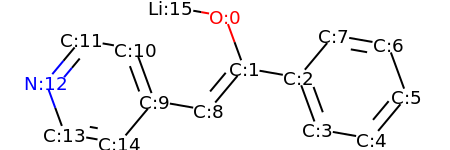

HETATM    1  O1  UNL     1       0.062   1.720   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.578   0.311   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.055   0.054   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.571  -1.355   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       4.049  -1.612   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       5.011  -0.461   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       4.495   0.948   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.017   1.205   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -0.384  -0.840   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.862  -0.582   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -2.378   0.826   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -3.856   1.084   0.000  1.00  0.00           C  
HETATM   13  N1  UNL     1  

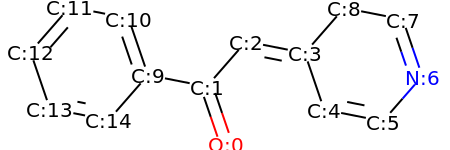

HETATM    1  O1  UNL     1      -0.007  -1.852   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.493  -0.433   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.494   0.697   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.966   0.408   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.451  -1.012   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.923  -1.301   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1       4.909  -0.171   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       4.424   1.248   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.952   1.538   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -1.965  -0.143   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.450   1.276   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -3.922   1.565   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

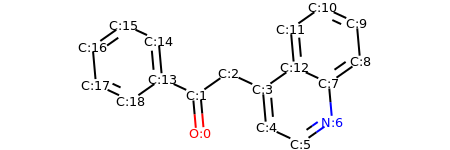

HETATM    1  O1  UNL     1      -1.446  -2.268   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.579  -0.774   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.351   0.088   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.009  -0.545   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.142  -2.039   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.502  -2.671   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1       3.729  -1.810   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       3.597  -0.315   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       4.825   0.546   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       4.693   2.040   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       3.332   2.673   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       2.105   1.811   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

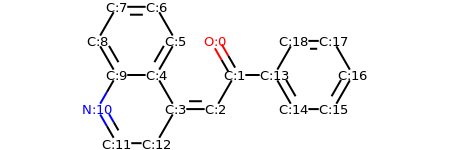

HETATM    1  O1  UNL     1       0.355   1.299   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.105  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.355  -1.299   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.145  -1.299   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.895  -0.000   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.145   1.299   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -1.895   2.598   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -3.395   2.598   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -4.145   1.299   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -3.395   0.000   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1      -4.145  -1.299   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1      -3.395  -2.598   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

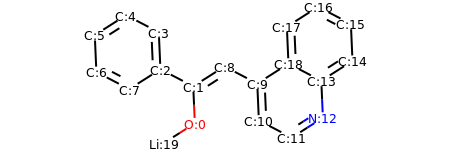

HETATM    1  O1  UNL     1      -1.406  -2.051   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.471  -0.552   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.802   0.141   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -2.867   1.639   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -4.198   2.332   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -5.463   1.526   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -5.397   0.027   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -4.067  -0.665   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -0.206   0.254   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       1.124  -0.439   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       1.190  -1.937   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1       2.520  -2.630   0.000  1.00  0.00           C  
HETATM   13  N1  UNL     1  

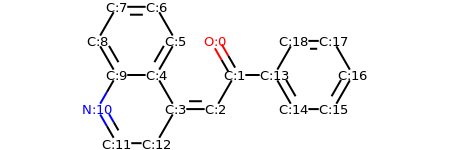

HETATM    1  O1  UNL     1       0.355   1.299   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.105  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.355  -1.299   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.145  -1.299   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.895  -0.000   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.145   1.299   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -1.895   2.598   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -3.395   2.598   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -4.145   1.299   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -3.395   0.000   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1      -4.145  -1.299   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1      -3.395  -2.598   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

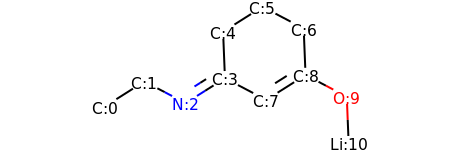

HETATM    1  C1  UNL     1      -4.572  -0.934   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -3.304  -0.133   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.976  -0.830   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.708  -0.028   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.768   1.470   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       0.500   2.272   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.828   1.575   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.620  -0.726   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       1.888   0.076   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1       3.216  -0.622   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1       3.276  -2.120   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3
CONECT    3    4    4
CONECT    4    5    8
CONECT    5    6
CONECT    6   

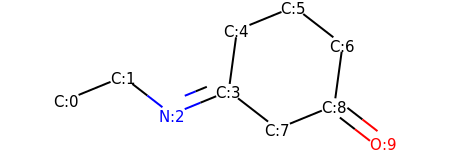

HETATM    1  C1  UNL     1      -4.379  -0.388   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.991   0.180   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.805  -0.738   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.416  -0.170   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.214   1.316   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.174   1.884   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.360   0.966   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.770  -1.089   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.158  -0.521   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1       3.344  -1.439   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3
CONECT    3    4    4
CONECT    4    5    8
CONECT    5    6
CONECT    6    7
CONECT    7    9
CONECT    8    9
CONECT    9   10   10
END

#################

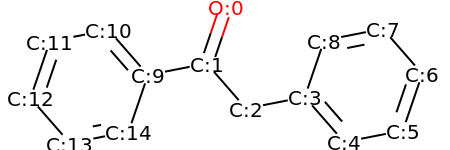

HETATM    1  O1  UNL     1      -0.007   1.852   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.493   0.433   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.494  -0.697   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.966  -0.408   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.952  -1.538   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       4.424  -1.248   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       4.909   0.171   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.923   1.301   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.451   1.012   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.965   0.143   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -2.951   1.273   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -4.423   0.984   0.000  1.00  0.00           C  
HETATM   13  C12 UNL     1  

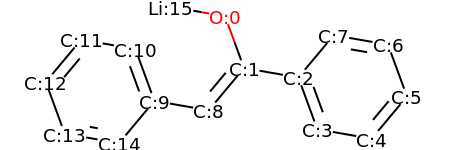

HETATM    1  O1  UNL     1       0.062   1.720   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.578   0.311   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.055   0.054   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.571  -1.355   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       4.049  -1.612   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       5.011  -0.461   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       4.495   0.948   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.017   1.205   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -0.384  -0.840   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.862  -0.582   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -2.378   0.826   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -3.856   1.084   0.000  1.00  0.00           C  
HETATM   13  C12 UNL     1  

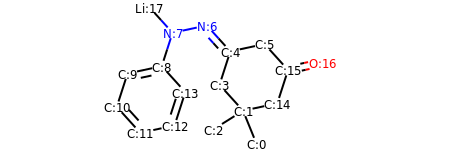

HETATM    1  C1  UNL     1       2.054  -2.654   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.488  -1.265   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.218  -2.063   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.482  -0.152   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       0.942   1.275   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       2.408   1.591   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1      -0.065   2.388   0.000  1.00  0.00           N  
HETATM    8  N2  UNL     1      -1.531   2.072   0.000  1.00  0.00           N  
HETATM    9  C7  UNL     1      -1.991   0.644   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -3.458   0.329   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -3.918  -1.099   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -2.911  -2.211   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

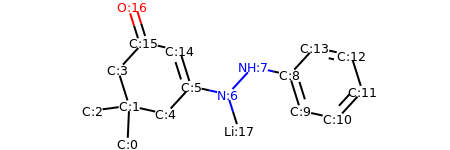

HETATM    1  C1  UNL     1      -3.691  -2.354   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -3.625  -0.856   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -5.112  -1.051   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -4.075   0.575   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -2.160  -1.181   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -1.147  -0.076   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1       0.318  -0.401   0.000  1.00  0.00           N  
HETATM    8  N2  UNL     1       1.332   0.705   0.000  1.00  0.00           N  
HETATM    9  C7  UNL     1       2.796   0.379   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.246  -1.052   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       4.711  -1.377   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       5.725  -0.272   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

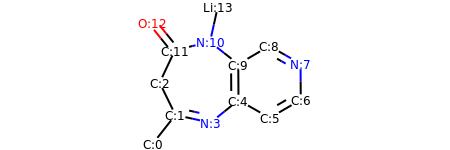

HETATM    1  C1  UNL     1      -2.761  -2.766   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.833  -1.588   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -2.493  -0.240   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -0.369  -1.912   0.000  1.00  0.00           N  
HETATM    5  C4  UNL     1       0.798  -0.970   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.102  -1.712   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.396  -0.954   0.000  1.00  0.00           C  
HETATM    8  N2  UNL     1       3.387   0.546   0.000  1.00  0.00           N  
HETATM    9  C7  UNL     1       2.083   1.288   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.789   0.530   0.000  1.00  0.00           C  
HETATM   11  N3  UNL     1      -0.390   1.458   0.000  1.00  0.00           N  
HETATM   12  C9  UNL     1      -1.850   1.115   0.000  1.00  0.00           C  
HETATM   13  O1  UNL     1  

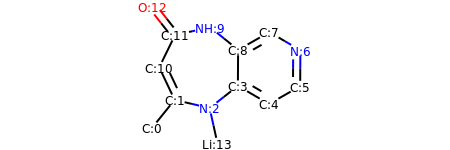

HETATM    1  C1  UNL     1      -2.793  -2.282   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.850  -1.115   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.390  -1.458   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       0.789  -0.530   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.083  -1.288   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.387  -0.546   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1       3.396   0.954   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       2.102   1.712   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.798   0.970   0.000  1.00  0.00           C  
HETATM   10  N3  UNL     1      -0.369   1.912   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -2.493   0.240   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1      -1.833   1.588   0.000  1.00  0.00           C  
HETATM   13  O1  UNL     1  

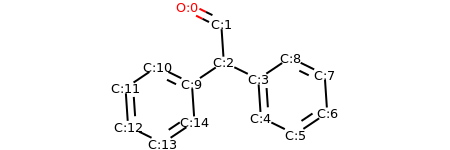

HETATM    1  O1  UNL     1      -1.424   3.112   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.077   2.450   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.023   0.954   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.369   0.292   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.469  -1.205   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.816  -1.866   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       4.062  -1.031   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.961   0.466   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.615   1.127   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.223   0.119   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -2.569   0.780   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -3.815  -0.055   0.000  1.00  0.00           C  
HETATM   13  C12 UNL     1  

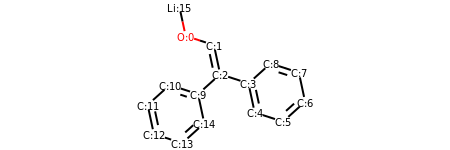

HETATM    1  O1  UNL     1      -1.718   2.605   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.291   2.143   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.022   0.676   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.449   0.213   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.762  -1.254   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.189  -1.716   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       4.303  -0.711   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.990   0.756   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.563   1.218   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.092  -0.329   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -2.519   0.133   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -3.633  -0.871   0.000  1.00  0.00           C  
HETATM   13  C12 UNL     1  

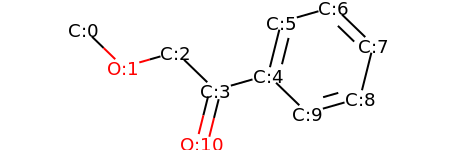

HETATM    1  C1  UNL     1      -4.484   1.052   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -3.406   0.009   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -1.964   0.421   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.886  -0.622   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.556  -0.210   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       0.920   1.246   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.363   1.658   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.441   0.615   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       3.077  -0.840   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       1.634  -1.252   0.000  1.00  0.00           C  
HETATM   11  O2  UNL     1      -1.250  -2.077   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3
CONECT    3    4
CONECT    4    5   11   11
CONECT    5    6    6   10
CONE

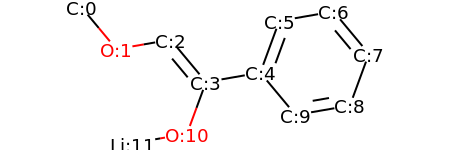

HETATM    1  C1  UNL     1      -4.101   1.707   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -3.141   0.555   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -1.663   0.811   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.702  -0.341   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.776  -0.085   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.293   1.323   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.771   1.579   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.732   0.427   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       3.215  -0.981   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       1.737  -1.237   0.000  1.00  0.00           C  
HETATM   11  O2  UNL     1      -1.219  -1.749   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1      -2.697  -2.005   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

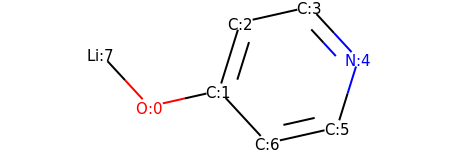

HETATM    1  O1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.159   1.129   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.305   1.459   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       2.322   0.357   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.876  -1.075   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.413  -1.405   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


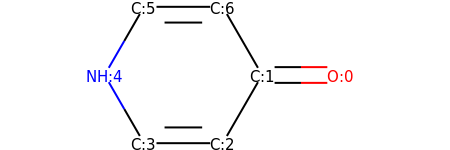

HETATM    1  O1  UNL     1       2.571   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.321  -1.299   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.179  -1.299   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -1.929   0.000   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -1.179   1.299   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4    4
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found primary alcohol
found primary amine


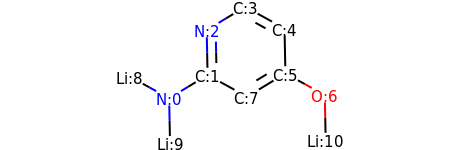

HETATM    1  N1  UNL     1      -2.231  -0.659   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.947   0.117   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.978   1.617   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.306   2.393   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.620   1.669   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.650   0.170   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1       2.964  -0.554   0.000  1.00  0.00           O  
HETATM    8  C5  UNL     1       0.367  -0.606   0.000  1.00  0.00           C  
HETATM    9 LI1  UNL     1      -3.545   0.065   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1      -2.201  -2.158   0.000  1.00  0.00          LI  
HETATM   11 LI3  UNL     1       2.994  -2.054   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6

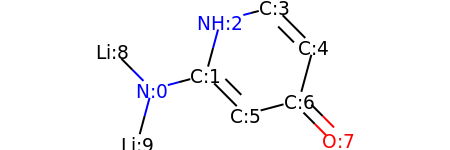

HETATM    1  N1  UNL     1      -2.096  -0.288   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.647   0.097   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.255   1.545   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.195   1.930   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.253   0.867   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.412  -0.966   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.861  -0.581   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.920  -1.644   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.155   0.775   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1      -2.488  -1.736   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################


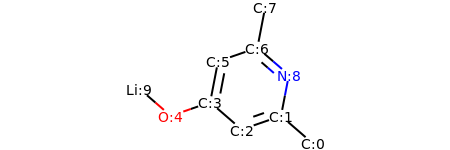

HETATM    1  C1  UNL     1       2.665  -1.964   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.531  -0.982   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.113  -1.473   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -1.021  -0.491   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1      -2.438  -0.982   0.000  1.00  0.00           O  
HETATM    6  C5  UNL     1      -0.737   0.982   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.680   1.473   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.964   2.946   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1       1.814   0.491   0.000  1.00  0.00           N  
HETATM   10 LI1  UNL     1      -3.572  -0.000   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    9
CONECT    3    4
CONECT    4    5    6    6
CONECT    5   10
CONECT    6    7
CONECT    7    8    9    9
END

search for patterns ...


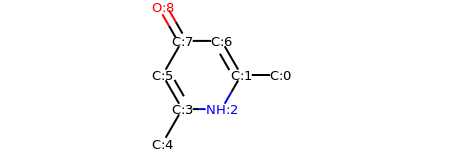

HETATM    1  C1  UNL     1       3.000   0.000   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.500  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.750  -1.299   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.750  -1.299   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.500  -2.598   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.500   0.000   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.750   1.299   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -0.750   1.299   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1      -1.500   2.598   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    7    7
CONECT    3    4
CONECT    4    5    6    6
CONECT    6    8
CONECT    7    8
CONECT    8    9    9
END

#################
#################
search for patterns ...
found primary alcohol


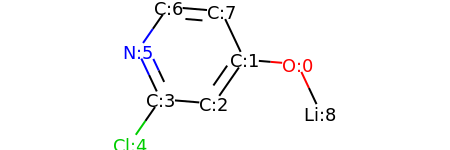

HETATM    1  O1  UNL     1       2.444   0.231   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.949   0.355   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.094  -0.877   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.401  -0.752   0.000  1.00  0.00           C  
HETATM    5 CL1  UNL     1      -2.256  -1.985   0.000  1.00  0.00          CL  
HETATM    6  N1  UNL     1      -2.040   0.604   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1      -1.185   1.837   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       0.310   1.712   0.000  1.00  0.00           C  
HETATM    9 LI1  UNL     1       3.084  -1.126   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    6    6
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...


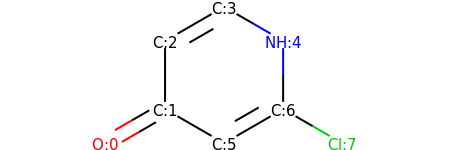

HETATM    1  O1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.299   1.125   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.000   1.875   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.299   1.125   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -0.000  -1.125   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8 CL1  UNL     1       2.598  -1.125   0.000  1.00  0.00          CL  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    7
CONECT    6    7    7
CONECT    7    8
END

#################
#################
search for patterns ...
found primary alcohol


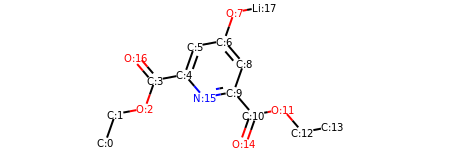

HETATM    1  C1  UNL     1      -5.416  -2.773   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -4.917  -1.359   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -3.443  -1.083   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -2.944   0.331   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.470   0.607   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -0.971   2.021   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.504   2.297   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1       1.002   3.711   0.000  1.00  0.00           O  
HETATM    9  C7  UNL     1       1.479   1.157   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.981  -0.257   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.956  -1.397   0.000  1.00  0.00           C  
HETATM   12  O3  UNL     1       3.431  -1.121   0.000  1.00  0.00           O  
HETATM   13  C10 UNL     1  

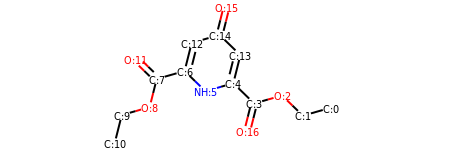

HETATM    1  C1  UNL     1       6.163  -1.184   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       4.721  -1.595   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       3.643  -0.551   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       2.201  -0.962   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.124   0.082   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1      -0.319  -0.329   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1      -1.396   0.714   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -2.839   0.303   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1      -3.204  -1.151   0.000  1.00  0.00           O  
HETATM   10  C7  UNL     1      -4.647  -1.563   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1      -5.012  -3.017   0.000  1.00  0.00           C  
HETATM   12  O3  UNL     1      -3.916   1.347   0.000  1.00  0.00           O  
HETATM   13  C9  UNL     1  

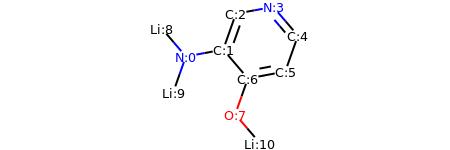

HETATM    1  N1  UNL     1      -1.918   0.244   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.443   0.518   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.057   1.932   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1       1.532   2.206   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       2.506   1.066   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.006  -0.348   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.532  -0.622   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       0.032  -2.036   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -2.892   1.384   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1      -2.418  -1.170   0.000  1.00  0.00          LI  
HETATM   11 LI3  UNL     1       1.006  -3.176   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6

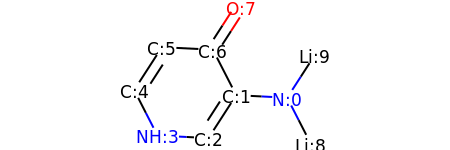

HETATM    1  N1  UNL     1       1.785  -0.350   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.287  -0.274   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.527  -1.534   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -2.026  -1.459   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -2.710  -0.124   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -1.896   1.135   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -0.397   1.060   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       0.417   2.320   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1       2.469  -1.684   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1       2.599   0.910   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################


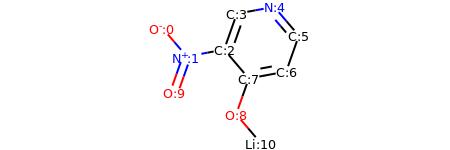

HETATM    1  O1  UNL     1      -2.892   1.384   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1      -1.918   0.244   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1      -0.443   0.518   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1       0.057   1.932   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       1.532   2.206   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       2.506   1.066   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       2.006  -0.348   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       0.532  -0.622   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1       0.032  -2.036   0.000  1.00  0.00           O  
HETATM   10  O3  UNL     1      -2.418  -1.170   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1       1.006  -3.176   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6    6

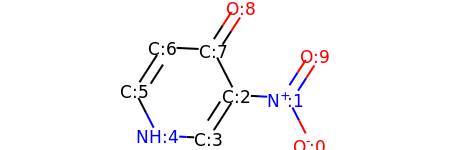

HETATM    1  O1  UNL     1       2.469  -1.684   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1       1.785  -0.350   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1       0.287  -0.274   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1      -0.527  -1.534   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -2.026  -1.459   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -2.710  -0.124   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1      -1.896   1.135   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1      -0.397   1.060   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1       0.417   2.320   0.000  1.00  0.00           O  
HETATM   10  O3  UNL     1       2.599   0.910   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9    9
END

#################
#

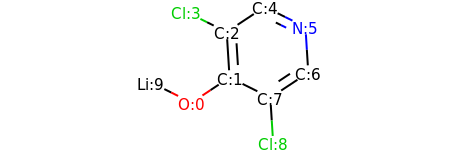

HETATM    1  O1  UNL     1      -1.615  -1.228   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.366  -0.399   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.459   1.098   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1      -1.802   1.766   0.000  1.00  0.00          CL  
HETATM    5  C3  UNL     1       0.791   1.928   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       2.134   1.261   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       2.227  -0.236   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       0.978  -1.066   0.000  1.00  0.00           C  
HETATM    9 CL2  UNL     1       1.071  -2.563   0.000  1.00  0.00          CL  
HETATM   10 LI1  UNL     1      -2.959  -0.561   0.000  1.00  0.00          LI  
CONECT    1    2   10
CONECT    2    3    3    8
CONECT    3    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
END

search for patterns ...


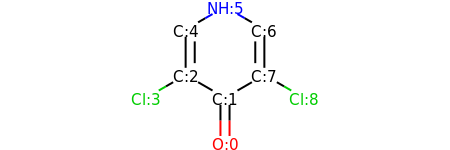

HETATM    1  O1  UNL     1       0.000  -2.333   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.000  -0.833   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.299  -0.083   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1      -2.598  -0.833   0.000  1.00  0.00          CL  
HETATM    5  C3  UNL     1      -1.299   1.417   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1      -0.000   2.167   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.299   1.417   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       1.299  -0.083   0.000  1.00  0.00           C  
HETATM    9 CL2  UNL     1       2.598  -0.833   0.000  1.00  0.00          CL  
CONECT    1    2    2
CONECT    2    3    8
CONECT    3    4    5    5
CONECT    5    6
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
END

#################
#################
search for patterns ...
found primary alcohol


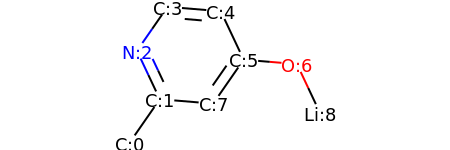

HETATM    1  C1  UNL     1      -2.256  -1.985   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.401  -0.752   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.040   0.604   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -1.185   1.837   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.310   1.712   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       0.949   0.355   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1       2.444   0.231   0.000  1.00  0.00           O  
HETATM    8  C6  UNL     1       0.094  -0.877   0.000  1.00  0.00           C  
HETATM    9 LI1  UNL     1       3.084  -1.126   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    8    8
CONECT    7    9
END

search for patterns ...


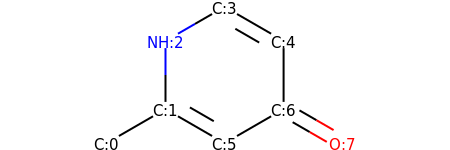

HETATM    1  C1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.299   1.125   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       0.000   1.875   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.299   1.125   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -0.000  -1.125   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.598  -1.125   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    6    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


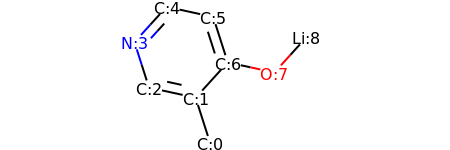

HETATM    1  C1  UNL     1       0.049  -2.522   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.408  -1.093   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -1.874  -0.775   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -2.331   0.654   0.000  1.00  0.00           N  
HETATM    5  C4  UNL     1      -1.322   1.764   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       0.143   1.446   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.601   0.017   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.067  -0.301   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1       3.075   0.809   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9
END

search for patterns ...


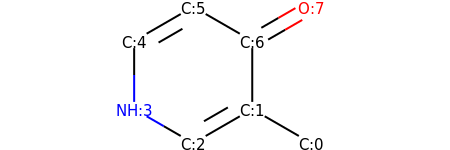

HETATM    1  C1  UNL     1       1.949  -1.500   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       0.650  -0.750   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.650  -1.500   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.949  -0.750   0.000  1.00  0.00           N  
HETATM    5  C4  UNL     1      -1.949   0.750   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -0.650   1.500   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.650   0.750   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       1.949   1.500   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


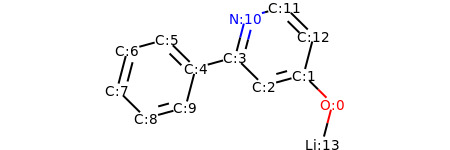

HETATM    1  O1  UNL     1       3.716  -1.193   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       2.649  -0.139   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.203  -0.536   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.135   0.518   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.311   0.121   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -2.378   1.175   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -3.825   0.778   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -4.204  -0.673   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -3.137  -1.727   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.690  -1.330   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1       0.515   1.970   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1       1.961   2.367   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

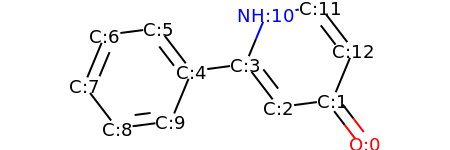

HETATM    1  O1  UNL     1       3.744  -1.928   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       2.831  -0.738   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.344  -0.933   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.432   0.258   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.056   0.063   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.968   1.254   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -3.455   1.059   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -4.030  -0.326   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -3.118  -1.517   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -1.631  -1.322   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1       1.007   1.644   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1       2.494   1.838   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

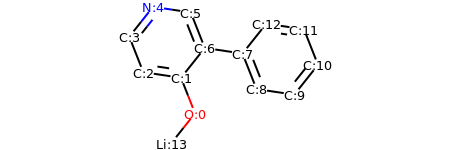

HETATM    1  O1  UNL     1      -0.898  -2.024   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.448  -0.629   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.931  -0.407   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -3.482   0.988   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -2.548   2.162   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -1.065   1.941   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -0.514   0.546   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       0.969   0.325   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.519  -1.071   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.003  -1.292   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       3.936  -0.118   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       3.386   1.278   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

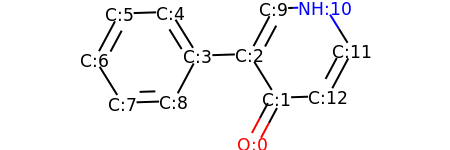

HETATM    1  O1  UNL     1       0.770  -2.374   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.477  -1.052   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.685   0.222   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.814   0.173   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.606   1.447   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -3.105   1.398   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -3.812   0.076   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -3.020  -1.198   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -1.521  -1.149   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       1.393   1.545   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1       2.892   1.594   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1       3.684   0.320   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

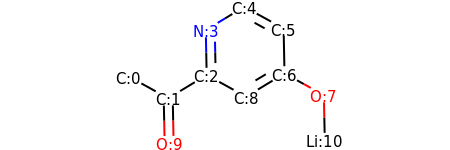

HETATM    1  C1  UNL     1      -3.545   0.065   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.231  -0.659   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.947   0.117   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -0.978   1.617   0.000  1.00  0.00           N  
HETATM    5  C4  UNL     1       0.306   2.393   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.620   1.669   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.650   0.170   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.964  -0.554   0.000  1.00  0.00           O  
HETATM    9  C7  UNL     1       0.367  -0.606   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1      -2.201  -2.158   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1       2.994  -2.054   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4    4    9
CONECT    4    5
CONECT    5    6    6

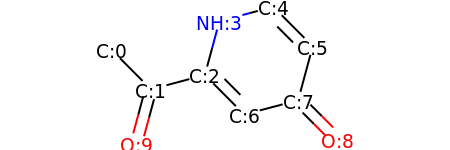

HETATM    1  C1  UNL     1      -3.155   0.775   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.096  -0.288   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.647   0.097   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -0.255   1.545   0.000  1.00  0.00           N  
HETATM    5  C4  UNL     1       1.195   1.930   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.253   0.867   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.412  -0.966   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.861  -0.581   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       2.920  -1.644   0.000  1.00  0.00           O  
HETATM   10  O2  UNL     1      -2.488  -1.736   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4    7    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    8
CONECT    7    8
CONECT    8    9    9
END

#################
#

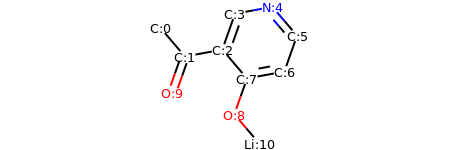

HETATM    1  C1  UNL     1      -2.892   1.384   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.918   0.244   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.443   0.518   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.057   1.932   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.532   2.206   0.000  1.00  0.00           N  
HETATM    6  C5  UNL     1       2.506   1.066   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.006  -0.348   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.532  -0.622   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       0.032  -2.036   0.000  1.00  0.00           O  
HETATM   10  O2  UNL     1      -2.418  -1.170   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1       1.006  -3.176   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6    6

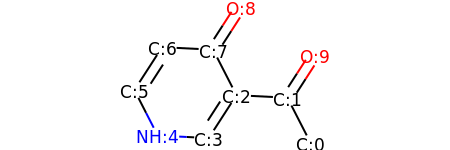

HETATM    1  C1  UNL     1       2.469  -1.684   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.785  -0.350   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.287  -0.274   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.527  -1.534   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -2.026  -1.459   0.000  1.00  0.00           N  
HETATM    6  C5  UNL     1      -2.710  -0.124   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -1.896   1.135   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -0.397   1.060   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       0.417   2.320   0.000  1.00  0.00           O  
HETATM   10  O2  UNL     1       2.599   0.910   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9    9
END

#################
#

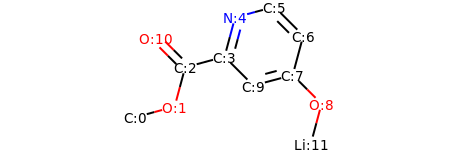

HETATM    1  C1  UNL     1      -3.816  -1.695   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -2.367  -1.307   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -1.979   0.142   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.530   0.530   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.142   1.979   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.307   2.367   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.367   1.307   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.979  -0.142   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1       3.040  -1.203   0.000  1.00  0.00           O  
HETATM   10  C7  UNL     1       0.530  -0.530   0.000  1.00  0.00           C  
HETATM   11  O3  UNL     1      -3.040   1.203   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1       2.652  -2.652   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

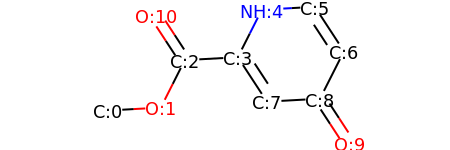

HETATM    1  C1  UNL     1      -3.896  -1.163   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -2.398  -1.080   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -1.722   0.259   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.224   0.342   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.453   1.681   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.950   1.765   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.771   0.509   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       0.597  -0.913   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.095  -0.830   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1       2.916  -2.085   0.000  1.00  0.00           O  
HETATM   11  O3  UNL     1      -2.543   1.514   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3
CONECT    3    4   11   11
CONECT    4    5    8    8
CONECT    5    6
CONE

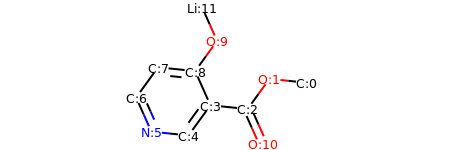

HETATM    1  C1  UNL     1       3.797   0.259   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1       2.305   0.414   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1       1.425  -0.801   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.067  -0.646   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.947  -1.861   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1      -2.439  -1.706   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1      -3.051  -0.336   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -2.171   0.878   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -0.679   0.724   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1       0.201   1.938   0.000  1.00  0.00           O  
HETATM   11  O3  UNL     1       2.037  -2.171   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1      -0.411   3.308   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

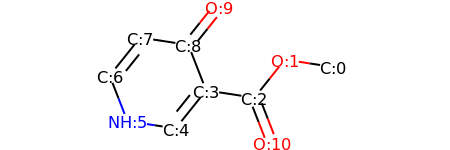

HETATM    1  C1  UNL     1       3.782   0.378   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1       2.299   0.605   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1       1.362  -0.566   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.121  -0.340   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.058  -1.511   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1      -2.541  -1.284   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1      -3.087   0.113   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -2.149   1.284   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -0.666   1.057   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1       0.271   2.228   0.000  1.00  0.00           O  
HETATM   11  O3  UNL     1       1.907  -1.964   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3
CONECT    3    4   11   11
CONECT    4    5    5    9
CONECT    5    6
CONE

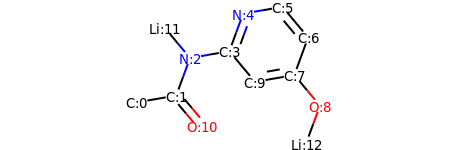

HETATM    1  C1  UNL     1      -3.836  -1.174   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.359  -0.917   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.842   0.491   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.364   0.748   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       0.152   2.156   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.630   2.413   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.591   1.262   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.075  -0.147   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       3.036  -1.298   0.000  1.00  0.00           O  
HETATM   10  C7  UNL     1       0.597  -0.403   0.000  1.00  0.00           C  
HETATM   11  O2  UNL     1      -1.397  -2.068   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1      -2.803   1.643   0.000  1.00  0.00          LI  
HETATM   13 LI2  UNL     1  

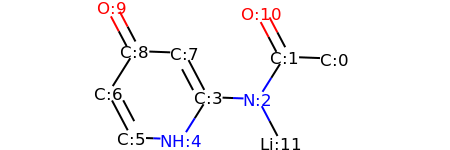

HETATM    1  C1  UNL     1       3.839   0.612   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.340   0.669   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.541  -0.600   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       0.042  -0.543   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -0.757  -1.813   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -2.256  -1.755   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -2.956  -0.429   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -0.658   0.783   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -2.157   0.841   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1      -2.857   2.167   0.000  1.00  0.00           O  
HETATM   11  O2  UNL     1       1.640   1.996   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1       2.241  -1.927   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

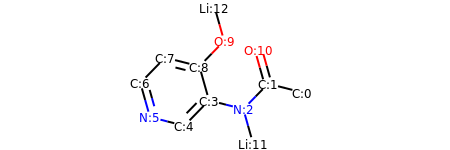

HETATM    1  C1  UNL     1       3.646  -0.410   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.192  -0.041   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.145  -1.115   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.308  -0.746   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.355  -1.821   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -2.809  -1.452   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1      -3.216  -0.009   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -2.170   1.066   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -0.716   0.697   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1       0.331   1.772   0.000  1.00  0.00           O  
HETATM   11  O2  UNL     1       1.784   1.403   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1       1.553  -2.559   0.000  1.00  0.00          LI  
HETATM   13 LI2  UNL     1  

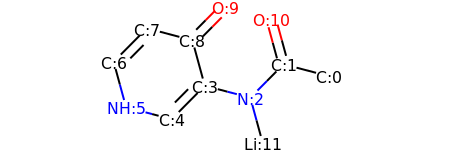

HETATM    1  C1  UNL     1       3.638  -0.173   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.187   0.208   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       1.132  -0.857   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1      -0.319  -0.476   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.375  -1.541   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -2.825  -1.160   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1      -3.220   0.287   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -2.165   1.353   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -0.714   0.971   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1       0.342   2.037   0.000  1.00  0.00           O  
HETATM   11  O2  UNL     1       1.793   1.655   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1       1.526  -2.304   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

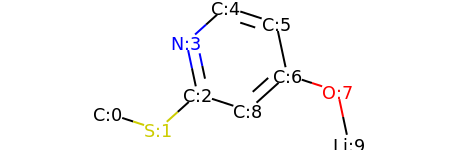

HETATM    1  C1  UNL     1      -3.669  -0.858   0.000  1.00  0.00           C  
HETATM    2  S1  UNL     1      -2.242  -1.321   0.000  1.00  0.00           S  
HETATM    3  C2  UNL     1      -1.128  -0.317   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.440   1.150   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -0.326   2.154   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.101   1.691   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.413   0.224   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.840  -0.239   0.000  1.00  0.00           O  
HETATM    9  C6  UNL     1       0.299  -0.780   0.000  1.00  0.00           C  
HETATM   10 LI1  UNL     1       3.152  -1.706   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3
CONECT    3    4    4    9
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    9    9
CONECT    8   10
END

search for patterns ...


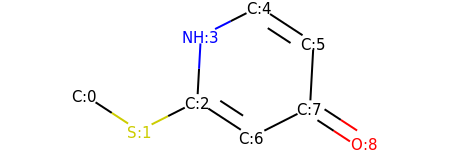

HETATM    1  C1  UNL     1      -3.477  -0.142   0.000  1.00  0.00           C  
HETATM    2  S1  UNL     1      -2.221  -0.963   0.000  1.00  0.00           S  
HETATM    3  C2  UNL     1      -0.883  -0.285   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -0.801   1.213   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.538   1.890   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.794   1.070   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.373  -1.106   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.711  -0.428   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       2.967  -1.248   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3
CONECT    3    4    7    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    8
CONECT    7    8
CONECT    8    9    9
END

#################
#################
search for patterns ...
found primary alcohol


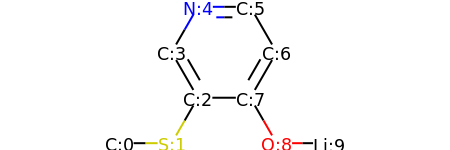

HETATM    1  C1  UNL     1      -3.000  -1.559   0.000  1.00  0.00           C  
HETATM    2  S1  UNL     1      -1.500  -1.559   0.000  1.00  0.00           S  
HETATM    3  C2  UNL     1      -0.750  -0.260   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.500   1.039   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.750   2.338   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       0.750   2.338   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.500   1.039   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       0.750  -0.260   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       1.500  -1.559   0.000  1.00  0.00           O  
HETATM   10 LI1  UNL     1       3.000  -1.559   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
CONECT    9   10
END

search for p

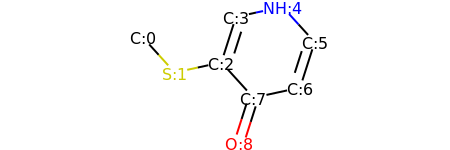

HETATM    1  C1  UNL     1      -3.075   0.809   0.000  1.00  0.00           C  
HETATM    2  S1  UNL     1      -2.067  -0.301   0.000  1.00  0.00           S  
HETATM    3  C2  UNL     1      -0.601   0.017   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.143   1.446   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.322   1.764   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       2.331   0.654   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.874  -0.775   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       0.408  -1.093   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1      -0.049  -2.522   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9    9
END

#################
#################
search for patterns ...


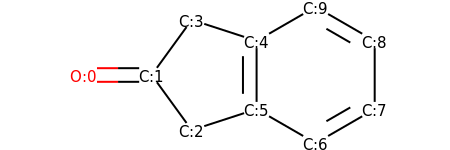

HETATM    1  O1  UNL     1      -3.691  -0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.191  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.309  -1.214   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.309   1.214   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.118   0.750   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       0.118  -0.750   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.417  -1.500   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.716  -0.750   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.716   0.750   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       1.417   1.500   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    4
CONECT    3    6
CONECT    4    5
CONECT    5    6    6   10
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
CONECT    9   10   10
END

se

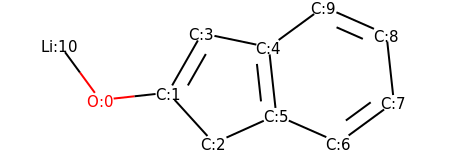

HETATM    1  O1  UNL     1      -3.255  -0.475   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.764  -0.312   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.755  -1.422   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.019   0.990   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.449   0.685   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       0.613  -0.806   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.986  -1.410   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.195  -0.524   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       3.032   0.968   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       1.659   1.572   0.000  1.00  0.00           C  
HETATM   11 LI1  UNL     1      -4.142   0.735   0.000  1.00  0.00          LI  
CONECT    1    2   11
CONECT    2    3    4    4
CONECT    3    6
CONECT    4    5
CONECT    5    6    6   10

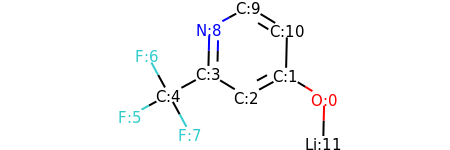

HETATM    1  O1  UNL     1       3.125  -0.637   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.844   0.144   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.528  -0.575   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.753   0.205   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -2.070  -0.513   0.000  1.00  0.00           C  
HETATM    6  F1  UNL     1      -3.386  -1.232   0.000  1.00  0.00           F  
HETATM    7  F2  UNL     1      -2.788   0.803   0.000  1.00  0.00           F  
HETATM    8  F3  UNL     1      -1.351  -1.830   0.000  1.00  0.00           F  
HETATM    9  N1  UNL     1      -0.717   1.705   0.000  1.00  0.00           N  
HETATM   10  C5  UNL     1       0.599   2.424   0.000  1.00  0.00           C  
HETATM   11  C6  UNL     1       1.880   1.643   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1       3.089  -2.137   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

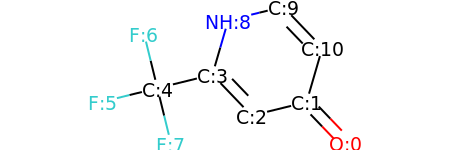

HETATM    1  O1  UNL     1       3.079  -1.676   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       2.041  -0.593   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.584  -0.951   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.454   0.132   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.910  -0.226   0.000  1.00  0.00           C  
HETATM    6  F1  UNL     1      -3.367  -0.583   0.000  1.00  0.00           F  
HETATM    7  F2  UNL     1      -2.268   1.231   0.000  1.00  0.00           F  
HETATM    8  F3  UNL     1      -1.553  -1.682   0.000  1.00  0.00           F  
HETATM    9  N1  UNL     1      -0.035   1.572   0.000  1.00  0.00           N  
HETATM   10  C5  UNL     1       1.422   1.930   0.000  1.00  0.00           C  
HETATM   11  C6  UNL     1       2.460   0.847   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4    4
CONECT    4    5    9
CONECT    5    6    7

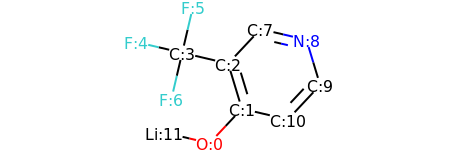

HETATM    1  O1  UNL     1      -0.493  -2.108   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.533  -1.014   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.099   0.422   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.362   0.763   0.000  1.00  0.00           C  
HETATM    5  F1  UNL     1      -2.823   1.105   0.000  1.00  0.00           F  
HETATM    6  F2  UNL     1      -1.020   2.224   0.000  1.00  0.00           F  
HETATM    7  F3  UNL     1      -1.704  -0.697   0.000  1.00  0.00           F  
HETATM    8  C4  UNL     1       1.125   1.516   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1       2.585   1.174   0.000  1.00  0.00           N  
HETATM   10  C5  UNL     1       3.020  -0.262   0.000  1.00  0.00           C  
HETATM   11  C6  UNL     1       1.994  -1.356   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -1.954  -1.767   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

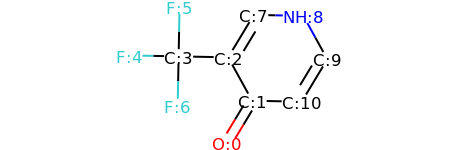

HETATM    1  O1  UNL     1      -0.182  -2.359   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.593  -1.074   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.132   0.239   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.632   0.268   0.000  1.00  0.00           C  
HETATM    5  F1  UNL     1      -3.131   0.296   0.000  1.00  0.00           F  
HETATM    6  F2  UNL     1      -1.603   1.767   0.000  1.00  0.00           F  
HETATM    7  F3  UNL     1      -1.660  -1.232   0.000  1.00  0.00           F  
HETATM    8  C4  UNL     1       0.643   1.523   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1       2.143   1.494   0.000  1.00  0.00           N  
HETATM   10  C5  UNL     1       2.868   0.181   0.000  1.00  0.00           C  
HETATM   11  C6  UNL     1       2.093  -1.103   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4    8    8
CONECT    4    5    6    7
CONECT    8

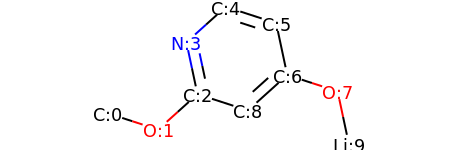

HETATM    1  C1  UNL     1      -3.669  -0.858   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -2.242  -1.321   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -1.128  -0.317   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.440   1.150   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -0.326   2.154   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.101   1.691   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.413   0.224   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1       2.840  -0.239   0.000  1.00  0.00           O  
HETATM    9  C6  UNL     1       0.299  -0.780   0.000  1.00  0.00           C  
HETATM   10 LI1  UNL     1       3.152  -1.706   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3
CONECT    3    4    4    9
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    9    9
CONECT    8   10
END

search for patterns ...


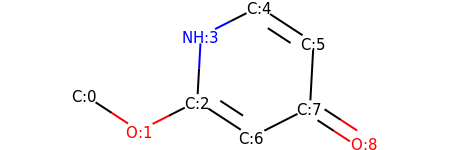

HETATM    1  C1  UNL     1      -3.477  -0.142   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -2.221  -0.963   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -0.883  -0.285   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -0.801   1.213   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.538   1.890   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.794   1.070   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.373  -1.106   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.711  -0.428   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1       2.967  -1.248   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3
CONECT    3    4    7    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    8
CONECT    7    8
CONECT    8    9    9
END

#################
#################
search for patterns ...
found primary alcohol


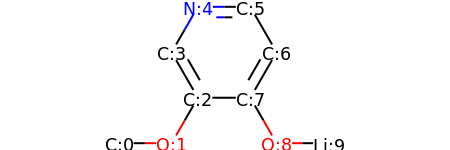

HETATM    1  C1  UNL     1      -3.000  -1.559   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -1.500  -1.559   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -0.750  -0.260   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.500   1.039   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.750   2.338   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       0.750   2.338   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.500   1.039   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       0.750  -0.260   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1       1.500  -1.559   0.000  1.00  0.00           O  
HETATM   10 LI1  UNL     1       3.000  -1.559   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
CONECT    9   10
END

search for p

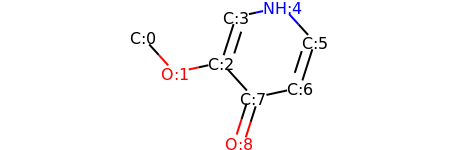

HETATM    1  C1  UNL     1      -3.075   0.809   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -2.067  -0.301   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -0.601   0.017   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.143   1.446   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.322   1.764   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       2.331   0.654   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.874  -0.775   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       0.408  -1.093   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1      -0.049  -2.522   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9    9
END

#################
#################
search for patterns ...
found primary alcohol


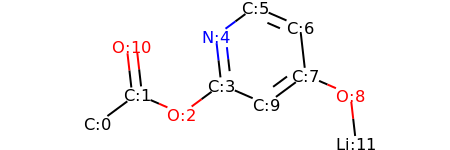

HETATM    1  C1  UNL     1      -4.204  -1.358   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.998  -0.466   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -1.622  -1.065   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -0.416  -0.173   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.585   1.317   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       0.621   2.209   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.996   1.611   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.165   0.120   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1       3.541  -0.478   0.000  1.00  0.00           O  
HETATM   10  C7  UNL     1       0.959  -0.772   0.000  1.00  0.00           C  
HETATM   11  O3  UNL     1      -3.167   1.024   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1       3.710  -1.969   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

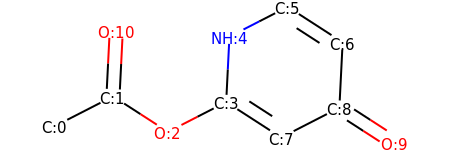

HETATM    1  C1  UNL     1      -4.065  -0.889   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.730  -0.205   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -1.470  -1.019   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -0.135  -0.335   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.060   1.164   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.275   1.848   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.535   1.034   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.125  -1.148   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.460  -0.464   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1       3.720  -1.278   0.000  1.00  0.00           O  
HETATM   11  O3  UNL     1      -2.655   1.293   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3   11   11
CONECT    3    4
CONECT    4    5    8    8
CONECT    5    6
CONE

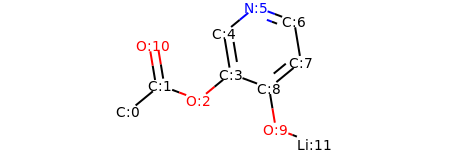

HETATM    1  C1  UNL     1      -3.838  -1.335   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.680  -0.382   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -1.276  -0.909   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -0.117   0.044   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.363   1.524   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       0.796   2.476   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1       2.200   1.950   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.446   0.470   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.287  -0.483   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1       1.533  -1.963   0.000  1.00  0.00           O  
HETATM   11  O3  UNL     1      -2.926   1.098   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1       2.938  -2.490   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

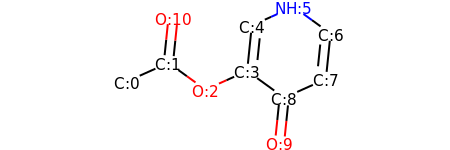

HETATM    1  C1  UNL     1      -3.857  -0.563   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.488   0.050   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -1.272  -0.829   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       0.097  -0.216   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.250   1.277   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       1.619   1.890   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1       2.834   1.011   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.681  -0.481   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.312  -1.094   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1       1.159  -2.587   0.000  1.00  0.00           O  
HETATM   11  O3  UNL     1      -2.334   1.542   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3   11   11
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6
CONE

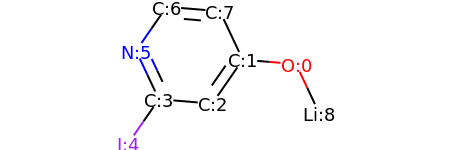

HETATM    1  O1  UNL     1       2.444   0.231   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.949   0.355   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.094  -0.877   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.401  -0.752   0.000  1.00  0.00           C  
HETATM    5  I1  UNL     1      -2.256  -1.985   0.000  1.00  0.00           I  
HETATM    6  N1  UNL     1      -2.040   0.604   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1      -1.185   1.837   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       0.310   1.712   0.000  1.00  0.00           C  
HETATM    9 LI1  UNL     1       3.084  -1.126   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    6    6
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...


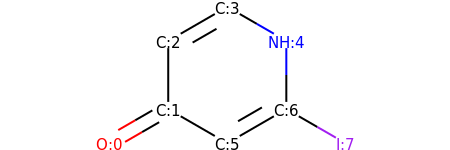

HETATM    1  O1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.299   1.125   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.000   1.875   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.299   1.125   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -0.000  -1.125   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8  I1  UNL     1       2.598  -1.125   0.000  1.00  0.00           I  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    7
CONECT    6    7    7
CONECT    7    8
END

#################
#################
search for patterns ...
found primary alcohol


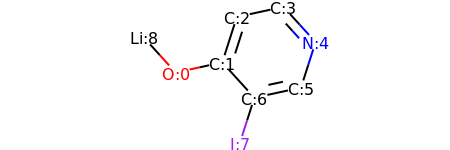

HETATM    1  O1  UNL     1      -2.067  -0.301   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.601   0.017   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.143   1.446   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.322   1.764   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       2.331   0.654   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.874  -0.775   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.408  -1.093   0.000  1.00  0.00           C  
HETATM    8  I1  UNL     1      -0.049  -2.522   0.000  1.00  0.00           I  
HETATM    9 LI1  UNL     1      -3.075   0.809   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
END

search for patterns ...


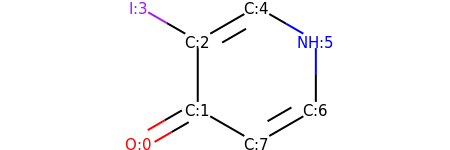

HETATM    1  O1  UNL     1      -1.949  -1.500   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.650  -0.750   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.650   0.750   0.000  1.00  0.00           C  
HETATM    4  I1  UNL     1      -1.949   1.500   0.000  1.00  0.00           I  
HETATM    5  C3  UNL     1       0.650   1.500   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       1.949   0.750   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.949  -0.750   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       0.650  -1.500   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    8
CONECT    3    4    5    5
CONECT    5    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


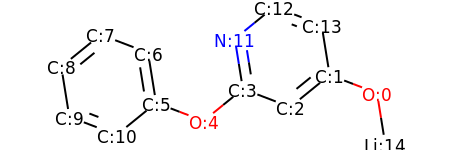

HETATM    1  O1  UNL     1       4.621  -0.372   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       3.219   0.162   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.056  -0.784   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.654  -0.250   0.000  1.00  0.00           C  
HETATM    5  O2  UNL     1      -0.510  -1.196   0.000  1.00  0.00           O  
HETATM    6  C4  UNL     1      -1.911  -0.661   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -2.149   0.820   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -3.550   1.354   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -4.714   0.408   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -4.476  -1.073   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -3.075  -1.608   0.000  1.00  0.00           C  
HETATM   12  N1  UNL     1       0.416   1.232   0.000  1.00  0.00           N  
HETATM   13  C10 UNL     1  

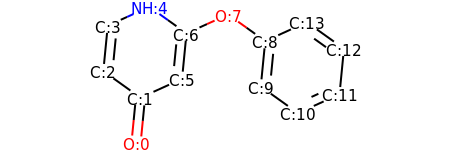

HETATM    1  O1  UNL     1      -2.682  -2.645   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.537  -1.152   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -3.756  -0.279   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -3.611   1.214   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -2.245   1.834   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -1.171  -0.532   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -1.025   0.961   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1       0.341   1.581   0.000  1.00  0.00           O  
HETATM    9  C6  UNL     1       1.561   0.709   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       1.415  -0.784   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       2.635  -1.657   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       4.001  -1.037   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

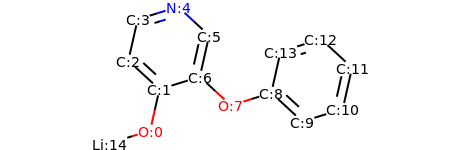

HETATM    1  O1  UNL     1      -2.651  -1.914   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.321  -0.451   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -3.423   0.566   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -3.094   2.030   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -1.661   2.476   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -0.559   1.459   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -0.889  -0.005   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1       0.214  -1.022   0.000  1.00  0.00           O  
HETATM    9  C6  UNL     1       1.646  -0.576   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       2.748  -1.593   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       4.180  -1.147   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       4.510   0.316   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

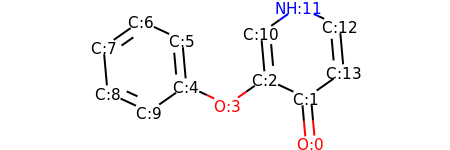

HETATM    1  O1  UNL     1       2.641  -2.454   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       2.508  -0.960   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.147  -0.328   0.000  1.00  0.00           C  
HETATM    4  O2  UNL     1      -0.080  -1.190   0.000  1.00  0.00           O  
HETATM    5  C3  UNL     1      -1.441  -0.559   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -1.574   0.935   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -2.934   1.567   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -4.162   0.705   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -4.029  -0.789   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -2.668  -1.421   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.014   1.166   0.000  1.00  0.00           C  
HETATM   12  N1  UNL     1       2.241   2.028   0.000  1.00  0.00           N  
HETATM   13  C10 UNL     1  

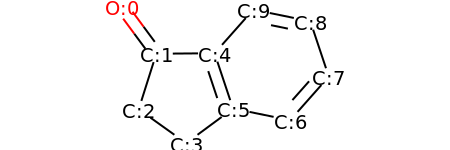

HETATM    1  O1  UNL     1      -2.615   1.633   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.724   0.426   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.177  -1.004   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.956  -1.876   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.224   0.438   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       0.250  -0.985   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.720  -1.286   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.715  -0.164   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.240   1.259   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       0.771   1.560   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    5
CONECT    3    4
CONECT    4    6
CONECT    5    6    6   10
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
CONECT    9   10   10
END

se

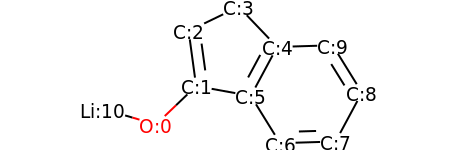

HETATM    1  O1  UNL     1      -2.465  -1.096   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.381  -0.058   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.583   1.428   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.232   2.080   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.805   0.996   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       0.095  -0.325   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       0.884  -1.601   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.384  -1.555   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       3.094  -0.234   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       2.304   1.042   0.000  1.00  0.00           C  
HETATM   11 LI1  UNL     1      -3.905  -0.676   0.000  1.00  0.00          LI  
CONECT    1    2   11
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6    6   10

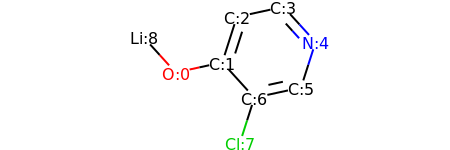

HETATM    1  O1  UNL     1      -2.067  -0.301   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.601   0.017   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.143   1.446   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.322   1.764   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       2.331   0.654   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.874  -0.775   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.408  -1.093   0.000  1.00  0.00           C  
HETATM    8 CL1  UNL     1      -0.049  -2.522   0.000  1.00  0.00          CL  
HETATM    9 LI1  UNL     1      -3.075   0.809   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
END

search for patterns ...


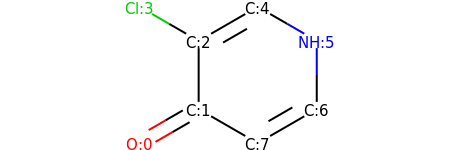

HETATM    1  O1  UNL     1      -1.949  -1.500   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.650  -0.750   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.650   0.750   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1      -1.949   1.500   0.000  1.00  0.00          CL  
HETATM    5  C3  UNL     1       0.650   1.500   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       1.949   0.750   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.949  -0.750   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       0.650  -1.500   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    8
CONECT    3    4    5    5
CONECT    5    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


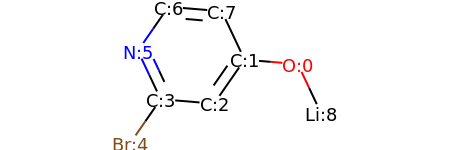

HETATM    1  O1  UNL     1       2.444   0.231   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.949   0.355   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.094  -0.877   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.401  -0.752   0.000  1.00  0.00           C  
HETATM    5 BR1  UNL     1      -2.256  -1.985   0.000  1.00  0.00          BR  
HETATM    6  N1  UNL     1      -2.040   0.604   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1      -1.185   1.837   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       0.310   1.712   0.000  1.00  0.00           C  
HETATM    9 LI1  UNL     1       3.084  -1.126   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    6    6
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...


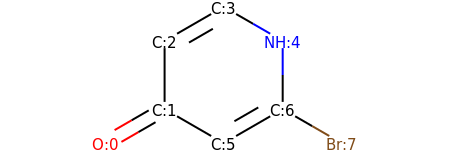

HETATM    1  O1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.299   1.125   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.000   1.875   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.299   1.125   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -0.000  -1.125   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8 BR1  UNL     1       2.598  -1.125   0.000  1.00  0.00          BR  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    7
CONECT    6    7    7
CONECT    7    8
END

#################
#################
search for patterns ...
found primary alcohol


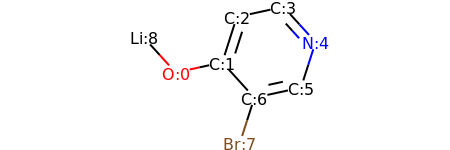

HETATM    1  O1  UNL     1      -2.067  -0.301   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.601   0.017   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.143   1.446   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.322   1.764   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       2.331   0.654   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.874  -0.775   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.408  -1.093   0.000  1.00  0.00           C  
HETATM    8 BR1  UNL     1      -0.049  -2.522   0.000  1.00  0.00          BR  
HETATM    9 LI1  UNL     1      -3.075   0.809   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
END

search for patterns ...


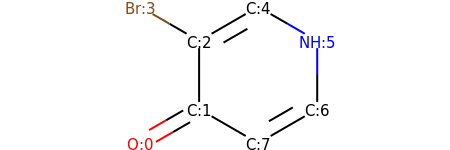

HETATM    1  O1  UNL     1      -1.949  -1.500   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.650  -0.750   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.650   0.750   0.000  1.00  0.00           C  
HETATM    4 BR1  UNL     1      -1.949   1.500   0.000  1.00  0.00          BR  
HETATM    5  C3  UNL     1       0.650   1.500   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       1.949   0.750   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.949  -0.750   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       0.650  -1.500   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    8
CONECT    3    4    5    5
CONECT    5    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


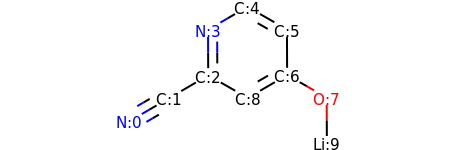

HETATM    1  N1  UNL     1      -3.761  -1.441   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -2.465  -0.685   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.169   0.070   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -1.176   1.570   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.120   2.326   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.422   1.581   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.429   0.081   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.731  -0.664   0.000  1.00  0.00           O  
HETATM    9  C6  UNL     1       0.133  -0.674   0.000  1.00  0.00           C  
HETATM   10 LI1  UNL     1       2.737  -2.164   0.000  1.00  0.00          LI  
CONECT    1    2    2    2
CONECT    2    3
CONECT    3    4    4    9
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    9    9
CONECT    8   10
END

search for pat

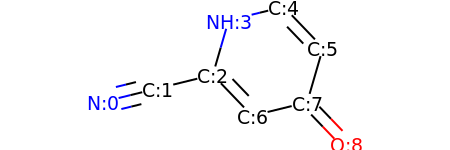

HETATM    1  N1  UNL     1      -3.791  -0.635   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -2.335  -0.277   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.878   0.081   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -0.460   1.522   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.996   1.880   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.035   0.798   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.160  -1.001   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.617  -0.643   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       2.656  -1.725   0.000  1.00  0.00           O  
CONECT    1    2    2    2
CONECT    2    3
CONECT    3    4    7    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    8
CONECT    7    8
CONECT    8    9    9
END

#################
#################
search for patterns ...
found primary alcohol


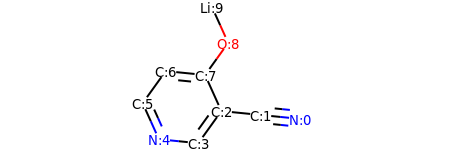

HETATM    1  N1  UNL     1       3.443  -0.996   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       1.951  -0.847   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.458  -0.698   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.417  -1.917   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.910  -1.768   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -2.527  -0.401   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -1.652   0.817   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -0.159   0.669   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       0.716   1.887   0.000  1.00  0.00           O  
HETATM   10 LI1  UNL     1       0.098   3.254   0.000  1.00  0.00          LI  
CONECT    1    2    2    2
CONECT    2    3
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
CONECT    9   10
END

se

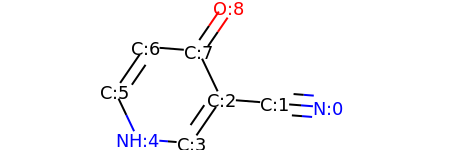

HETATM    1  N1  UNL     1       3.467  -0.561   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       1.971  -0.444   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.476  -0.327   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.373  -1.563   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.869  -1.446   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -2.515  -0.093   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -1.666   1.144   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -0.170   1.027   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       0.679   2.263   0.000  1.00  0.00           O  
CONECT    1    2    2    2
CONECT    2    3
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9    9
END

#################
#################
search for patterns ...
found primary alcohol


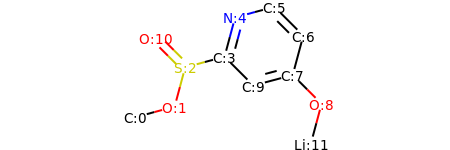

HETATM    1  C1  UNL     1      -3.816  -1.695   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -2.367  -1.307   0.000  1.00  0.00           O  
HETATM    3  S1  UNL     1      -1.979   0.142   0.000  1.00  0.00           S  
HETATM    4  C2  UNL     1      -0.530   0.530   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.142   1.979   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       1.307   2.367   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       2.367   1.307   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       1.979  -0.142   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1       3.040  -1.203   0.000  1.00  0.00           O  
HETATM   10  C6  UNL     1       0.530  -0.530   0.000  1.00  0.00           C  
HETATM   11  O3  UNL     1      -3.040   1.203   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1       2.652  -2.652   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

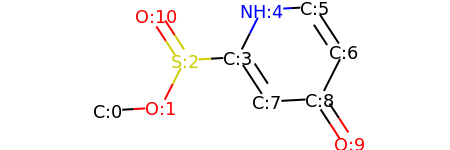

HETATM    1  C1  UNL     1      -3.896  -1.163   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -2.398  -1.080   0.000  1.00  0.00           O  
HETATM    3  S1  UNL     1      -1.722   0.259   0.000  1.00  0.00           S  
HETATM    4  C2  UNL     1      -0.224   0.342   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.453   1.681   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       1.950   1.765   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       2.771   0.509   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       0.597  -0.913   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.095  -0.830   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1       2.916  -2.085   0.000  1.00  0.00           O  
HETATM   11  O3  UNL     1      -2.543   1.514   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3
CONECT    3    4   11   11
CONECT    4    5    8    8
CONECT    5    6
CONE

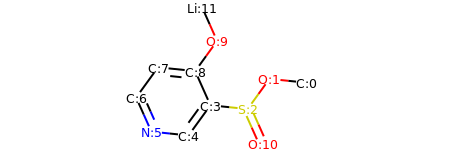

HETATM    1  C1  UNL     1       3.797   0.259   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1       2.305   0.414   0.000  1.00  0.00           O  
HETATM    3  S1  UNL     1       1.425  -0.801   0.000  1.00  0.00           S  
HETATM    4  C2  UNL     1      -0.067  -0.646   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -0.947  -1.861   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1      -2.439  -1.706   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1      -3.051  -0.336   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1      -2.171   0.878   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1      -0.679   0.724   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1       0.201   1.938   0.000  1.00  0.00           O  
HETATM   11  O3  UNL     1       2.037  -2.171   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1      -0.411   3.308   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

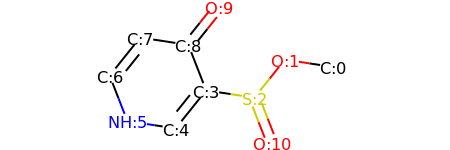

HETATM    1  C1  UNL     1       3.782   0.378   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1       2.299   0.605   0.000  1.00  0.00           O  
HETATM    3  S1  UNL     1       1.362  -0.566   0.000  1.00  0.00           S  
HETATM    4  C2  UNL     1      -0.121  -0.340   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.058  -1.511   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1      -2.541  -1.284   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1      -3.087   0.113   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1      -2.149   1.284   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1      -0.666   1.057   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1       0.271   2.228   0.000  1.00  0.00           O  
HETATM   11  O3  UNL     1       1.907  -1.964   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3
CONECT    3    4   11   11
CONECT    4    5    5    9
CONECT    5    6
CONE

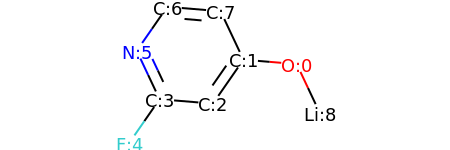

HETATM    1  O1  UNL     1       2.444   0.231   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.949   0.355   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.094  -0.877   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.401  -0.752   0.000  1.00  0.00           C  
HETATM    5  F1  UNL     1      -2.256  -1.985   0.000  1.00  0.00           F  
HETATM    6  N1  UNL     1      -2.040   0.604   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1      -1.185   1.837   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       0.310   1.712   0.000  1.00  0.00           C  
HETATM    9 LI1  UNL     1       3.084  -1.126   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    6    6
CONECT    6    7
CONECT    7    8    8
END

search for patterns ...


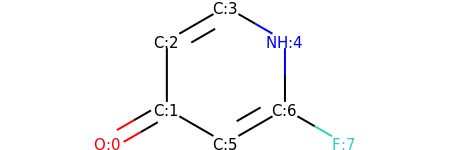

HETATM    1  O1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.299   1.125   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.000   1.875   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.299   1.125   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -0.000  -1.125   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8  F1  UNL     1       2.598  -1.125   0.000  1.00  0.00           F  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    7
CONECT    6    7    7
CONECT    7    8
END

#################
#################
search for patterns ...
found primary alcohol


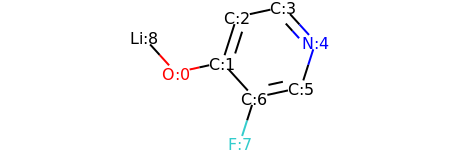

HETATM    1  O1  UNL     1      -2.067  -0.301   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.601   0.017   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.143   1.446   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.322   1.764   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       2.331   0.654   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.874  -0.775   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.408  -1.093   0.000  1.00  0.00           C  
HETATM    8  F1  UNL     1      -0.049  -2.522   0.000  1.00  0.00           F  
HETATM    9 LI1  UNL     1      -3.075   0.809   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
END

search for patterns ...


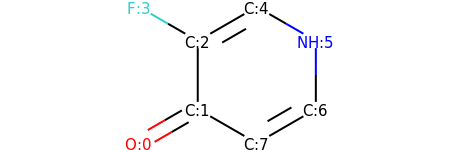

HETATM    1  O1  UNL     1      -1.949  -1.500   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.650  -0.750   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.650   0.750   0.000  1.00  0.00           C  
HETATM    4  F1  UNL     1      -1.949   1.500   0.000  1.00  0.00           F  
HETATM    5  C3  UNL     1       0.650   1.500   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       1.949   0.750   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.949  -0.750   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       0.650  -1.500   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    8
CONECT    3    4    5    5
CONECT    5    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


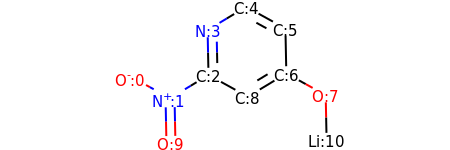

HETATM    1  O1  UNL     1      -3.545   0.065   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1      -2.231  -0.659   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1      -0.947   0.117   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -0.978   1.617   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       0.306   2.393   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.620   1.669   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       1.650   0.170   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1       2.964  -0.554   0.000  1.00  0.00           O  
HETATM    9  C5  UNL     1       0.367  -0.606   0.000  1.00  0.00           C  
HETATM   10  O3  UNL     1      -2.201  -2.158   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1       2.994  -2.054   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4    4    9
CONECT    4    5
CONECT    5    6    6

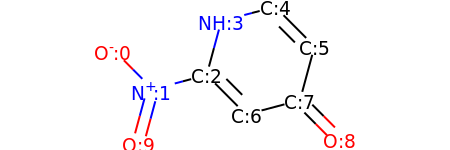

HETATM    1  O1  UNL     1      -3.155   0.775   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1      -2.096  -0.288   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1      -0.647   0.097   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -0.255   1.545   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       1.195   1.930   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       2.253   0.867   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.412  -0.966   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       1.861  -0.581   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1       2.920  -1.644   0.000  1.00  0.00           O  
HETATM   10  O3  UNL     1      -2.488  -1.736   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4    7    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    8
CONECT    7    8
CONECT    8    9    9
END

#################
#

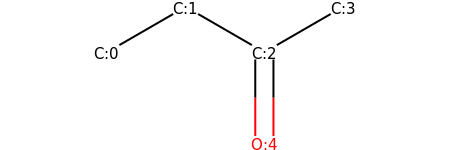

HETATM    1  C1  UNL     1      -2.078   0.000   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.779   0.750   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.520  -0.000   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       1.819   0.750   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1       0.520  -1.500   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3
CONECT    3    4    5    5
END

search for patterns ...
found primary alcohol


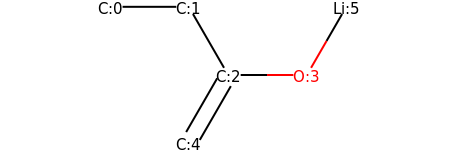

HETATM    1  C1  UNL     1      -2.250   0.866   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.750   0.866   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.000  -0.433   0.000  1.00  0.00           C  
HETATM    4  O1  UNL     1       1.500  -0.433   0.000  1.00  0.00           O  
HETATM    5  C4  UNL     1      -0.750  -1.732   0.000  1.00  0.00           C  
HETATM    6 LI1  UNL     1       2.250   0.866   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3
CONECT    3    4    5    5
CONECT    4    6
END

#################
#################
search for patterns ...
found primary alcohol


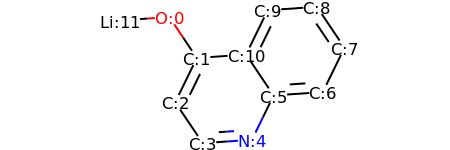

HETATM    1  O1  UNL     1      -2.170   1.477   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.332   0.233   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.990  -1.115   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.152  -2.359   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.344  -2.255   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.003  -0.907   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.499  -0.803   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.157   0.544   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.319   1.789   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.823   1.685   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       0.165   0.337   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -3.666   1.373   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

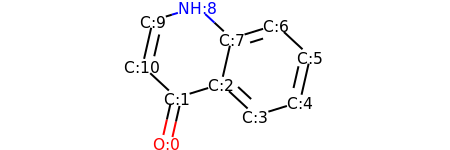

HETATM    1  O1  UNL     1      -1.758  -2.396   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.424  -0.934   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.009  -0.492   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.109  -1.512   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.542  -1.069   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.876   0.393   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.776   1.413   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.343   0.971   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -0.757   1.991   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -2.191   1.549   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.524   0.086   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6    6

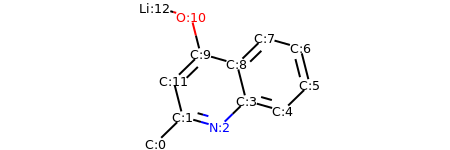

HETATM    1  C1  UNL     1      -2.728  -2.656   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.653  -1.610   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.210  -2.017   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       0.865  -0.971   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.308  -1.378   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.383  -0.332   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.014   1.122   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.571   1.529   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       0.496   0.483   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -0.948   0.890   0.000  1.00  0.00           C  
HETATM   11  O1  UNL     1      -1.316   2.344   0.000  1.00  0.00           O  
HETATM   12  C10 UNL     1      -2.022  -0.156   0.000  1.00  0.00           C  
HETATM   13 LI1  UNL     1  

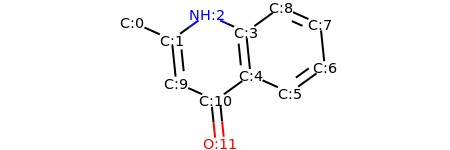

HETATM    1  C1  UNL     1      -3.612   1.261   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.243   0.648   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.028   1.528   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       0.341   0.915   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.495  -0.577   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.864  -1.190   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.079  -0.311   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.925   1.181   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       1.556   1.794   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -2.090  -0.844   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -0.720  -1.457   0.000  1.00  0.00           C  
HETATM   12  O1  UNL     1      -0.567  -2.949   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2

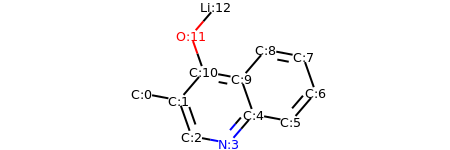

HETATM    1  C1  UNL     1      -3.587  -0.342   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.112  -0.619   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -1.616  -2.035   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -0.141  -2.312   0.000  1.00  0.00           N  
HETATM    5  C4  UNL     1       0.836  -1.174   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.310  -1.451   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.287  -0.313   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.790   1.102   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       1.316   1.379   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       0.339   0.241   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -1.135   0.519   0.000  1.00  0.00           C  
HETATM   12  O1  UNL     1      -1.632   1.934   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

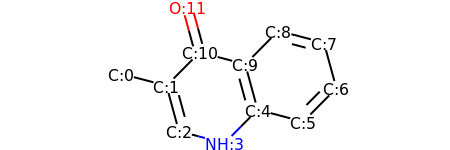

HETATM    1  C1  UNL     1      -3.638   0.173   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.187  -0.208   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -1.793  -1.655   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -0.342  -2.037   0.000  1.00  0.00           N  
HETATM    5  C4  UNL     1       0.714  -0.971   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.165  -1.353   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.220  -0.287   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.825   1.160   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       1.375   1.541   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       0.319   0.476   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -1.132   0.857   0.000  1.00  0.00           C  
HETATM   12  O1  UNL     1      -1.526   2.304   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2

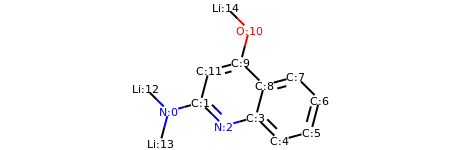

HETATM    1  N1  UNL     1      -3.088  -0.840   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.640  -0.446   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.576  -1.503   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.872  -1.109   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.937  -2.166   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       3.384  -1.772   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.767  -0.321   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.702   0.735   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.254   0.341   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.190   1.398   0.000  1.00  0.00           C  
HETATM   11  O1  UNL     1       0.572   2.848   0.000  1.00  0.00           O  
HETATM   12  C9  UNL     1      -1.258   1.004   0.000  1.00  0.00           C  
HETATM   13 LI1  UNL     1  

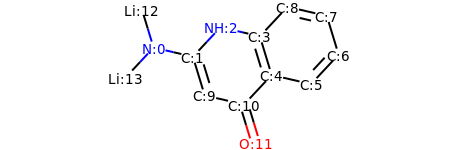

HETATM    1  N1  UNL     1      -3.142   0.443   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.681   0.104   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.656   1.200   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.805   0.861   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.242  -0.574   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.703  -0.913   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.727   0.183   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.290   1.618   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.829   1.957   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -1.244  -1.331   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       0.218  -1.670   0.000  1.00  0.00           C  
HETATM   12  O1  UNL     1       0.655  -3.105   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

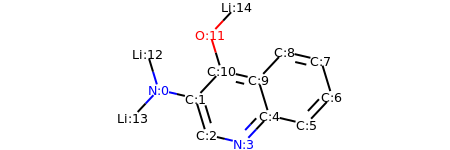

HETATM    1  N1  UNL     1      -3.021  -0.186   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.560  -0.526   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.124  -1.961   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1       0.337  -2.301   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       1.362  -1.206   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.823  -1.546   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.848  -0.451   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.412   0.984   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.951   1.324   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.926   0.229   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -0.535   0.569   0.000  1.00  0.00           C  
HETATM   12  O1  UNL     1      -0.971   2.004   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

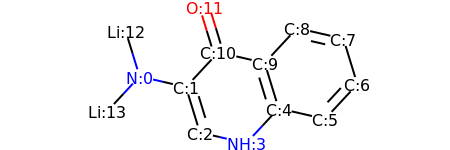

HETATM    1  N1  UNL     1      -3.017   0.027   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -1.555  -0.309   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.115  -1.743   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1       0.347  -2.079   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       1.369  -0.981   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.831  -1.317   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.852  -0.218   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.412   1.216   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.950   1.551   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.929   0.453   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -0.533   0.789   0.000  1.00  0.00           C  
HETATM   12  O1  UNL     1      -0.974   2.223   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

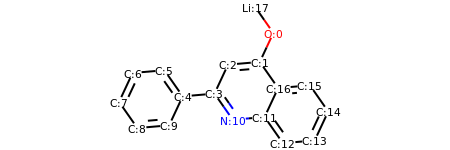

HETATM    1  O1  UNL     1       2.017   2.783   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.382   1.424   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.112   1.294   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.747  -0.065   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -2.242  -0.195   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -3.101   1.035   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -4.595   0.905   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -5.230  -0.454   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -4.371  -1.683   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -2.876  -1.554   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1       0.112  -1.294   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1       1.607  -1.164   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

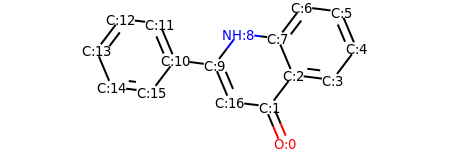

HETATM    1  O1  UNL     1       1.968  -3.096   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.386  -1.714   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.292  -0.518   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       3.780  -0.705   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       4.686   0.491   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       4.103   1.873   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.615   2.060   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.709   0.864   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1       0.221   1.051   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -0.685  -0.145   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.173   0.041   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -2.756   1.424   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

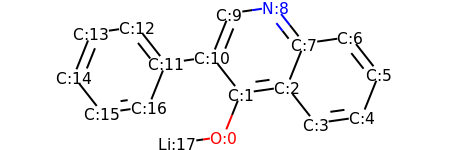

HETATM    1  O1  UNL     1      -0.095  -1.982   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.463  -0.590   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.948  -0.377   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.875  -1.556   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       4.360  -1.344   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       4.918   0.049   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.991   1.228   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.506   1.015   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1       1.580   2.195   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1       0.095   1.982   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -0.463   0.590   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -1.948   0.377   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

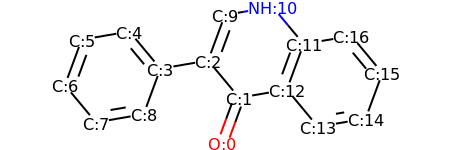

HETATM    1  O1  UNL     1      -0.128  -2.116   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.390  -0.708   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.569   0.445   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -2.047   0.191   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -3.007   1.344   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -4.485   1.089   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -5.004  -0.318   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -4.044  -1.471   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -2.566  -1.217   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -0.050   1.852   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1       1.428   2.107   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1       2.388   0.954   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

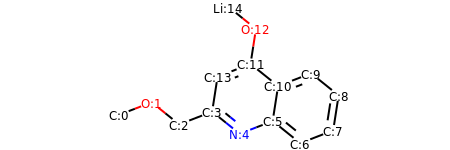

HETATM    1  C1  UNL     1      -5.395  -0.884   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -3.997  -0.342   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -2.828  -1.282   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.429  -0.740   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.260  -1.680   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.138  -1.138   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.307  -2.078   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.706  -1.536   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.935  -0.053   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       2.767   0.887   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.368   0.345   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       0.199   1.285   0.000  1.00  0.00           C  
HETATM   13  O2  UNL     1  

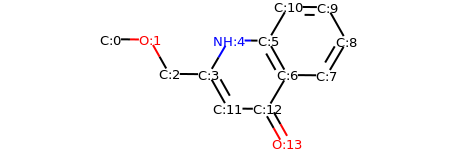

HETATM    1  C1  UNL     1      -5.295   0.886   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -3.795   0.872   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -3.058  -0.434   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.558  -0.449   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.795   0.843   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       0.704   0.828   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.442  -0.478   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.942  -0.492   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.704   0.799   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       2.967   2.106   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.467   2.120   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -0.821  -1.755   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

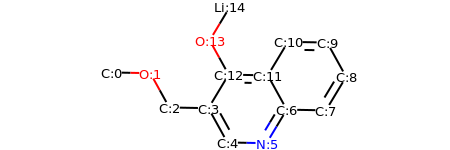

HETATM    1  C1  UNL     1      -5.044   0.354   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -3.545   0.326   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -2.819  -0.987   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.319  -1.015   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.593  -2.328   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       0.906  -2.356   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1       1.680  -1.071   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.180  -1.099   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.954   0.186   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.228   1.499   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.729   1.527   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       0.955   0.242   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

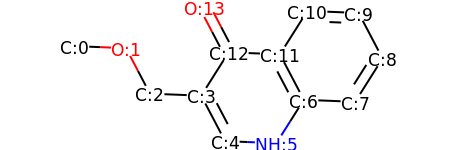

HETATM    1  C1  UNL     1      -5.067   0.667   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -3.568   0.607   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -2.870  -0.721   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.372  -0.781   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.674  -2.109   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       0.825  -2.169   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1       1.626  -0.901   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.125  -0.961   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.926   0.307   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.229   1.635   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.730   1.695   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       0.929   0.427   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

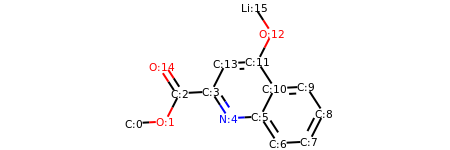

HETATM    1  C1  UNL     1      -5.039  -1.482   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -3.541  -1.404   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -2.860  -0.068   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.362   0.010   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.545  -1.248   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       0.953  -1.170   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.769  -2.428   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.267  -2.350   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.949  -1.014   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.132   0.245   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.634   0.166   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       0.818   1.425   0.000  1.00  0.00           C  
HETATM   13  O2  UNL     1  

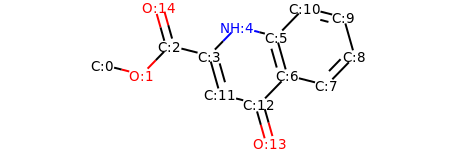

HETATM    1  C1  UNL     1      -5.257  -0.190   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -3.803  -0.558   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -2.757   0.518   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.303   0.151   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.257   1.226   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.197   0.859   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.606  -0.584   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.060  -0.952   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       4.105   0.124   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.697   1.567   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       2.242   1.934   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -0.894  -1.293   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

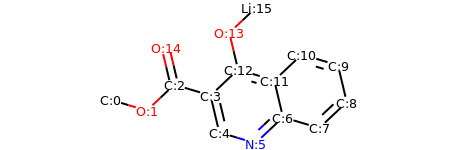

HETATM    1  C1  UNL     1      -5.208  -0.559   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -3.771  -0.989   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -2.679   0.040   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.242  -0.391   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.897  -1.850   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       0.540  -2.281   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1       1.631  -1.251   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.068  -1.682   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       4.160  -0.653   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.814   0.807   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       2.377   1.237   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       1.286   0.208   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

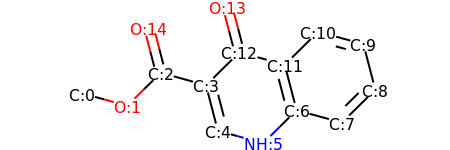

HETATM    1  C1  UNL     1      -5.159  -0.466   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -3.713  -0.864   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -2.645   0.189   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.198  -0.209   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.820  -1.661   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       0.626  -2.059   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1       1.694  -1.005   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.140  -1.403   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       4.208  -0.350   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.830   1.102   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       2.383   1.500   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       1.316   0.446   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

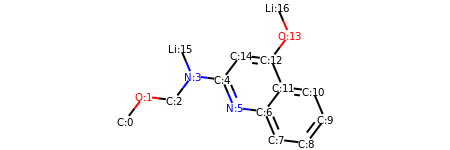

HETATM    1  C1  UNL     1      -5.764  -1.674   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -4.860  -0.477   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -3.371  -0.661   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -2.468   0.536   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -0.979   0.352   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -0.394  -1.029   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.095  -1.213   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       1.679  -2.595   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.168  -2.779   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       4.072  -1.582   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       3.487  -0.200   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       1.998  -0.016   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

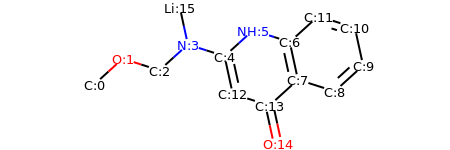

HETATM    1  C1  UNL     1      -5.971  -0.818   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -4.860   0.191   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -3.432  -0.266   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -2.322   0.743   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -0.893   0.286   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1       0.217   1.294   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.646   0.837   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       1.964  -0.628   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.393  -1.085   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       4.503  -0.077   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       4.185   1.389   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       2.756   1.846   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

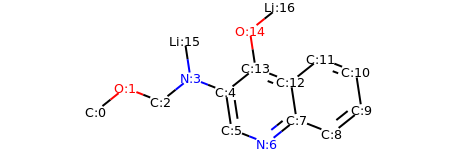

HETATM    1  C1  UNL     1      -6.031  -1.001   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -4.859  -0.066   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -3.462  -0.613   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -2.290   0.323   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -0.893  -0.224   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -0.669  -1.708   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1       0.727  -2.255   0.000  1.00  0.00           N  
HETATM    8  C5  UNL     1       1.900  -1.319   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.296  -1.866   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       4.469  -0.930   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       4.244   0.553   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       2.848   1.100   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

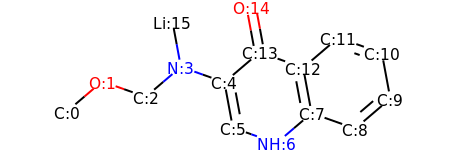

HETATM    1  C1  UNL     1      -5.925  -1.002   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -4.784  -0.028   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -3.370  -0.529   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -2.229   0.445   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -0.815  -0.056   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -0.542  -1.531   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1       0.872  -2.032   0.000  1.00  0.00           N  
HETATM    8  C5  UNL     1       2.012  -1.058   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.426  -1.558   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       4.567  -0.584   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       4.294   0.890   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       2.880   1.391   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

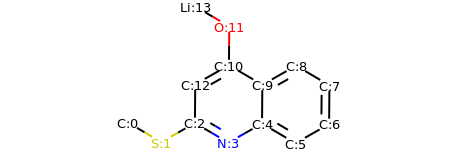

HETATM    1  C1  UNL     1      -4.277  -1.038   0.000  1.00  0.00           C  
HETATM    2  S1  UNL     1      -2.983  -1.798   0.000  1.00  0.00           S  
HETATM    3  C2  UNL     1      -1.679  -1.058   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -0.385  -1.818   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.919  -1.079   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.213  -1.839   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.517  -1.099   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.529   0.401   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.236   1.161   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.931   0.421   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -0.362   1.181   0.000  1.00  0.00           C  
HETATM   12  O1  UNL     1      -0.350   2.681   0.000  1.00  0.00           O  
HETATM   13  C10 UNL     1  

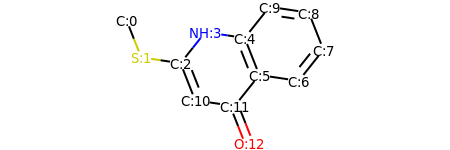

HETATM    1  C1  UNL     1      -4.032   1.512   0.000  1.00  0.00           C  
HETATM    2  S1  UNL     1      -3.483   0.116   0.000  1.00  0.00           S  
HETATM    3  C2  UNL     1      -1.999  -0.105   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.065   1.068   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.418   0.847   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.968  -0.549   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.452  -0.770   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.385   0.404   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.835   1.799   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.352   2.021   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -1.449  -1.501   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       0.034  -1.723   0.000  1.00  0.00           C  
HETATM   13  O1  UNL     1  

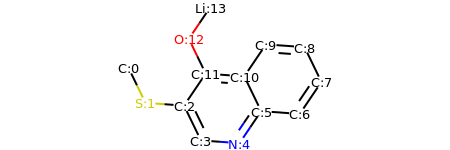

HETATM    1  C1  UNL     1      -3.881   0.558   0.000  1.00  0.00           C  
HETATM    2  S1  UNL     1      -3.226  -0.791   0.000  1.00  0.00           S  
HETATM    3  C2  UNL     1      -1.730  -0.899   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.075  -2.248   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.421  -2.356   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.263  -1.114   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.759  -1.222   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.600   0.020   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.945   1.370   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.449   1.477   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       0.608   0.235   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -0.888   0.343   0.000  1.00  0.00           C  
HETATM   13  O1  UNL     1  

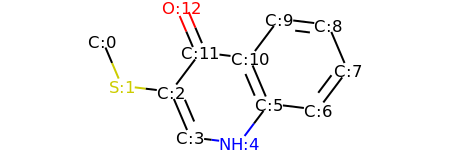

HETATM    1  C1  UNL     1      -3.891   0.978   0.000  1.00  0.00           C  
HETATM    2  S1  UNL     1      -3.304  -0.403   0.000  1.00  0.00           S  
HETATM    3  C2  UNL     1      -1.815  -0.584   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.227  -1.964   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.262  -2.146   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.163  -0.947   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.652  -1.129   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.554   0.070   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.967   1.450   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.478   1.632   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       0.576   0.433   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -0.913   0.615   0.000  1.00  0.00           C  
HETATM   13  O1  UNL     1  

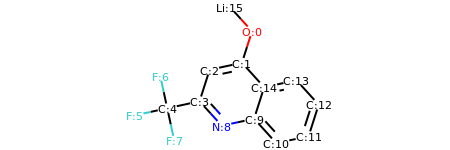

HETATM    1  O1  UNL     1       0.915   2.857   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.457   1.429   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.009   1.110   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.466  -0.318   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -2.932  -0.637   0.000  1.00  0.00           C  
HETATM    6  F1  UNL     1      -4.398  -0.955   0.000  1.00  0.00           F  
HETATM    7  F2  UNL     1      -3.250   0.829   0.000  1.00  0.00           F  
HETATM    8  F3  UNL     1      -2.613  -2.102   0.000  1.00  0.00           F  
HETATM    9  N1  UNL     1      -0.457  -1.429   0.000  1.00  0.00           N  
HETATM   10  C5  UNL     1       1.009  -1.110   0.000  1.00  0.00           C  
HETATM   11  C6  UNL     1       2.017  -2.221   0.000  1.00  0.00           C  
HETATM   12  C7  UNL     1       3.483  -1.902   0.000  1.00  0.00           C  
HETATM   13  C8  UNL     1  

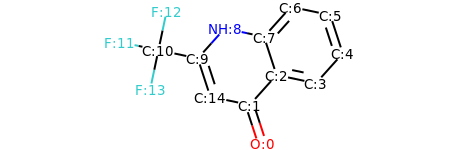

HETATM    1  O1  UNL     1       0.928  -3.116   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.462  -1.690   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.463  -0.574   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.931  -0.883   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.933   0.234   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.466   1.659   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.999   1.969   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.997   0.852   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -0.471   1.161   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -1.472   0.045   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.940   0.354   0.000  1.00  0.00           C  
HETATM   12  F1  UNL     1      -4.408   0.663   0.000  1.00  0.00           F  
HETATM   13  F2  UNL     1  

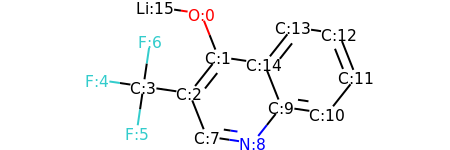

HETATM    1  O1  UNL     1      -0.795   2.004   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.242   0.610   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.173  -0.566   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -2.657  -0.348   0.000  1.00  0.00           C  
HETATM    5  F1  UNL     1      -4.141  -0.130   0.000  1.00  0.00           F  
HETATM    6  F2  UNL     1      -2.875  -1.832   0.000  1.00  0.00           F  
HETATM    7  F3  UNL     1      -2.439   1.136   0.000  1.00  0.00           F  
HETATM    8  C4  UNL     1      -0.620  -1.961   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1       0.865  -2.178   0.000  1.00  0.00           N  
HETATM   10  C5  UNL     1       1.795  -1.002   0.000  1.00  0.00           C  
HETATM   11  C6  UNL     1       3.279  -1.220   0.000  1.00  0.00           C  
HETATM   12  C7  UNL     1       4.210  -0.044   0.000  1.00  0.00           C  
HETATM   13  C8  UNL     1  

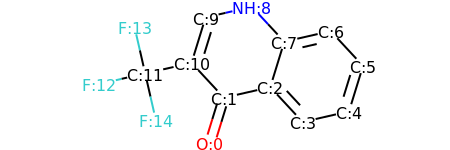

HETATM    1  O1  UNL     1      -0.775  -2.220   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.333  -0.787   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.129  -0.453   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.150  -1.552   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.612  -1.218   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       4.054   0.216   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.033   1.315   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.571   0.981   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1       0.550   2.080   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -0.912   1.746   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -1.354   0.312   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -2.816  -0.022   0.000  1.00  0.00           C  
HETATM   13  F1  UNL     1  

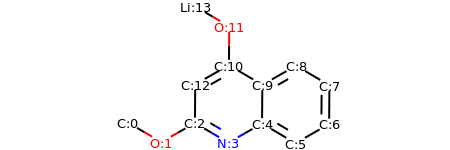

HETATM    1  C1  UNL     1      -4.277  -1.038   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -2.983  -1.798   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -1.679  -1.058   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -0.385  -1.818   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.919  -1.079   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.213  -1.839   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.517  -1.099   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.529   0.401   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.236   1.161   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.931   0.421   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -0.362   1.181   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1      -0.350   2.681   0.000  1.00  0.00           O  
HETATM   13  C10 UNL     1  

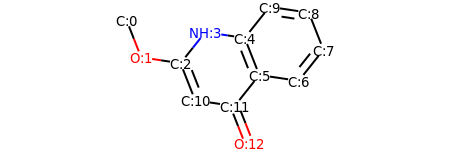

HETATM    1  C1  UNL     1      -4.032   1.512   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -3.483   0.116   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -1.999  -0.105   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.065   1.068   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.418   0.847   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.968  -0.549   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.452  -0.770   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.385   0.404   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.835   1.799   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.352   2.021   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -1.449  -1.501   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       0.034  -1.723   0.000  1.00  0.00           C  
HETATM   13  O2  UNL     1  

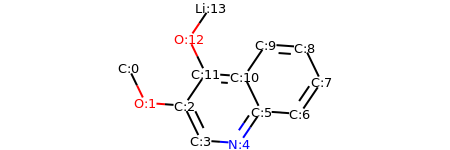

HETATM    1  C1  UNL     1      -3.881   0.558   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -3.226  -0.791   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -1.730  -0.899   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.075  -2.248   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.421  -2.356   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.263  -1.114   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.759  -1.222   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.600   0.020   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.945   1.370   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.449   1.477   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       0.608   0.235   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -0.888   0.343   0.000  1.00  0.00           C  
HETATM   13  O2  UNL     1  

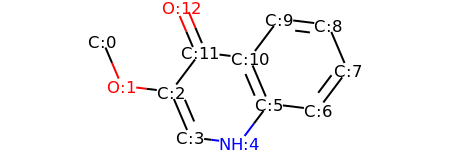

HETATM    1  C1  UNL     1      -3.891   0.978   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -3.304  -0.403   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -1.815  -0.584   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.227  -1.964   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.262  -2.146   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.163  -0.947   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.652  -1.129   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.554   0.070   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.967   1.450   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.478   1.632   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       0.576   0.433   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -0.913   0.615   0.000  1.00  0.00           C  
HETATM   13  O2  UNL     1  

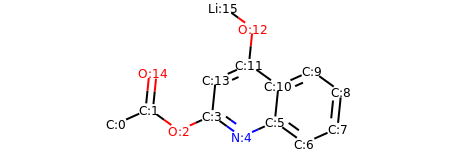

HETATM    1  C1  UNL     1      -5.103  -1.225   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -3.734  -0.610   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -2.518  -1.487   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -1.150  -0.873   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.067  -1.750   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.435  -1.135   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.652  -2.013   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       4.020  -1.398   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       4.172   0.094   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       2.955   0.972   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.587   0.357   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       0.370   1.235   0.000  1.00  0.00           C  
HETATM   13  O2  UNL     1  

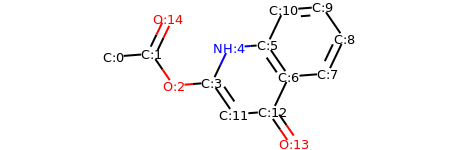

HETATM    1  C1  UNL     1      -5.139   0.293   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -3.643   0.410   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -2.794  -0.827   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -1.299  -0.710   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.652   0.644   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       0.843   0.761   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.692  -0.476   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.188  -0.359   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.834   0.995   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       2.985   2.232   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.490   2.115   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -0.450  -1.946   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

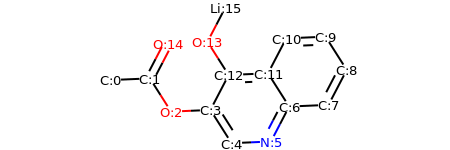

HETATM    1  C1  UNL     1      -4.877  -0.047   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -3.379   0.017   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -2.574  -1.248   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -1.075  -1.184   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.270  -2.450   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       1.228  -2.385   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1       1.922  -1.055   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.421  -0.991   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       4.114   0.339   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.309   1.605   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.811   1.541   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       1.117   0.211   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

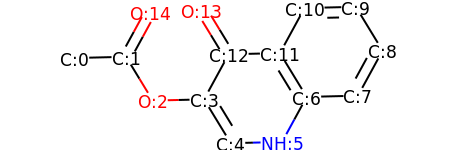

HETATM    1  C1  UNL     1      -4.907   0.229   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -3.407   0.265   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -2.626  -1.016   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -1.127  -0.980   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.346  -2.261   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       1.154  -2.225   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1       1.872  -0.908   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.372  -0.872   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       4.091   0.444   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.310   1.725   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.810   1.689   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       1.091   0.373   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

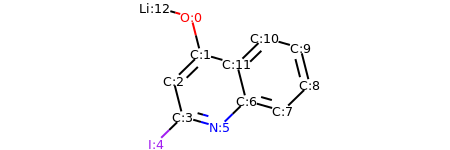

HETATM    1  O1  UNL     1      -1.316   2.344   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.948   0.890   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.022  -0.156   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.653  -1.610   0.000  1.00  0.00           C  
HETATM    5  I1  UNL     1      -2.728  -2.656   0.000  1.00  0.00           I  
HETATM    6  N1  UNL     1      -0.210  -2.017   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       0.865  -0.971   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       2.308  -1.378   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.383  -0.332   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.014   1.122   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       1.571   1.529   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       0.496   0.483   0.000  1.00  0.00           C  
HETATM   13 LI1  UNL     1  

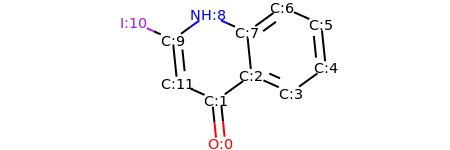

HETATM    1  O1  UNL     1      -0.567  -2.949   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.720  -1.457   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.495  -0.577   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.864  -1.190   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.079  -0.311   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.925   1.181   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.556   1.794   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.341   0.915   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -1.028   1.528   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -2.243   0.648   0.000  1.00  0.00           C  
HETATM   11  I1  UNL     1      -3.612   1.261   0.000  1.00  0.00           I  
HETATM   12  C9  UNL     1      -2.090  -0.844   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT

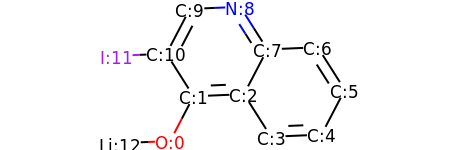

HETATM    1  O1  UNL     1      -1.715  -1.773   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.021  -0.443   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.478  -0.380   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.282  -1.646   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.781  -1.582   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.475  -0.253   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.671   1.013   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.172   0.950   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1       0.368   2.216   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -1.131   2.152   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -1.825   0.823   0.000  1.00  0.00           C  
HETATM   12  I1  UNL     1      -3.324   0.759   0.000  1.00  0.00           I  
HETATM   13 LI1  UNL     1  

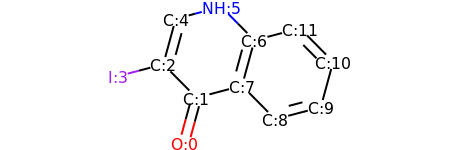

HETATM    1  O1  UNL     1      -1.526  -2.304   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.132  -0.857   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.187   0.208   0.000  1.00  0.00           C  
HETATM    4  I1  UNL     1      -3.638  -0.173   0.000  1.00  0.00           I  
HETATM    5  C3  UNL     1      -1.793   1.655   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1      -0.342   2.037   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       0.714   0.971   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       0.319  -0.476   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       1.375  -1.541   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       2.825  -1.160   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       3.220   0.287   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       2.165   1.353   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT

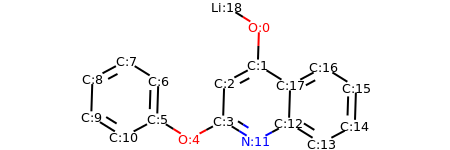

HETATM    1  O1  UNL     1       1.249   2.685   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.201   1.186   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.121   0.478   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.170  -1.021   0.000  1.00  0.00           C  
HETATM    5  O2  UNL     1      -1.492  -1.729   0.000  1.00  0.00           O  
HETATM    6  C4  UNL     1      -2.766  -0.938   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -2.718   0.561   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -3.992   1.353   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -5.315   0.645   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -5.363  -0.854   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -4.089  -1.646   0.000  1.00  0.00           C  
HETATM   12  N1  UNL     1       1.105  -1.813   0.000  1.00  0.00           N  
HETATM   13  C10 UNL     1  

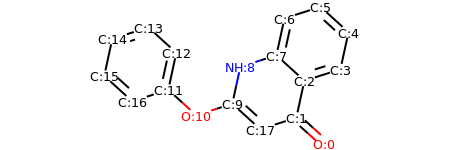

HETATM    1  O1  UNL     1       3.461  -2.759   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       2.352  -1.749   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.671  -0.284   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       4.100   0.172   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       4.420   1.638   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.310   2.647   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.881   2.191   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.562   0.726   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1       0.133   0.270   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -0.187  -1.196   0.000  1.00  0.00           C  
HETATM   11  O2  UNL     1      -1.616  -1.652   0.000  1.00  0.00           O  
HETATM   12  C9  UNL     1      -2.725  -0.643   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

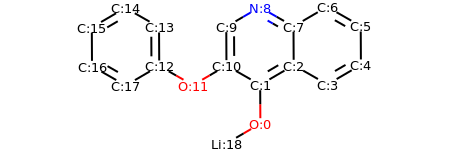

HETATM    1  O1  UNL     1       1.175  -2.560   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.168  -1.060   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.463  -0.303   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       3.766  -1.047   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       5.061  -0.290   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       5.053   1.210   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.750   1.953   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.455   1.197   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1       1.152   1.940   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -0.143   1.183   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -0.135  -0.316   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1      -1.430  -1.073   0.000  1.00  0.00           O  
HETATM   13  C10 UNL     1  

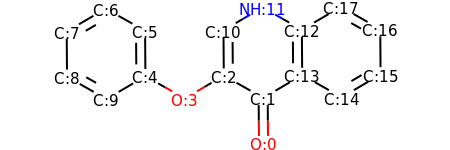

HETATM    1  O1  UNL     1       1.175  -2.741   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.164  -1.241   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.141  -0.501   0.000  1.00  0.00           C  
HETATM    4  O2  UNL     1      -1.434  -1.261   0.000  1.00  0.00           O  
HETATM    5  C3  UNL     1      -2.739  -0.521   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -2.750   0.979   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -4.054   1.720   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -5.348   0.960   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -5.337  -0.540   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -4.032  -1.280   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -0.152   0.999   0.000  1.00  0.00           C  
HETATM   12  N1  UNL     1       1.142   1.759   0.000  1.00  0.00           N  
HETATM   13  C10 UNL     1  

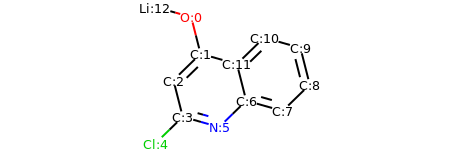

HETATM    1  O1  UNL     1      -1.316   2.344   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.948   0.890   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.022  -0.156   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.653  -1.610   0.000  1.00  0.00           C  
HETATM    5 CL1  UNL     1      -2.728  -2.656   0.000  1.00  0.00          CL  
HETATM    6  N1  UNL     1      -0.210  -2.017   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       0.865  -0.971   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       2.308  -1.378   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.383  -0.332   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.014   1.122   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       1.571   1.529   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       0.496   0.483   0.000  1.00  0.00           C  
HETATM   13 LI1  UNL     1  

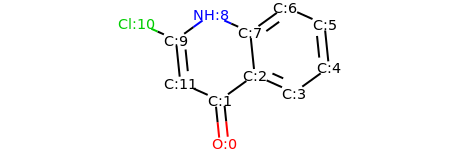

HETATM    1  O1  UNL     1      -0.567  -2.949   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.720  -1.457   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.495  -0.577   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.864  -1.190   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.079  -0.311   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.925   1.181   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.556   1.794   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.341   0.915   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -1.028   1.528   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -2.243   0.648   0.000  1.00  0.00           C  
HETATM   11 CL1  UNL     1      -3.612   1.261   0.000  1.00  0.00          CL  
HETATM   12  C9  UNL     1      -2.090  -0.844   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT

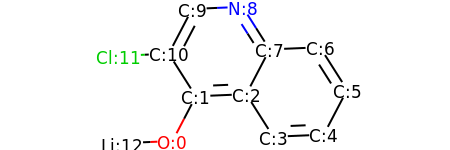

HETATM    1  O1  UNL     1      -1.715  -1.773   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.021  -0.443   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.478  -0.380   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.282  -1.646   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.781  -1.582   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.475  -0.253   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.671   1.013   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.172   0.950   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1       0.368   2.216   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -1.131   2.152   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -1.825   0.823   0.000  1.00  0.00           C  
HETATM   12 CL1  UNL     1      -3.324   0.759   0.000  1.00  0.00          CL  
HETATM   13 LI1  UNL     1  

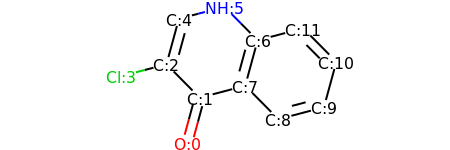

HETATM    1  O1  UNL     1      -1.526  -2.304   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.132  -0.857   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.187   0.208   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1      -3.638  -0.173   0.000  1.00  0.00          CL  
HETATM    5  C3  UNL     1      -1.793   1.655   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1      -0.342   2.037   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       0.714   0.971   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       0.319  -0.476   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       1.375  -1.541   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       2.825  -1.160   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       3.220   0.287   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       2.165   1.353   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT

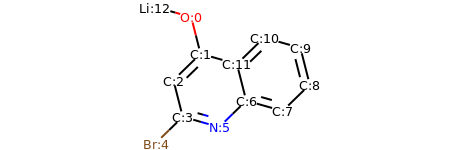

HETATM    1  O1  UNL     1      -1.316   2.344   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.948   0.890   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.022  -0.156   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.653  -1.610   0.000  1.00  0.00           C  
HETATM    5 BR1  UNL     1      -2.728  -2.656   0.000  1.00  0.00          BR  
HETATM    6  N1  UNL     1      -0.210  -2.017   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       0.865  -0.971   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       2.308  -1.378   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.383  -0.332   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.014   1.122   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       1.571   1.529   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       0.496   0.483   0.000  1.00  0.00           C  
HETATM   13 LI1  UNL     1  

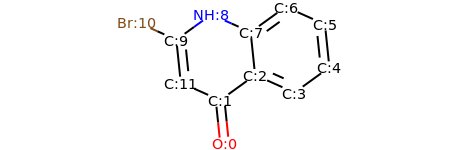

HETATM    1  O1  UNL     1      -0.567  -2.949   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.720  -1.457   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.495  -0.577   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.864  -1.190   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.079  -0.311   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.925   1.181   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.556   1.794   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.341   0.915   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -1.028   1.528   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -2.243   0.648   0.000  1.00  0.00           C  
HETATM   11 BR1  UNL     1      -3.612   1.261   0.000  1.00  0.00          BR  
HETATM   12  C9  UNL     1      -2.090  -0.844   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT

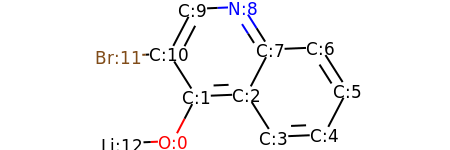

HETATM    1  O1  UNL     1      -1.715  -1.773   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.021  -0.443   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.478  -0.380   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.282  -1.646   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.781  -1.582   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.475  -0.253   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.671   1.013   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.172   0.950   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1       0.368   2.216   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -1.131   2.152   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -1.825   0.823   0.000  1.00  0.00           C  
HETATM   12 BR1  UNL     1      -3.324   0.759   0.000  1.00  0.00          BR  
HETATM   13 LI1  UNL     1  

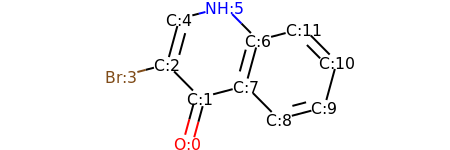

HETATM    1  O1  UNL     1      -1.526  -2.304   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.132  -0.857   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.187   0.208   0.000  1.00  0.00           C  
HETATM    4 BR1  UNL     1      -3.638  -0.173   0.000  1.00  0.00          BR  
HETATM    5  C3  UNL     1      -1.793   1.655   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1      -0.342   2.037   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       0.714   0.971   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       0.319  -0.476   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       1.375  -1.541   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       2.825  -1.160   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       3.220   0.287   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       2.165   1.353   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT

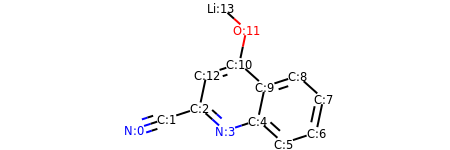

HETATM    1  N1  UNL     1      -4.685  -1.529   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -3.259  -1.064   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.833  -0.598   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -0.717  -1.601   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.709  -1.135   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.825  -2.138   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.251  -1.672   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.561  -0.205   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.445   0.798   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.019   0.332   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -0.097   1.335   0.000  1.00  0.00           C  
HETATM   12  O1  UNL     1       0.213   2.802   0.000  1.00  0.00           O  
HETATM   13  C10 UNL     1  

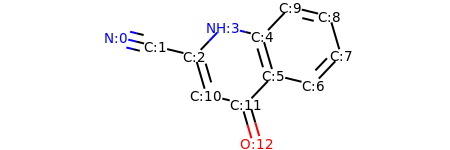

HETATM    1  N1  UNL     1      -4.836   0.867   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -3.378   0.513   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.921   0.158   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -0.885   1.244   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.572   0.889   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.994  -0.550   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.452  -0.905   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.488   0.180   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.066   1.620   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.608   1.974   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -1.499  -1.281   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -0.041  -1.635   0.000  1.00  0.00           C  
HETATM   13  O1  UNL     1  

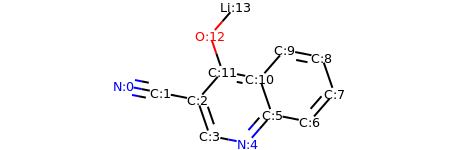

HETATM    1  N1  UNL     1      -4.700  -0.028   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -3.227  -0.315   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.755  -0.603   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.268  -2.021   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       0.204  -2.309   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.189  -1.178   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.661  -1.465   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.646  -0.334   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.159   1.085   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.687   1.372   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       0.702   0.241   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -0.770   0.529   0.000  1.00  0.00           C  
HETATM   13  O1  UNL     1  

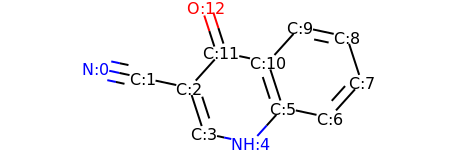

HETATM    1  N1  UNL     1      -4.716   0.287   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -3.249  -0.025   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.782  -0.336   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.318  -1.763   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       0.149  -2.075   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.153  -0.960   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.620  -1.272   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.623  -0.157   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.160   1.270   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.693   1.581   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       0.689   0.467   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -0.778   0.778   0.000  1.00  0.00           C  
HETATM   13  O1  UNL     1  

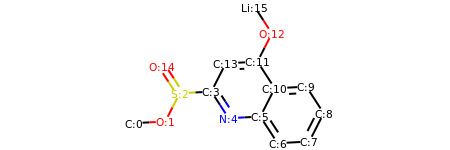

HETATM    1  C1  UNL     1      -5.039  -1.482   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -3.541  -1.404   0.000  1.00  0.00           O  
HETATM    3  S1  UNL     1      -2.860  -0.068   0.000  1.00  0.00           S  
HETATM    4  C2  UNL     1      -1.362   0.010   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.545  -1.248   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       0.953  -1.170   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       1.769  -2.428   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.267  -2.350   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.949  -1.014   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.132   0.245   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       1.634   0.166   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       0.818   1.425   0.000  1.00  0.00           C  
HETATM   13  O2  UNL     1  

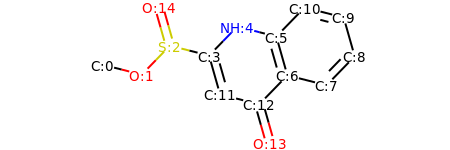

HETATM    1  C1  UNL     1      -5.257  -0.190   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -3.803  -0.558   0.000  1.00  0.00           O  
HETATM    3  S1  UNL     1      -2.757   0.518   0.000  1.00  0.00           S  
HETATM    4  C2  UNL     1      -1.303   0.151   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.257   1.226   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       1.197   0.859   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       1.606  -0.584   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.060  -0.952   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       4.105   0.124   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.697   1.567   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       2.242   1.934   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1      -0.894  -1.293   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

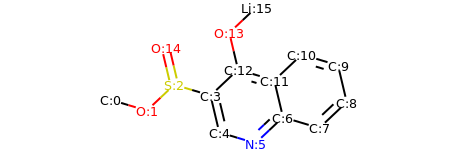

HETATM    1  C1  UNL     1      -5.208  -0.559   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -3.771  -0.989   0.000  1.00  0.00           O  
HETATM    3  S1  UNL     1      -2.679   0.040   0.000  1.00  0.00           S  
HETATM    4  C2  UNL     1      -1.242  -0.391   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -0.897  -1.850   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       0.540  -2.281   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.631  -1.251   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.068  -1.682   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       4.160  -0.653   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.814   0.807   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       2.377   1.237   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       1.286   0.208   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

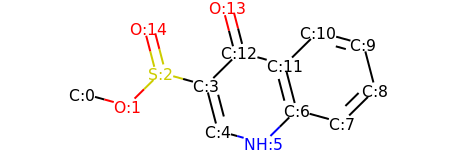

HETATM    1  C1  UNL     1      -5.159  -0.466   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -3.713  -0.864   0.000  1.00  0.00           O  
HETATM    3  S1  UNL     1      -2.645   0.189   0.000  1.00  0.00           S  
HETATM    4  C2  UNL     1      -1.198  -0.209   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -0.820  -1.661   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       0.626  -2.059   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.694  -1.005   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.140  -1.403   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       4.208  -0.350   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.830   1.102   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       2.383   1.500   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       1.316   0.446   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

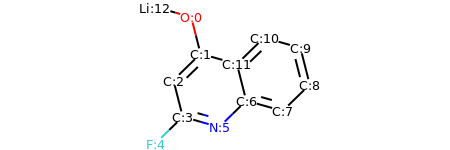

HETATM    1  O1  UNL     1      -1.316   2.344   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.948   0.890   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.022  -0.156   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.653  -1.610   0.000  1.00  0.00           C  
HETATM    5  F1  UNL     1      -2.728  -2.656   0.000  1.00  0.00           F  
HETATM    6  N1  UNL     1      -0.210  -2.017   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       0.865  -0.971   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       2.308  -1.378   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.383  -0.332   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.014   1.122   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       1.571   1.529   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       0.496   0.483   0.000  1.00  0.00           C  
HETATM   13 LI1  UNL     1  

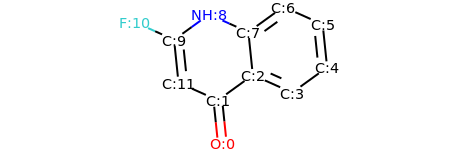

HETATM    1  O1  UNL     1      -0.567  -2.949   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.720  -1.457   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.495  -0.577   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.864  -1.190   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.079  -0.311   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.925   1.181   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.556   1.794   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.341   0.915   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -1.028   1.528   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -2.243   0.648   0.000  1.00  0.00           C  
HETATM   11  F1  UNL     1      -3.612   1.261   0.000  1.00  0.00           F  
HETATM   12  C9  UNL     1      -2.090  -0.844   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT

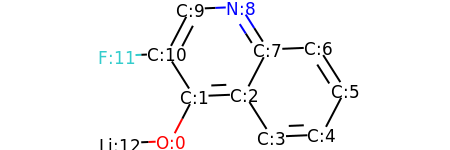

HETATM    1  O1  UNL     1      -1.715  -1.773   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.021  -0.443   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.478  -0.380   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.282  -1.646   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.781  -1.582   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.475  -0.253   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.671   1.013   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.172   0.950   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1       0.368   2.216   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -1.131   2.152   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -1.825   0.823   0.000  1.00  0.00           C  
HETATM   12  F1  UNL     1      -3.324   0.759   0.000  1.00  0.00           F  
HETATM   13 LI1  UNL     1  

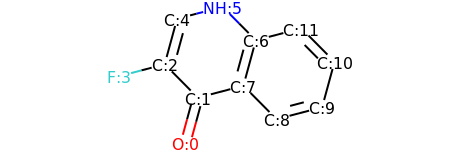

HETATM    1  O1  UNL     1      -1.526  -2.304   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.132  -0.857   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.187   0.208   0.000  1.00  0.00           C  
HETATM    4  F1  UNL     1      -3.638  -0.173   0.000  1.00  0.00           F  
HETATM    5  C3  UNL     1      -1.793   1.655   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1      -0.342   2.037   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       0.714   0.971   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       0.319  -0.476   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       1.375  -1.541   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       2.825  -1.160   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       3.220   0.287   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       2.165   1.353   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT

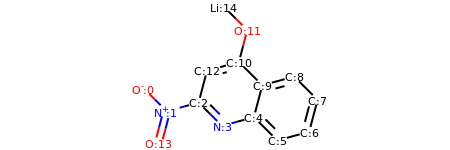

HETATM    1  O1  UNL     1      -4.152   0.216   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1      -3.088  -0.840   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1      -1.640  -0.446   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -0.576  -1.503   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       0.872  -1.109   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.937  -2.166   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       3.384  -1.772   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.767  -0.321   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.702   0.735   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       1.254   0.341   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       0.190   1.398   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1       0.572   2.848   0.000  1.00  0.00           O  
HETATM   13  C9  UNL     1  

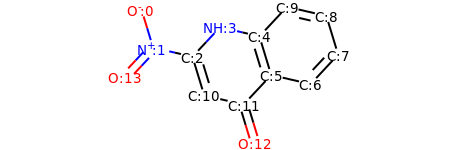

HETATM    1  O1  UNL     1      -3.579   1.878   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1      -3.142   0.443   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1      -1.681   0.104   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -0.656   1.200   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1       0.805   0.861   0.000  1.00  0.00           C  
HETATM    6  C3  UNL     1       1.242  -0.574   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       2.703  -0.913   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.727   0.183   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.290   1.618   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       1.829   1.957   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1      -1.244  -1.331   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       0.218  -1.670   0.000  1.00  0.00           C  
HETATM   13  O2  UNL     1  

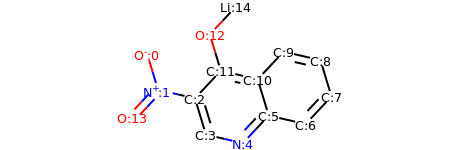

HETATM    1  O1  UNL     1      -3.457   1.249   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1      -3.021  -0.186   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1      -1.560  -0.526   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1      -1.124  -1.961   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       0.337  -2.301   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       1.362  -1.206   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       2.823  -1.546   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.848  -0.451   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.412   0.984   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       1.951   1.324   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       0.926   0.229   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1      -0.535   0.569   0.000  1.00  0.00           C  
HETATM   13  O2  UNL     1  

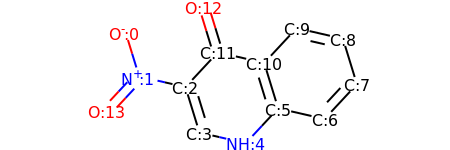

HETATM    1  O1  UNL     1      -3.457   1.461   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1      -3.017   0.027   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1      -1.555  -0.309   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1      -1.115  -1.743   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       0.347  -2.079   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       1.369  -0.981   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       2.831  -1.317   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.852  -0.218   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.412   1.216   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       1.950   1.551   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       0.929   0.453   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1      -0.533   0.789   0.000  1.00  0.00           C  
HETATM   13  O2  UNL     1  

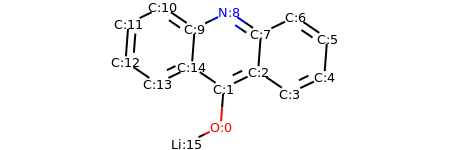

HETATM    1  O1  UNL     1      -0.110  -2.577   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.001  -1.081   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.352  -0.429   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.592  -1.274   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.943  -0.622   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       4.054   0.874   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.814   1.718   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.463   1.066   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1       0.223   1.911   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -1.128   1.259   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.368   2.103   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -3.719   1.451   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

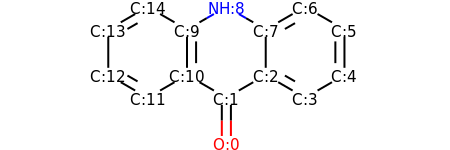

HETATM    1  O1  UNL     1      -0.000  -2.800   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.000  -1.300   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.299  -0.550   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       2.598  -1.300   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.897  -0.550   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.897   0.950   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.598   1.700   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.299   0.950   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1       0.000   1.700   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -1.299   0.950   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -1.299  -0.550   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -2.598  -1.300   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

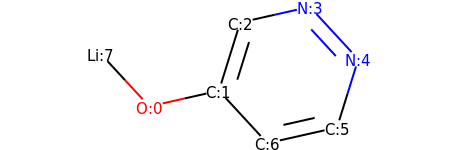

HETATM    1  O1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.159   1.129   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       1.305   1.459   0.000  1.00  0.00           N  
HETATM    5  N2  UNL     1       2.322   0.357   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       1.876  -1.075   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.413  -1.405   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


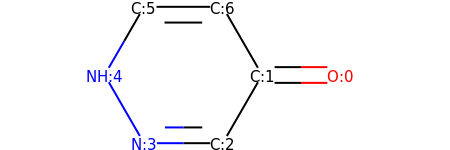

HETATM    1  O1  UNL     1       2.571   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.321  -1.299   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.179  -1.299   0.000  1.00  0.00           N  
HETATM    5  N2  UNL     1      -1.929   0.000   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -1.179   1.299   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4    4
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found primary alcohol


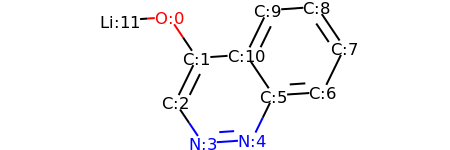

HETATM    1  O1  UNL     1      -2.170   1.477   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.332   0.233   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.990  -1.115   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.152  -2.359   0.000  1.00  0.00           N  
HETATM    5  N2  UNL     1       0.344  -2.255   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       1.003  -0.907   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       2.499  -0.803   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.157   0.544   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.319   1.789   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       0.823   1.685   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       0.165   0.337   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -3.666   1.373   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

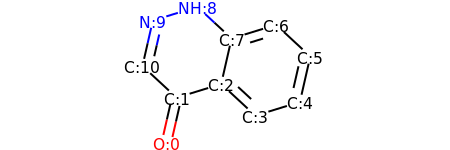

HETATM    1  O1  UNL     1      -1.758  -2.396   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.424  -0.934   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.009  -0.492   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.109  -1.512   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.542  -1.069   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.876   0.393   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.776   1.413   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.343   0.971   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -0.757   1.991   0.000  1.00  0.00           N  
HETATM   10  N2  UNL     1      -2.191   1.549   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -2.524   0.086   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6    6

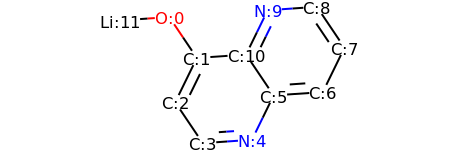

HETATM    1  O1  UNL     1      -2.170   1.477   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.332   0.233   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.990  -1.115   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.152  -2.359   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.344  -2.255   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.003  -0.907   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.499  -0.803   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.157   0.544   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.319   1.789   0.000  1.00  0.00           C  
HETATM   10  N2  UNL     1       0.823   1.685   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1       0.165   0.337   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -3.666   1.373   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

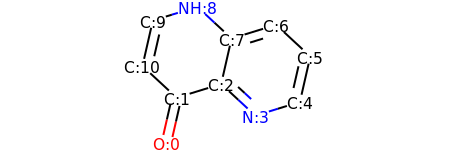

HETATM    1  O1  UNL     1      -1.758  -2.396   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.424  -0.934   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.009  -0.492   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       1.109  -1.512   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       2.542  -1.069   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.876   0.393   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.776   1.413   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       0.343   0.971   0.000  1.00  0.00           C  
HETATM    9  N2  UNL     1      -0.757   1.991   0.000  1.00  0.00           N  
HETATM   10  C7  UNL     1      -2.191   1.549   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1      -2.524   0.086   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6    6

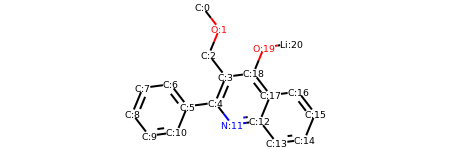

HETATM    1  C1  UNL     1      -1.400   4.556   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -0.485   3.368   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -1.057   1.981   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.142   0.792   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.713  -0.594   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -2.200  -0.792   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -3.115   0.396   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -4.602   0.198   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -5.174  -1.189   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -4.259  -2.377   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -2.772  -2.179   0.000  1.00  0.00           C  
HETATM   12  N1  UNL     1       0.202  -1.783   0.000  1.00  0.00           N  
HETATM   13  C11 UNL     1  

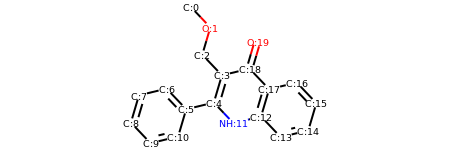

HETATM    1  C1  UNL     1      -1.711   4.532   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1      -0.677   3.445   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1      -1.101   2.006   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.067   0.919   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.492  -0.520   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.950  -0.871   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -2.984   0.215   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -4.442  -0.136   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -4.866  -1.575   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -3.832  -2.662   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -2.374  -2.310   0.000  1.00  0.00           C  
HETATM   12  N1  UNL     1       0.542  -1.606   0.000  1.00  0.00           N  
HETATM   13  C11 UNL     1  

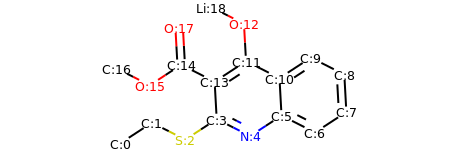

HETATM    1  C1  UNL     1      -4.327  -2.254   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -3.071  -1.434   0.000  1.00  0.00           C  
HETATM    3  S1  UNL     1      -1.733  -2.112   0.000  1.00  0.00           S  
HETATM    4  C3  UNL     1      -0.477  -1.291   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.862  -1.969   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       2.117  -1.149   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.456  -1.826   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       4.712  -1.006   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       4.629   0.492   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.291   1.169   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       2.035   0.349   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       0.697   1.027   0.000  1.00  0.00           C  
HETATM   13  O1  UNL     1  

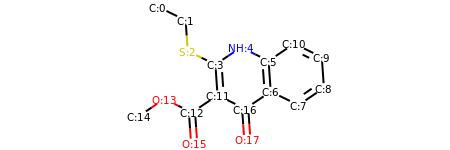

HETATM    1  C1  UNL     1      -3.577   3.595   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.229   2.936   0.000  1.00  0.00           C  
HETATM    3  S1  UNL     1      -2.125   1.440   0.000  1.00  0.00           S  
HETATM    4  C3  UNL     1      -0.778   0.781   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.466   1.619   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.814   0.961   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.918  -0.535   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.266  -1.194   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       4.510  -0.356   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       4.406   1.141   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       3.058   1.799   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -0.674  -0.715   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

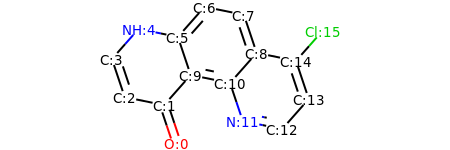

HETATM    1  O1  UNL     1      -1.500  -2.678   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.977  -1.256   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -3.447  -0.957   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -3.923   0.465   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -2.930   1.589   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -1.460   1.290   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -0.467   2.414   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.003   2.116   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.480   0.694   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -0.983  -0.132   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       0.487  -0.430   0.000  1.00  0.00           C  
HETATM   12  N2  UNL     1       0.963  -1.852   0.000  1.00  0.00           N  
HETATM   13  C10 UNL     1  

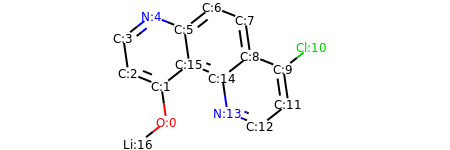

HETATM    1  O1  UNL     1      -1.772  -2.171   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.986  -0.686   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -3.378  -0.129   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -3.592   1.356   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -2.412   2.283   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -1.020   1.725   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.159   2.653   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.552   2.095   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       1.765   0.610   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.158   0.053   0.000  1.00  0.00           C  
HETATM   11 CL1  UNL     1       4.337   0.980   0.000  1.00  0.00          CL  
HETATM   12  C9  UNL     1       3.371  -1.432   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

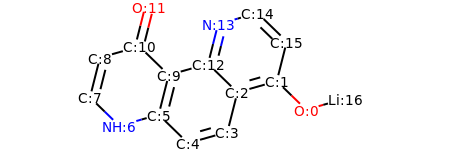

HETATM    1  O1  UNL     1       3.725  -1.168   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       2.649  -0.123   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.206  -0.532   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.838  -1.986   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.605  -2.395   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.681  -1.350   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1      -3.124  -1.759   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1      -4.200  -0.714   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -3.833   0.740   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -1.314   0.104   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.389   1.149   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1      -2.022   2.604   0.000  1.00  0.00           O  
HETATM   13  C10 UNL     1  

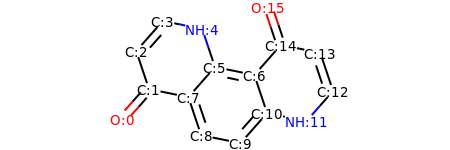

HETATM    1  O1  UNL     1      -3.944  -1.519   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.950  -0.395   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -3.427   1.027   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -2.433   2.151   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.963   1.852   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -0.487   0.430   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.983   0.132   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -1.480  -0.694   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -1.003  -2.116   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.467  -2.414   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.460  -1.290   0.000  1.00  0.00           C  
HETATM   12  N2  UNL     1       2.930  -1.589   0.000  1.00  0.00           N  
HETATM   13  C10 UNL     1  

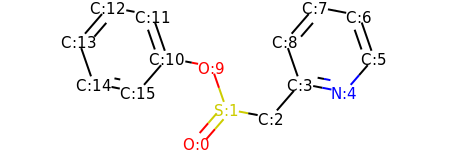

HETATM    1  O1  UNL     1      -0.982  -2.622   0.000  1.00  0.00           O  
HETATM    2  S1  UNL     1       0.000  -1.488   0.000  1.00  0.00           S  
HETATM    3  C1  UNL     1       1.473  -1.772   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1       2.455  -0.638   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       3.928  -0.921   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       4.910   0.213   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       4.419   1.630   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       2.946   1.913   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       1.964   0.780   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1      -0.491  -0.071   0.000  1.00  0.00           O  
HETATM   11  C7  UNL     1      -1.964   0.213   0.000  1.00  0.00           C  
HETATM   12  C8  UNL     1      -2.455   1.630   0.000  1.00  0.00           C  
HETATM   13  C9  UNL     1  

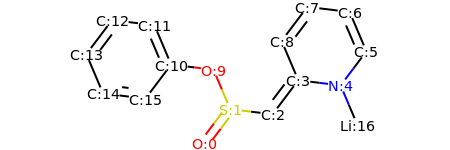

HETATM    1  O1  UNL     1      -1.071  -2.563   0.000  1.00  0.00           O  
HETATM    2  S1  UNL     1      -0.168  -1.365   0.000  1.00  0.00           S  
HETATM    3  C1  UNL     1       1.321  -1.549   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1       2.224  -0.351   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       3.713  -0.534   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       4.616   0.663   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       4.030   2.044   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       2.541   2.228   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       1.638   1.030   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1      -0.754   0.016   0.000  1.00  0.00           O  
HETATM   11  C7  UNL     1      -2.242   0.199   0.000  1.00  0.00           C  
HETATM   12  C8  UNL     1      -2.828   1.580   0.000  1.00  0.00           C  
HETATM   13  C9  UNL     1  

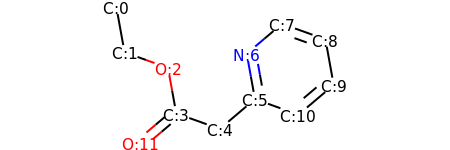

HETATM    1  C1  UNL     1      -3.494   2.290   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -3.227   0.814   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -1.816   0.307   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -1.549  -1.169   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.137  -1.676   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.008  -0.707   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1       0.741   0.769   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       1.886   1.738   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.298   1.231   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.564  -0.245   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       2.420  -1.214   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1      -2.694  -2.138   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2

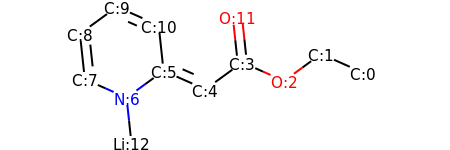

HETATM    1  C1  UNL     1       5.557  -0.278   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       4.185   0.330   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       2.973  -0.553   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       1.602   0.055   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.390  -0.829   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -0.981  -0.221   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1      -2.194  -1.104   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1      -3.565  -0.496   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -3.724   0.996   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -2.512   1.879   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -1.140   1.271   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1       1.443   1.546   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

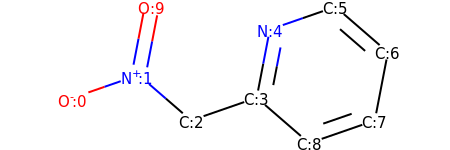

HETATM    1  O1  UNL     1      -3.799  -0.491   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1      -2.381   0.000   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1      -1.247  -0.982   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1       0.170  -0.491   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       0.454   0.982   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       1.871   1.473   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       3.005   0.491   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       2.721  -0.982   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       1.304  -1.473   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1      -2.098   1.473   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9    9
END

search for patterns

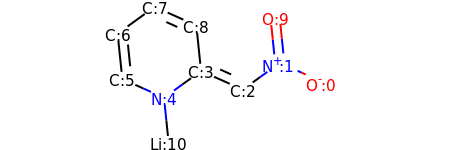

HETATM    1  O1  UNL     1       3.857  -0.563   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1       2.488   0.050   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1       1.272  -0.829   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1      -0.097  -0.216   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -1.312  -1.094   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -2.681  -0.481   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1      -2.834   1.011   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1      -1.619   1.890   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1      -0.250   1.277   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1       2.334   1.542   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1      -1.159  -2.587   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4    4
CONECT    4    5    9
CONECT    5    6   11

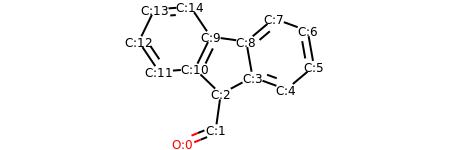

HETATM    1  O1  UNL     1      -1.700  -3.394   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.310  -2.832   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.101  -1.346   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.223  -0.642   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.633  -1.154   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.781  -0.190   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.521   1.287   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.111   1.800   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       0.962   0.836   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -0.523   1.044   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -1.181  -0.304   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -2.677  -0.409   0.000  1.00  0.00           C  
HETATM   13  C12 UNL     1  

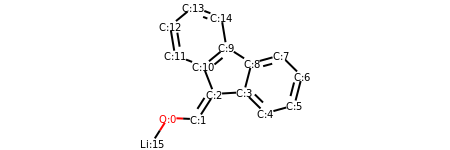

HETATM    1  O1  UNL     1      -2.724  -2.150   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.226  -2.218   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.417  -0.954   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.080  -0.865   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.148  -1.918   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.594  -1.520   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.972  -0.069   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.904   0.985   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       1.458   0.586   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       0.194   1.395   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -0.965   0.443   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -2.369   0.970   0.000  1.00  0.00           C  
HETATM   13  C12 UNL     1  

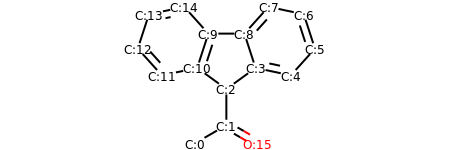

HETATM    1  C1  UNL     1      -1.299  -3.372   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       0.000  -2.622   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.000  -1.122   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       1.214  -0.241   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       2.681  -0.552   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       3.684   0.562   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1       3.221   1.989   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1       1.754   2.301   0.000  1.00  0.00           C  
HETATM    9  C9  UNL     1       0.750   1.186   0.000  1.00  0.00           C  
HETATM   10  C10 UNL     1      -0.750   1.186   0.000  1.00  0.00           C  
HETATM   11  C11 UNL     1      -1.214  -0.241   0.000  1.00  0.00           C  
HETATM   12  C12 UNL     1      -2.681  -0.552   0.000  1.00  0.00           C  
HETATM   13  C13 UNL     1  

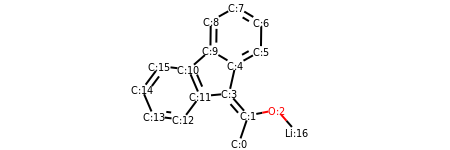

HETATM    1  C1  UNL     1       1.001  -3.227   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.483  -1.806   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       2.954  -1.513   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       0.494  -0.679   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.824   0.784   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.133   1.518   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.152   3.018   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.863   3.784   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -0.445   3.051   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -0.465   1.551   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -1.592   0.562   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -1.000  -0.816   0.000  1.00  0.00           C  
HETATM   13  C12 UNL     1  

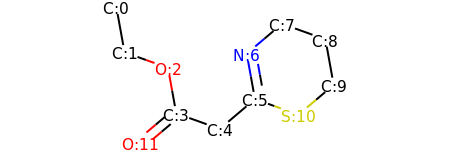

HETATM    1  C1  UNL     1      -3.494   2.290   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -3.227   0.814   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -1.816   0.307   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -1.549  -1.169   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.137  -1.676   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.008  -0.707   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1       0.741   0.769   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       1.886   1.738   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.298   1.231   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.564  -0.245   0.000  1.00  0.00           C  
HETATM   11  S1  UNL     1       2.420  -1.214   0.000  1.00  0.00           S  
HETATM   12  O2  UNL     1      -2.694  -2.138   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2

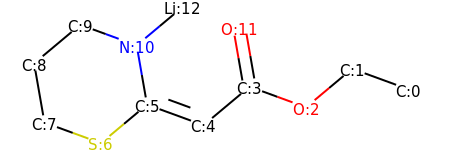

HETATM    1  C1  UNL     1       5.426  -0.281   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       4.017   0.234   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       2.866  -0.729   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       1.458  -0.214   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.307  -1.176   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.102  -0.661   0.000  1.00  0.00           C  
HETATM    7  S1  UNL     1      -2.252  -1.624   0.000  1.00  0.00           S  
HETATM    8  C6  UNL     1      -3.661  -1.109   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -3.919   0.369   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -2.769   1.331   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1      -1.360   0.816   0.000  1.00  0.00           N  
HETATM   12  O2  UNL     1       1.199   1.264   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

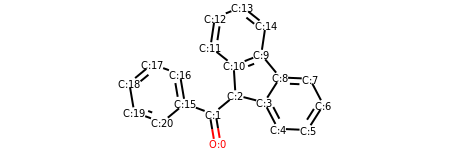

HETATM    1  O1  UNL     1      -0.555  -3.026   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.804  -1.547   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.352  -0.592   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.805  -0.966   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.499  -2.296   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       3.997  -2.360   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       4.802  -1.094   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       4.108   0.236   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.610   0.300   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       1.654   1.457   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       0.259   0.906   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -0.915   1.838   0.000  1.00  0.00           C  
HETATM   13  C12 UNL     1  

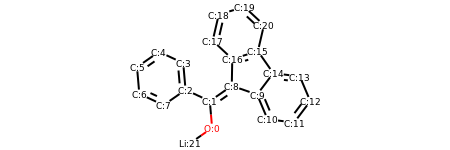

HETATM    1  O1  UNL     1      -0.705  -2.797   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.834  -1.303   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.193  -0.667   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -2.322   0.827   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -3.681   1.462   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -4.910   0.603   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -4.781  -0.891   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -3.422  -1.526   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       0.396  -0.444   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       1.813  -0.934   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       2.398  -2.315   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1       3.887  -2.500   0.000  1.00  0.00           C  
HETATM   13  C12 UNL     1  

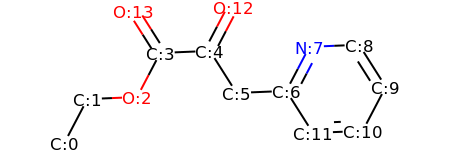

HETATM    1  C1  UNL     1      -5.120  -1.975   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -4.424  -0.646   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -2.925  -0.585   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -2.229   0.744   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.730   0.806   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       0.073  -0.461   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.571  -0.400   0.000  1.00  0.00           C  
HETATM    8  N1  UNL     1       2.267   0.929   0.000  1.00  0.00           N  
HETATM    9  C7  UNL     1       3.766   0.991   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       4.569  -0.277   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       3.873  -1.605   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       2.374  -1.667   0.000  1.00  0.00           C  
HETATM   13  O2  UNL     1  

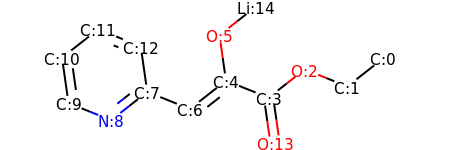

HETATM    1  C1  UNL     1       5.779   0.573   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       4.599  -0.354   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       3.207   0.205   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       2.027  -0.721   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.635  -0.162   0.000  1.00  0.00           C  
HETATM    6  O2  UNL     1       0.423   1.323   0.000  1.00  0.00           O  
HETATM    7  C5  UNL     1      -0.545  -1.088   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -1.937  -0.529   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -3.117  -1.455   0.000  1.00  0.00           N  
HETATM   10  C7  UNL     1      -4.509  -0.896   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1      -4.721   0.589   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1      -3.541   1.515   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

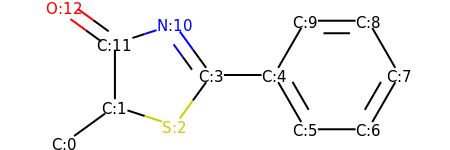

HETATM    1  C1  UNL     1      -3.874  -1.632   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.660  -0.750   0.000  1.00  0.00           C  
HETATM    3  S1  UNL     1      -1.234  -1.214   0.000  1.00  0.00           S  
HETATM    4  C3  UNL     1      -0.352  -0.000   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.148   0.000   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.898  -1.299   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.398  -1.299   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       4.148   0.000   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       3.398   1.299   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       1.898   1.299   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1      -1.234   1.214   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1      -2.660   0.750   0.000  1.00  0.00           C  
HETATM   13  O1  UNL     1  

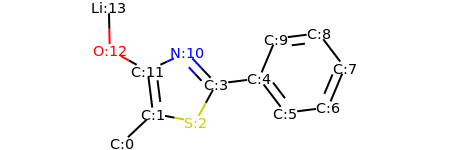

HETATM    1  C1  UNL     1      -3.347  -2.293   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.254  -1.266   0.000  1.00  0.00           C  
HETATM    3  S1  UNL     1      -0.780  -1.547   0.000  1.00  0.00           S  
HETATM    4  C3  UNL     1      -0.058  -0.232   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.430  -0.044   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.338  -1.238   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.826  -1.050   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       4.407   0.333   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       3.499   1.528   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       2.011   1.339   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1      -1.085   0.861   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1      -2.442   0.222   0.000  1.00  0.00           C  
HETATM   13  O1  UNL     1  

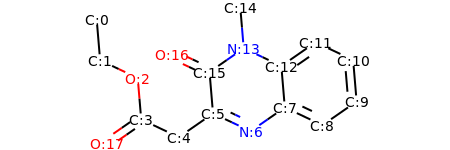

HETATM    1  C1  UNL     1      -4.537   2.297   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -4.412   0.802   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -3.055   0.163   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -2.930  -1.332   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.573  -1.971   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -0.341  -1.116   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1       1.016  -1.755   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       2.248  -0.899   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.605  -1.539   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       4.837  -0.683   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       4.712   0.812   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       3.355   1.451   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

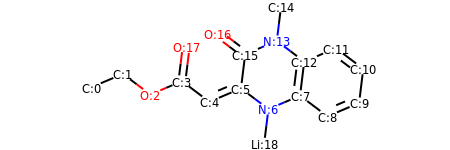

HETATM    1  C1  UNL     1      -6.877  -0.466   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -5.496   0.120   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -4.298  -0.783   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -2.918  -0.198   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.720  -1.101   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -0.339  -0.515   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1       0.859  -1.418   0.000  1.00  0.00           N  
HETATM    8  C6  UNL     1       2.240  -0.832   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.437  -1.736   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       4.818  -1.150   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       5.002   0.339   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       3.804   1.242   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

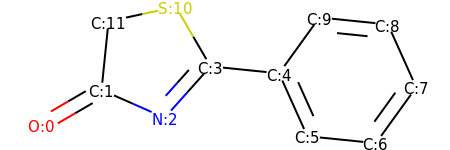

HETATM    1  O1  UNL     1      -4.326  -1.063   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -3.030  -0.309   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.658  -0.915   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.658   0.204   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.835   0.052   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.449  -1.316   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.942  -1.468   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.819  -0.252   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       3.205   1.117   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       1.712   1.268   0.000  1.00  0.00           C  
HETATM   11  S1  UNL     1      -1.412   1.500   0.000  1.00  0.00           S  
HETATM   12  C9  UNL     1      -2.878   1.183   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT

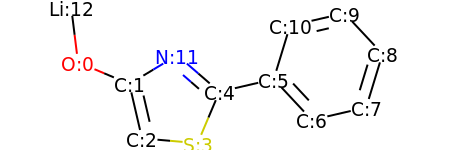

HETATM    1  O1  UNL     1      -4.071   0.356   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.690  -0.229   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -2.352  -1.690   0.000  1.00  0.00           C  
HETATM    4  S1  UNL     1      -0.857  -1.820   0.000  1.00  0.00           S  
HETATM    5  C3  UNL     1      -0.272  -0.439   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.189  -0.100   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.213  -1.196   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.674  -0.858   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       4.112   0.577   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       3.088   1.673   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.627   1.335   0.000  1.00  0.00           C  
HETATM   12  N1  UNL     1      -1.405   0.545   0.000  1.00  0.00           N  
HETATM   13 LI1  UNL     1  

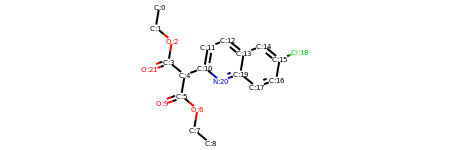

HETATM    1  C1  UNL     1      -3.732   4.530   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -3.980   3.051   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -2.822   2.097   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -3.070   0.617   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.912  -0.337   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -2.160  -1.816   0.000  1.00  0.00           C  
HETATM    7  O2  UNL     1      -1.002  -2.770   0.000  1.00  0.00           O  
HETATM    8  C6  UNL     1      -1.250  -4.250   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -0.092  -5.204   0.000  1.00  0.00           C  
HETATM   10  O3  UNL     1      -3.565  -2.342   0.000  1.00  0.00           O  
HETATM   11  C8  UNL     1      -0.507   0.189   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1      -0.260   1.668   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

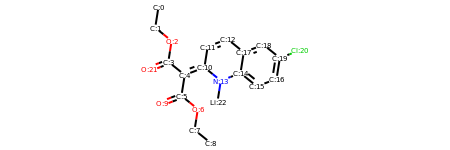

HETATM    1  C1  UNL     1      -3.793   4.592   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -4.027   3.111   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -2.860   2.167   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -3.094   0.686   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -1.927  -0.257   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -2.161  -1.739   0.000  1.00  0.00           C  
HETATM    7  O2  UNL     1      -0.995  -2.682   0.000  1.00  0.00           O  
HETATM    8  C6  UNL     1      -1.228  -4.164   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -0.062  -5.107   0.000  1.00  0.00           C  
HETATM   10  O3  UNL     1      -3.561  -2.278   0.000  1.00  0.00           O  
HETATM   11  C8  UNL     1      -0.527   0.281   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1      -0.294   1.763   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

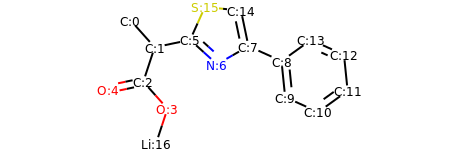

HETATM    1  C1  UNL     1      -3.969   1.874   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.969   0.755   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -3.438  -0.670   0.000  1.00  0.00           C  
HETATM    4  O1  UNL     1      -2.439  -1.788   0.000  1.00  0.00           O  
HETATM    5  O2  UNL     1      -4.907  -0.976   0.000  1.00  0.00           O  
HETATM    6  C4  UNL     1      -1.501   1.061   0.000  1.00  0.00           C  
HETATM    7  N1  UNL     1      -0.390   0.054   0.000  1.00  0.00           N  
HETATM    8  C5  UNL     1       0.912   0.799   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.280   0.183   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       2.431  -1.309   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       3.799  -1.924   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       5.016  -1.047   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

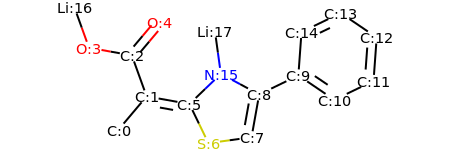

HETATM    1  C1  UNL     1      -3.745  -2.016   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.778  -0.869   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -3.287   0.541   0.000  1.00  0.00           C  
HETATM    4  O1  UNL     1      -4.764   0.806   0.000  1.00  0.00           O  
HETATM    5  O2  UNL     1      -2.320   1.688   0.000  1.00  0.00           O  
HETATM    6  C4  UNL     1      -1.301  -1.134   0.000  1.00  0.00           C  
HETATM    7  S1  UNL     1      -0.647  -2.484   0.000  1.00  0.00           S  
HETATM    8  C5  UNL     1       0.839  -2.279   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       1.103  -0.802   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       2.453  -0.148   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       3.694  -0.990   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       5.044  -0.336   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

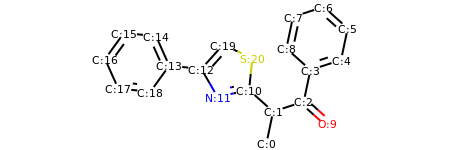

HETATM    1  C1  UNL     1       1.232  -3.462   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.541  -1.994   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       2.966  -1.527   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       3.274  -0.059   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       4.700   0.408   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       5.008   1.876   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1       3.891   2.877   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1       2.466   2.410   0.000  1.00  0.00           C  
HETATM    9  C9  UNL     1       2.157   0.942   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1       4.083  -2.528   0.000  1.00  0.00           O  
HETATM   11  C10 UNL     1       0.423  -0.993   0.000  1.00  0.00           C  
HETATM   12  N1  UNL     1      -1.043  -1.309   0.000  1.00  0.00           N  
HETATM   13  C11 UNL     1  

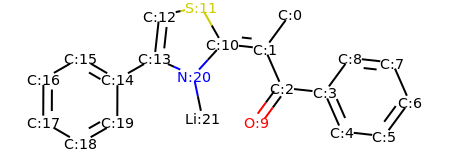

HETATM    1  C1  UNL     1       2.346   2.335   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.459   1.125   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       2.063  -0.248   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       3.554  -0.411   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       4.158  -1.784   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       5.649  -1.948   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1       6.536  -0.738   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1       5.932   0.635   0.000  1.00  0.00           C  
HETATM    9  C9  UNL     1       4.441   0.798   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1       1.176  -1.457   0.000  1.00  0.00           O  
HETATM   11  C10 UNL     1      -0.032   1.289   0.000  1.00  0.00           C  
HETATM   12  S1  UNL     1      -0.776   2.591   0.000  1.00  0.00           S  
HETATM   13  C11 UNL     1  

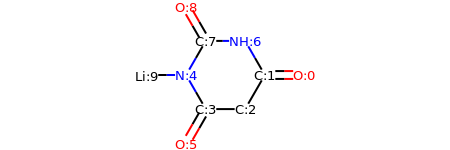

HETATM    1  O1  UNL     1       3.300   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.800  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       1.050  -1.299   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.450  -1.299   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -1.200   0.000   0.000  1.00  0.00           N  
HETATM    6  O2  UNL     1      -1.200  -2.598   0.000  1.00  0.00           O  
HETATM    7  N2  UNL     1       1.050   1.299   0.000  1.00  0.00           N  
HETATM    8  C4  UNL     1      -0.450   1.299   0.000  1.00  0.00           C  
HETATM    9  O3  UNL     1      -1.200   2.598   0.000  1.00  0.00           O  
HETATM   10 LI1  UNL     1      -2.700   0.000   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4
CONECT    4    5    6    6
CONECT    5    8   10
CONECT    7    8
CONECT    8    9    9
END

search for patterns ...
found primar

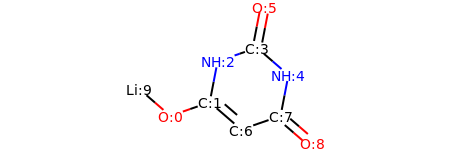

HETATM    1  O1  UNL     1      -2.438  -0.982   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.021  -0.491   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.737   0.982   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.680   1.473   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       1.814   0.491   0.000  1.00  0.00           N  
HETATM    6  O2  UNL     1       0.964   2.946   0.000  1.00  0.00           O  
HETATM    7  C3  UNL     1       0.113  -1.473   0.000  1.00  0.00           C  
HETATM    8  C4  UNL     1       1.531  -0.982   0.000  1.00  0.00           C  
HETATM    9  O3  UNL     1       2.665  -1.964   0.000  1.00  0.00           O  
HETATM   10 LI1  UNL     1      -3.572   0.000   0.000  1.00  0.00          LI  
CONECT    1    2   10
CONECT    2    3    7    7
CONECT    3    4
CONECT    4    5    6    6
CONECT    5    8
CONECT    7    8
CONECT    8    9    9
END

#################
#################


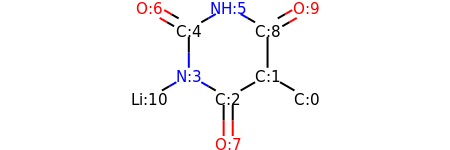

HETATM    1  C1  UNL     1       2.598  -1.227   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.299  -0.477   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.000  -1.227   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.299  -0.477   0.000  1.00  0.00           N  
HETATM    5  C4  UNL     1      -1.299   1.023   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1       0.000   1.773   0.000  1.00  0.00           N  
HETATM    7  O1  UNL     1      -2.598   1.773   0.000  1.00  0.00           O  
HETATM    8  O2  UNL     1      -0.000  -2.727   0.000  1.00  0.00           O  
HETATM    9  C5  UNL     1       1.299   1.023   0.000  1.00  0.00           C  
HETATM   10  O3  UNL     1       2.598   1.773   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1      -2.598  -1.227   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    9
CONECT    3    4    8    8
CONECT    4    5   11
CONECT    5    6    7

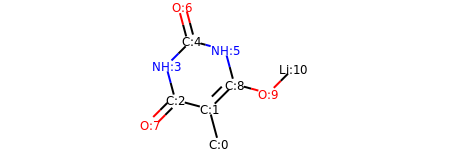

HETATM    1  C1  UNL     1       0.346  -2.660   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.042  -1.211   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -1.491  -0.823   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.879   0.626   0.000  1.00  0.00           N  
HETATM    5  C4  UNL     1      -0.819   1.686   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1       0.630   1.298   0.000  1.00  0.00           N  
HETATM    7  O1  UNL     1      -1.207   3.135   0.000  1.00  0.00           O  
HETATM    8  O2  UNL     1      -2.552  -1.884   0.000  1.00  0.00           O  
HETATM    9  C5  UNL     1       1.018  -0.151   0.000  1.00  0.00           C  
HETATM   10  O3  UNL     1       2.467  -0.539   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1       3.528   0.522   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    9    9
CONECT    3    4    8    8
CONECT    4    5
CONECT    5    6    7

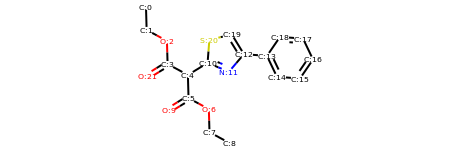

HETATM    1  C1  UNL     1      -4.775   3.969   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -4.734   2.469   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -3.415   1.755   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -3.374   0.256   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -2.055  -0.458   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -2.014  -1.958   0.000  1.00  0.00           C  
HETATM    7  O2  UNL     1      -0.694  -2.672   0.000  1.00  0.00           O  
HETATM    8  C6  UNL     1      -0.653  -4.171   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.666  -4.885   0.000  1.00  0.00           C  
HETATM   10  O3  UNL     1      -3.292  -2.743   0.000  1.00  0.00           O  
HETATM   11  C8  UNL     1      -0.777   0.327   0.000  1.00  0.00           C  
HETATM   12  N1  UNL     1       0.610  -0.245   0.000  1.00  0.00           N  
HETATM   13  C9  UNL     1  

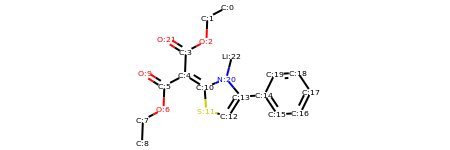

HETATM    1  C1  UNL     1       0.677   4.804   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.650   4.105   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -0.708   2.606   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -2.034   1.906   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -2.092   0.407   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -3.419  -0.292   0.000  1.00  0.00           C  
HETATM    7  O2  UNL     1      -3.477  -1.791   0.000  1.00  0.00           O  
HETATM    8  C6  UNL     1      -4.804  -2.490   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -4.862  -3.989   0.000  1.00  0.00           C  
HETATM   10  O3  UNL     1      -4.688   0.507   0.000  1.00  0.00           O  
HETATM   11  C8  UNL     1      -0.823  -0.392   0.000  1.00  0.00           C  
HETATM   12  S1  UNL     1      -0.724  -1.889   0.000  1.00  0.00           S  
HETATM   13  C9  UNL     1  

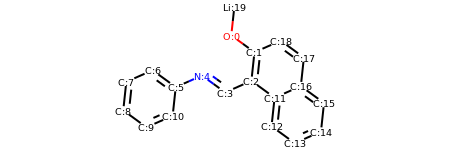

HETATM    1  O1  UNL     1      -0.108   2.652   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.104   1.767   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.944   0.276   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.427  -0.331   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -1.639   0.553   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -3.011  -0.054   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -4.222   0.830   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -5.594   0.222   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -5.754  -1.269   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -4.542  -2.153   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -3.171  -1.546   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       2.156  -0.608   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

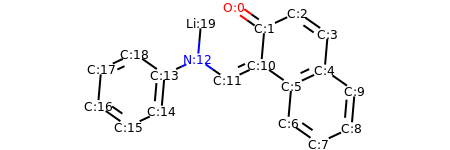

HETATM    1  O1  UNL     1      -0.086   2.755   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.143   1.895   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.502   2.530   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       3.731   1.670   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.601   0.175   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.242  -0.459   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.112  -1.953   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.341  -2.813   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       4.700  -2.179   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       4.830  -0.685   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       1.013   0.401   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -0.346  -0.233   0.000  1.00  0.00           C  
HETATM   13  N1  UNL     1  

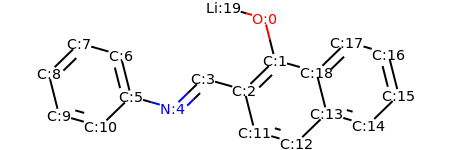

HETATM    1  O1  UNL     1       1.177   2.232   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.545   0.778   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.470  -0.268   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.974   0.140   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -2.049  -0.905   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -3.492  -0.497   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -3.860   0.957   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -5.304   1.366   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -6.379   0.320   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -6.011  -1.134   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -4.568  -1.543   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1       0.838  -1.722   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

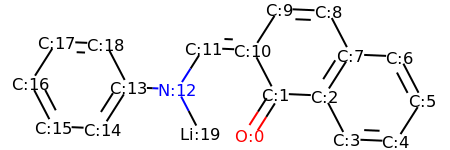

HETATM    1  O1  UNL     1       0.457  -1.580   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.262  -0.315   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.761  -0.380   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       3.454  -1.711   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       4.952  -1.776   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       5.758  -0.511   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       5.065   0.820   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.567   0.885   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.874   2.215   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       1.376   2.281   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       0.570   1.015   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -0.929   1.081   0.000  1.00  0.00           C  
HETATM   13  N1  UNL     1  

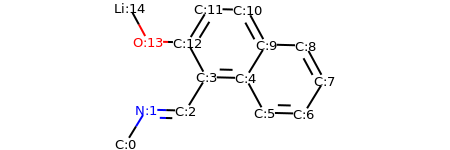

HETATM    1  C1  UNL     1      -3.576  -2.852   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -2.792  -1.573   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -1.292  -1.612   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.509  -0.333   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.991  -0.372   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.707  -1.690   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.206  -1.730   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.990  -0.451   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       3.274   0.868   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       1.774   0.907   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       1.058   2.225   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -0.441   2.264   0.000  1.00  0.00           C  
HETATM   13  C12 UNL     1  

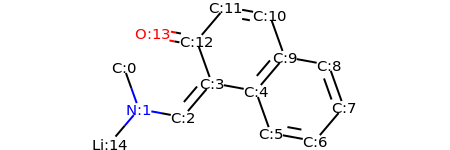

HETATM    1  C1  UNL     1      -3.474   0.456   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -2.969  -0.956   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1      -1.493  -1.225   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.523  -0.081   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.953  -0.349   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.458  -1.762   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.934  -2.030   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.904  -0.887   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       3.399   0.526   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       1.923   0.794   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       1.418   2.207   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -0.058   2.475   0.000  1.00  0.00           C  
HETATM   13  C12 UNL     1  

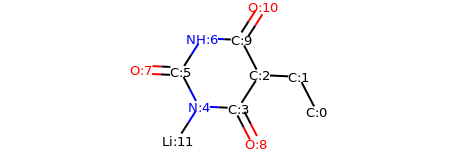

HETATM    1  C1  UNL     1       3.264  -1.126   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.575   0.207   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       1.076   0.276   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.267  -0.988   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -1.231  -0.919   0.000  1.00  0.00           N  
HETATM    6  C5  UNL     1      -1.921   0.413   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1      -1.112   1.677   0.000  1.00  0.00           N  
HETATM    8  O1  UNL     1      -3.419   0.482   0.000  1.00  0.00           O  
HETATM    9  O2  UNL     1       0.957  -2.320   0.000  1.00  0.00           O  
HETATM   10  C6  UNL     1       0.387   1.608   0.000  1.00  0.00           C  
HETATM   11  O3  UNL     1       1.196   2.871   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1      -2.040  -2.182   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

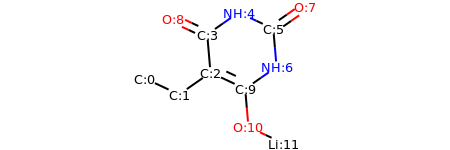

HETATM    1  C1  UNL     1      -3.430  -0.546   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.071  -1.182   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.841  -0.323   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.970   1.171   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.260   2.030   0.000  1.00  0.00           N  
HETATM    6  C5  UNL     1       1.619   1.394   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1       1.747  -0.101   0.000  1.00  0.00           N  
HETATM    8  O1  UNL     1       2.849   2.252   0.000  1.00  0.00           O  
HETATM    9  O2  UNL     1      -2.328   1.807   0.000  1.00  0.00           O  
HETATM   10  C6  UNL     1       0.517  -0.959   0.000  1.00  0.00           C  
HETATM   11  O3  UNL     1       0.646  -2.454   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1       2.004  -3.090   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

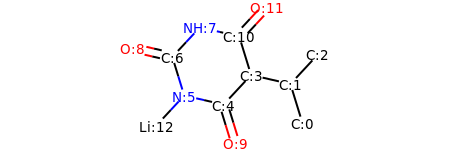

HETATM    1  C1  UNL     1       2.735  -1.755   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       2.294  -0.321   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       3.315   0.778   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.832   0.014   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -0.189  -1.084   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1      -1.651  -0.749   0.000  1.00  0.00           N  
HETATM    7  C6  UNL     1      -2.092   0.685   0.000  1.00  0.00           C  
HETATM    8  N2  UNL     1      -1.071   1.783   0.000  1.00  0.00           N  
HETATM    9  O1  UNL     1      -3.554   1.020   0.000  1.00  0.00           O  
HETATM   10  O2  UNL     1       0.251  -2.518   0.000  1.00  0.00           O  
HETATM   11  C7  UNL     1       0.391   1.448   0.000  1.00  0.00           C  
HETATM   12  O3  UNL     1       1.412   2.547   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

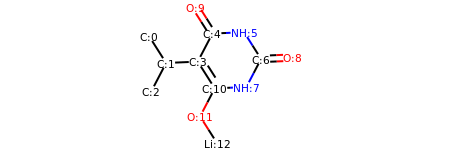

HETATM    1  C1  UNL     1      -2.950   1.475   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.145   0.209   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -2.840  -1.121   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.647   0.273   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       0.047   1.602   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       1.546   1.666   0.000  1.00  0.00           N  
HETATM    7  C6  UNL     1       2.351   0.400   0.000  1.00  0.00           C  
HETATM    8  N2  UNL     1       1.656  -0.930   0.000  1.00  0.00           N  
HETATM    9  O1  UNL     1       3.849   0.464   0.000  1.00  0.00           O  
HETATM   10  O2  UNL     1      -0.757   2.868   0.000  1.00  0.00           O  
HETATM   11  C7  UNL     1       0.158  -0.993   0.000  1.00  0.00           C  
HETATM   12  O3  UNL     1      -0.536  -2.323   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

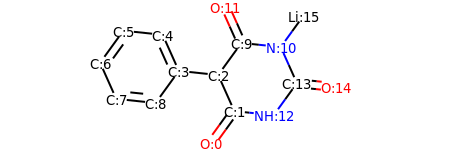

HETATM    1  O1  UNL     1      -0.191  -2.755   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.689  -1.541   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.077  -0.171   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.415  -0.017   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -2.028   1.353   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -3.520   1.507   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -4.400   0.292   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -3.787  -1.077   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -2.295  -1.232   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       0.956   1.044   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1       2.448   0.889   0.000  1.00  0.00           N  
HETATM   12  O2  UNL     1       0.344   2.413   0.000  1.00  0.00           O  
HETATM   13  N2  UNL     1  

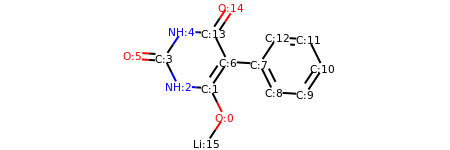

HETATM    1  O1  UNL     1      -0.384  -2.335   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.050  -0.990   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.547  -0.895   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -3.212   0.450   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -2.381   1.698   0.000  1.00  0.00           N  
HETATM    6  O2  UNL     1      -4.709   0.545   0.000  1.00  0.00           O  
HETATM    7  C3  UNL     1      -0.218   0.258   0.000  1.00  0.00           C  
HETATM    8  C4  UNL     1       1.279   0.162   0.000  1.00  0.00           C  
HETATM    9  C5  UNL     1       1.944  -1.182   0.000  1.00  0.00           C  
HETATM   10  C6  UNL     1       3.441  -1.278   0.000  1.00  0.00           C  
HETATM   11  C7  UNL     1       4.272  -0.029   0.000  1.00  0.00           C  
HETATM   12  C8  UNL     1       3.607   1.315   0.000  1.00  0.00           C  
HETATM   13  C9  UNL     1  

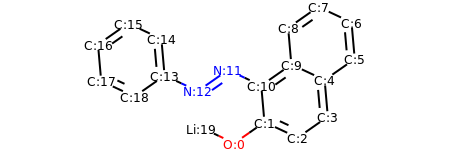

HETATM    1  O1  UNL     1      -0.086  -2.755   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.143  -1.895   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.502  -2.530   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       3.731  -1.670   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.601  -0.175   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       4.830   0.685   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       4.700   2.179   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.341   2.813   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.112   1.953   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       2.242   0.459   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       1.013  -0.401   0.000  1.00  0.00           C  
HETATM   12  N1  UNL     1      -0.346   0.233   0.000  1.00  0.00           N  
HETATM   13  N2  UNL     1  

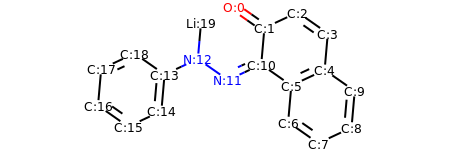

HETATM    1  O1  UNL     1      -0.086   2.755   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.143   1.895   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.502   2.530   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       3.731   1.670   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.601   0.175   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.242  -0.459   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       2.112  -1.953   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.341  -2.813   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       4.700  -2.179   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       4.830  -0.685   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       1.013   0.401   0.000  1.00  0.00           C  
HETATM   12  N1  UNL     1      -0.346  -0.233   0.000  1.00  0.00           N  
HETATM   13  N2  UNL     1  

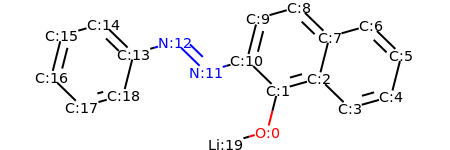

HETATM    1  O1  UNL     1       1.177  -2.232   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.545  -0.778   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.988  -0.369   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       4.064  -1.415   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       5.507  -1.007   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       5.875   0.447   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       4.800   1.493   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.356   1.085   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.281   2.131   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       0.838   1.722   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       0.470   0.268   0.000  1.00  0.00           C  
HETATM   12  N1  UNL     1      -0.974  -0.140   0.000  1.00  0.00           N  
HETATM   13  N2  UNL     1  

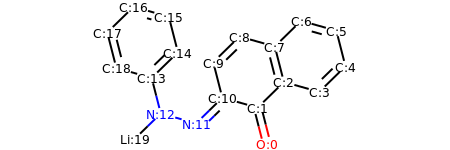

HETATM    1  O1  UNL     1       1.896  -2.960   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.525  -1.507   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.598  -0.459   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       4.042  -0.864   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       5.115   0.184   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       4.744   1.637   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       3.299   2.043   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       2.226   0.994   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       0.782   1.400   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -0.291   0.351   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       0.080  -1.102   0.000  1.00  0.00           C  
HETATM   12  N1  UNL     1      -0.993  -2.150   0.000  1.00  0.00           N  
HETATM   13  N2  UNL     1  

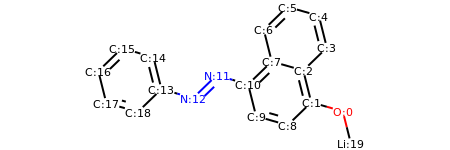

HETATM    1  O1  UNL     1       4.796  -1.505   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       3.354  -1.093   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       2.989   0.362   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       4.067   1.405   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.703   2.860   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.261   3.272   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.183   2.229   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       1.547   0.774   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.276  -2.136   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       0.834  -1.724   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       0.469  -0.269   0.000  1.00  0.00           C  
HETATM   12  N1  UNL     1      -0.973   0.143   0.000  1.00  0.00           N  
HETATM   13  N2  UNL     1  

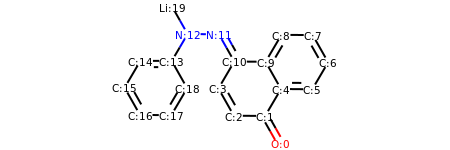

HETATM    1  O1  UNL     1       2.598  -3.270   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.859  -1.964   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.359  -1.952   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.380  -0.646   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.619  -0.672   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       4.119  -0.684   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       4.880   0.609   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       4.141   1.914   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.641   1.926   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1       1.880   0.634   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1       0.380   0.646   0.000  1.00  0.00           C  
HETATM   12  N1  UNL     1      -0.359   1.952   0.000  1.00  0.00           N  
HETATM   13  N2  UNL     1  

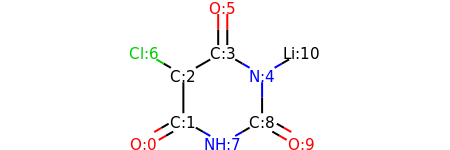

HETATM    1  O1  UNL     1      -2.598  -1.773   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.299  -1.023   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.299   0.477   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.000   1.227   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.299   0.477   0.000  1.00  0.00           N  
HETATM    6  O2  UNL     1       0.000   2.727   0.000  1.00  0.00           O  
HETATM    7 CL1  UNL     1      -2.598   1.227   0.000  1.00  0.00          CL  
HETATM    8  N2  UNL     1       0.000  -1.773   0.000  1.00  0.00           N  
HETATM    9  C4  UNL     1       1.299  -1.023   0.000  1.00  0.00           C  
HETATM   10  O3  UNL     1       2.598  -1.773   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1       2.598   1.227   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3    8
CONECT    3    4    7
CONECT    4    5    6    6
CONECT    5    9

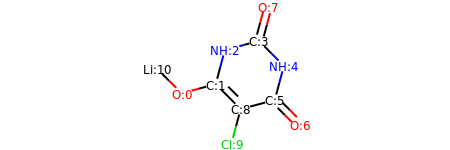

HETATM    1  O1  UNL     1      -2.467  -0.539   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.018  -0.151   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.630   1.298   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.819   1.686   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       1.879   0.626   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       1.491  -0.823   0.000  1.00  0.00           C  
HETATM    7  O2  UNL     1       2.552  -1.884   0.000  1.00  0.00           O  
HETATM    8  O3  UNL     1       1.207   3.135   0.000  1.00  0.00           O  
HETATM    9  C4  UNL     1       0.042  -1.211   0.000  1.00  0.00           C  
HETATM   10 CL1  UNL     1      -0.346  -2.660   0.000  1.00  0.00          CL  
HETATM   11 LI1  UNL     1      -3.528   0.522   0.000  1.00  0.00          LI  
CONECT    1    2   11
CONECT    2    3    9    9
CONECT    3    4
CONECT    4    5    8    8
CONECT    5    6

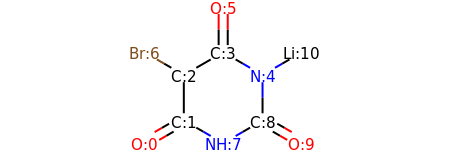

HETATM    1  O1  UNL     1      -2.598  -1.773   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.299  -1.023   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.299   0.477   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.000   1.227   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       1.299   0.477   0.000  1.00  0.00           N  
HETATM    6  O2  UNL     1       0.000   2.727   0.000  1.00  0.00           O  
HETATM    7 BR1  UNL     1      -2.598   1.227   0.000  1.00  0.00          BR  
HETATM    8  N2  UNL     1       0.000  -1.773   0.000  1.00  0.00           N  
HETATM    9  C4  UNL     1       1.299  -1.023   0.000  1.00  0.00           C  
HETATM   10  O3  UNL     1       2.598  -1.773   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1       2.598   1.227   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3    8
CONECT    3    4    7
CONECT    4    5    6    6
CONECT    5    9

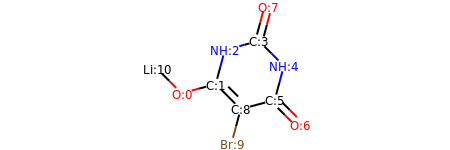

HETATM    1  O1  UNL     1      -2.467  -0.539   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.018  -0.151   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.630   1.298   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.819   1.686   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       1.879   0.626   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       1.491  -0.823   0.000  1.00  0.00           C  
HETATM    7  O2  UNL     1       2.552  -1.884   0.000  1.00  0.00           O  
HETATM    8  O3  UNL     1       1.207   3.135   0.000  1.00  0.00           O  
HETATM    9  C4  UNL     1       0.042  -1.211   0.000  1.00  0.00           C  
HETATM   10 BR1  UNL     1      -0.346  -2.660   0.000  1.00  0.00          BR  
HETATM   11 LI1  UNL     1      -3.528   0.522   0.000  1.00  0.00          LI  
CONECT    1    2   11
CONECT    2    3    9    9
CONECT    3    4
CONECT    4    5    8    8
CONECT    5    6

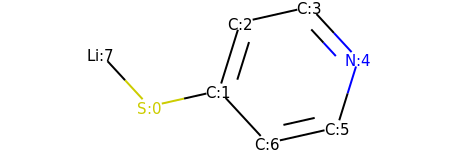

HETATM    1  S1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.159   1.129   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.305   1.459   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       2.322   0.357   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.876  -1.075   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.413  -1.405   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


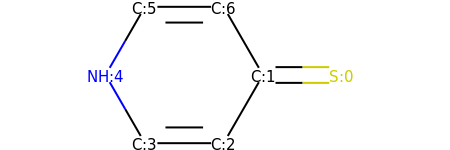

HETATM    1  S1  UNL     1       2.571   0.000   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.321  -1.299   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.179  -1.299   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -1.929   0.000   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -1.179   1.299   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4    4
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found thiol


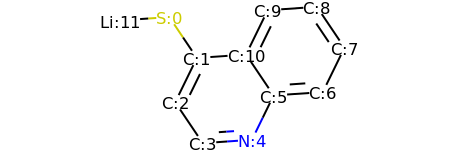

HETATM    1  S1  UNL     1      -2.170   1.477   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -1.332   0.233   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.990  -1.115   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.152  -2.359   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.344  -2.255   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.003  -0.907   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.499  -0.803   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.157   0.544   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.319   1.789   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.823   1.685   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       0.165   0.337   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -3.666   1.373   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

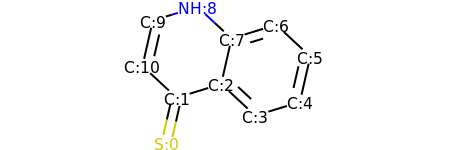

HETATM    1  S1  UNL     1      -1.758  -2.396   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -1.424  -0.934   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.009  -0.492   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.109  -1.512   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.542  -1.069   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.876   0.393   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.776   1.413   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.343   0.971   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -0.757   1.991   0.000  1.00  0.00           N  
HETATM   10  C8  UNL     1      -2.191   1.549   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.524   0.086   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6    6

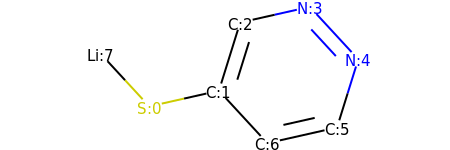

HETATM    1  S1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.159   1.129   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       1.305   1.459   0.000  1.00  0.00           N  
HETATM    5  N2  UNL     1       2.322   0.357   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       1.876  -1.075   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.413  -1.405   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


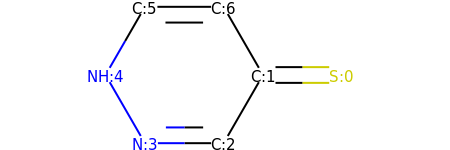

HETATM    1  S1  UNL     1       2.571   0.000   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.321  -1.299   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.179  -1.299   0.000  1.00  0.00           N  
HETATM    5  N2  UNL     1      -1.929   0.000   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -1.179   1.299   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4    4
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...


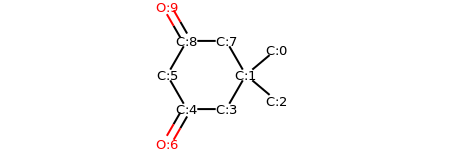

HETATM    1  C1  UNL     1       2.419   0.964   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.270  -0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       2.419  -0.964   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.520  -1.299   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -0.980  -1.299   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1      -1.730   0.000   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1      -1.730  -2.598   0.000  1.00  0.00           O  
HETATM    8  C7  UNL     1       0.520   1.299   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -0.980   1.299   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1      -1.730   2.598   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    4    8
CONECT    4    5
CONECT    5    6    7    7
CONECT    6    9
CONECT    8    9
CONECT    9   10   10
END

search for patterns ...
found primary alc

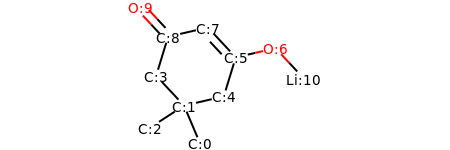

HETATM    1  C1  UNL     1      -0.150  -2.577   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.736  -1.196   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -1.995  -2.013   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -1.759  -0.099   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       0.725  -0.859   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       1.164   0.575   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1       2.626   0.913   0.000  1.00  0.00           O  
HETATM    8  C7  UNL     1       0.141   1.673   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -1.320   1.335   0.000  1.00  0.00           C  
HETATM   10  O2  UNL     1      -2.343   2.433   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1       3.648  -0.185   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    4    5
CONECT    4    9
CONECT    5    6
CONECT    6    7    8    8
CONE

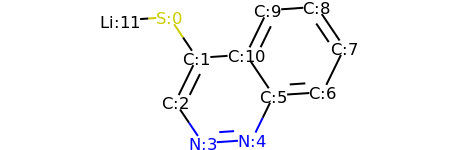

HETATM    1  S1  UNL     1      -2.170   1.477   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -1.332   0.233   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -1.990  -1.115   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.152  -2.359   0.000  1.00  0.00           N  
HETATM    5  N2  UNL     1       0.344  -2.255   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1       1.003  -0.907   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1       2.499  -0.803   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       3.157   0.544   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.319   1.789   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       0.823   1.685   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       0.165   0.337   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -3.666   1.373   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

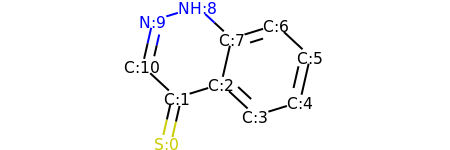

HETATM    1  S1  UNL     1      -1.758  -2.396   0.000  1.00  0.00           S  
HETATM    2  C1  UNL     1      -1.424  -0.934   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.009  -0.492   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.109  -1.512   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.542  -1.069   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       2.876   0.393   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       1.776   1.413   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       0.343   0.971   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -0.757   1.991   0.000  1.00  0.00           N  
HETATM   10  N2  UNL     1      -2.191   1.549   0.000  1.00  0.00           N  
HETATM   11  C8  UNL     1      -2.524   0.086   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6    6

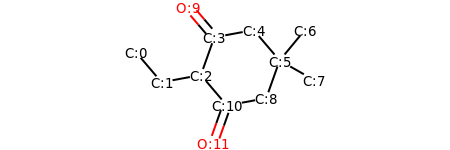

HETATM    1  C1  UNL     1      -3.539   0.559   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.566  -0.582   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -1.091  -0.311   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.588   1.103   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       0.887   1.374   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       1.860   0.232   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1       2.815   1.388   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1       3.164  -0.508   0.000  1.00  0.00           C  
HETATM    9  C9  UNL     1       1.357  -1.181   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1      -1.561   2.244   0.000  1.00  0.00           O  
HETATM   11  C10 UNL     1      -0.118  -1.453   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1      -0.620  -2.866   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2

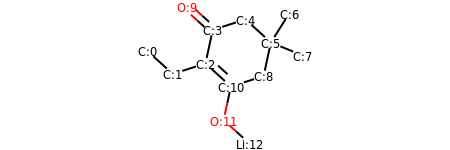

HETATM    1  C1  UNL     1      -3.648   0.405   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.537  -0.603   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -1.108  -0.145   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.791   1.321   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       0.638   1.778   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       1.748   0.770   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1       2.548   2.039   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1       3.137   0.203   0.000  1.00  0.00           C  
HETATM    9  C9  UNL     1       1.431  -0.696   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1      -1.901   2.329   0.000  1.00  0.00           O  
HETATM   11  C10 UNL     1       0.002  -1.154   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1      -0.315  -2.619   0.000  1.00  0.00           O  
HETATM   13 LI1  UNL     1  

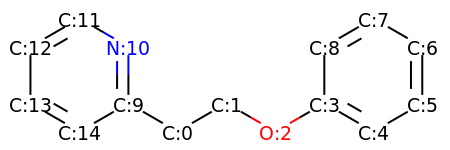

HETATM    1  C1  UNL     1      -1.299  -1.250   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.000  -0.500   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1       1.299  -1.250   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1       2.598  -0.500   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       3.897  -1.250   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       5.196  -0.500   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       5.196   1.000   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.897   1.750   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1       2.598   1.000   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -2.598  -0.500   0.000  1.00  0.00           C  
HETATM   11  N1  UNL     1      -2.598   1.000   0.000  1.00  0.00           N  
HETATM   12  C10 UNL     1      -3.897   1.750   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

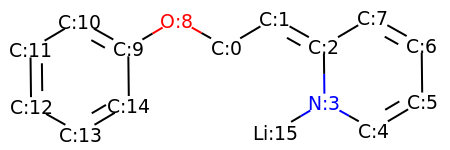

HETATM    1  C1  UNL     1      -0.088   0.608   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.202   1.374   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       2.510   0.639   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       2.527  -0.861   0.000  1.00  0.00           N  
HETATM    5  C4  UNL     1       3.835  -1.595   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       5.125  -0.830   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1       5.107   0.670   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1       3.800   1.404   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1      -1.396   1.343   0.000  1.00  0.00           O  
HETATM   10  C8  UNL     1      -2.686   0.578   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -3.994   1.312   0.000  1.00  0.00           C  
HETATM   12  C10 UNL     1      -5.284   0.547   0.000  1.00  0.00           C  
HETATM   13  C11 UNL     1  

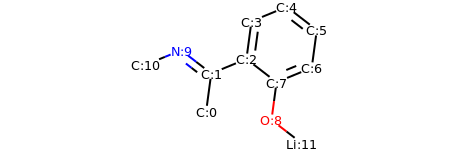

HETATM    1  C1  UNL     1      -1.752  -1.657   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.552  -0.170   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -0.165   0.400   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.035   1.887   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       1.422   2.458   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       2.610   1.541   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1       2.410   0.055   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1       1.023  -0.516   0.000  1.00  0.00           C  
HETATM    9  O1  UNL     1       0.823  -2.002   0.000  1.00  0.00           O  
HETATM   10  N1  UNL     1      -2.740   0.746   0.000  1.00  0.00           N  
HETATM   11  C9  UNL     1      -4.127   0.176   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1       2.011  -2.919   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

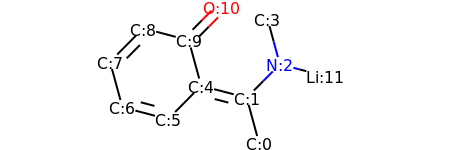

HETATM    1  C1  UNL     1       1.526  -2.304   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.132  -0.857   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       2.187   0.208   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       1.793   1.655   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -0.319  -0.476   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.375  -1.541   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -2.825  -1.160   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -3.220   0.287   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -2.165   1.353   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -0.714   0.971   0.000  1.00  0.00           C  
HETATM   11  O1  UNL     1       0.342   2.037   0.000  1.00  0.00           O  
HETATM   12 LI1  UNL     1       3.638  -0.173   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2

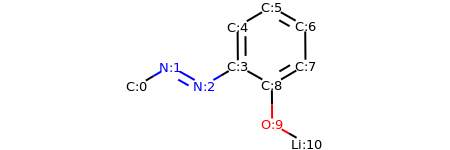

HETATM    1  C1  UNL     1      -4.247  -0.579   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1      -2.954   0.182   0.000  1.00  0.00           N  
HETATM    3  N2  UNL     1      -1.649  -0.558   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.356   0.202   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -0.368   1.702   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.926   2.462   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.230   1.722   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.242   0.222   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.949  -0.538   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1       0.961  -2.038   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1       2.266  -2.778   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6
CONECT   

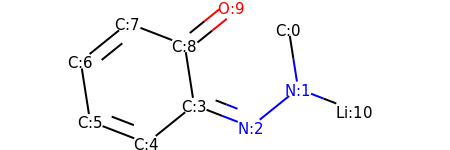

HETATM    1  C1  UNL     1       2.080   1.223   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       2.312  -0.259   0.000  1.00  0.00           N  
HETATM    3  N2  UNL     1       1.144  -1.201   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.255  -0.661   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.423  -1.603   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -2.822  -1.063   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -3.054   0.419   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -1.886   1.361   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1      -0.487   0.821   0.000  1.00  0.00           C  
HETATM   10  O1  UNL     1       0.680   1.763   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1       3.711  -0.800   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3   11
CONECT    3    4    4
CONECT    4    5    9
CONECT    5    6    6
CONE

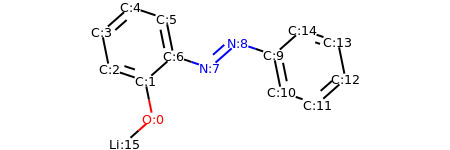

HETATM    1  O1  UNL     1      -2.389  -2.110   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.687  -0.640   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -4.109  -0.163   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -4.407   1.307   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -3.283   2.300   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.861   1.823   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -1.563   0.353   0.000  1.00  0.00           C  
HETATM    8  N1  UNL     1      -0.141  -0.124   0.000  1.00  0.00           N  
HETATM    9  N2  UNL     1       0.984   0.869   0.000  1.00  0.00           N  
HETATM   10  C7  UNL     1       2.406   0.392   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       2.704  -1.078   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       4.126  -1.555   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

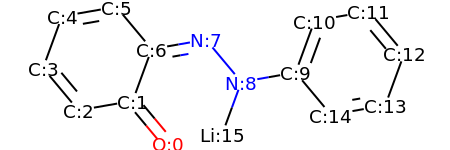

HETATM    1  O1  UNL     1      -1.416  -1.977   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.378  -0.826   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -3.856  -1.084   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -4.817   0.067   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1      -4.302   1.476   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -2.824   1.733   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -1.862   0.582   0.000  1.00  0.00           C  
HETATM    8  N1  UNL     1      -0.384   0.840   0.000  1.00  0.00           N  
HETATM    9  N2  UNL     1       0.578  -0.311   0.000  1.00  0.00           N  
HETATM   10  C7  UNL     1       2.055  -0.054   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       2.571   1.355   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       4.049   1.612   0.000  1.00  0.00           C  
HETATM   13  C10 UNL     1  

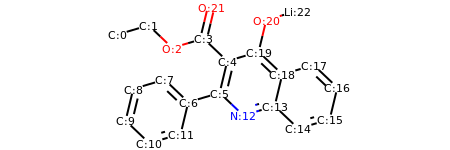

HETATM    1  C1  UNL     1      -4.884   1.913   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -3.446   2.338   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -2.358   1.305   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -0.920   1.731   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.168   0.697   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -0.183  -0.761   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -1.621  -1.186   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -2.709  -0.153   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -4.147  -0.579   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -4.498  -2.037   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -3.411  -3.070   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -1.972  -2.645   0.000  1.00  0.00           C  
HETATM   13  N1  UNL     1  

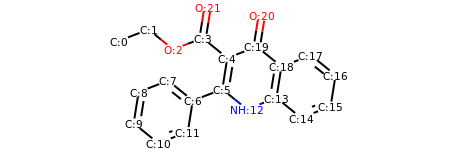

HETATM    1  C1  UNL     1      -4.876   1.671   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -3.476   2.208   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -2.310   1.264   0.000  1.00  0.00           O  
HETATM    4  C3  UNL     1      -0.910   1.801   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.256   0.857   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       0.020  -0.625   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -1.380  -1.162   0.000  1.00  0.00           C  
HETATM    8  C7  UNL     1      -2.546  -0.217   0.000  1.00  0.00           C  
HETATM    9  C8  UNL     1      -3.946  -0.754   0.000  1.00  0.00           C  
HETATM   10  C9  UNL     1      -4.181  -2.236   0.000  1.00  0.00           C  
HETATM   11  C10 UNL     1      -3.016  -3.180   0.000  1.00  0.00           C  
HETATM   12  C11 UNL     1      -1.615  -2.643   0.000  1.00  0.00           C  
HETATM   13  N1  UNL     1  

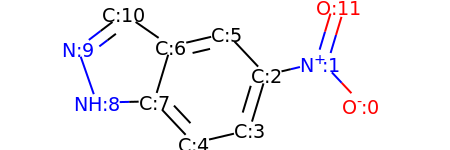

HETATM    1  O1  UNL     1       3.819  -0.823   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1       2.791   0.269   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1       1.331  -0.074   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1       0.899  -1.511   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -0.561  -1.854   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.304   1.018   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -1.157   0.675   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -1.589  -0.762   0.000  1.00  0.00           C  
HETATM    9  N2  UNL     1      -3.089  -0.794   0.000  1.00  0.00           N  
HETATM   10  N3  UNL     1      -3.583   0.622   0.000  1.00  0.00           N  
HETATM   11  C7  UNL     1      -2.389   1.530   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1       3.224   1.706   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2

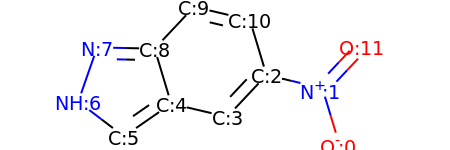

HETATM    1  O1  UNL     1       3.224  -1.706   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1       2.791  -0.269   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1       1.331   0.074   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1       0.304  -1.018   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.157  -0.675   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -2.389  -1.530   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1      -3.583  -0.622   0.000  1.00  0.00           N  
HETATM    8  N3  UNL     1      -3.089   0.794   0.000  1.00  0.00           N  
HETATM    9  C5  UNL     1      -1.589   0.762   0.000  1.00  0.00           C  
HETATM   10  C6  UNL     1      -0.561   1.854   0.000  1.00  0.00           C  
HETATM   11  C7  UNL     1       0.899   1.511   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1       3.819   0.823   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2

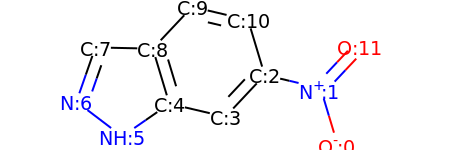

HETATM    1  O1  UNL     1       3.224  -1.706   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1       2.791  -0.269   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1       1.331   0.074   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1       0.304  -1.018   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.157  -0.675   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -2.389  -1.530   0.000  1.00  0.00           N  
HETATM    7  N3  UNL     1      -3.583  -0.622   0.000  1.00  0.00           N  
HETATM    8  C4  UNL     1      -3.089   0.794   0.000  1.00  0.00           C  
HETATM    9  C5  UNL     1      -1.589   0.762   0.000  1.00  0.00           C  
HETATM   10  C6  UNL     1      -0.561   1.854   0.000  1.00  0.00           C  
HETATM   11  C7  UNL     1       0.899   1.511   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1       3.819   0.823   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2

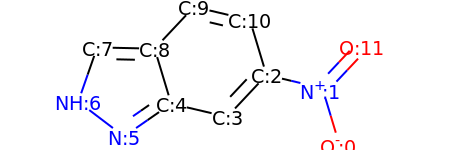

HETATM    1  O1  UNL     1       3.224  -1.706   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1       2.791  -0.269   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1       1.331   0.074   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1       0.304  -1.018   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.157  -0.675   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -2.389  -1.530   0.000  1.00  0.00           N  
HETATM    7  N3  UNL     1      -3.583  -0.622   0.000  1.00  0.00           N  
HETATM    8  C4  UNL     1      -3.089   0.794   0.000  1.00  0.00           C  
HETATM    9  C5  UNL     1      -1.589   0.762   0.000  1.00  0.00           C  
HETATM   10  C6  UNL     1      -0.561   1.854   0.000  1.00  0.00           C  
HETATM   11  C7  UNL     1       0.899   1.511   0.000  1.00  0.00           C  
HETATM   12  O2  UNL     1       3.819   0.823   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2

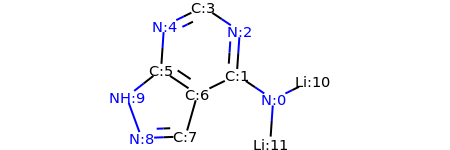

HETATM    1  N1  UNL     1       2.185  -0.558   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.940   0.278   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       1.042   1.775   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.204   2.611   0.000  1.00  0.00           C  
HETATM    5  N3  UNL     1      -1.551   1.951   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -1.652   0.454   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1      -0.407  -0.382   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1      -0.818  -1.825   0.000  1.00  0.00           C  
HETATM    9  N4  UNL     1      -2.317  -1.880   0.000  1.00  0.00           N  
HETATM   10  N5  UNL     1      -2.833  -0.471   0.000  1.00  0.00           N  
HETATM   11 LI1  UNL     1       3.532   0.102   0.000  1.00  0.00          LI  
HETATM   12 LI2  UNL     1       2.083  -2.055   0.000  1.00  0.00          LI  
CONECT    1    2   11   12
C

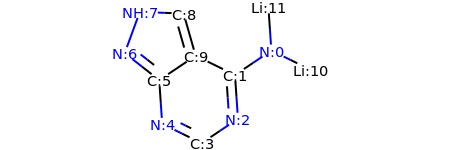

HETATM    1  N1  UNL     1       2.185   0.558   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.940  -0.278   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       1.042  -1.775   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.204  -2.611   0.000  1.00  0.00           C  
HETATM    5  N3  UNL     1      -1.551  -1.951   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -1.652  -0.454   0.000  1.00  0.00           C  
HETATM    7  N4  UNL     1      -2.833   0.471   0.000  1.00  0.00           N  
HETATM    8  N5  UNL     1      -2.317   1.880   0.000  1.00  0.00           N  
HETATM    9  C4  UNL     1      -0.818   1.825   0.000  1.00  0.00           C  
HETATM   10  C5  UNL     1      -0.407   0.382   0.000  1.00  0.00           C  
HETATM   11 LI1  UNL     1       3.532  -0.102   0.000  1.00  0.00          LI  
HETATM   12 LI2  UNL     1       2.083   2.055   0.000  1.00  0.00          LI  
CONECT    1    2   11   12
C

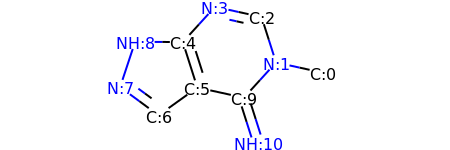

HETATM    1  C1  UNL     1       3.366  -0.074   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       1.901   0.247   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       1.446   1.677   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -0.019   1.997   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -1.030   0.889   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -0.575  -0.541   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -1.794  -1.415   0.000  1.00  0.00           C  
HETATM    8  N3  UNL     1      -3.002  -0.526   0.000  1.00  0.00           N  
HETATM    9  N4  UNL     1      -2.530   0.898   0.000  1.00  0.00           N  
HETATM   10  C6  UNL     1       0.890  -0.861   0.000  1.00  0.00           C  
HETATM   11  N5  UNL     1       1.345  -2.291   0.000  1.00  0.00           N  
CONECT    1    2
CONECT    2    3   10
CONECT    3    4    4
CONECT    4    5
CONECT    5    6    6    9
CONE

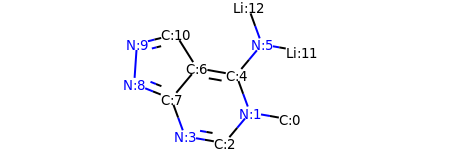

HETATM    1  C1  UNL     1       2.744  -1.543   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       1.267  -1.285   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       0.304  -2.436   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -1.173  -2.177   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.751   0.124   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1       1.714   1.274   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1      -0.726   0.382   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1      -1.689  -0.769   0.000  1.00  0.00           C  
HETATM    9  N4  UNL     1      -3.080  -0.209   0.000  1.00  0.00           N  
HETATM   10  N5  UNL     1      -2.978   1.287   0.000  1.00  0.00           N  
HETATM   11  C6  UNL     1      -1.523   1.653   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1       3.191   1.016   0.000  1.00  0.00          LI  
HETATM   13 LI2  UNL     1  

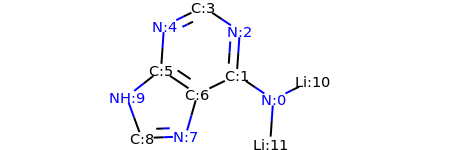

HETATM    1  N1  UNL     1       2.185  -0.558   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.940   0.278   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       1.042   1.775   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.204   2.611   0.000  1.00  0.00           C  
HETATM    5  N3  UNL     1      -1.551   1.951   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -1.652   0.454   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1      -0.407  -0.382   0.000  1.00  0.00           C  
HETATM    8  N4  UNL     1      -0.818  -1.825   0.000  1.00  0.00           N  
HETATM    9  C5  UNL     1      -2.317  -1.880   0.000  1.00  0.00           C  
HETATM   10  N5  UNL     1      -2.833  -0.471   0.000  1.00  0.00           N  
HETATM   11 LI1  UNL     1       3.532   0.102   0.000  1.00  0.00          LI  
HETATM   12 LI2  UNL     1       2.083  -2.055   0.000  1.00  0.00          LI  
CONECT    1    2   11   12
C

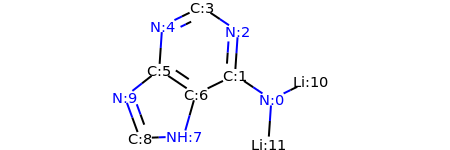

HETATM    1  N1  UNL     1       2.185  -0.558   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.940   0.278   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1       1.042   1.775   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -0.204   2.611   0.000  1.00  0.00           C  
HETATM    5  N3  UNL     1      -1.551   1.951   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -1.652   0.454   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1      -0.407  -0.382   0.000  1.00  0.00           C  
HETATM    8  N4  UNL     1      -0.818  -1.825   0.000  1.00  0.00           N  
HETATM    9  C5  UNL     1      -2.317  -1.880   0.000  1.00  0.00           C  
HETATM   10  N5  UNL     1      -2.833  -0.471   0.000  1.00  0.00           N  
HETATM   11 LI1  UNL     1       3.532   0.102   0.000  1.00  0.00          LI  
HETATM   12 LI2  UNL     1       2.083  -2.055   0.000  1.00  0.00          LI  
CONECT    1    2   11   12
C

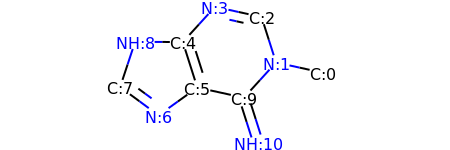

HETATM    1  C1  UNL     1       3.366  -0.074   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       1.901   0.247   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       1.446   1.677   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -0.019   1.997   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -1.030   0.889   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -0.575  -0.541   0.000  1.00  0.00           C  
HETATM    7  N3  UNL     1      -1.794  -1.415   0.000  1.00  0.00           N  
HETATM    8  C5  UNL     1      -3.002  -0.526   0.000  1.00  0.00           C  
HETATM    9  N4  UNL     1      -2.530   0.898   0.000  1.00  0.00           N  
HETATM   10  C6  UNL     1       0.890  -0.861   0.000  1.00  0.00           C  
HETATM   11  N5  UNL     1       1.345  -2.291   0.000  1.00  0.00           N  
CONECT    1    2
CONECT    2    3   10
CONECT    3    4    4
CONECT    4    5
CONECT    5    6    6    9
CONE

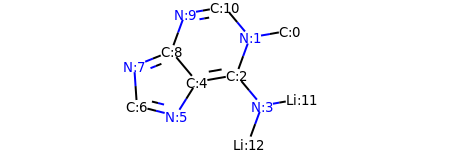

HETATM    1  C1  UNL     1       2.744   1.543   0.000  1.00  0.00           C  
HETATM    2  N1  UNL     1       1.267   1.285   0.000  1.00  0.00           N  
HETATM    3  C2  UNL     1       0.751  -0.124   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1       1.714  -1.274   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -0.726  -0.382   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -1.523  -1.653   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1      -2.978  -1.287   0.000  1.00  0.00           C  
HETATM    8  N4  UNL     1      -3.080   0.209   0.000  1.00  0.00           N  
HETATM    9  C5  UNL     1      -1.689   0.769   0.000  1.00  0.00           C  
HETATM   10  N5  UNL     1      -1.173   2.177   0.000  1.00  0.00           N  
HETATM   11  C6  UNL     1       0.304   2.436   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1       3.191  -1.016   0.000  1.00  0.00          LI  
HETATM   13 LI2  UNL     1  

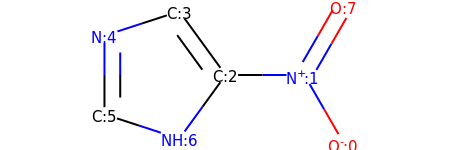

HETATM    1  O1  UNL     1       2.297  -1.299   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1       1.547   0.000   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1       0.047   0.000   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1      -0.834   1.214   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -2.261   0.750   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -2.261  -0.750   0.000  1.00  0.00           C  
HETATM    7  N3  UNL     1      -0.834  -1.214   0.000  1.00  0.00           N  
HETATM    8  O2  UNL     1       2.297   1.299   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    8    8
CONECT    3    4    4    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
END

search for patterns ...


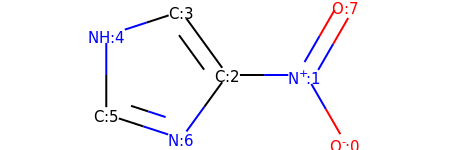

HETATM    1  O1  UNL     1       2.297  -1.299   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1       1.547   0.000   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1       0.047   0.000   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1      -0.834   1.214   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1      -2.261   0.750   0.000  1.00  0.00           N  
HETATM    6  C3  UNL     1      -2.261  -0.750   0.000  1.00  0.00           C  
HETATM    7  N3  UNL     1      -0.834  -1.214   0.000  1.00  0.00           N  
HETATM    8  O2  UNL     1       2.297   1.299   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    8    8
CONECT    3    4    4    7
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...


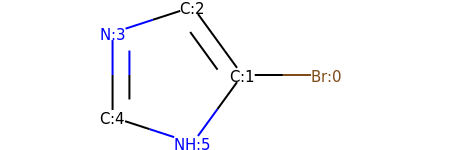

HETATM    1 BR1  UNL     1       2.313  -0.000   0.000  1.00  0.00          BR  
HETATM    2  C1  UNL     1       0.813  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.068   1.214   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.495   0.750   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -1.495  -0.750   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -0.068  -1.214   0.000  1.00  0.00           N  
CONECT    1    2
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
END

search for patterns ...


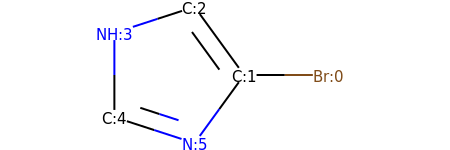

HETATM    1 BR1  UNL     1       2.313  -0.000   0.000  1.00  0.00          BR  
HETATM    2  C1  UNL     1       0.813  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.068   1.214   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.495   0.750   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -1.495  -0.750   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -0.068  -1.214   0.000  1.00  0.00           N  
CONECT    1    2
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6    6
END

#################
#################
search for patterns ...


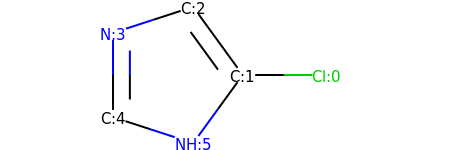

HETATM    1 CL1  UNL     1       2.313  -0.000   0.000  1.00  0.00          CL  
HETATM    2  C1  UNL     1       0.813  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.068   1.214   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.495   0.750   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -1.495  -0.750   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -0.068  -1.214   0.000  1.00  0.00           N  
CONECT    1    2
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
END

search for patterns ...


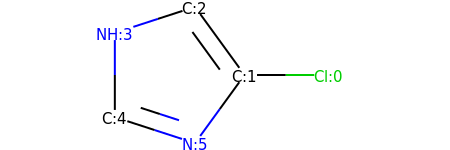

HETATM    1 CL1  UNL     1       2.313  -0.000   0.000  1.00  0.00          CL  
HETATM    2  C1  UNL     1       0.813  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.068   1.214   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1      -1.495   0.750   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -1.495  -0.750   0.000  1.00  0.00           C  
HETATM    6  N2  UNL     1      -0.068  -1.214   0.000  1.00  0.00           N  
CONECT    1    2
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6    6
END

#################
#################
search for patterns ...


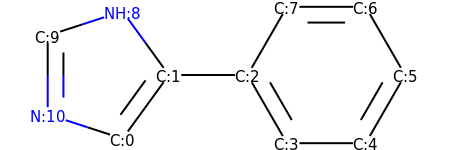

HETATM    1  C1  UNL     1      -1.938  -1.214   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.056  -0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.444   0.000   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       1.194  -1.299   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       2.694  -1.299   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       3.444   0.000   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1       2.694   1.299   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1       1.194   1.299   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -1.938   1.214   0.000  1.00  0.00           N  
HETATM   10  C9  UNL     1      -3.365   0.750   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -3.365  -0.750   0.000  1.00  0.00           N  
CONECT    1    2    2   11
CONECT    2    3    9
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6

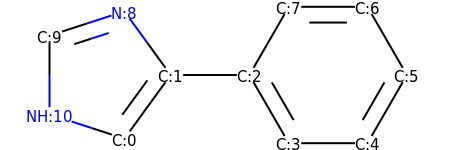

HETATM    1  C1  UNL     1      -1.938  -1.214   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.056  -0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.444   0.000   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       1.194  -1.299   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       2.694  -1.299   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       3.444   0.000   0.000  1.00  0.00           C  
HETATM    7  C7  UNL     1       2.694   1.299   0.000  1.00  0.00           C  
HETATM    8  C8  UNL     1       1.194   1.299   0.000  1.00  0.00           C  
HETATM    9  N1  UNL     1      -1.938   1.214   0.000  1.00  0.00           N  
HETATM   10  C9  UNL     1      -3.365   0.750   0.000  1.00  0.00           C  
HETATM   11  N2  UNL     1      -3.365  -0.750   0.000  1.00  0.00           N  
CONECT    1    2    2   11
CONECT    2    3    9
CONECT    3    4    4    8
CONECT    4    5
CONECT    5    6

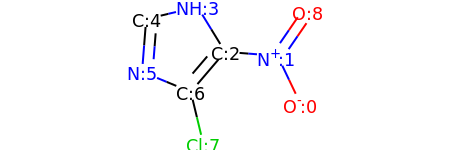

HETATM    1  O1  UNL     1       2.253  -1.185   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1       1.607   0.169   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1       0.111   0.286   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -0.673   1.564   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -2.131   1.213   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -2.248  -0.282   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1      -0.862  -0.856   0.000  1.00  0.00           C  
HETATM    8 CL1  UNL     1      -0.512  -2.314   0.000  1.00  0.00          CL  
HETATM    9  O2  UNL     1       2.456   1.405   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    9    9
CONECT    3    4    7    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8
END

search for patterns ...


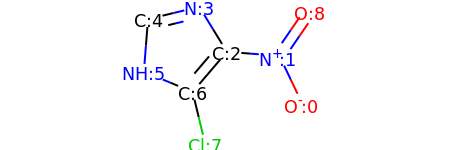

HETATM    1  O1  UNL     1       2.253  -1.185   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1       1.607   0.169   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1       0.111   0.286   0.000  1.00  0.00           C  
HETATM    4  N2  UNL     1      -0.673   1.564   0.000  1.00  0.00           N  
HETATM    5  C2  UNL     1      -2.131   1.213   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -2.248  -0.282   0.000  1.00  0.00           N  
HETATM    7  C3  UNL     1      -0.862  -0.856   0.000  1.00  0.00           C  
HETATM    8 CL1  UNL     1      -0.512  -2.314   0.000  1.00  0.00          CL  
HETATM    9  O2  UNL     1       2.456   1.405   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    9    9
CONECT    3    4    7    7
CONECT    4    5    5
CONECT    5    6
CONECT    6    7
CONECT    7    8
END

#################
#################
search for patterns ...


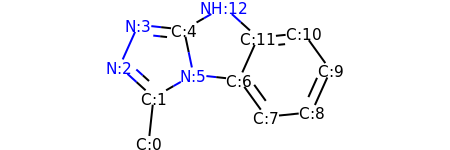

HETATM    1  C1  UNL     1      -2.356  -2.432   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.195  -0.941   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -3.306   0.066   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -2.692   1.435   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -1.200   1.273   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1      -0.893  -0.195   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       0.598  -0.356   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       1.476  -1.573   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       2.968  -1.421   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       3.583  -0.052   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       2.705   1.164   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       1.212   1.012   0.000  1.00  0.00           C  
HETATM   13  N4  UNL     1  

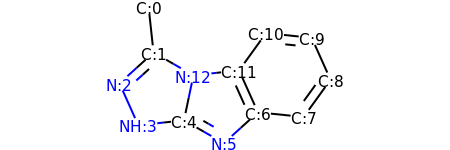

HETATM    1  C1  UNL     1      -2.356   2.432   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -2.195   0.941   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -3.306  -0.066   0.000  1.00  0.00           N  
HETATM    4  N2  UNL     1      -2.692  -1.435   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -1.200  -1.273   0.000  1.00  0.00           C  
HETATM    6  N3  UNL     1       0.101  -2.019   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.212  -1.012   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       2.705  -1.164   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       3.583   0.052   0.000  1.00  0.00           C  
HETATM   10  C7  UNL     1       2.968   1.421   0.000  1.00  0.00           C  
HETATM   11  C8  UNL     1       1.476   1.573   0.000  1.00  0.00           C  
HETATM   12  C9  UNL     1       0.598   0.356   0.000  1.00  0.00           C  
HETATM   13  N4  UNL     1  

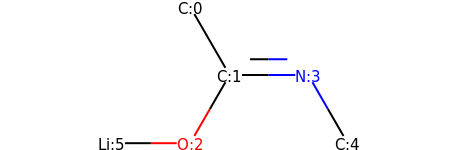

HETATM    1  C1  UNL     1      -0.750   1.732   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.000   0.433   0.000  1.00  0.00           C  
HETATM    3  O1  UNL     1      -0.750  -0.866   0.000  1.00  0.00           O  
HETATM    4  N1  UNL     1       1.500   0.433   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       2.250  -0.866   0.000  1.00  0.00           C  
HETATM    6 LI1  UNL     1      -2.250  -0.866   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    4    4
CONECT    3    6
CONECT    4    5
END

search for patterns ...
found secondary amine


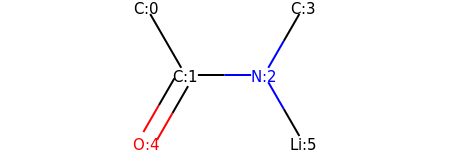

HETATM    1  C1  UNL     1      -1.500   1.299   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -0.750   0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.750  -0.000   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       1.500   1.299   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1      -1.500  -1.299   0.000  1.00  0.00           O  
HETATM    6 LI1  UNL     1       1.500  -1.299   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    5    5
CONECT    3    4    6
END

#################
#################
search for patterns ...
found primary alcohol


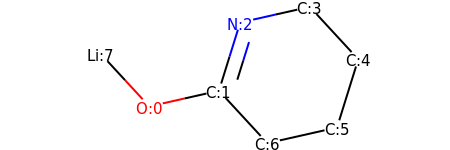

HETATM    1  O1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.159   1.129   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.305   1.459   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.322   0.357   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.876  -1.075   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.413  -1.405   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5
CONECT    5    6
CONECT    6    7
END

search for patterns ...
found secondary amine


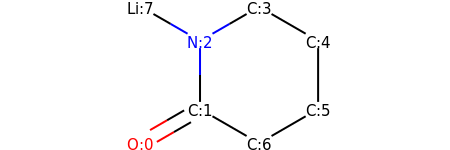

HETATM    1  O1  UNL     1      -1.949  -1.500   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.650  -0.750   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.650   0.750   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.650   1.500   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.949   0.750   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.949  -0.750   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.650  -1.500   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -1.949   1.500   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4    8
CONECT    4    5
CONECT    5    6
CONECT    6    7
END

#################
#################
search for patterns ...
found primary alcohol


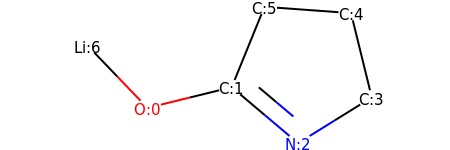

HETATM    1  O1  UNL     1      -1.777  -0.628   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.320  -0.270   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.826  -1.238   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       2.100  -0.447   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.742   1.010   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.246   1.119   0.000  1.00  0.00           C  
HETATM    7 LI1  UNL     1      -2.816   0.454   0.000  1.00  0.00          LI  
CONECT    1    2    7
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6
END

search for patterns ...
found secondary amine


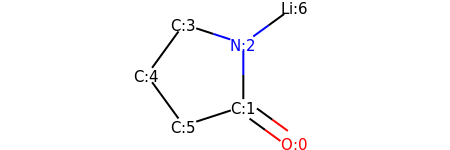

HETATM    1  O1  UNL     1       1.604  -1.632   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.391  -0.750   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.391   0.750   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.036   1.214   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.918   0.000   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -1.036  -1.214   0.000  1.00  0.00           C  
HETATM    7 LI1  UNL     1       1.604   1.632   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    7
CONECT    4    5
CONECT    5    6
END

#################
#################
search for patterns ...
found primary alcohol


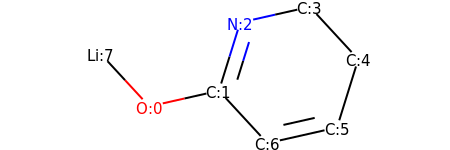

HETATM    1  O1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.159   1.129   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.305   1.459   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.322   0.357   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.876  -1.075   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.413  -1.405   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...
found secondary amine


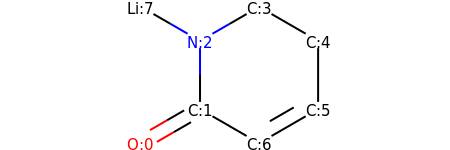

HETATM    1  O1  UNL     1      -1.949  -1.500   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.650  -0.750   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.650   0.750   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.650   1.500   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.949   0.750   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.949  -0.750   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.650  -1.500   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -1.949   1.500   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4    8
CONECT    4    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found primary alcohol


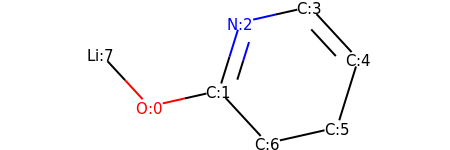

HETATM    1  O1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.159   1.129   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.305   1.459   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.322   0.357   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.876  -1.075   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.413  -1.405   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7
END

search for patterns ...
found secondary amine


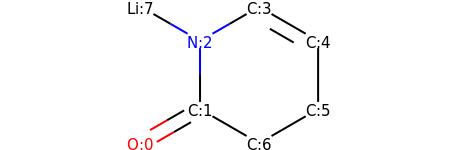

HETATM    1  O1  UNL     1      -1.949  -1.500   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.650  -0.750   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.650   0.750   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.650   1.500   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.949   0.750   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.949  -0.750   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.650  -1.500   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -1.949   1.500   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4    8
CONECT    4    5    5
CONECT    5    6
CONECT    6    7
END

#################
#################
search for patterns ...
found primary alcohol


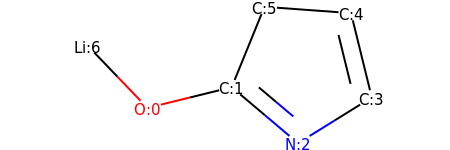

HETATM    1  O1  UNL     1      -1.777  -0.628   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.320  -0.270   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.826  -1.238   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       2.100  -0.447   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.742   1.010   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.246   1.119   0.000  1.00  0.00           C  
HETATM    7 LI1  UNL     1      -2.816   0.454   0.000  1.00  0.00          LI  
CONECT    1    2    7
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
END

search for patterns ...
found secondary amine


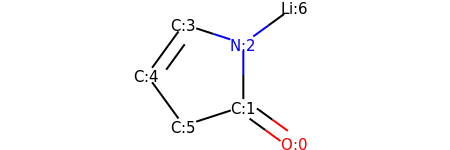

HETATM    1  O1  UNL     1       1.604  -1.632   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.391  -0.750   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.391   0.750   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.036   1.214   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.918   0.000   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -1.036  -1.214   0.000  1.00  0.00           C  
HETATM    7 LI1  UNL     1       1.604   1.632   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    7
CONECT    4    5    5
CONECT    5    6
END

#################
#################
search for patterns ...
found primary alcohol


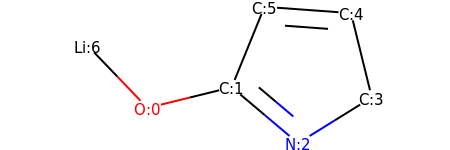

HETATM    1  O1  UNL     1      -1.777  -0.628   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.320  -0.270   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.826  -1.238   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       2.100  -0.447   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.742   1.010   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.246   1.119   0.000  1.00  0.00           C  
HETATM    7 LI1  UNL     1      -2.816   0.454   0.000  1.00  0.00          LI  
CONECT    1    2    7
CONECT    2    3    3    6
CONECT    3    4
CONECT    4    5
CONECT    5    6    6
END

search for patterns ...
found secondary amine


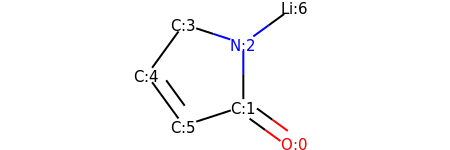

HETATM    1  O1  UNL     1       1.604  -1.632   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.391  -0.750   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.391   0.750   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.036   1.214   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.918   0.000   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -1.036  -1.214   0.000  1.00  0.00           C  
HETATM    7 LI1  UNL     1       1.604   1.632   0.000  1.00  0.00          LI  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    7
CONECT    4    5
CONECT    5    6    6
END

#################
#################
search for patterns ...
found primary alcohol


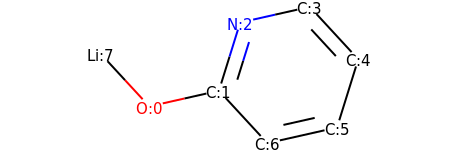

HETATM    1  O1  UNL     1      -2.068  -0.633   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.604  -0.303   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.159   1.129   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.305   1.459   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.322   0.357   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.876  -1.075   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.413  -1.405   0.000  1.00  0.00           C  
HETATM    8 LI1  UNL     1      -3.085   0.470   0.000  1.00  0.00          LI  
CONECT    1    2    8
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

search for patterns ...


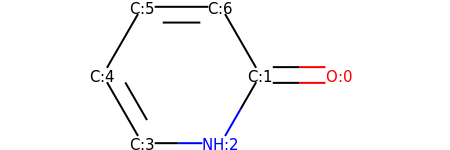

HETATM    1  O1  UNL     1       2.571   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.071  -0.000   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.321  -1.299   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.179  -1.299   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.929   0.000   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -1.179   1.299   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.321   1.299   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
END

#################
#################
search for patterns ...
found primary alcohol


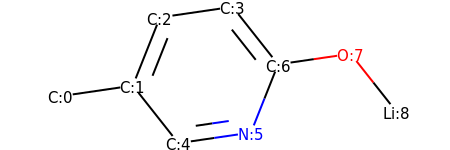

HETATM    1  C1  UNL     1      -3.402  -0.351   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.917  -0.134   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -1.363   1.260   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1       0.121   1.476   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1      -0.987  -1.311   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       0.497  -1.094   0.000  1.00  0.00           N  
HETATM    7  C6  UNL     1       1.051   0.299   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.535   0.516   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1       3.465  -0.661   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    5
CONECT    3    4
CONECT    4    7    7
CONECT    5    6    6
CONECT    6    7
CONECT    7    8
CONECT    8    9
END

search for patterns ...


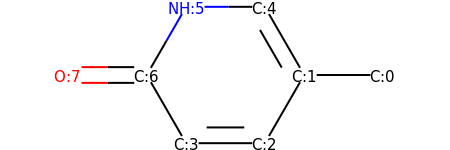

HETATM    1  C1  UNL     1       3.000   0.000   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.500  -0.000   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1       0.750  -1.299   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -0.750  -1.299   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       0.750   1.299   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1      -0.750   1.299   0.000  1.00  0.00           N  
HETATM    7  C6  UNL     1      -1.500   0.000   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -3.000   0.000   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    5    5
CONECT    3    4    4
CONECT    4    7
CONECT    5    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


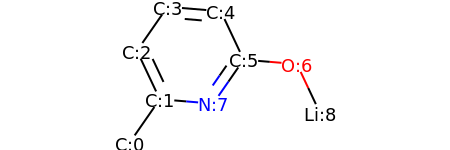

HETATM    1  C1  UNL     1      -2.256  -1.985   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1      -1.401  -0.752   0.000  1.00  0.00           C  
HETATM    3  C3  UNL     1      -2.040   0.604   0.000  1.00  0.00           C  
HETATM    4  C4  UNL     1      -1.185   1.837   0.000  1.00  0.00           C  
HETATM    5  C5  UNL     1       0.310   1.712   0.000  1.00  0.00           C  
HETATM    6  C6  UNL     1       0.949   0.355   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1       2.444   0.231   0.000  1.00  0.00           O  
HETATM    8  N1  UNL     1       0.094  -0.877   0.000  1.00  0.00           N  
HETATM    9 LI1  UNL     1       3.084  -1.126   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    8    8
CONECT    7    9
END

search for patterns ...


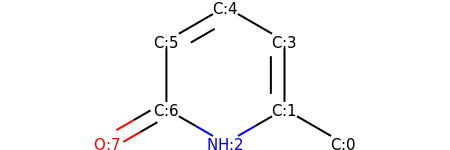

HETATM    1  C1  UNL     1       2.598  -1.125   0.000  1.00  0.00           C  
HETATM    2  C2  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.000  -1.125   0.000  1.00  0.00           N  
HETATM    4  C3  UNL     1       1.299   1.125   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       0.000   1.875   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1      -1.299   1.125   0.000  1.00  0.00           C  
HETATM    7  C6  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3    4    4
CONECT    3    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


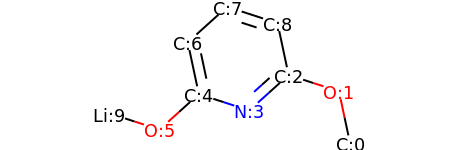

HETATM    1  C1  UNL     1       3.152  -1.706   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1       2.840  -0.239   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1       1.413   0.224   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       0.299  -0.780   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1      -1.128  -0.317   0.000  1.00  0.00           C  
HETATM    6  O2  UNL     1      -2.242  -1.321   0.000  1.00  0.00           O  
HETATM    7  C4  UNL     1      -1.440   1.150   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1      -0.326   2.154   0.000  1.00  0.00           C  
HETATM    9  C6  UNL     1       1.101   1.691   0.000  1.00  0.00           C  
HETATM   10 LI1  UNL     1      -3.669  -0.858   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3
CONECT    3    4    4    9
CONECT    4    5
CONECT    5    6    7    7
CONECT    6   10
CONECT    7    8
CONECT    8    9    9
END

search for patterns ...


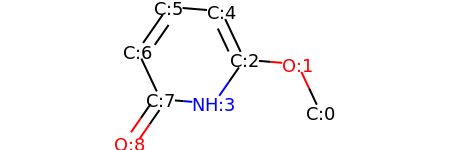

HETATM    1  C1  UNL     1       3.084  -1.126   0.000  1.00  0.00           C  
HETATM    2  O1  UNL     1       2.444   0.231   0.000  1.00  0.00           O  
HETATM    3  C2  UNL     1       0.949   0.355   0.000  1.00  0.00           C  
HETATM    4  N1  UNL     1       0.094  -0.877   0.000  1.00  0.00           N  
HETATM    5  C3  UNL     1       0.310   1.712   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -1.185   1.837   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -2.040   0.604   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1      -1.401  -0.752   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1      -2.256  -1.985   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3
CONECT    3    4    5    5
CONECT    4    8
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
CONECT    8    9    9
END

#################
#################
search for patterns ...
found primary alcohol


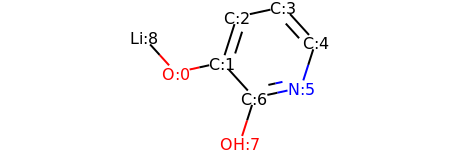

HETATM    1  O1  UNL     1      -2.067  -0.301   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.601   0.017   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.143   1.446   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.322   1.764   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.331   0.654   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       1.874  -0.775   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1       0.408  -1.093   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1      -0.049  -2.522   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.075   0.809   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
END

search for patterns ...
found primary alcohol


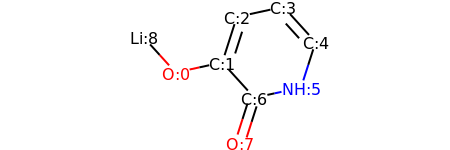

HETATM    1  O1  UNL     1      -2.067  -0.301   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.601   0.017   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.143   1.446   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.322   1.764   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       2.331   0.654   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1       1.874  -0.775   0.000  1.00  0.00           N  
HETATM    7  C5  UNL     1       0.408  -1.093   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1      -0.049  -2.522   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.075   0.809   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


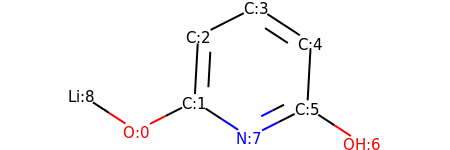

HETATM    1  O1  UNL     1      -2.221  -0.963   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.883  -0.285   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.801   1.213   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.538   1.890   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.794   1.070   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.711  -0.428   0.000  1.00  0.00           C  
HETATM    7  O2  UNL     1       2.967  -1.248   0.000  1.00  0.00           O  
HETATM    8  N1  UNL     1       0.373  -1.106   0.000  1.00  0.00           N  
HETATM    9 LI1  UNL     1      -3.477  -0.142   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    8    8
END

search for patterns ...
found primary alcohol


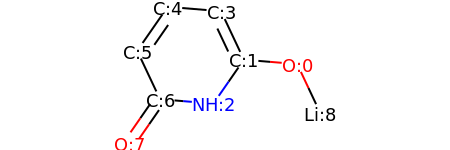

HETATM    1  O1  UNL     1       2.444   0.231   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       0.949   0.355   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1       0.094  -0.877   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.310   1.712   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.185   1.837   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -2.040   0.604   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -1.401  -0.752   0.000  1.00  0.00           C  
HETATM    8  O2  UNL     1      -2.256  -1.985   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1       3.084  -1.126   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    4    4
CONECT    3    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


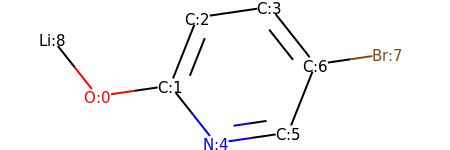

HETATM    1  O1  UNL     1      -2.535  -0.516   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.051  -0.299   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.497   1.094   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.987   1.311   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.121  -1.476   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.363  -1.260   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.917   0.134   0.000  1.00  0.00           C  
HETATM    8 BR1  UNL     1       3.402   0.351   0.000  1.00  0.00          BR  
HETATM    9 LI1  UNL     1      -3.465   0.661   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    3    5
CONECT    3    4
CONECT    4    7    7
CONECT    5    6    6
CONECT    6    7
CONECT    7    8
END

search for patterns ...


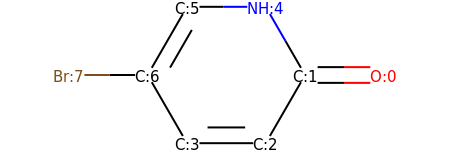

HETATM    1  O1  UNL     1       3.000   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.500  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.750  -1.299   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.750  -1.299   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.750   1.299   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -0.750   1.299   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -1.500   0.000   0.000  1.00  0.00           C  
HETATM    8 BR1  UNL     1      -3.000   0.000   0.000  1.00  0.00          BR  
CONECT    1    2    2
CONECT    2    3    5
CONECT    3    4    4
CONECT    4    7
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
END

#################
#################
search for patterns ...
found primary alcohol


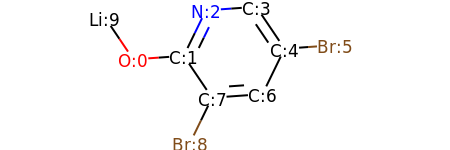

HETATM    1  O1  UNL     1      -2.478  -0.045   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.982   0.061   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.325   1.409   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.171   1.515   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.011   0.273   0.000  1.00  0.00           C  
HETATM    6 BR1  UNL     1       3.507   0.378   0.000  1.00  0.00          BR  
HETATM    7  C4  UNL     1       1.354  -1.076   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1      -0.142  -1.182   0.000  1.00  0.00           C  
HETATM    9 BR2  UNL     1      -0.798  -2.531   0.000  1.00  0.00          BR  
HETATM   10 LI1  UNL     1      -3.318   1.198   0.000  1.00  0.00          LI  
CONECT    1    2   10
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6    7
CONECT    7    8    8
CONECT    8    9
END

search for patterns ...


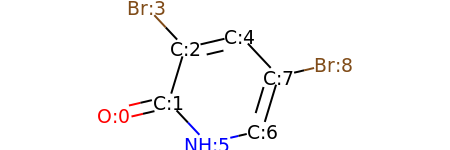

HETATM    1  O1  UNL     1      -2.693  -0.926   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.233  -0.585   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.798   0.851   0.000  1.00  0.00           C  
HETATM    4 BR1  UNL     1      -1.824   1.945   0.000  1.00  0.00          BR  
HETATM    5  C3  UNL     1       0.662   1.193   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1      -0.206  -1.679   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.254  -1.337   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       1.689   0.098   0.000  1.00  0.00           C  
HETATM    9 BR2  UNL     1       3.149   0.440   0.000  1.00  0.00          BR  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    5    5
CONECT    5    8
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
END

#################
#################
search for patterns ...
found primary alcohol


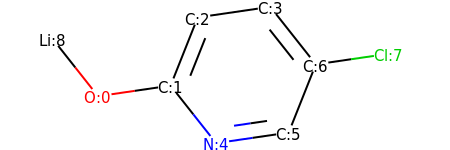

HETATM    1  O1  UNL     1      -2.535  -0.516   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.051  -0.299   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.497   1.094   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.987   1.311   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1      -0.121  -1.476   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       1.363  -1.260   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.917   0.134   0.000  1.00  0.00           C  
HETATM    8 CL1  UNL     1       3.402   0.351   0.000  1.00  0.00          CL  
HETATM    9 LI1  UNL     1      -3.465   0.661   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    3    5
CONECT    3    4
CONECT    4    7    7
CONECT    5    6    6
CONECT    6    7
CONECT    7    8
END

search for patterns ...


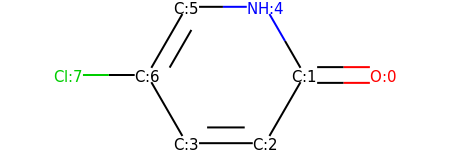

HETATM    1  O1  UNL     1       3.000   0.000   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.500  -0.000   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1       0.750  -1.299   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -0.750  -1.299   0.000  1.00  0.00           C  
HETATM    5  N1  UNL     1       0.750   1.299   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1      -0.750   1.299   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -1.500   0.000   0.000  1.00  0.00           C  
HETATM    8 CL1  UNL     1      -3.000   0.000   0.000  1.00  0.00          CL  
CONECT    1    2    2
CONECT    2    3    5
CONECT    3    4    4
CONECT    4    7
CONECT    5    6
CONECT    6    7    7
CONECT    7    8
END

#################
#################
search for patterns ...
found primary alcohol


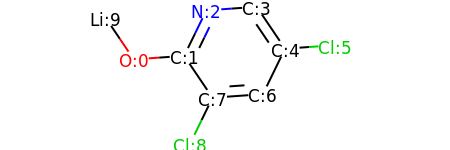

HETATM    1  O1  UNL     1      -2.478  -0.045   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.982   0.061   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.325   1.409   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       1.171   1.515   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       2.011   0.273   0.000  1.00  0.00           C  
HETATM    6 CL1  UNL     1       3.507   0.378   0.000  1.00  0.00          CL  
HETATM    7  C4  UNL     1       1.354  -1.076   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1      -0.142  -1.182   0.000  1.00  0.00           C  
HETATM    9 CL2  UNL     1      -0.798  -2.531   0.000  1.00  0.00          CL  
HETATM   10 LI1  UNL     1      -3.318   1.198   0.000  1.00  0.00          LI  
CONECT    1    2   10
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6    7
CONECT    7    8    8
CONECT    8    9
END

search for patterns ...


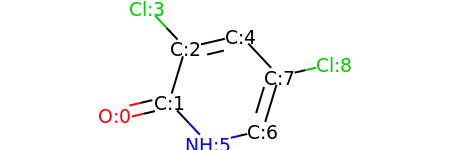

HETATM    1  O1  UNL     1      -2.693  -0.926   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.233  -0.585   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.798   0.851   0.000  1.00  0.00           C  
HETATM    4 CL1  UNL     1      -1.824   1.945   0.000  1.00  0.00          CL  
HETATM    5  C3  UNL     1       0.662   1.193   0.000  1.00  0.00           C  
HETATM    6  N1  UNL     1      -0.206  -1.679   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1       1.254  -1.337   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       1.689   0.098   0.000  1.00  0.00           C  
HETATM    9 CL2  UNL     1       3.149   0.440   0.000  1.00  0.00          CL  
CONECT    1    2    2
CONECT    2    3    6
CONECT    3    4    5    5
CONECT    5    8
CONECT    6    7
CONECT    7    8    8
CONECT    8    9
END

#################
#################
search for patterns ...
found primary alcohol


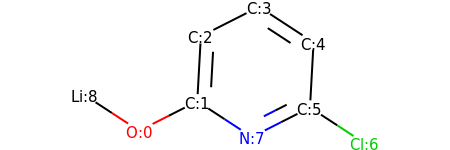

HETATM    1  O1  UNL     1      -2.221  -0.963   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.883  -0.285   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.801   1.213   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.538   1.890   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.794   1.070   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.711  -0.428   0.000  1.00  0.00           C  
HETATM    7 CL1  UNL     1       2.967  -1.248   0.000  1.00  0.00          CL  
HETATM    8  N1  UNL     1       0.373  -1.106   0.000  1.00  0.00           N  
HETATM    9 LI1  UNL     1      -3.477  -0.142   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    8    8
END

search for patterns ...


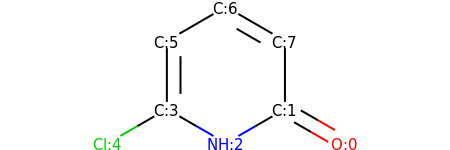

HETATM    1  O1  UNL     1       2.598  -1.125   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.000  -1.125   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    5 CL1  UNL     1      -2.598  -1.125   0.000  1.00  0.00          CL  
HETATM    6  C3  UNL     1      -1.299   1.125   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1      -0.000   1.875   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       1.299   1.125   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    8
CONECT    3    4
CONECT    4    5    6    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


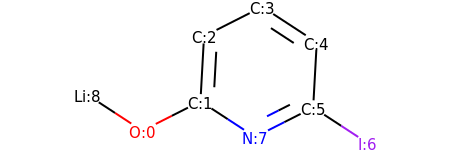

HETATM    1  O1  UNL     1      -2.221  -0.963   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -0.883  -0.285   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.801   1.213   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.538   1.890   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.794   1.070   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.711  -0.428   0.000  1.00  0.00           C  
HETATM    7  I1  UNL     1       2.967  -1.248   0.000  1.00  0.00           I  
HETATM    8  N1  UNL     1       0.373  -1.106   0.000  1.00  0.00           N  
HETATM    9 LI1  UNL     1      -3.477  -0.142   0.000  1.00  0.00          LI  
CONECT    1    2    9
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT    6    7    8    8
END

search for patterns ...


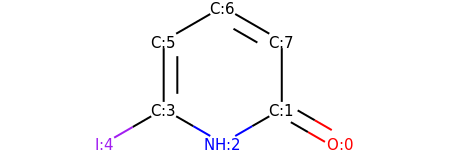

HETATM    1  O1  UNL     1       2.598  -1.125   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1       1.299  -0.375   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.000  -1.125   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.299  -0.375   0.000  1.00  0.00           C  
HETATM    5  I1  UNL     1      -2.598  -1.125   0.000  1.00  0.00           I  
HETATM    6  C3  UNL     1      -1.299   1.125   0.000  1.00  0.00           C  
HETATM    7  C4  UNL     1      -0.000   1.875   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       1.299   1.125   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    8
CONECT    3    4
CONECT    4    5    6    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################
search for patterns ...
found primary alcohol


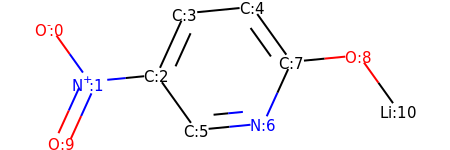

HETATM    1  O1  UNL     1      -3.530   1.080   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1      -2.658  -0.140   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1      -1.165   0.005   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1      -0.545   1.371   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.948   1.516   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -0.293  -1.215   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1       1.200  -1.070   0.000  1.00  0.00           N  
HETATM    8  C5  UNL     1       1.821   0.296   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1       3.314   0.442   0.000  1.00  0.00           O  
HETATM   10  O3  UNL     1      -3.278  -1.506   0.000  1.00  0.00           O  
HETATM   11 LI1  UNL     1       4.186  -0.778   0.000  1.00  0.00          LI  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4    4    6
CONECT    4    5
CONECT    5    8    8

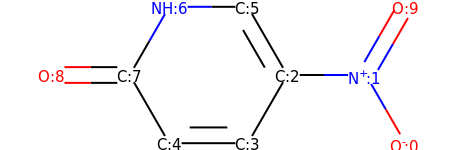

HETATM    1  O1  UNL     1       3.000  -1.299   0.000  1.00  0.00           O1-
HETATM    2  N1  UNL     1       2.250   0.000   0.000  1.00  0.00           N1+
HETATM    3  C1  UNL     1       0.750  -0.000   0.000  1.00  0.00           C  
HETATM    4  C2  UNL     1      -0.000  -1.299   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.500  -1.299   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.000   1.299   0.000  1.00  0.00           C  
HETATM    7  N2  UNL     1      -1.500   1.299   0.000  1.00  0.00           N  
HETATM    8  C5  UNL     1      -2.250   0.000   0.000  1.00  0.00           C  
HETATM    9  O2  UNL     1      -3.750   0.000   0.000  1.00  0.00           O  
HETATM   10  O3  UNL     1       3.000   1.299   0.000  1.00  0.00           O  
CONECT    1    2
CONECT    2    3   10   10
CONECT    3    4    6    6
CONECT    4    5    5
CONECT    5    8
CONECT    6    7
CONECT    7    8
CONECT    8    9    9
END

#################
#

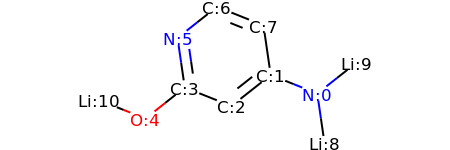

HETATM    1  N1  UNL     1       2.455  -0.469   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       1.062   0.086   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.116  -0.844   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1      -1.509  -0.289   0.000  1.00  0.00           C  
HETATM    5  O1  UNL     1      -2.687  -1.218   0.000  1.00  0.00           O  
HETATM    6  N2  UNL     1      -1.725   1.196   0.000  1.00  0.00           N  
HETATM    7  C4  UNL     1      -0.548   2.125   0.000  1.00  0.00           C  
HETATM    8  C5  UNL     1       0.846   1.570   0.000  1.00  0.00           C  
HETATM    9 LI1  UNL     1       2.671  -1.954   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1       3.633   0.460   0.000  1.00  0.00          LI  
HETATM   11 LI3  UNL     1      -4.080  -0.663   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    6    6
CONECT    5

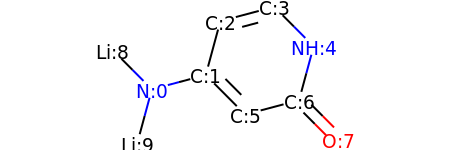

HETATM    1  N1  UNL     1      -2.096  -0.288   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.647   0.097   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.255   1.545   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       1.195   1.930   0.000  1.00  0.00           C  
HETATM    5  N2  UNL     1       2.253   0.867   0.000  1.00  0.00           N  
HETATM    6  C4  UNL     1       0.412  -0.966   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       1.861  -0.581   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1       2.920  -1.644   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1      -3.155   0.775   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1      -2.488  -1.736   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    6    6
CONECT    3    4    4
CONECT    4    5
CONECT    5    7
CONECT    6    7
CONECT    7    8    8
END

#################
#################


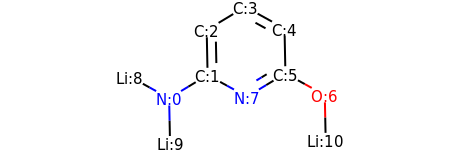

HETATM    1  N1  UNL     1      -2.231  -0.659   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1      -0.947   0.117   0.000  1.00  0.00           C  
HETATM    3  C2  UNL     1      -0.978   1.617   0.000  1.00  0.00           C  
HETATM    4  C3  UNL     1       0.306   2.393   0.000  1.00  0.00           C  
HETATM    5  C4  UNL     1       1.620   1.669   0.000  1.00  0.00           C  
HETATM    6  C5  UNL     1       1.650   0.170   0.000  1.00  0.00           C  
HETATM    7  O1  UNL     1       2.964  -0.554   0.000  1.00  0.00           O  
HETATM    8  N2  UNL     1       0.367  -0.606   0.000  1.00  0.00           N  
HETATM    9 LI1  UNL     1      -3.545   0.065   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1      -2.201  -2.158   0.000  1.00  0.00          LI  
HETATM   11 LI3  UNL     1       2.994  -2.054   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    3    8
CONECT    3    4
CONECT    4    5    5
CONECT    5    6

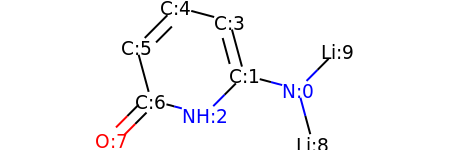

HETATM    1  N1  UNL     1       2.096  -0.288   0.000  1.00  0.00           N  
HETATM    2  C1  UNL     1       0.647   0.097   0.000  1.00  0.00           C  
HETATM    3  N2  UNL     1      -0.412  -0.966   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.255   1.545   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -1.195   1.930   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1      -2.253   0.867   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1      -1.861  -0.581   0.000  1.00  0.00           C  
HETATM    8  O1  UNL     1      -2.920  -1.644   0.000  1.00  0.00           O  
HETATM    9 LI1  UNL     1       2.488  -1.736   0.000  1.00  0.00          LI  
HETATM   10 LI2  UNL     1       3.155   0.775   0.000  1.00  0.00          LI  
CONECT    1    2    9   10
CONECT    2    3    4    4
CONECT    3    7
CONECT    4    5
CONECT    5    6    6
CONECT    6    7
CONECT    7    8    8
END

#################
#################


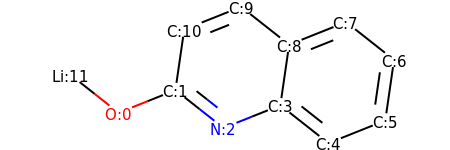

HETATM    1  O1  UNL     1      -3.295  -0.849   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.902  -0.293   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -0.724  -1.221   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.669  -0.665   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.847  -1.594   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       3.240  -1.038   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.456   0.446   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       2.278   1.375   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.884   0.819   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -0.294   1.748   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -1.687   1.192   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -4.473   0.080   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

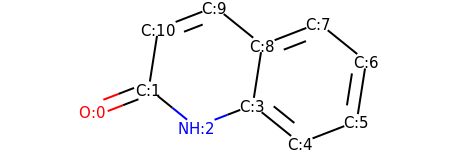

HETATM    1  O1  UNL     1      -3.711  -0.800   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -2.312  -0.259   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.144  -1.201   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1       0.255  -0.661   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       1.423  -1.603   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       2.822  -1.063   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       3.054   0.419   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.886   1.361   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       0.487   0.821   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1      -0.680   1.763   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1      -2.080   1.223   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3   11
CONECT    3    4
CONECT    4    5    5    9
CONECT    5    6
CONE

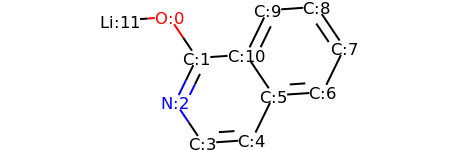

HETATM    1  O1  UNL     1      -2.170   1.477   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.332   0.233   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -1.990  -1.115   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -1.152  -2.359   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1       0.344  -2.255   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       1.003  -0.907   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       2.499  -0.803   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       3.157   0.544   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.319   1.789   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       0.823   1.685   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       0.165   0.337   0.000  1.00  0.00           C  
HETATM   12 LI1  UNL     1      -3.666   1.373   0.000  1.00  0.00          LI  
CONECT    1    2   12
CONECT

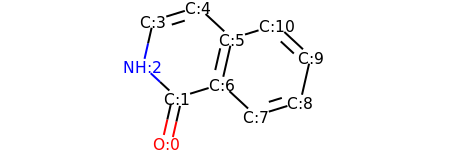

HETATM    1  O1  UNL     1      -1.758  -2.396   0.000  1.00  0.00           O  
HETATM    2  C1  UNL     1      -1.424  -0.934   0.000  1.00  0.00           C  
HETATM    3  N1  UNL     1      -2.524   0.086   0.000  1.00  0.00           N  
HETATM    4  C2  UNL     1      -2.191   1.549   0.000  1.00  0.00           C  
HETATM    5  C3  UNL     1      -0.757   1.991   0.000  1.00  0.00           C  
HETATM    6  C4  UNL     1       0.343   0.971   0.000  1.00  0.00           C  
HETATM    7  C5  UNL     1       0.009  -0.492   0.000  1.00  0.00           C  
HETATM    8  C6  UNL     1       1.109  -1.512   0.000  1.00  0.00           C  
HETATM    9  C7  UNL     1       2.542  -1.069   0.000  1.00  0.00           C  
HETATM   10  C8  UNL     1       2.876   0.393   0.000  1.00  0.00           C  
HETATM   11  C9  UNL     1       1.776   1.413   0.000  1.00  0.00           C  
CONECT    1    2    2
CONECT    2    3    7
CONECT    3    4
CONECT    4    5    5
CONECT    5    6
CONECT   

In [40]:
exp_results = pickle.load(open('../data/exp_results.pickle', 'rb'))
for name in exp_results:

    t1_smiles = exp_results[name]['t1-smiles']
    t2_smiles = exp_results[name]['t2-smiles']
    m1 = Chem.AddHs(Chem.MolFromSmiles(t1_smiles))
    m2 = Chem.AddHs(Chem.MolFromSmiles(t2_smiles))
    print('#################')
    print('#################')
    _remove_hydrogens(m1)
    _remove_hydrogens(m2)
    
    
    


In [41]:
names_in_all_testsets = []

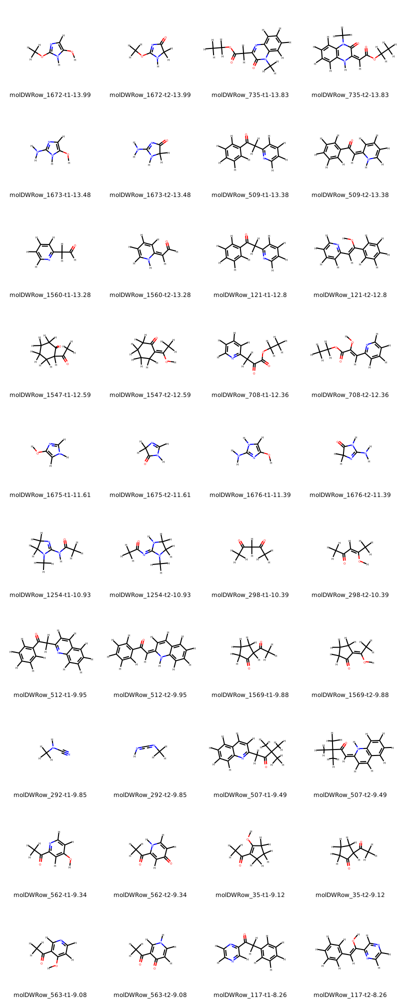

In [43]:
from_worst_to_best = []
names = list(df.names)
for i in reversed(np.argsort(absolute_error)):
    from_worst_to_best.append(i)
from rdkit.Chem import AllChem
mols = []
legends = []
for i in range(0, 20):
    idx = from_worst_to_best[i]
    exp_results = pickle.load(open('../data/exp_results.pickle', 'rb'))
    name = names[idx]
    names_in_all_testsets.append(name)
    t1_smiles = exp_results[name]['t1-smiles']
    t2_smiles = exp_results[name]['t2-smiles']
    m1 = neutromeratio.generate_rdkit_mol(t1_smiles)
    AllChem.Compute2DCoords(m1)
    m2 = neutromeratio.generate_rdkit_mol(t2_smiles)
    AllChem.Compute2DCoords(m2)
    mols.append(m1)
    legends.append(f"{name}-t1-{np.round(absolute_error[idx], 2)}")
    mols.append(m2)
    legends.append(f"{name}-t2-{np.round(absolute_error[idx], 2)}")
from rdkit.Chem import Draw
img=Draw.MolsToGridImage(mols, molsPerRow=4, legends=legends)
img

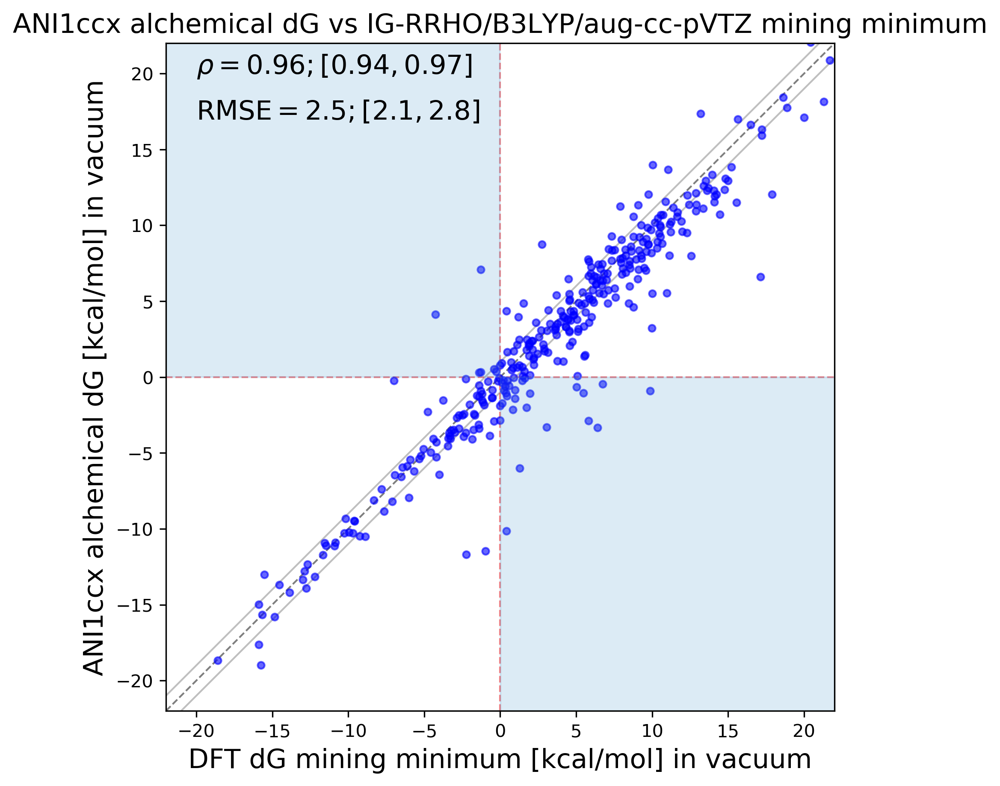

In [45]:
x_list = []
y_list = []

for a in list(results.loc['ANI1ccx_vacuum_alchemical_dG']):
    a = a *kT
    a = a.value_in_unit(unit.kilocalorie_per_mole)
    x_list.append(a)
    
for a in list(results.loc['ANI1ccx_vacuum_mining_minima_dG']):
    a = a *kT
    a = a.value_in_unit(unit.kilocalorie_per_mole)
    y_list.append(a)

absolute_error = []
for i in range(len(x_list)):
    absolute_error.append(abs(y_list[i] - x_list[i]))
    
    
df = pd.DataFrame(list(zip(list(results.columns), x_list, y_list)), columns =['names', 'x', 'y']) 
df = df.dropna(axis=0)

f = plot_correlation_analysis(df, 'ANI1ccx alchemical dG vs IG-RRHO/B3LYP/aug-cc-pVTZ mining minimum', 'ANI1ccx alchemical dG [kcal/mol] in vacuum', 'DFT dG mining minimum [kcal/mol] in vacuum', 'g', 'o')
f.savefig('/home/mwieder/fig.png')

Text(0.5, 0, 'Absolute error in kcal/mol')

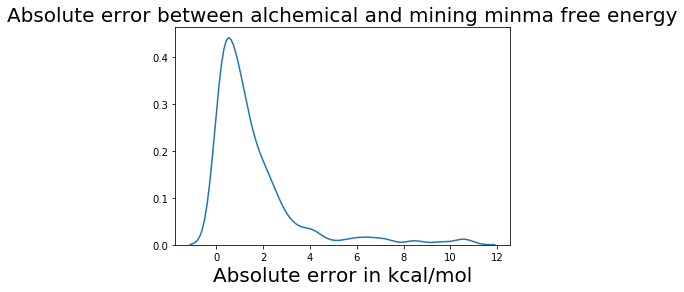

In [46]:
import seaborn as sb

absolute_error = []
x_list = []
y_list = []
for a in list(df.x):
    x_list.append(a)
    
for a in list(df.y):
    y_list.append(a)

absolute_error = []
for i in range(len(x_list)):
    absolute_error.append(abs(y_list[i] - x_list[i]))


sb.kdeplot(absolute_error)
plt.title('Absolute error between alchemical and mining minma free energy', size=20)
plt.xlabel('Absolute error in kcal/mol', size=20)

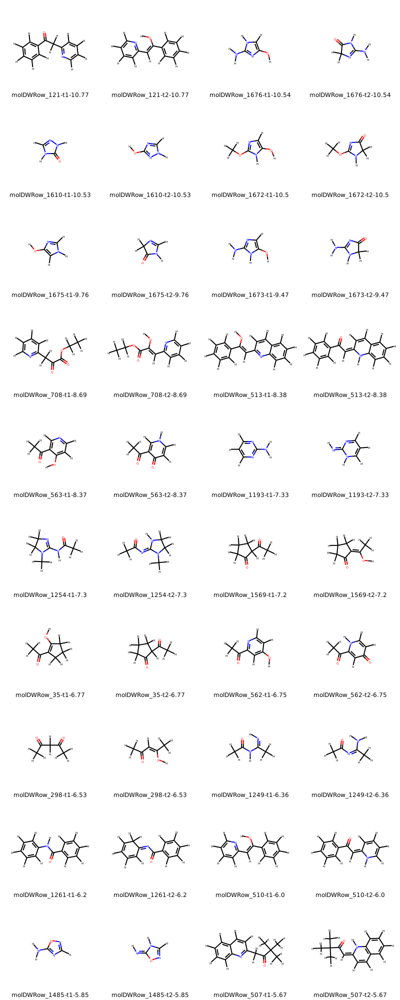

In [47]:
from_worst_to_best = []
names = list(df.names)
for i in reversed(np.argsort(absolute_error)):
    from_worst_to_best.append(i)
from rdkit.Chem import AllChem
mols = []
legends = []
for i in range(0, 20):
    idx = from_worst_to_best[i]
    exp_results = pickle.load(open('../data/exp_results.pickle', 'rb'))
    name = names[idx]
    names_in_all_testsets.append(name)
    t1_smiles = exp_results[name]['t1-smiles']
    t2_smiles = exp_results[name]['t2-smiles']
    m1 = neutromeratio.generate_rdkit_mol(t1_smiles)
    AllChem.Compute2DCoords(m1)
    m2 = neutromeratio.generate_rdkit_mol(t2_smiles)
    AllChem.Compute2DCoords(m2)
    mols.append(m1)
    legends.append(f"{name}-t1-{np.round(absolute_error[idx], 2)}")
    mols.append(m2)
    legends.append(f"{name}-t2-{np.round(absolute_error[idx], 2)}")
from rdkit.Chem import Draw
img=Draw.MolsToGridImage(mols, molsPerRow=4, legends=legends)
img

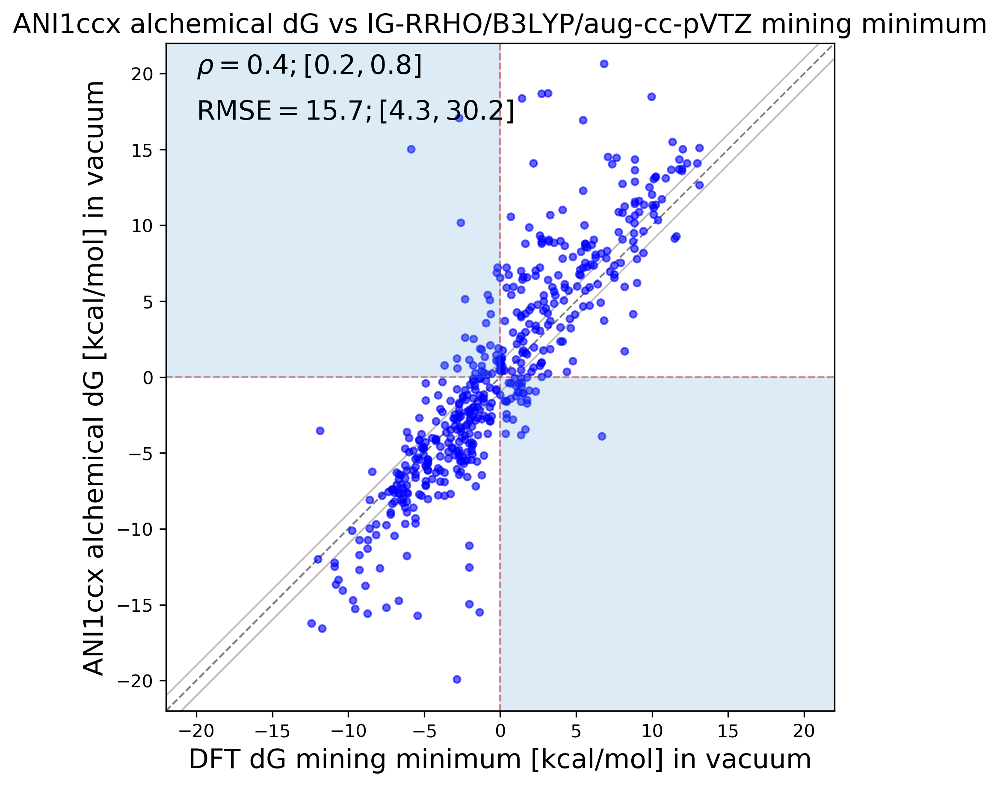

In [49]:
x_list = []
y_list = []

for a in list(results.loc['EXPERIMENT_solv']):
    a = a *kT
    a = a.value_in_unit(unit.kilocalorie_per_mole)
    x_list.append(a)
    
for a in list(results.loc['DFT_solv_mining_minima_dG']):
    a = a *kT
    a = a.value_in_unit(unit.kilocalorie_per_mole)
    y_list.append(a)

absolute_error = []
for i in range(len(x_list)):
    absolute_error.append(abs(y_list[i] - x_list[i]))
    
    
df = pd.DataFrame(list(zip(list(results.columns), x_list, y_list)), columns =['names', 'x', 'y']) 
df = df.dropna(axis=0)

f = plot_correlation_analysis(df, 'ANI1ccx alchemical dG vs IG-RRHO/B3LYP/aug-cc-pVTZ mining minimum', 'ANI1ccx alchemical dG [kcal/mol] in vacuum', 'DFT dG mining minimum [kcal/mol] in vacuum', 'g', 'o')
f.savefig('/home/mwieder/fig.png')

Text(0.5, 0, 'Absolute error in kcal/mol')

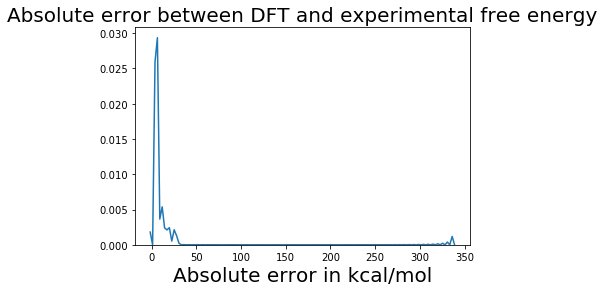

In [52]:
import seaborn as sb

absolute_error = []
x_list = []
y_list = []
for a in list(df.x):
    x_list.append(a)
    
for a in list(df.y):
    y_list.append(a)

absolute_error = []
for i in range(len(x_list)):
    absolute_error.append(abs(y_list[i] - x_list[i]))


sb.kdeplot(absolute_error)
plt.title('Absolute error between DFT and experimental free energy', size=20)
plt.xlabel('Absolute error in kcal/mol', size=20)

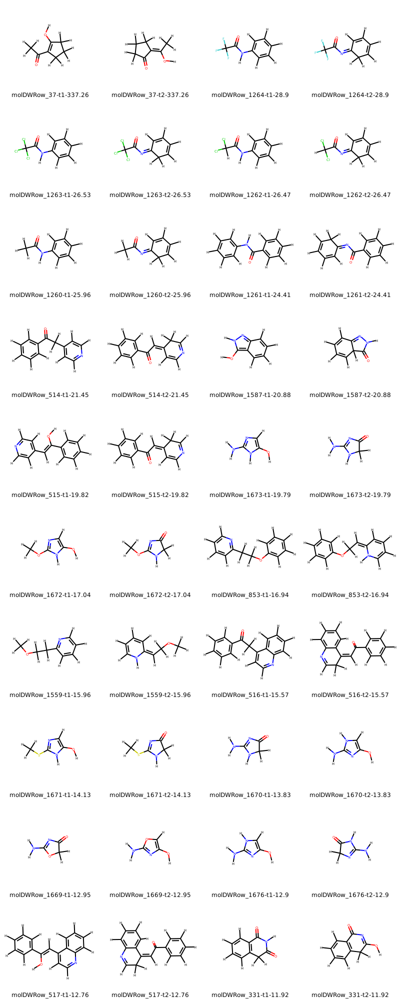

In [51]:
from_worst_to_best = []
names = list(df.names)
for i in reversed(np.argsort(absolute_error)):
    from_worst_to_best.append(i)
from rdkit.Chem import AllChem
mols = []
legends = []
for i in range(0, 20):
    idx = from_worst_to_best[i]
    exp_results = pickle.load(open('../data/exp_results.pickle', 'rb'))
    name = names[idx]
    names_in_all_testsets.append(name)
    t1_smiles = exp_results[name]['t1-smiles']
    t2_smiles = exp_results[name]['t2-smiles']
    m1 = neutromeratio.generate_rdkit_mol(t1_smiles)
    AllChem.Compute2DCoords(m1)
    m2 = neutromeratio.generate_rdkit_mol(t2_smiles)
    AllChem.Compute2DCoords(m2)
    mols.append(m1)
    legends.append(f"{name}-t1-{np.round(absolute_error[idx], 2)}")
    mols.append(m2)
    legends.append(f"{name}-t2-{np.round(absolute_error[idx], 2)}")
from rdkit.Chem import Draw
img=Draw.MolsToGridImage(mols, molsPerRow=4, legends=legends)
img

In [67]:
from collections import Counter
c = Counter(names_in_all_testsets)

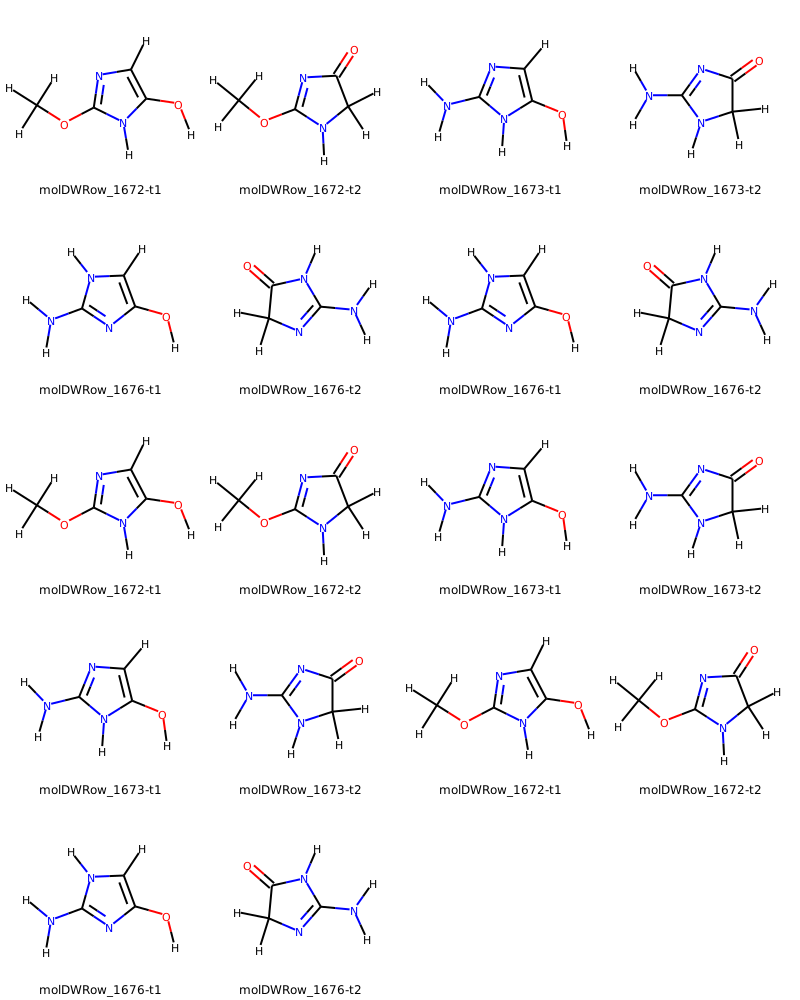

In [72]:
mols = []
legends = []
for name in names_in_all_testsets:
    if c[name] > 2:
        t1_smiles = exp_results[name]['t1-smiles']
        t2_smiles = exp_results[name]['t2-smiles']
        m1 = neutromeratio.generate_rdkit_mol(t1_smiles)
        AllChem.Compute2DCoords(m1)
        m2 = neutromeratio.generate_rdkit_mol(t2_smiles)
        AllChem.Compute2DCoords(m2)
        mols.append(m1)
        legends.append(f"{name}-t1")
        mols.append(m2)
        legends.append(f"{name}-t2")
from rdkit.Chem import Draw
img=Draw.MolsToGridImage(mols, molsPerRow=4, legends=legends)
img

In [59]:
counter['molDWRow_1672']

3

In [ ]:
x_list = []
y_list = []

for a in list(results['experimental_values [kT]']):
    a = a *kT
    a = a.value_in_unit(unit.kilocalorie_per_mole)
    x_list.append(a)
    
for a in list(results['free energy difference in vacuum using the Mining Minima approach with ANI1-ccx [kT]']):
    a = a *kT
    a = a.value_in_unit(unit.kilocalorie_per_mole)
    y_list.append(a)

df = pd.DataFrame(list(zip(list(results.names), x_list, y_list, ['ANI1ccx']*len(results.names))), columns =['names', 'x', 'y', 'method']) 
f = plot_correlation_analysis(df, 'dG vs dE', 'experimental value [kcal/mol]', 'dG mining minima [kcal/mol]', 'g', 'o')


In [ ]:
x_list = []
y_list = []

for a in list(results['free energy difference in vacuum with B3LYP/aug-cc-pVTZ (difference between minimum conformations) [kT]']):
    a = a *kT
    a = a.value_in_unit(unit.kilocalorie_per_mole)
    x_list.append(a)
    
for a in list(results['free energy difference in vacuum using the Mining Minima approach with ANI1-ccx [kT]']):
    a = a *kT
    a = a.value_in_unit(unit.kilocalorie_per_mole)
    y_list.append(a)

df = pd.DataFrame(list(zip(list(results.names), x_list, y_list, ['ANI1ccx']*len(results.names))), columns =['names', 'x', 'y', 'method']) 
f = plot_correlation_analysis(df, 'dG vs dE', 'experimental value [kcal/mol]', 'dG mining minima [kcal/mol]', 'g', 'o')


In [ ]:
results = pickle.load(open('../data/exp_results.pickle', 'rb'))
for name in results:
    print(name)
    print(results[name])
    if results[name]['name'] == 'molDWRowNr107':
        print(name)
        print(results[name])